<a href="https://colab.research.google.com/github/Oktaviani30/DeepLearningLanjut/blob/main/Model_DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [3]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 99% 0.99G/1.00G [00:17<00:00, 66.1MB/s]
100% 1.00G/1.00G [00:17<00:00, 60.7MB/s]
Dataset downloaded and extracted to /content/dataset/


In [4]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6479 files.


In [5]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [6]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [7]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - d_loss: 0.4953 - g_loss: 0.7410

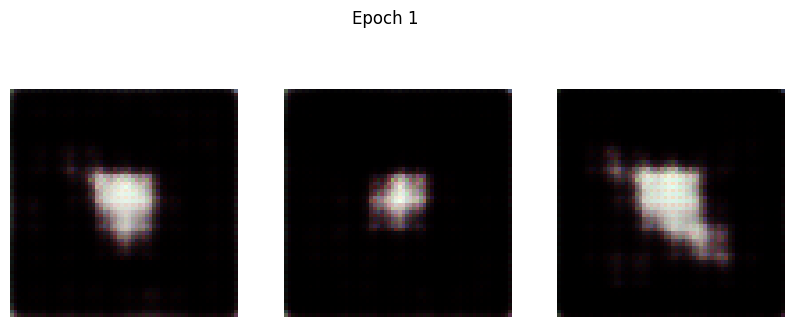

102/102 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - d_loss: 0.4959 - g_loss: 0.7414
Epoch 2/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: 0.6664 - g_loss: 0.7371

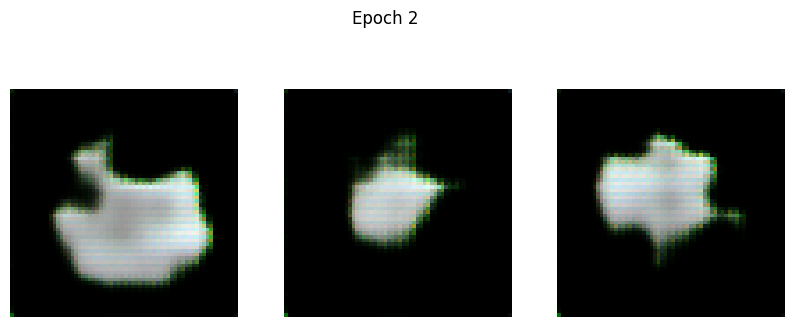

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: 0.6666 - g_loss: 0.7370
Epoch 3/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6813 - g_loss: 0.6922

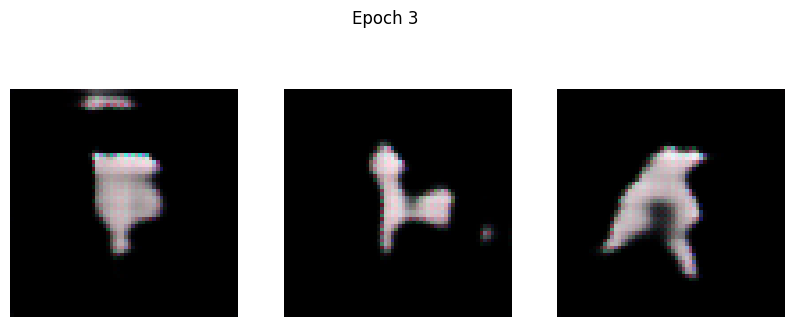

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: 0.6812 - g_loss: 0.6922
Epoch 4/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.6683 - g_loss: 0.7242

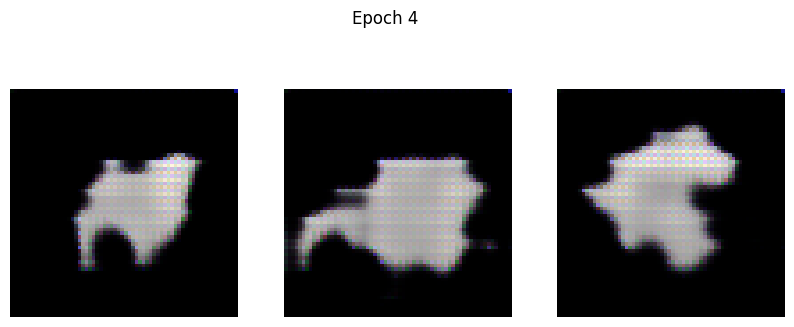

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.6684 - g_loss: 0.7242
Epoch 5/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6615 - g_loss: 0.7572

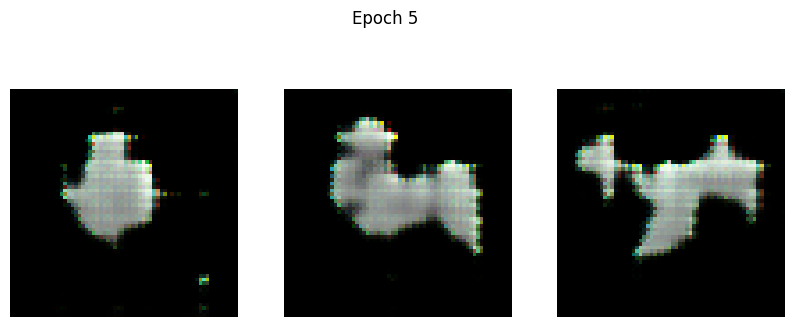

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6616 - g_loss: 0.7571
Epoch 6/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6613 - g_loss: 0.7628

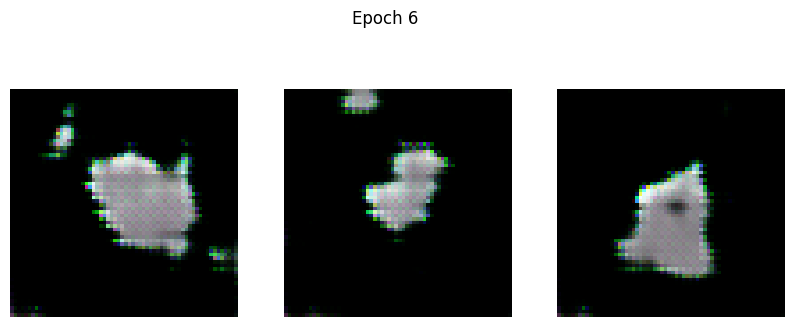

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.6613 - g_loss: 0.7629
Epoch 7/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6596 - g_loss: 0.7708

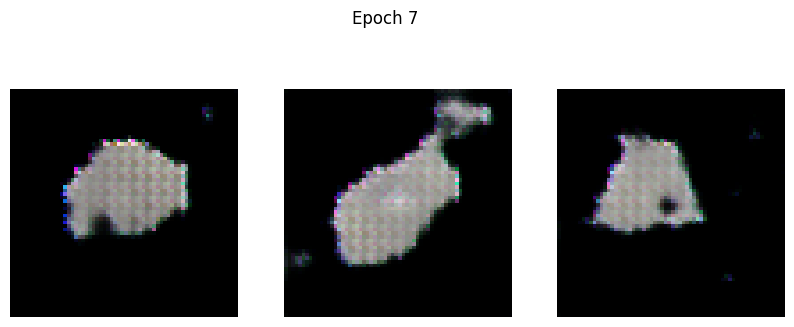

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6596 - g_loss: 0.7710
Epoch 8/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6441 - g_loss: 0.7678

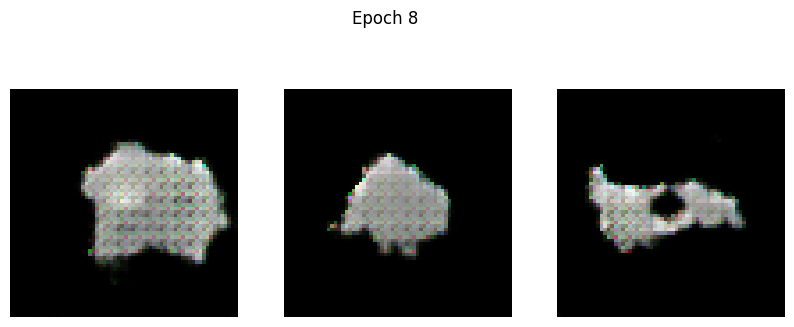

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6441 - g_loss: 0.7678
Epoch 9/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6641 - g_loss: 0.7810

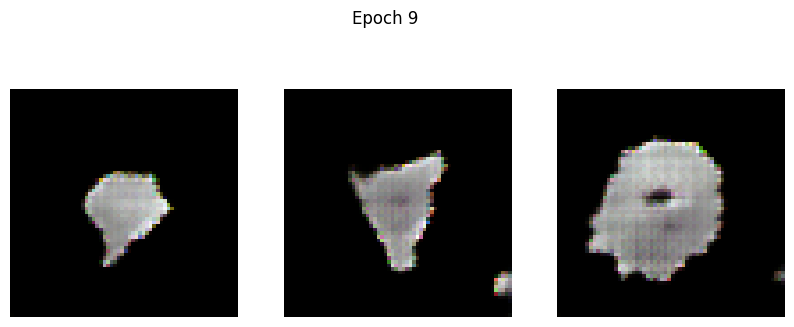

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6640 - g_loss: 0.7810
Epoch 10/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6582 - g_loss: 0.7443

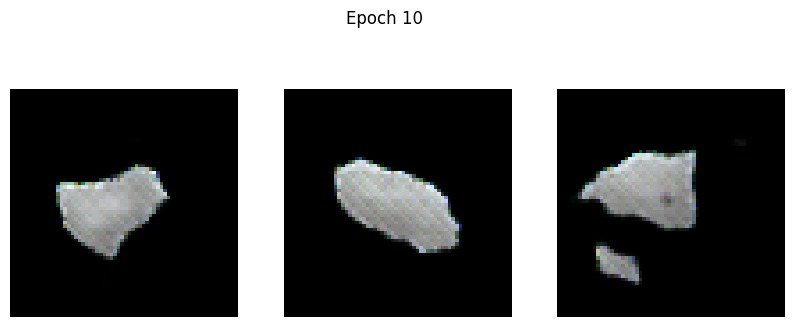

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6582 - g_loss: 0.7443
Epoch 11/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6643 - g_loss: 0.7334

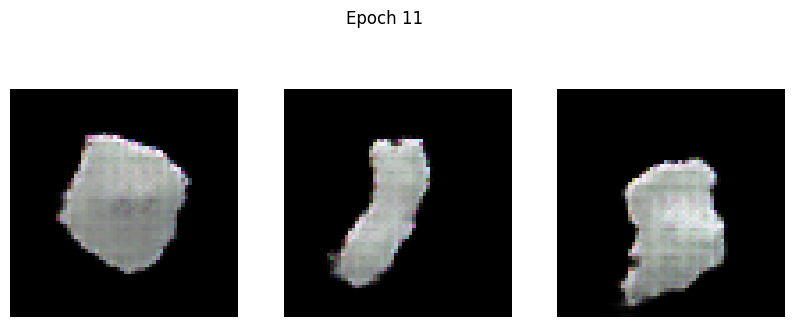

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6642 - g_loss: 0.7334
Epoch 12/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6518 - g_loss: 0.7770

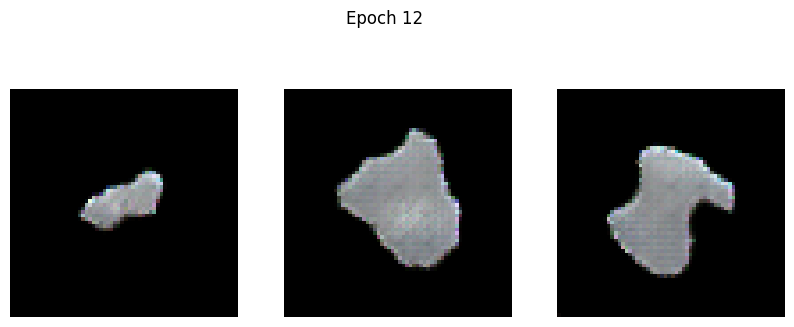

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6518 - g_loss: 0.7770
Epoch 13/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6465 - g_loss: 0.7941

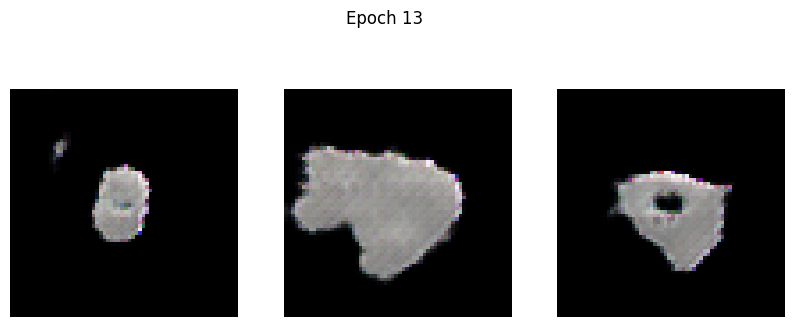

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6465 - g_loss: 0.7943
Epoch 14/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6319 - g_loss: 0.8278

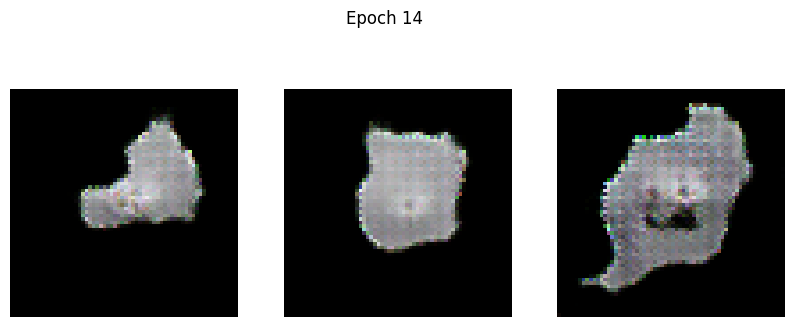

102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - d_loss: 0.6320 - g_loss: 0.8278
Epoch 15/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6249 - g_loss: 0.8655

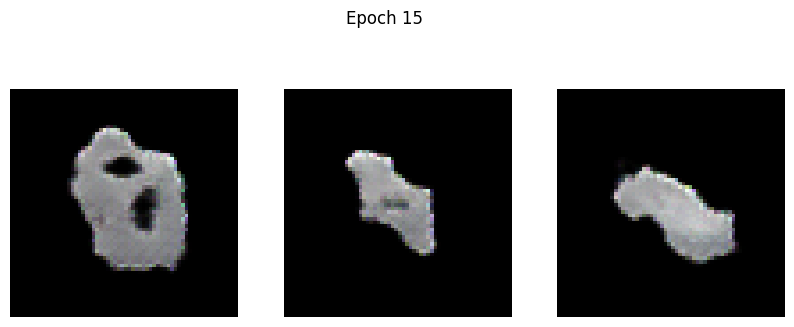

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6249 - g_loss: 0.8656
Epoch 16/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6027 - g_loss: 0.8660

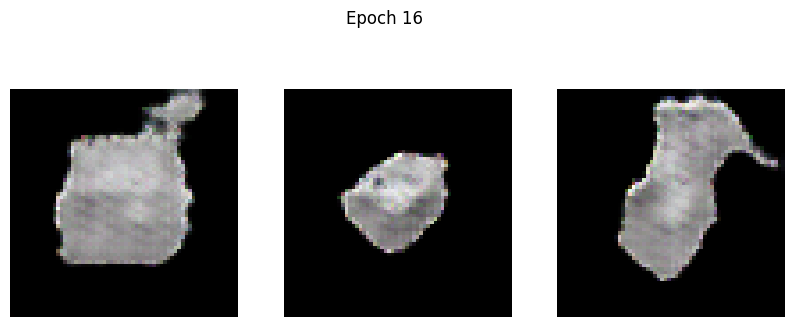

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 0.6028 - g_loss: 0.8661
Epoch 17/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6014 - g_loss: 0.9028

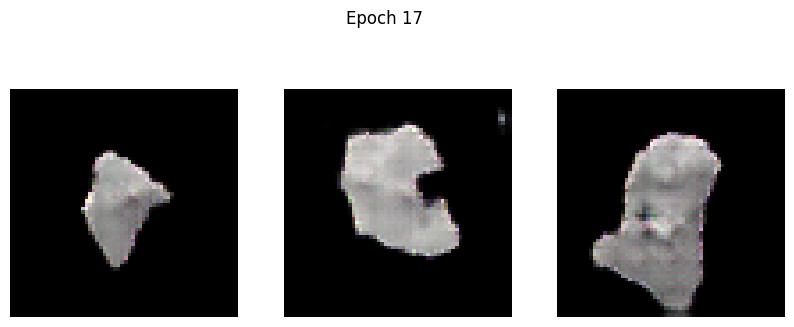

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6014 - g_loss: 0.9029
Epoch 18/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5827 - g_loss: 0.8962

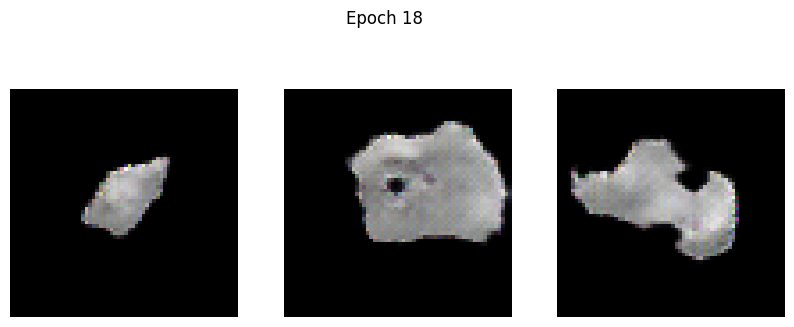

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.5827 - g_loss: 0.8964
Epoch 19/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.5791 - g_loss: 0.9214

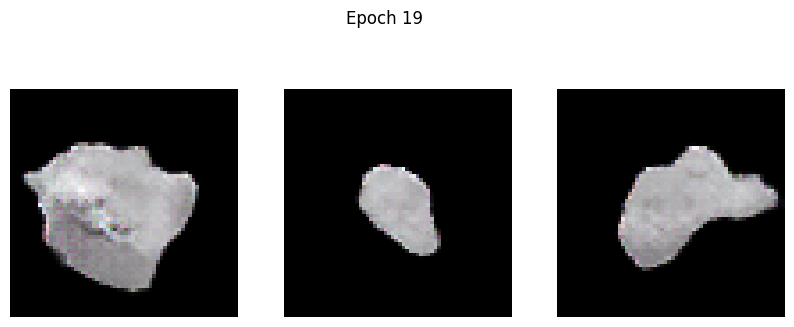

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.5791 - g_loss: 0.9214
Epoch 20/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.5771 - g_loss: 0.9737

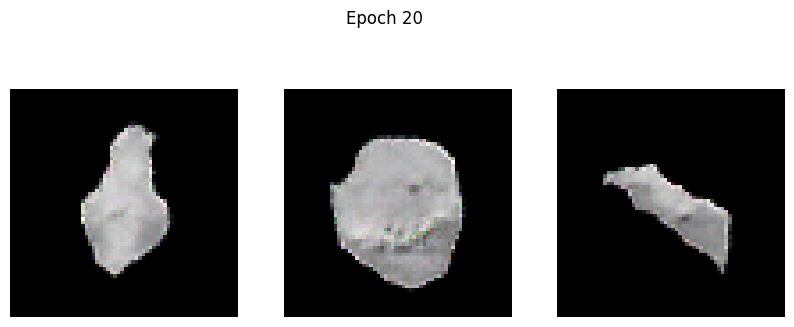

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.5771 - g_loss: 0.9736
Epoch 21/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5550 - g_loss: 0.9864

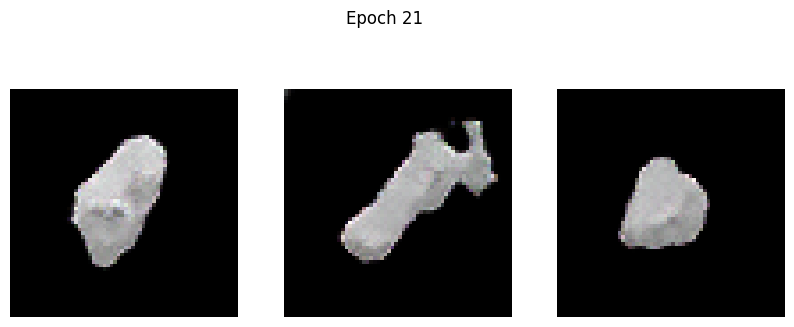

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5550 - g_loss: 0.9865
Epoch 22/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5459 - g_loss: 1.0006

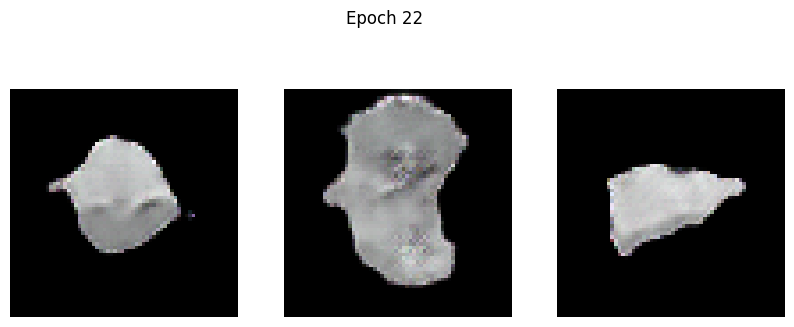

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5459 - g_loss: 1.0006
Epoch 23/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5243 - g_loss: 1.0238

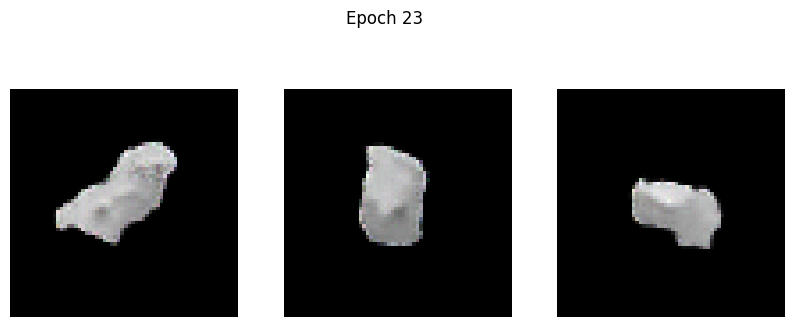

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5243 - g_loss: 1.0239
Epoch 24/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5176 - g_loss: 1.0686

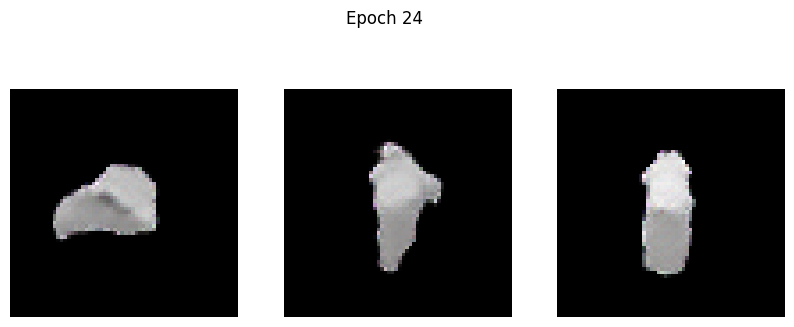

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5175 - g_loss: 1.0687
Epoch 25/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5367 - g_loss: 1.1822

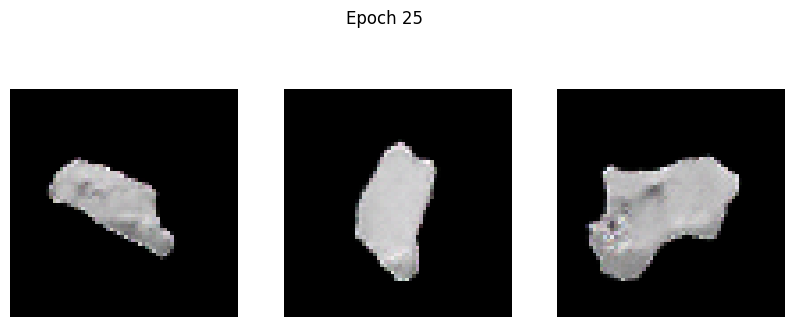

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5367 - g_loss: 1.1820
Epoch 26/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4892 - g_loss: 1.1096

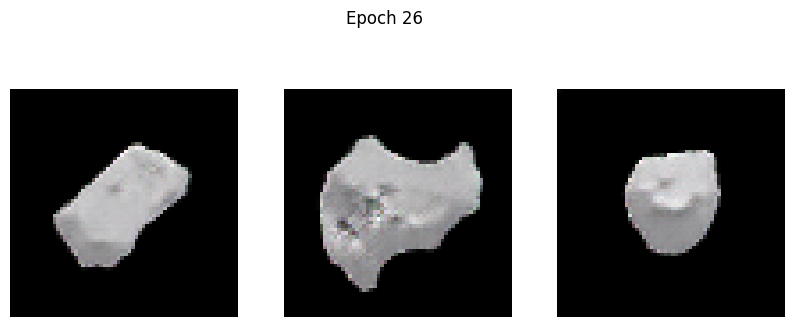

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4892 - g_loss: 1.1099
Epoch 27/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4862 - g_loss: 1.1895

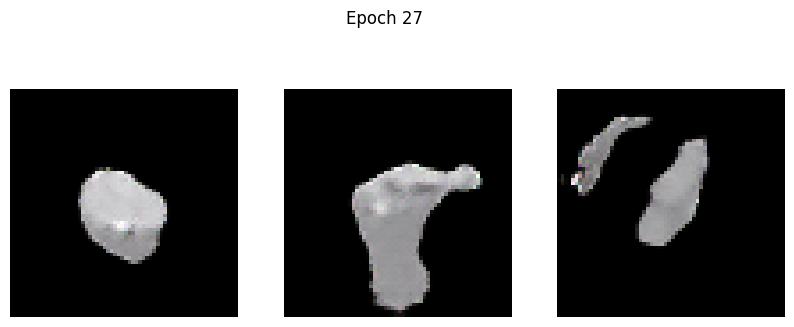

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4862 - g_loss: 1.1894
Epoch 28/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4674 - g_loss: 1.2383

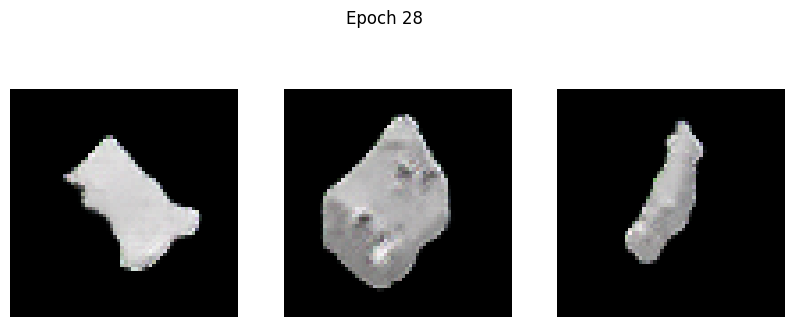

102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - d_loss: 0.4674 - g_loss: 1.2382
Epoch 29/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4666 - g_loss: 1.2846

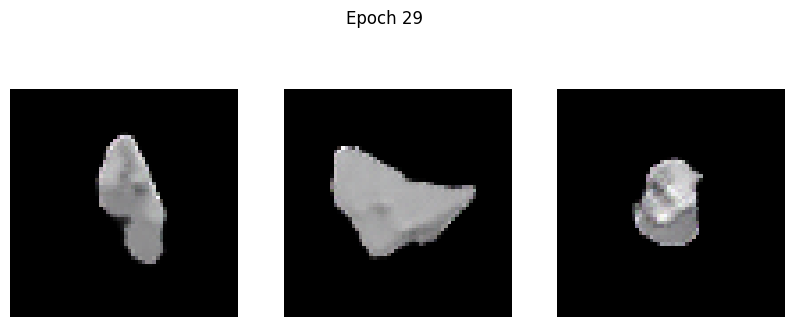

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4666 - g_loss: 1.2847
Epoch 30/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.4451 - g_loss: 1.3022

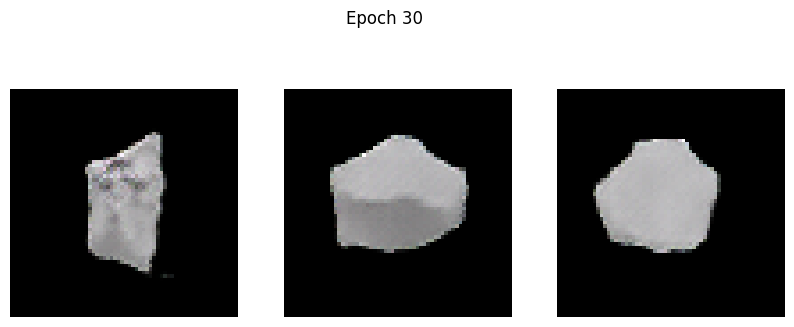

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 0.4450 - g_loss: 1.3024
Epoch 31/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4314 - g_loss: 1.3726

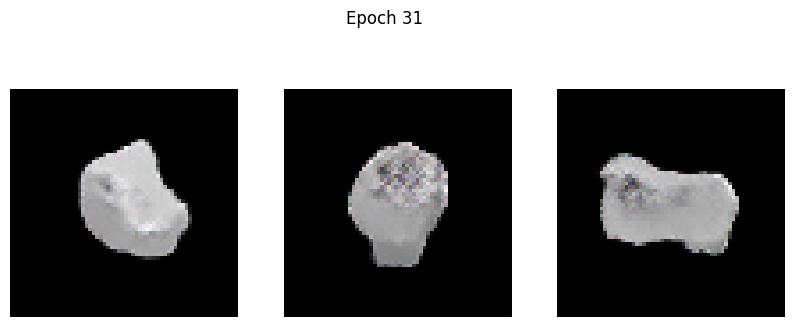

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.4316 - g_loss: 1.3726
Epoch 32/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4141 - g_loss: 1.3581

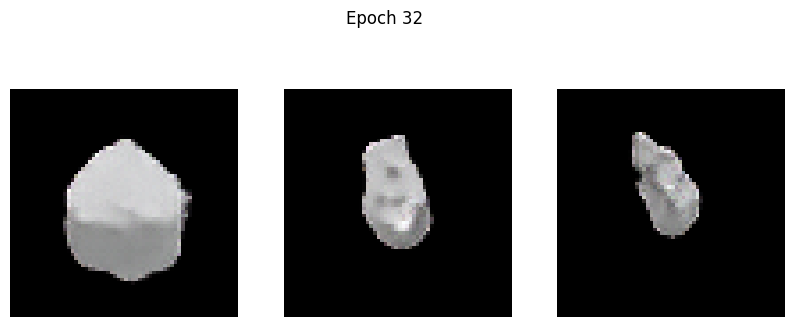

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4142 - g_loss: 1.3580
Epoch 33/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4038 - g_loss: 1.3963

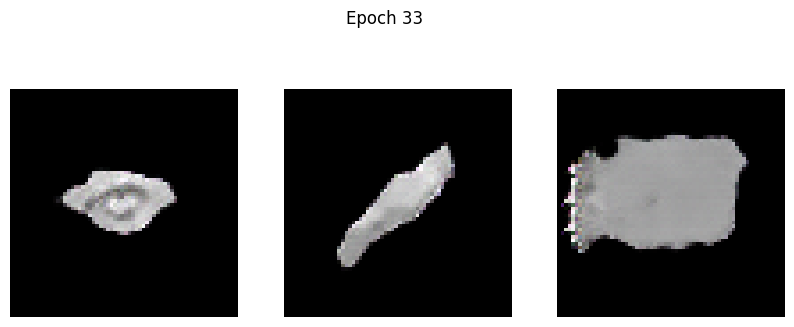

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4038 - g_loss: 1.3965
Epoch 34/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3990 - g_loss: 1.4548

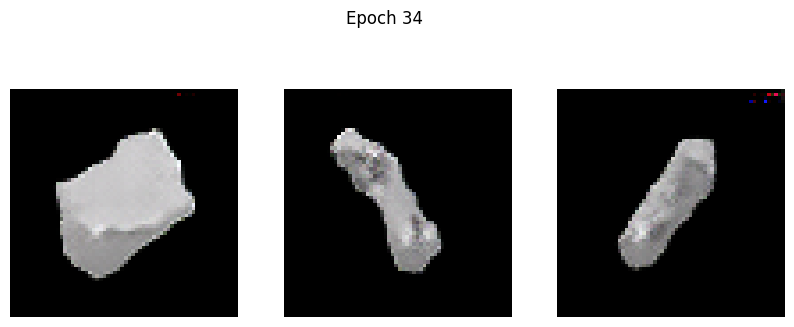

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3991 - g_loss: 1.4549
Epoch 35/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4302 - g_loss: 1.4748

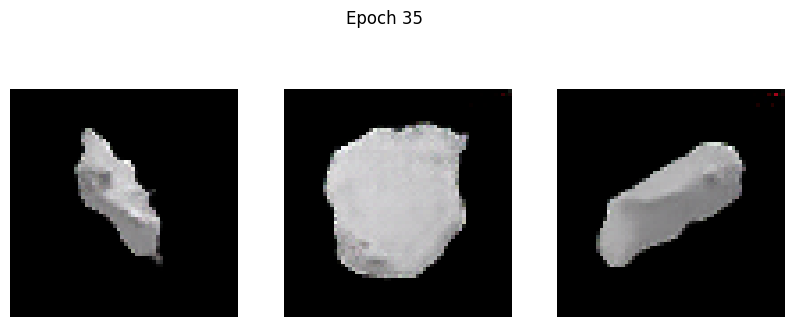

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4300 - g_loss: 1.4749
Epoch 36/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3744 - g_loss: 1.4548

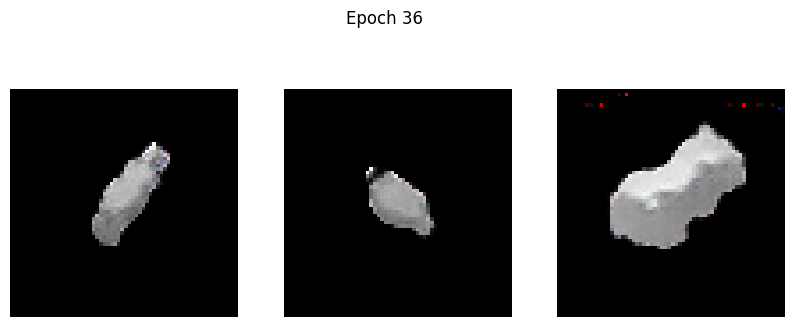

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3745 - g_loss: 1.4552
Epoch 37/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4077 - g_loss: 1.5352

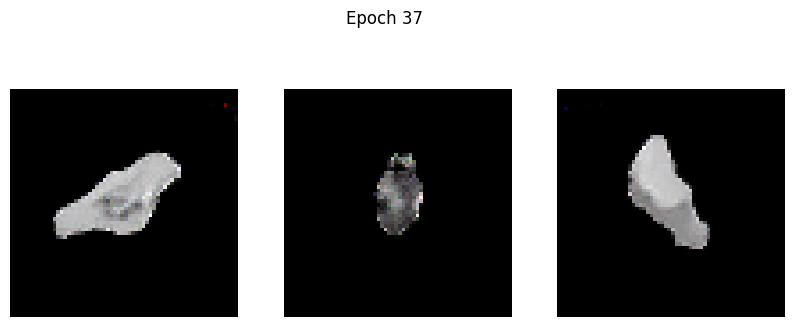

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4078 - g_loss: 1.5350
Epoch 38/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3786 - g_loss: 1.5137

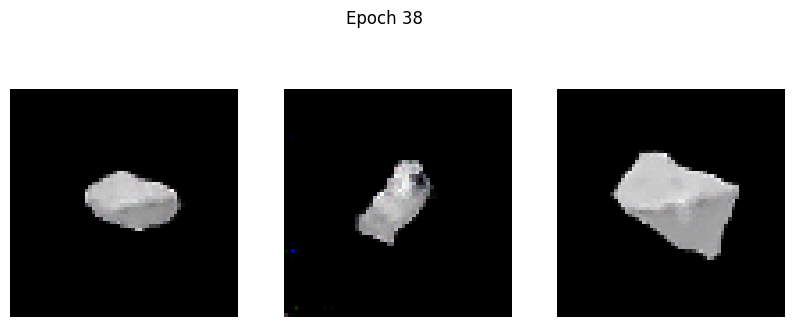

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3789 - g_loss: 1.5139
Epoch 39/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3684 - g_loss: 1.5217

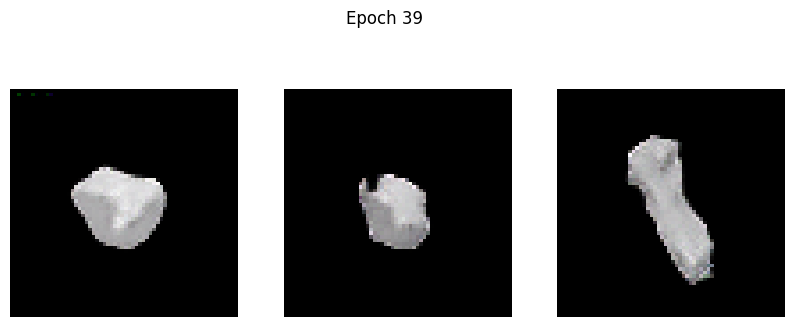

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3687 - g_loss: 1.5221
Epoch 40/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3559 - g_loss: 1.5362

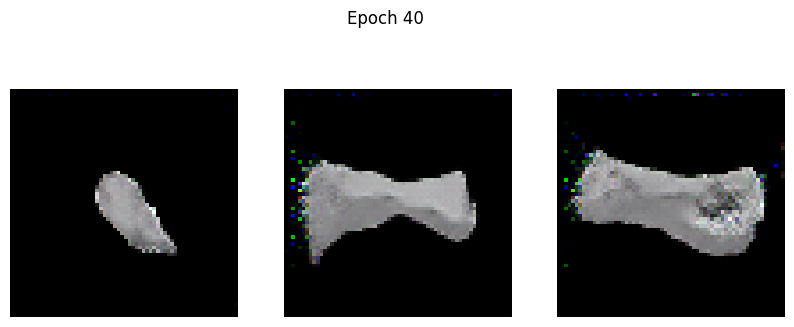

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3560 - g_loss: 1.5364
Epoch 41/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3692 - g_loss: 1.5882

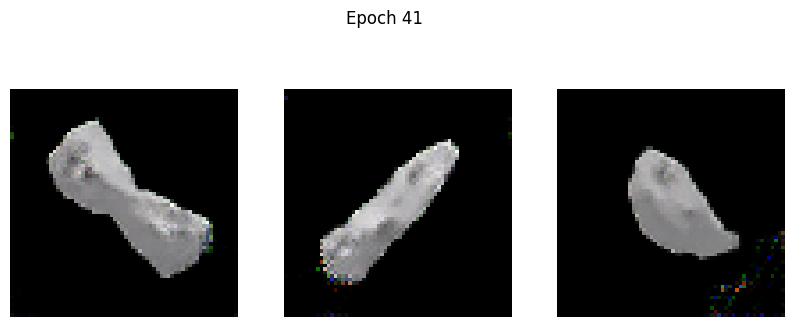

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3694 - g_loss: 1.5887
Epoch 42/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3528 - g_loss: 1.5710

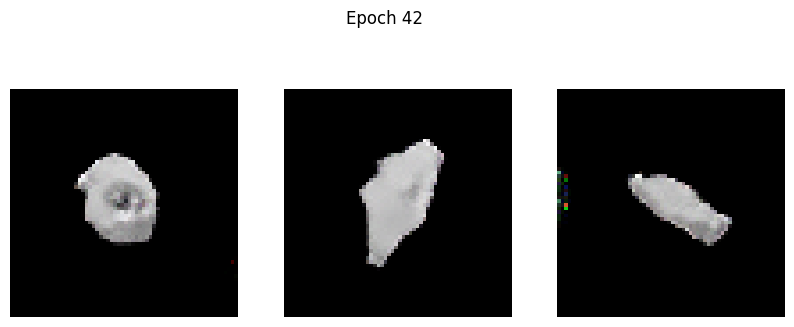

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3528 - g_loss: 1.5712
Epoch 43/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3605 - g_loss: 1.6693

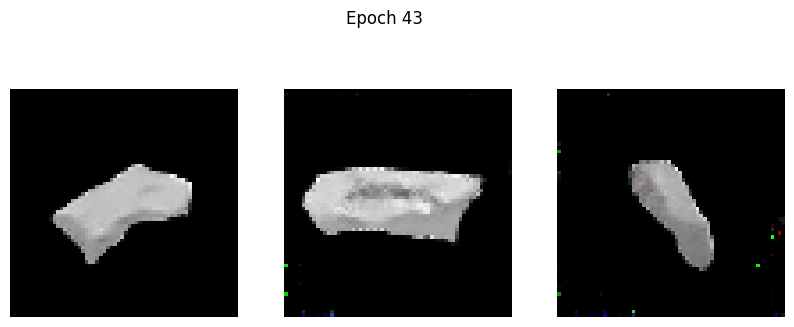

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3608 - g_loss: 1.6694
Epoch 44/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3356 - g_loss: 1.5701

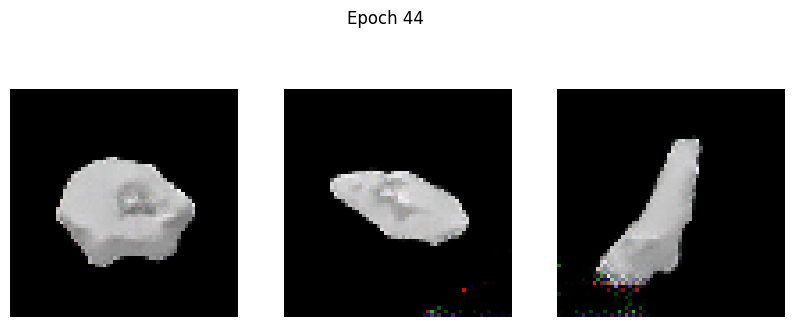

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3356 - g_loss: 1.5707
Epoch 45/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3783 - g_loss: 1.6984

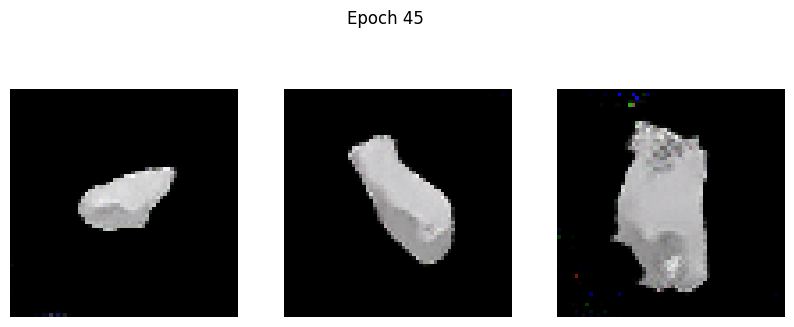

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3783 - g_loss: 1.6983
Epoch 46/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3336 - g_loss: 1.7093

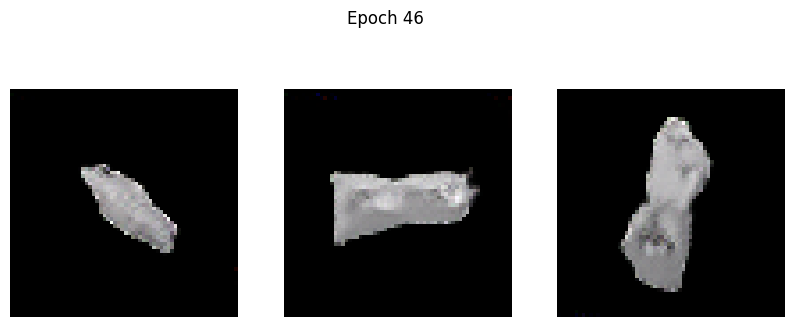

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3336 - g_loss: 1.7091
Epoch 47/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3330 - g_loss: 1.7069

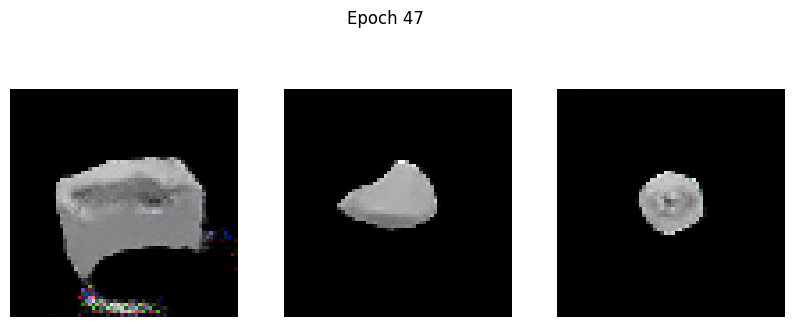

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3331 - g_loss: 1.7073
Epoch 48/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3953 - g_loss: 1.7489

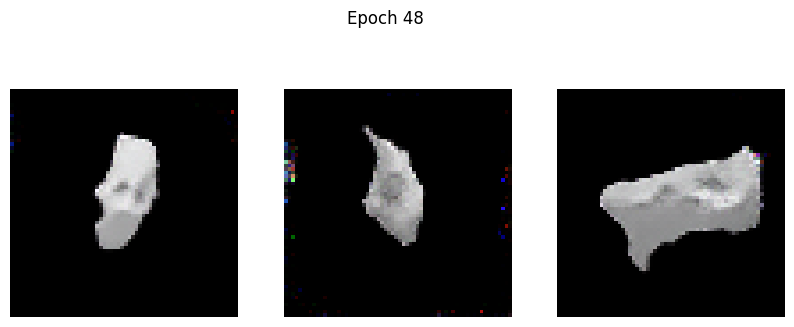

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3948 - g_loss: 1.7488
Epoch 49/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3233 - g_loss: 1.7471

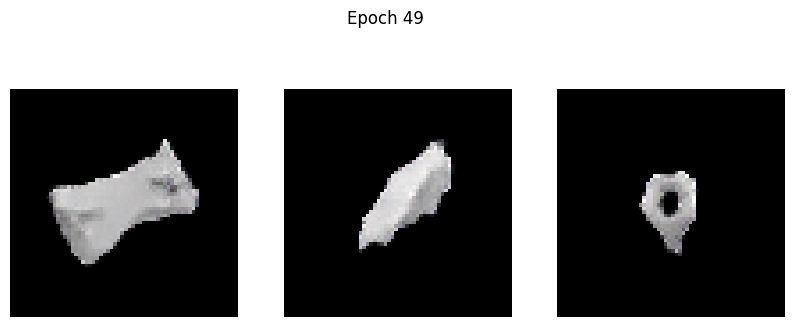

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3237 - g_loss: 1.7477
Epoch 50/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3046 - g_loss: 1.7468

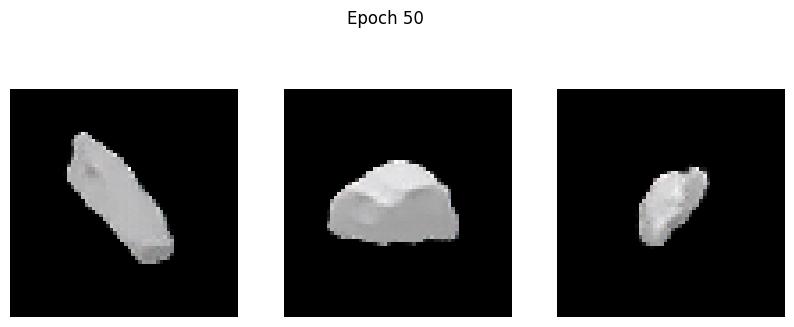

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3046 - g_loss: 1.7470
Epoch 51/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3539 - g_loss: 1.8886

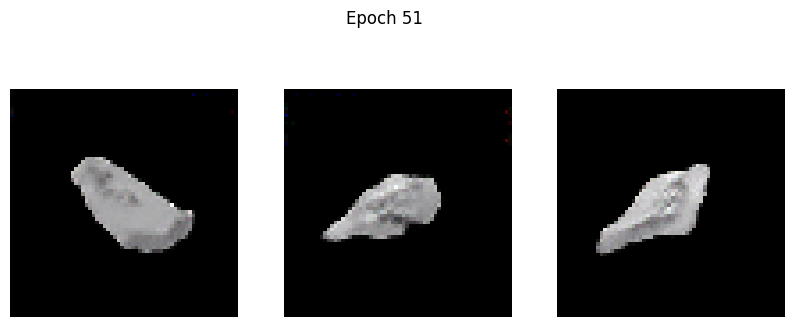

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3537 - g_loss: 1.8881
Epoch 52/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3705 - g_loss: 1.8737

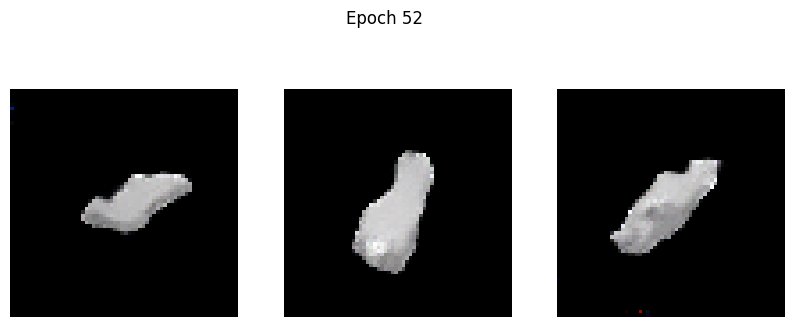

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3705 - g_loss: 1.8734
Epoch 53/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3161 - g_loss: 1.8100

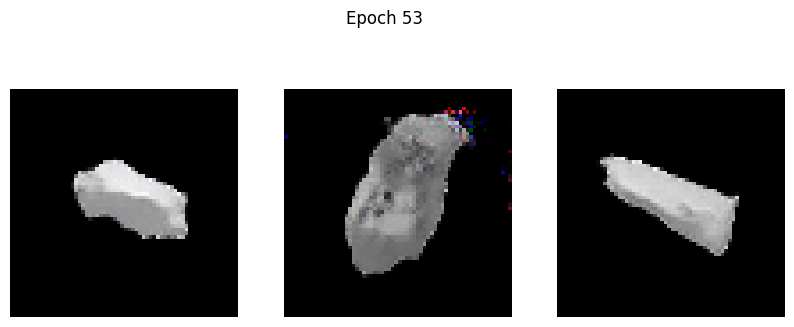

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3165 - g_loss: 1.8103
Epoch 54/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2811 - g_loss: 1.7828

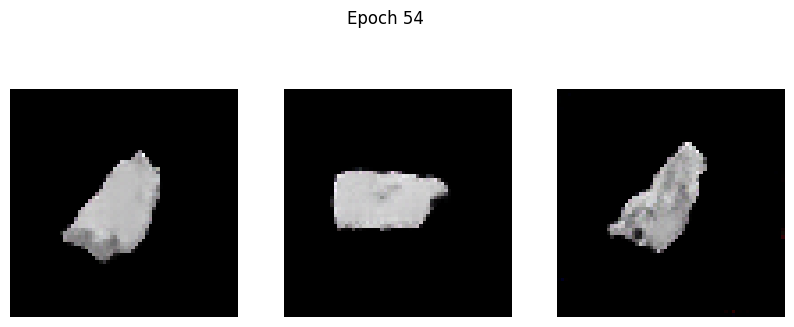

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2812 - g_loss: 1.7830
Epoch 55/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2933 - g_loss: 1.9057

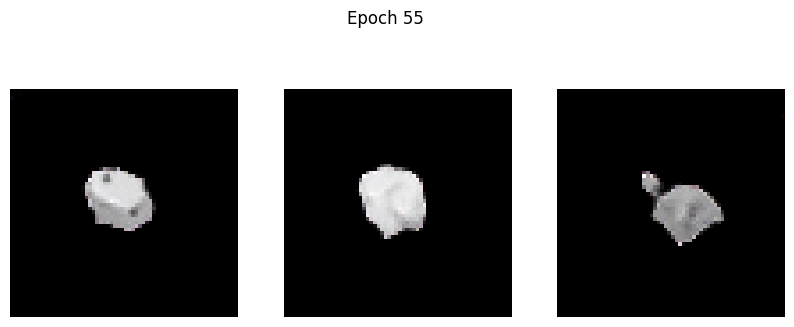

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2934 - g_loss: 1.9059
Epoch 56/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3199 - g_loss: 1.8404

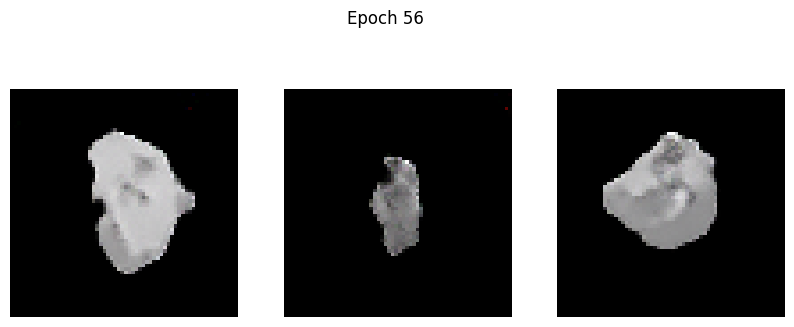

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3199 - g_loss: 1.8407
Epoch 57/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2907 - g_loss: 1.9261

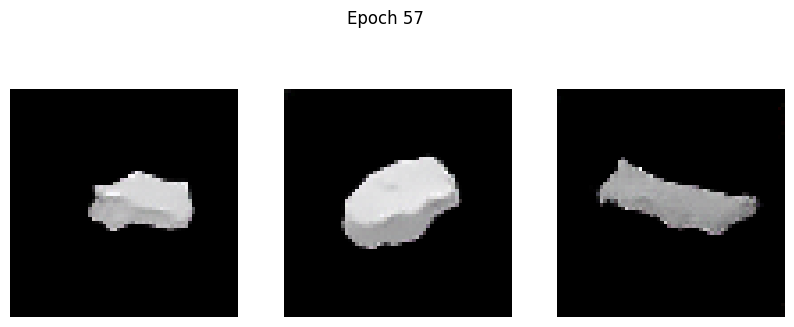

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2906 - g_loss: 1.9259
Epoch 58/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3456 - g_loss: 1.9868

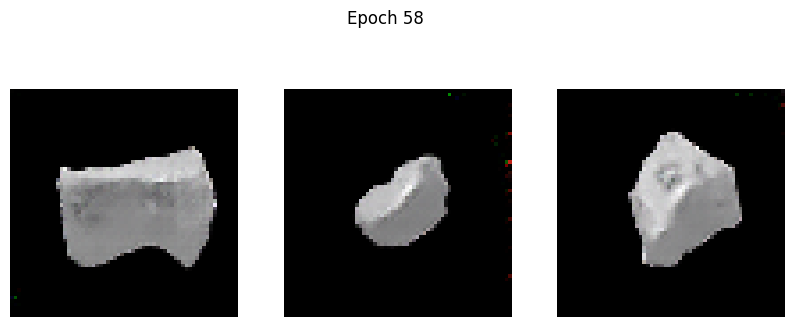

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3454 - g_loss: 1.9866
Epoch 59/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2999 - g_loss: 2.0005

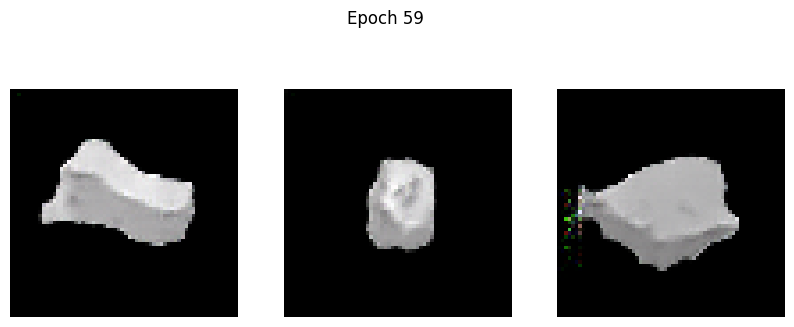

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2999 - g_loss: 2.0003
Epoch 60/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3374 - g_loss: 1.9744

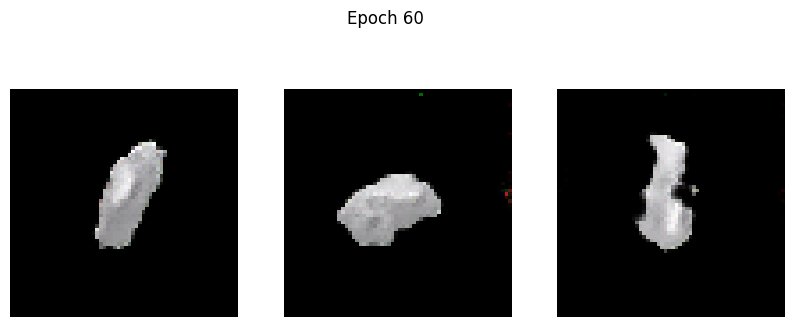

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3375 - g_loss: 1.9741
Epoch 61/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2555 - g_loss: 1.9469

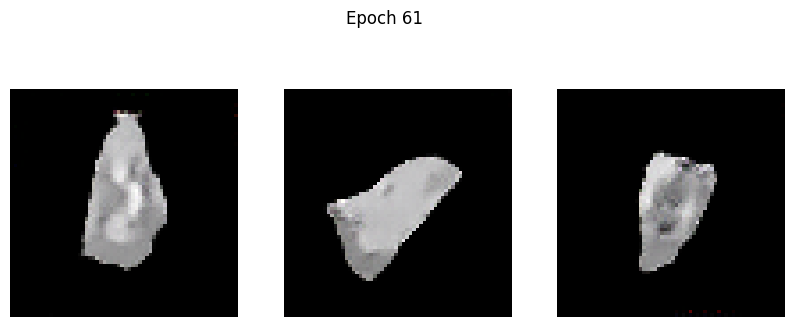

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2556 - g_loss: 1.9473
Epoch 62/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3122 - g_loss: 2.0695

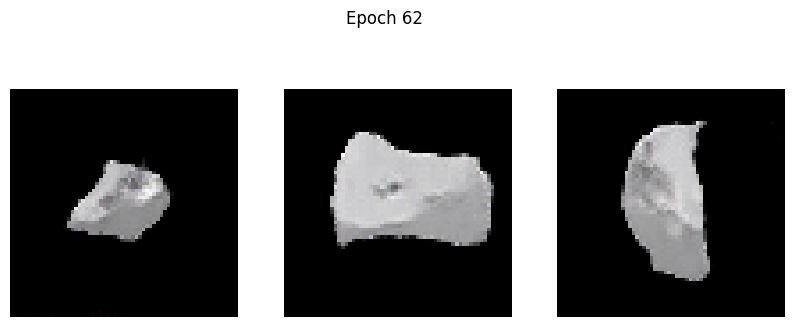

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3131 - g_loss: 2.0706
Epoch 63/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2514 - g_loss: 1.8818

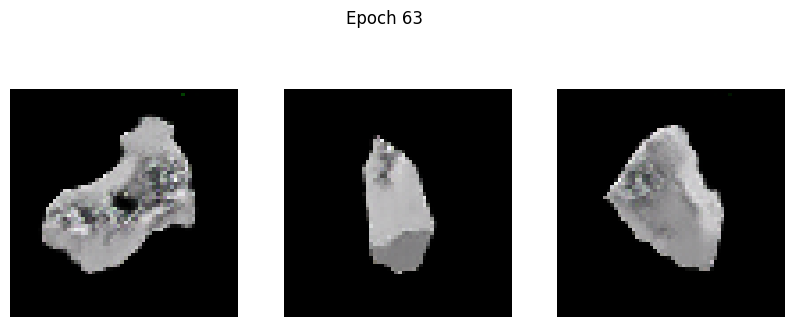

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2514 - g_loss: 1.8818
Epoch 64/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2646 - g_loss: 1.9651

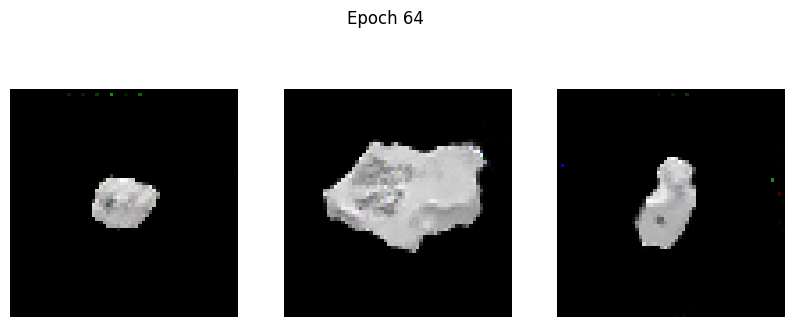

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2644 - g_loss: 1.9650
Epoch 65/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2649 - g_loss: 2.0596

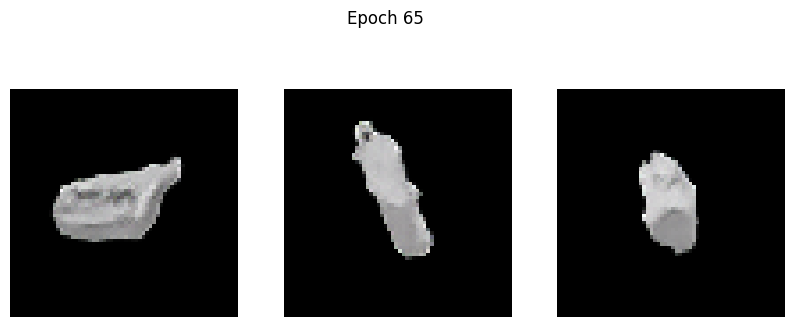

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2653 - g_loss: 2.0596
Epoch 66/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2745 - g_loss: 2.0753

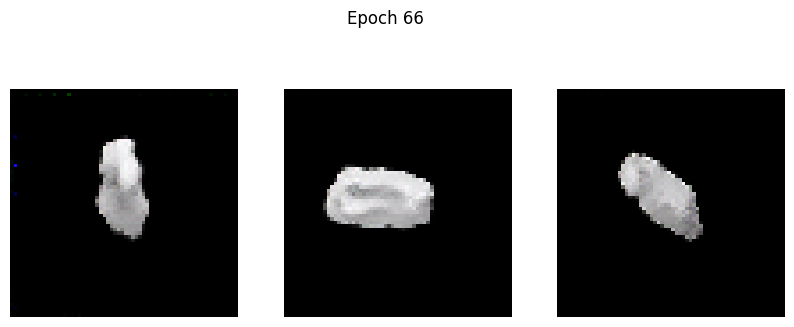

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2742 - g_loss: 2.0748
Epoch 67/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3130 - g_loss: 2.2132

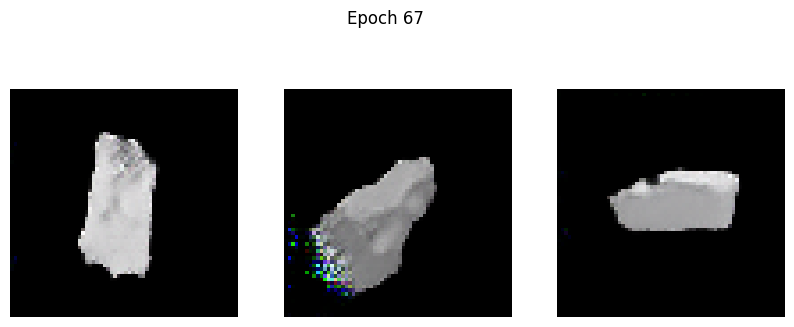

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3128 - g_loss: 2.2124
Epoch 68/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2352 - g_loss: 2.0997

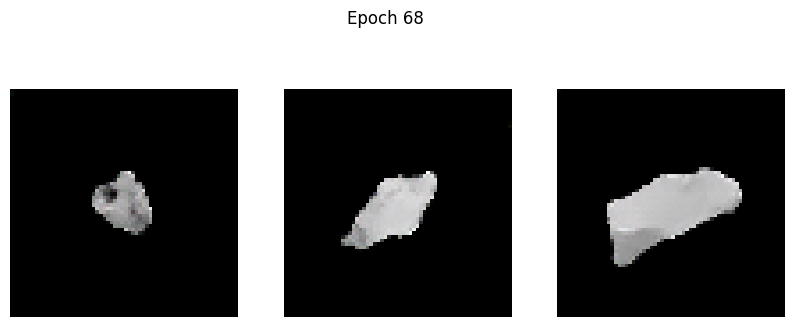

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.2354 - g_loss: 2.0995
Epoch 69/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2699 - g_loss: 2.1092

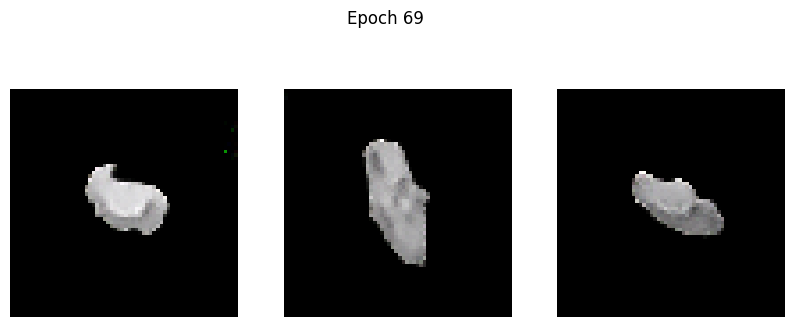

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2699 - g_loss: 2.1091
Epoch 70/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3377 - g_loss: 2.1586

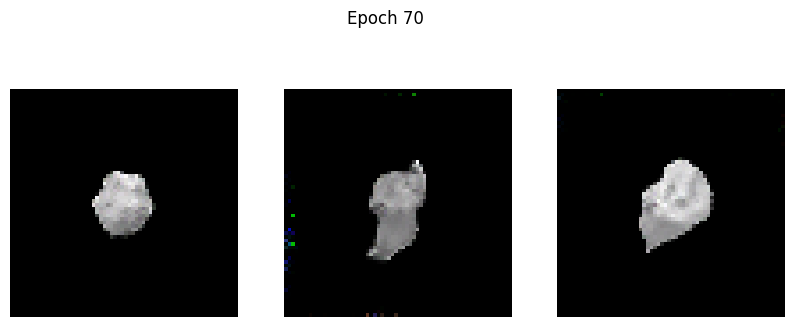

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3372 - g_loss: 2.1581
Epoch 71/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2287 - g_loss: 2.0978

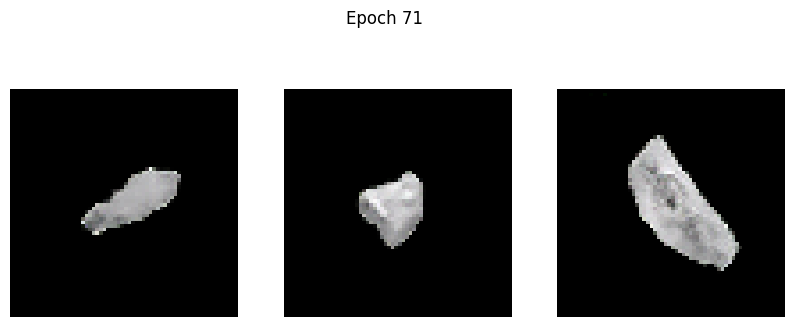

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2286 - g_loss: 2.0982
Epoch 72/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2994 - g_loss: 2.2057

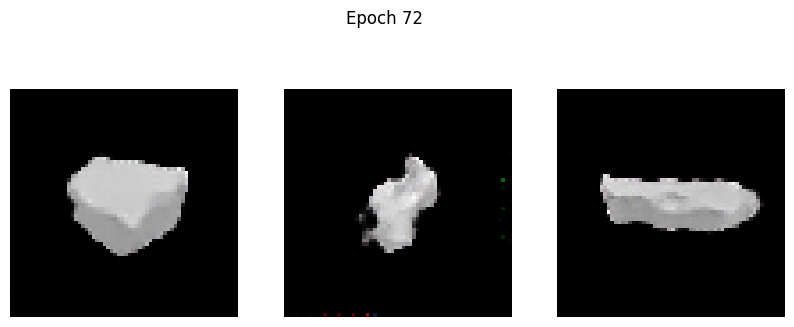

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2989 - g_loss: 2.2052
Epoch 73/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3255 - g_loss: 2.3634

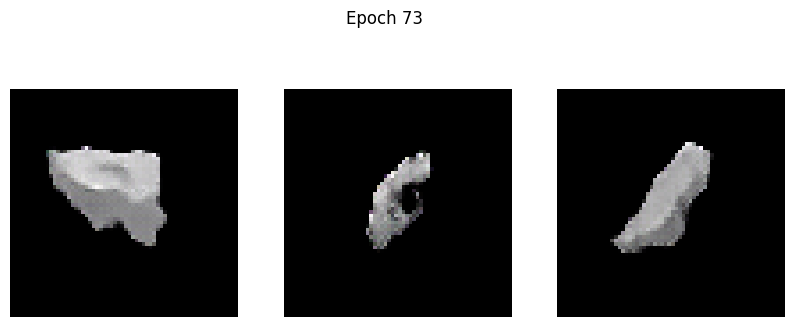

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3284 - g_loss: 2.3652
Epoch 74/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3150 - g_loss: 1.8016

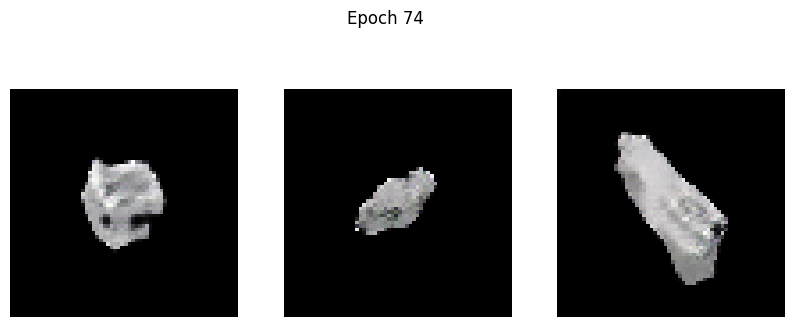

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3147 - g_loss: 1.8015
Epoch 75/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2373 - g_loss: 1.9158

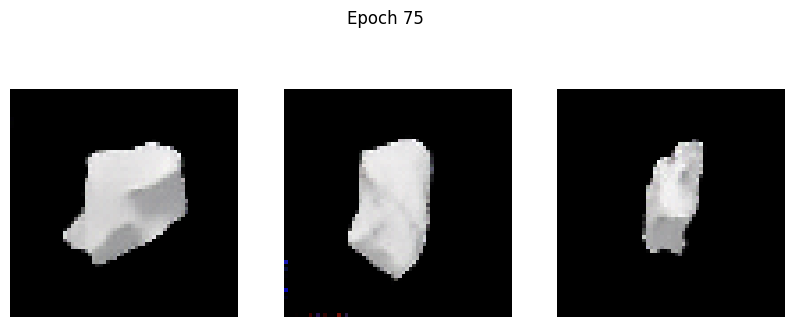

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2372 - g_loss: 1.9160
Epoch 76/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2162 - g_loss: 1.9810

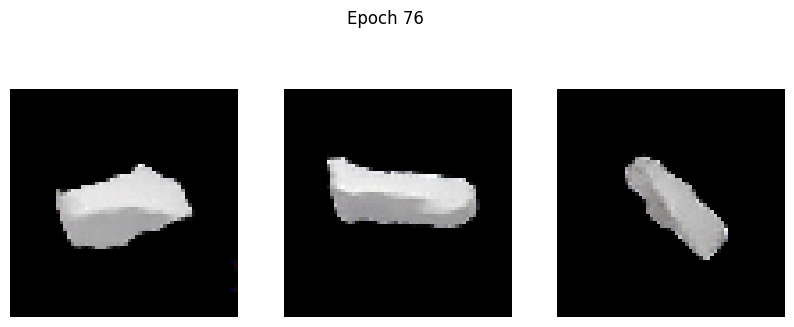

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2163 - g_loss: 1.9814
Epoch 77/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2479 - g_loss: 2.0554

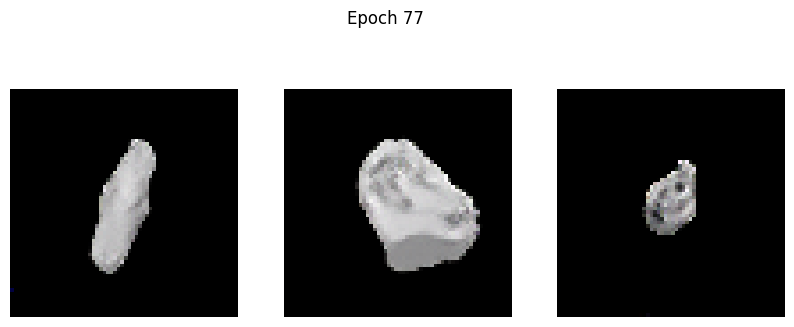

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2476 - g_loss: 2.0555
Epoch 78/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2194 - g_loss: 2.2161

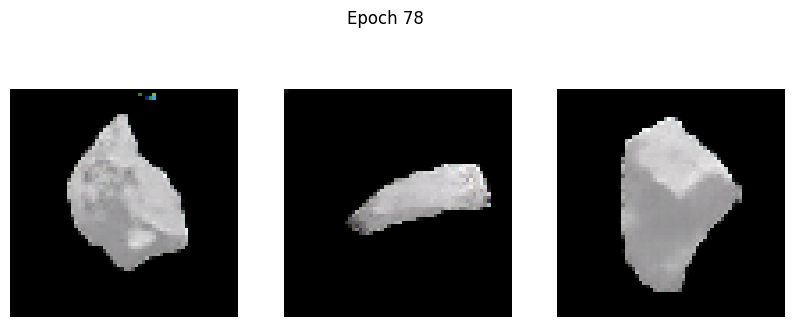

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2196 - g_loss: 2.2163
Epoch 79/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2829 - g_loss: 2.2883

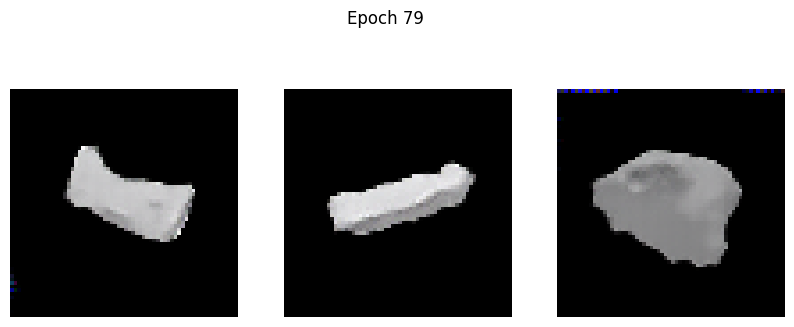

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2822 - g_loss: 2.2874
Epoch 80/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2233 - g_loss: 2.2223

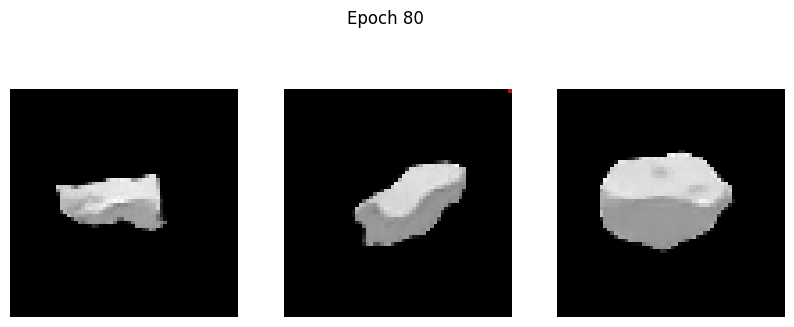

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2233 - g_loss: 2.2223
Epoch 81/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2544 - g_loss: 2.3433

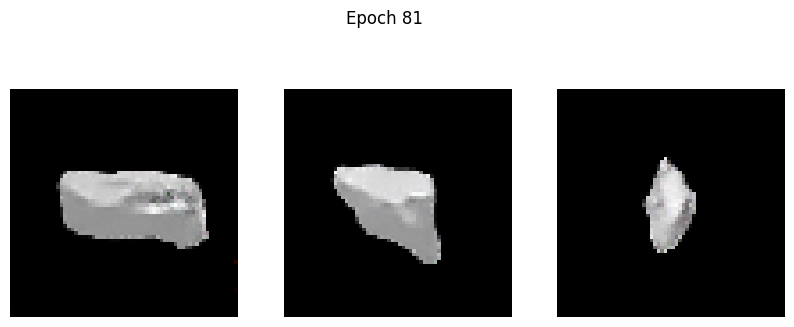

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2540 - g_loss: 2.3423
Epoch 82/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2148 - g_loss: 2.2795

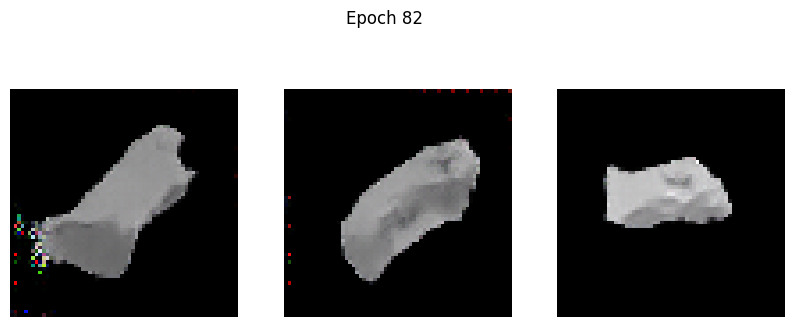

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2151 - g_loss: 2.2808
Epoch 83/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.7822 - g_loss: 2.8379

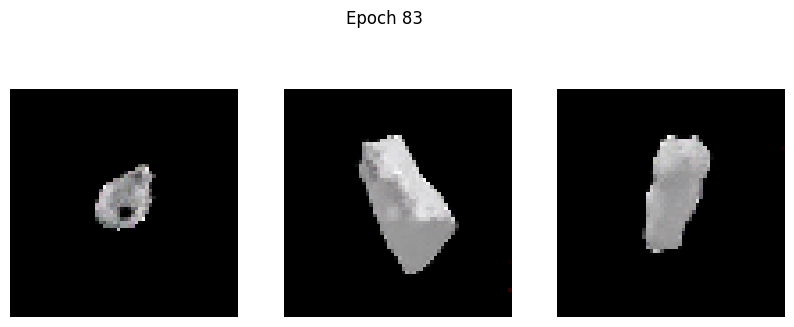

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.7782 - g_loss: 2.8330
Epoch 84/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1898 - g_loss: 2.1647

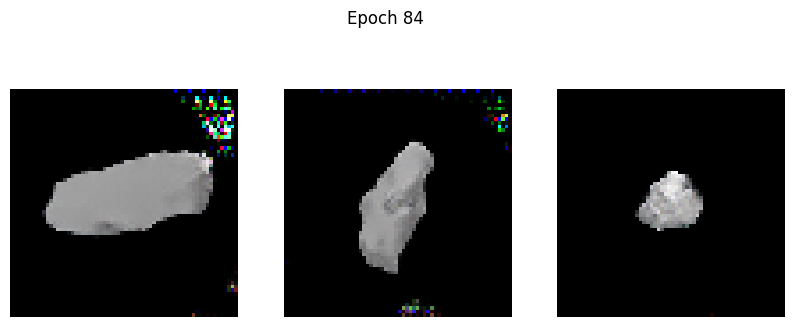

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1897 - g_loss: 2.1648
Epoch 85/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2135 - g_loss: 2.2523

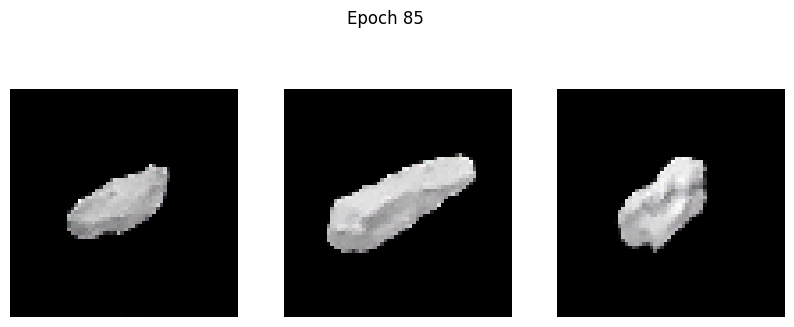

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2133 - g_loss: 2.2524
Epoch 86/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1512 - g_loss: 2.2633

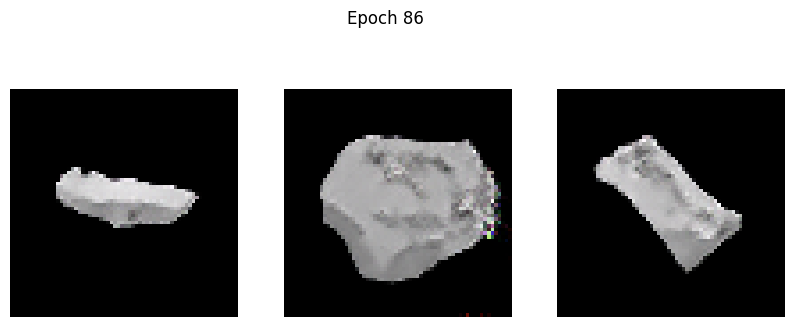

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.1511 - g_loss: 2.2635
Epoch 87/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2017 - g_loss: 2.4122

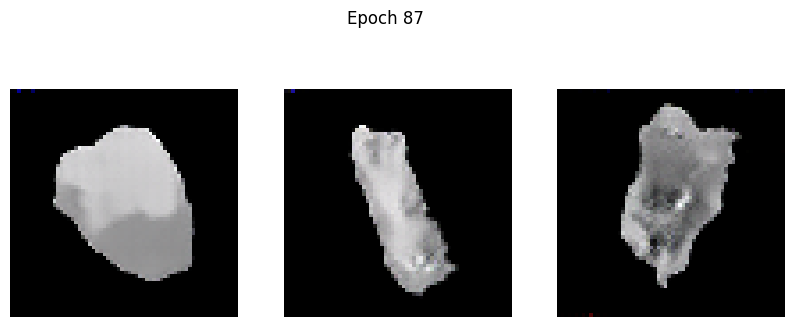

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2019 - g_loss: 2.4124
Epoch 88/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1980 - g_loss: 2.3969

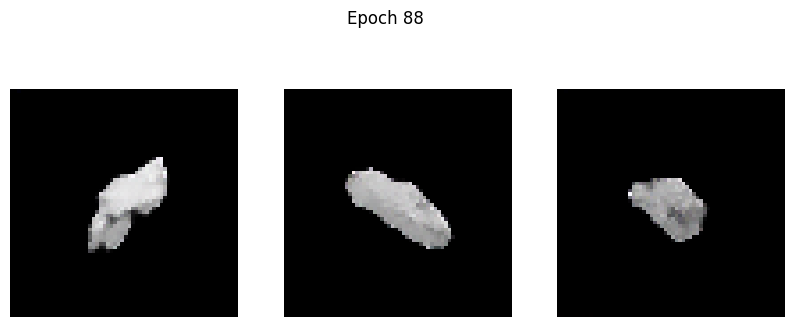

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1983 - g_loss: 2.3967
Epoch 89/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1663 - g_loss: 2.3117

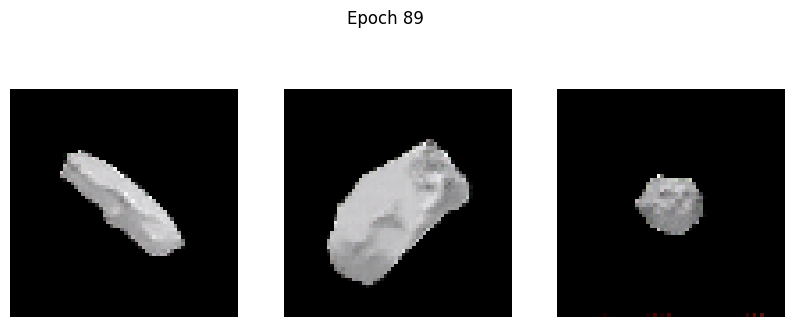

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1663 - g_loss: 2.3120
Epoch 90/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1952 - g_loss: 2.3982

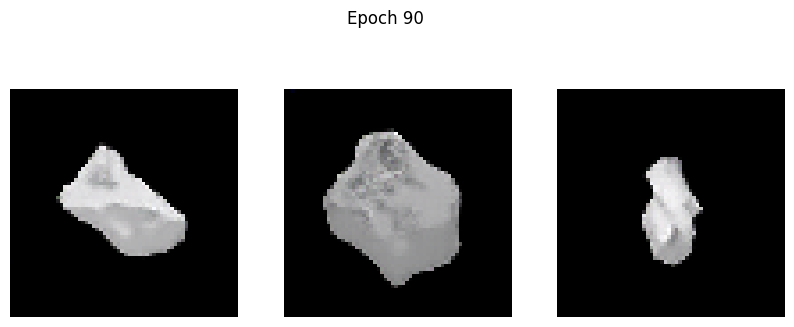

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1960 - g_loss: 2.3988
Epoch 91/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1276 - g_loss: 2.3593

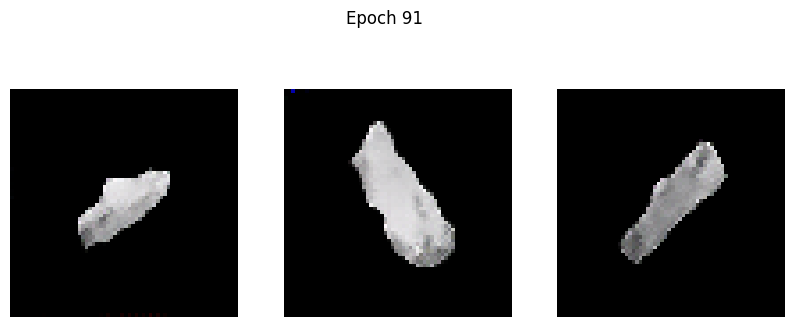

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1277 - g_loss: 2.3590
Epoch 92/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1543 - g_loss: 2.4099

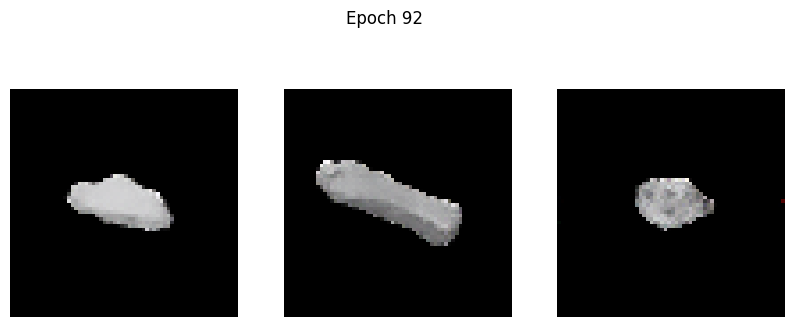

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1552 - g_loss: 2.4105
Epoch 93/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4075 - g_loss: 2.6781

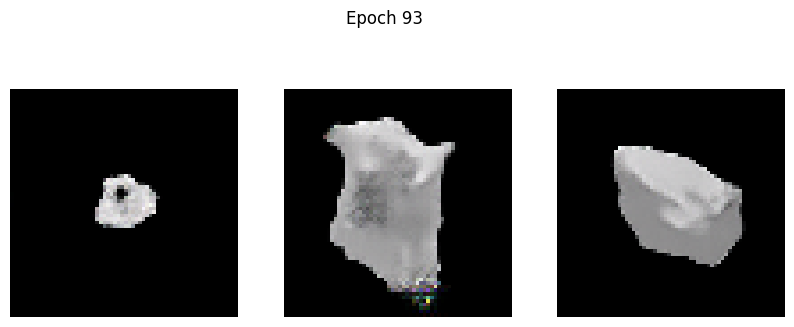

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4060 - g_loss: 2.6759
Epoch 94/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1284 - g_loss: 2.3235

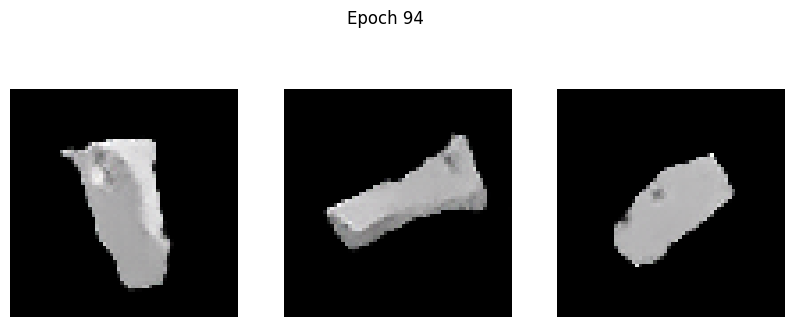

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1283 - g_loss: 2.3238
Epoch 95/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1305 - g_loss: 2.4027

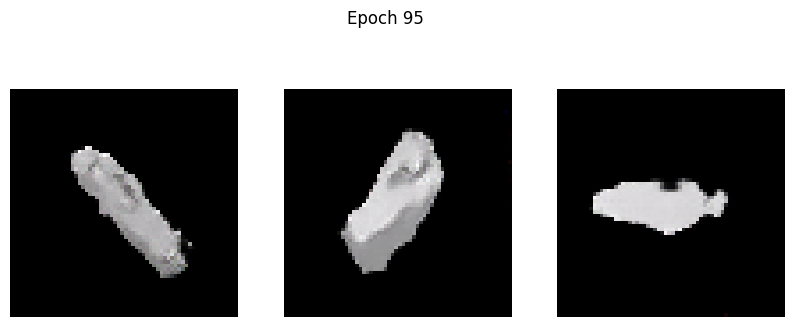

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1308 - g_loss: 2.4033
Epoch 96/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1705 - g_loss: 2.4872

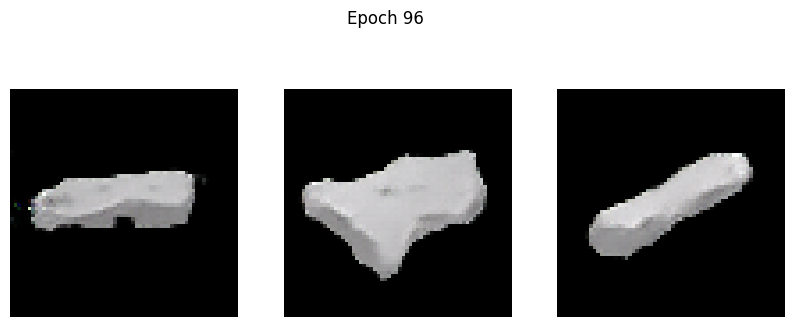

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.1704 - g_loss: 2.4869
Epoch 97/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1885 - g_loss: 2.4411

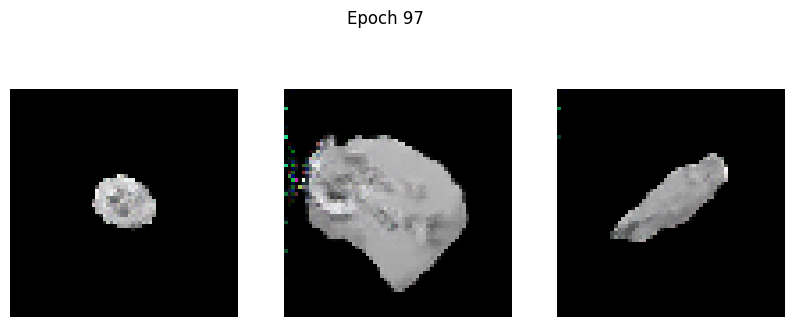

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1882 - g_loss: 2.4413
Epoch 98/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1257 - g_loss: 2.5503

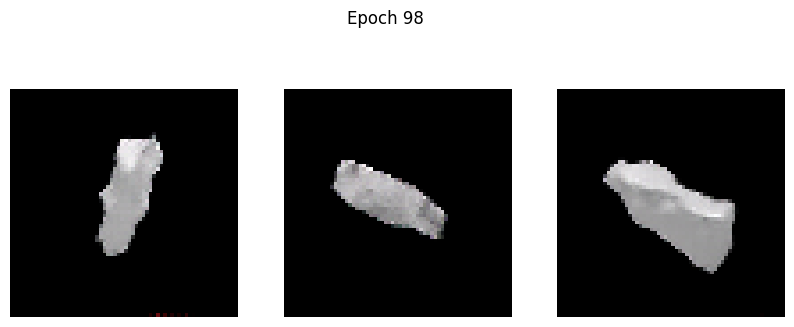

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1264 - g_loss: 2.5510
Epoch 99/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1161 - g_loss: 2.4760

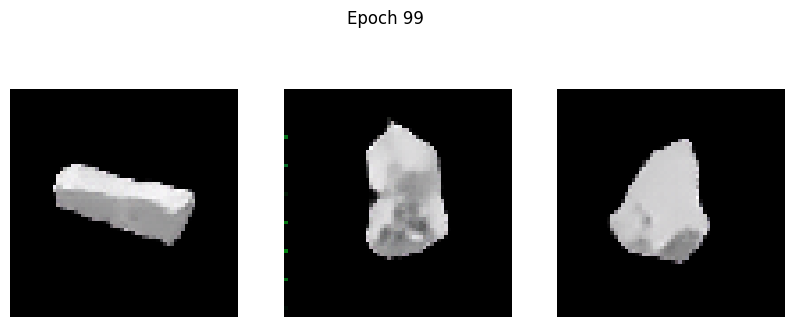

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1159 - g_loss: 2.4763
Epoch 100/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2283 - g_loss: 2.6666

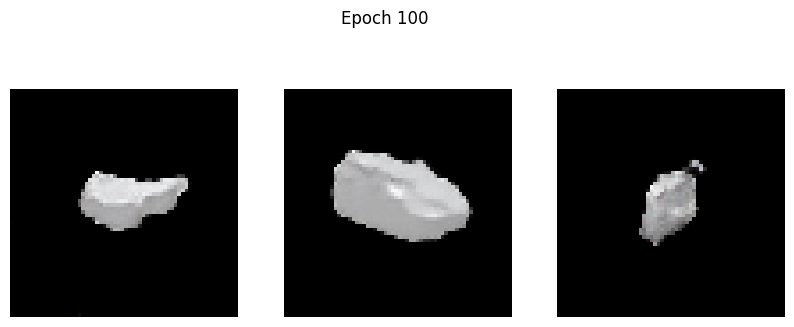

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2297 - g_loss: 2.6671
Epoch 101/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0702 - g_loss: 2.3443

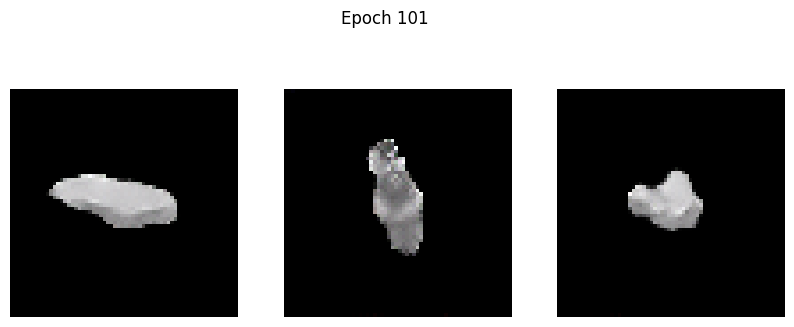

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0705 - g_loss: 2.3445
Epoch 102/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0266 - g_loss: 2.4523

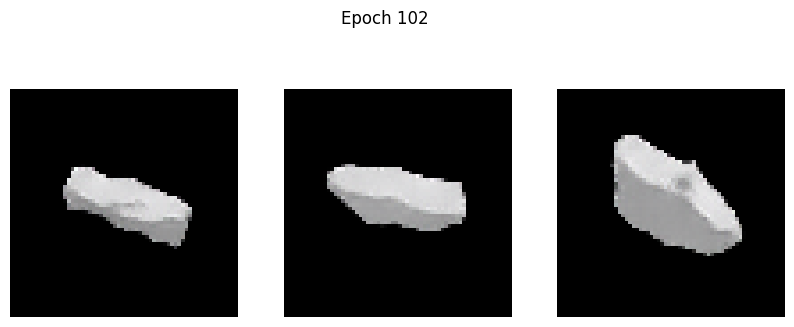

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.0267 - g_loss: 2.4521
Epoch 103/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0791 - g_loss: 2.5893

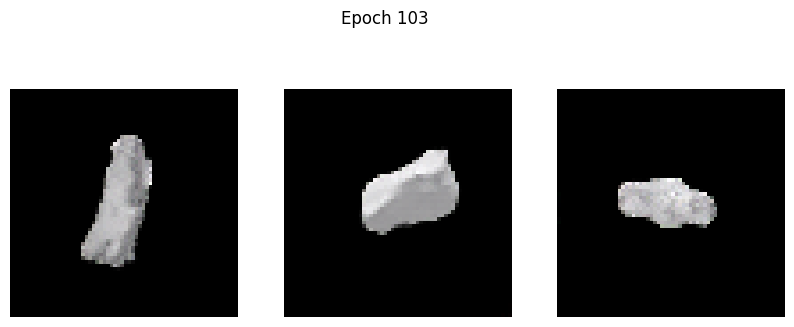

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0794 - g_loss: 2.5897
Epoch 104/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0677 - g_loss: 2.5160

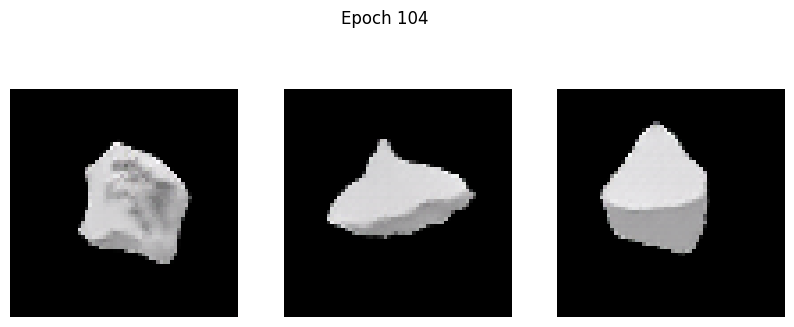

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0677 - g_loss: 2.5164
Epoch 105/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1763 - g_loss: 2.7304

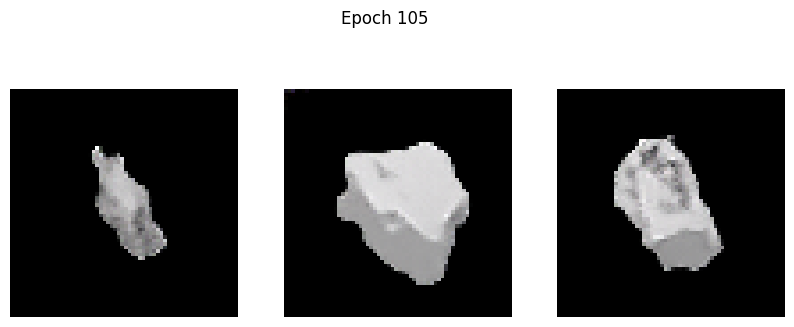

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1772 - g_loss: 2.7310
Epoch 106/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1149 - g_loss: 2.4577

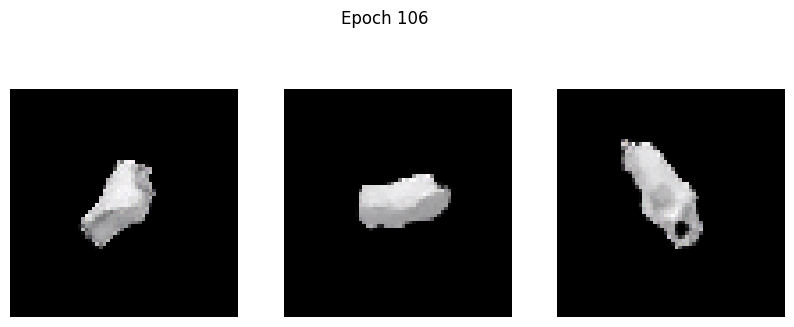

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.1145 - g_loss: 2.4581
Epoch 107/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2.3600e-04 - g_loss: 2.5646 

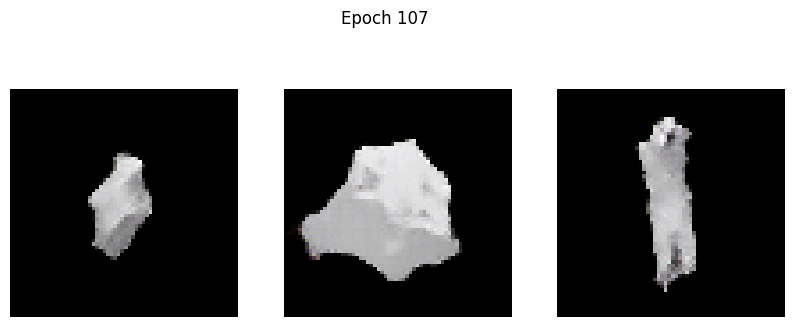

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 4.9429e-04 - g_loss: 2.5645
Epoch 108/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0718 - g_loss: 2.6897

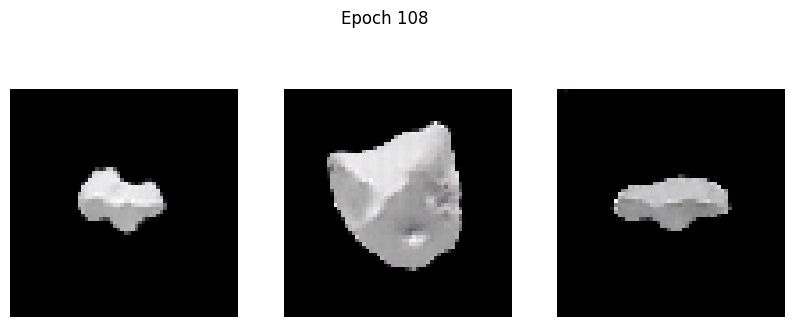

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0716 - g_loss: 2.6893
Epoch 109/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0802 - g_loss: 2.7458

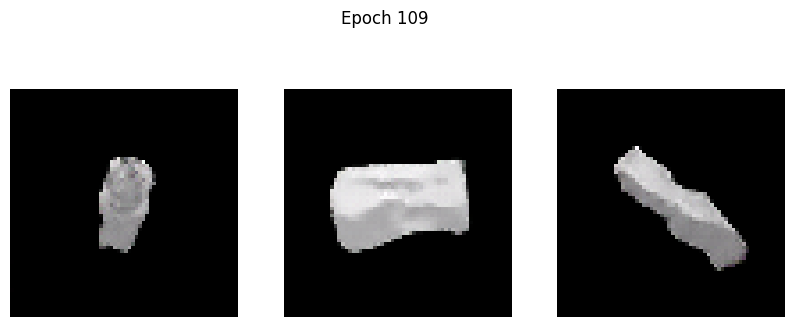

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0802 - g_loss: 2.7454
Epoch 110/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0204 - g_loss: 2.5958

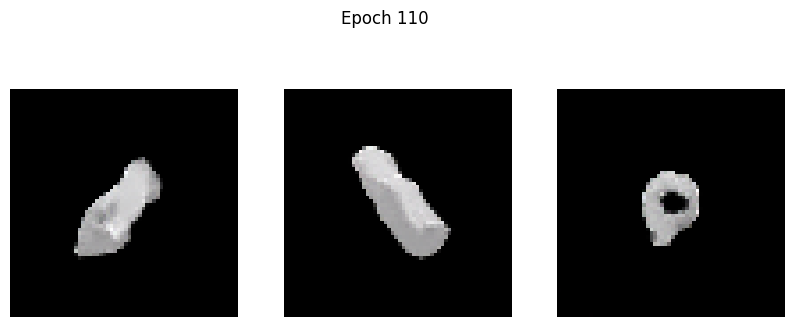

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0203 - g_loss: 2.5962
Epoch 111/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.1455 - g_loss: 4.0474

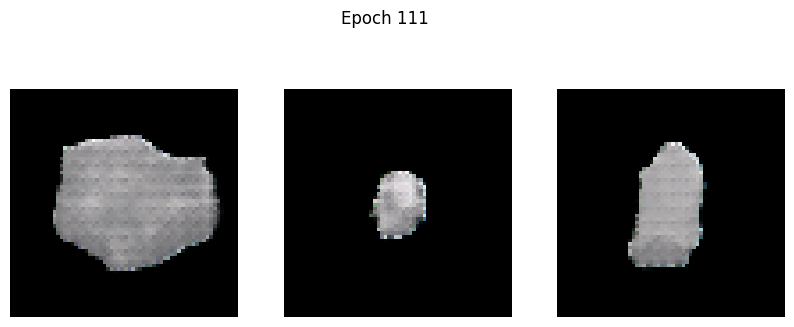

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.1575 - g_loss: 4.0598
Epoch 112/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3856 - g_loss: 1.9739

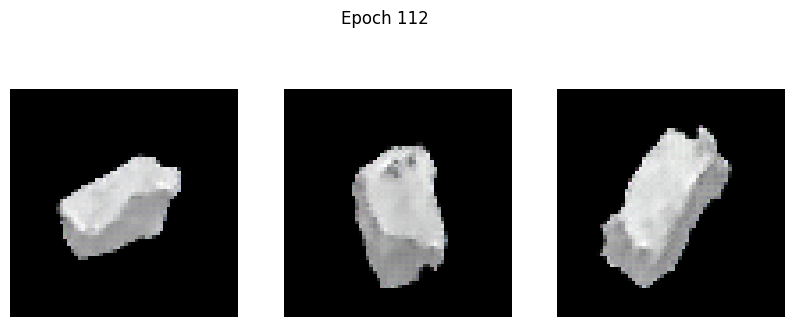

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3847 - g_loss: 1.9728
Epoch 113/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1184 - g_loss: 1.9166

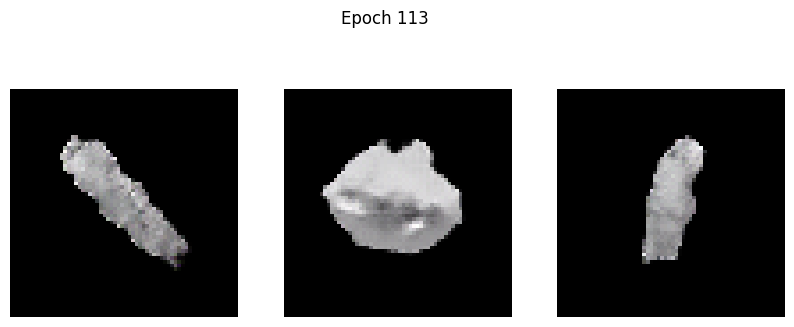

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1184 - g_loss: 1.9165
Epoch 114/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0450 - g_loss: 2.1163

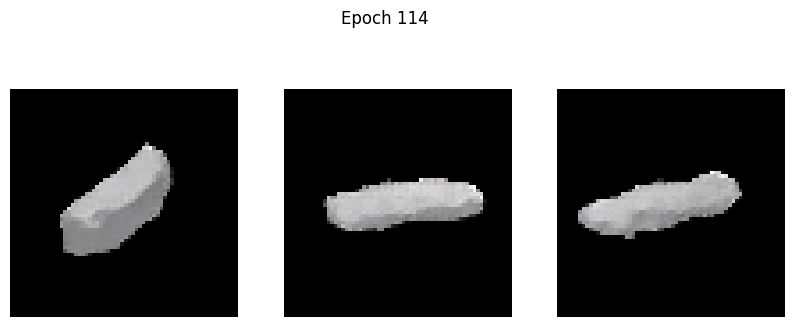

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0449 - g_loss: 2.1162
Epoch 115/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0334 - g_loss: 2.1675

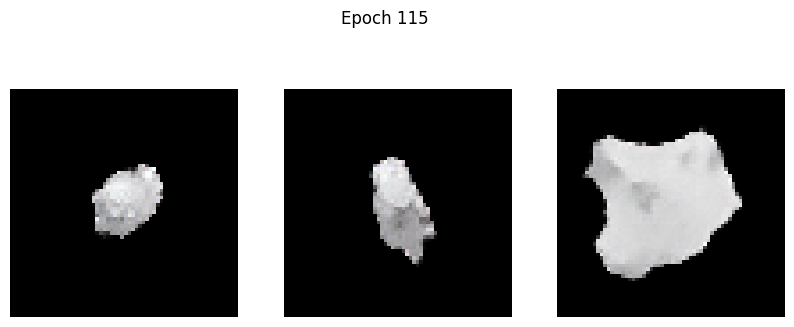

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0331 - g_loss: 2.1678
Epoch 116/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0243 - g_loss: 2.1869

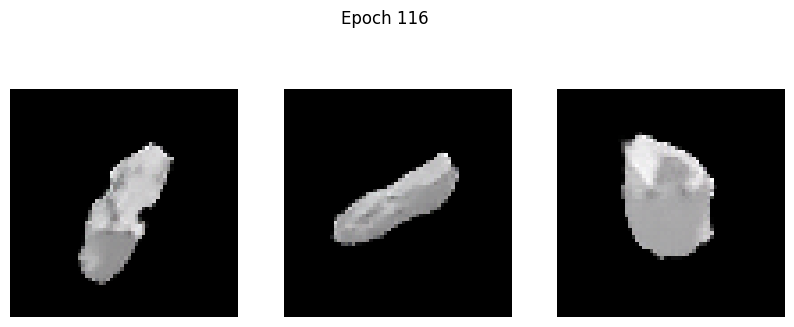

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0240 - g_loss: 2.1873
Epoch 117/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0369 - g_loss: 2.3508

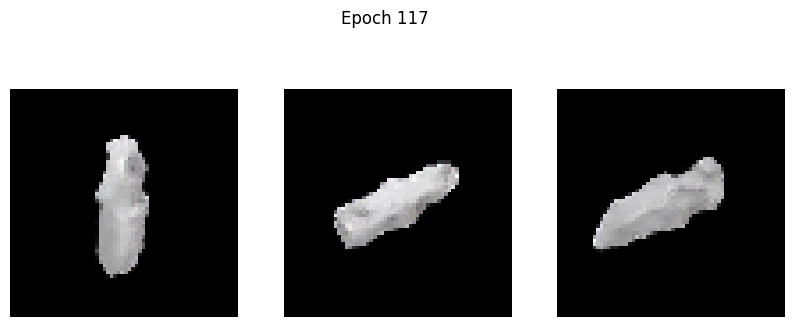

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0371 - g_loss: 2.3506
Epoch 118/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1053 - g_loss: 2.3442

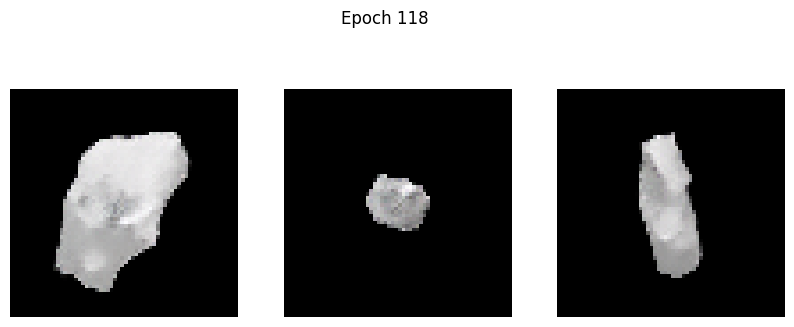

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1050 - g_loss: 2.3446
Epoch 119/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0277 - g_loss: 2.5733

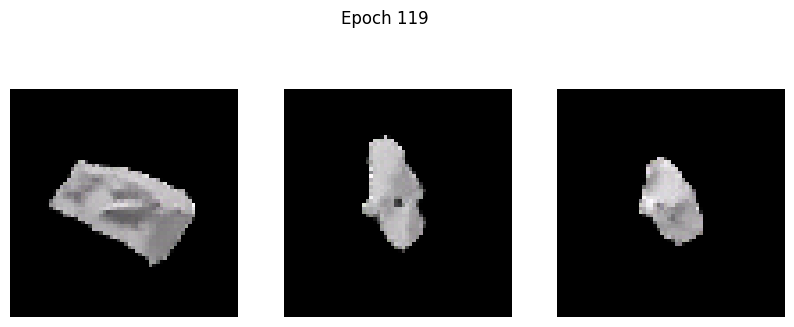

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0293 - g_loss: 2.5744
Epoch 120/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0137 - g_loss: 2.5010

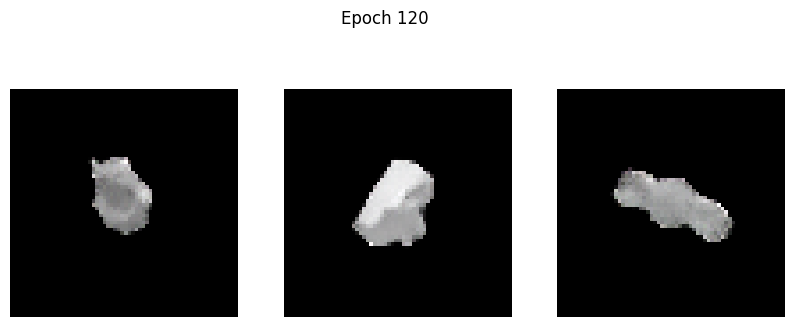

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0141 - g_loss: 2.5005
Epoch 121/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0383 - g_loss: 2.5374

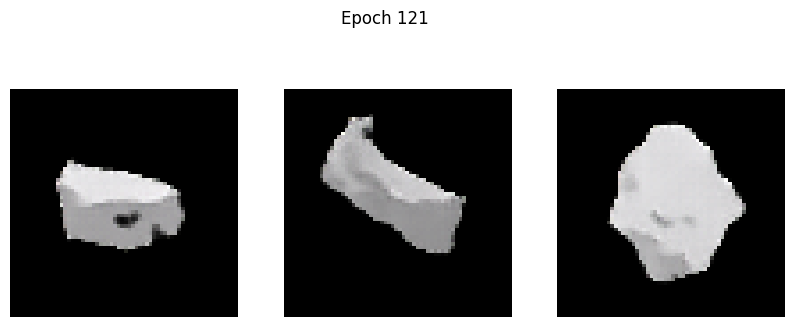

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0388 - g_loss: 2.5371
Epoch 122/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1036 - g_loss: 2.5451

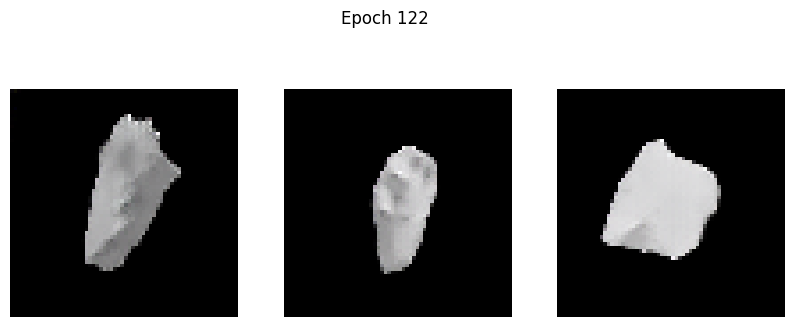

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1030 - g_loss: 2.5457
Epoch 123/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0249 - g_loss: 2.8251

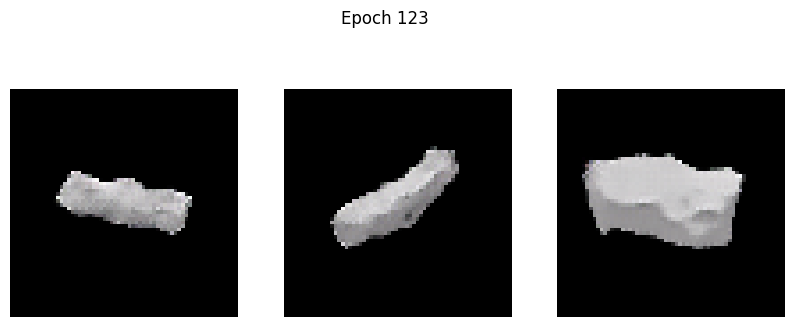

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0258 - g_loss: 2.8253
Epoch 124/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1056 - g_loss: 2.5916

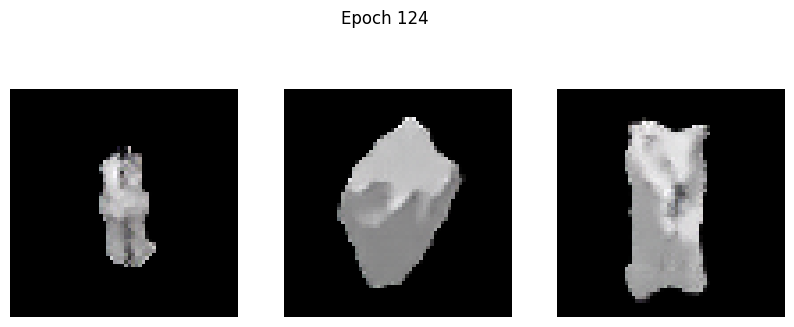

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1054 - g_loss: 2.5917
Epoch 125/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1255 - g_loss: 2.5927

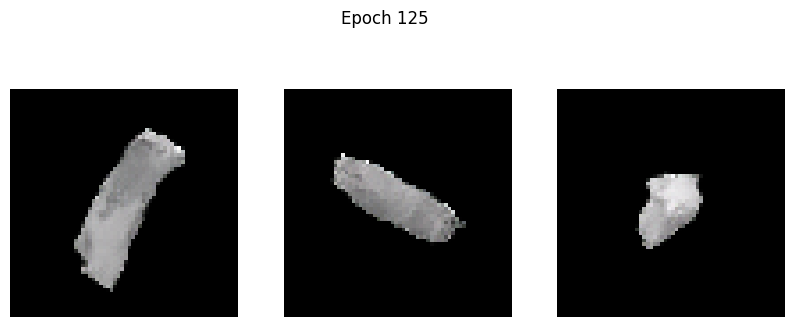

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1257 - g_loss: 2.5933
Epoch 126/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1529 - g_loss: 2.5994

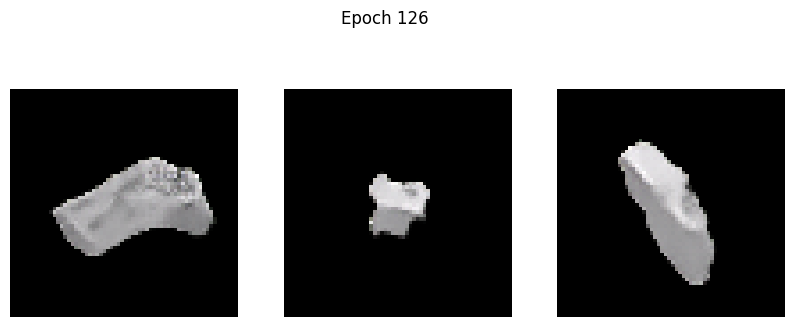

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1529 - g_loss: 2.6019
Epoch 127/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1752 - g_loss: 2.7244

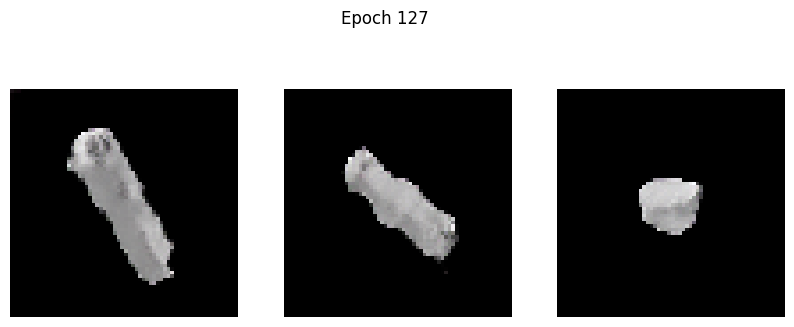

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1754 - g_loss: 2.7249
Epoch 128/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0159 - g_loss: 2.8619

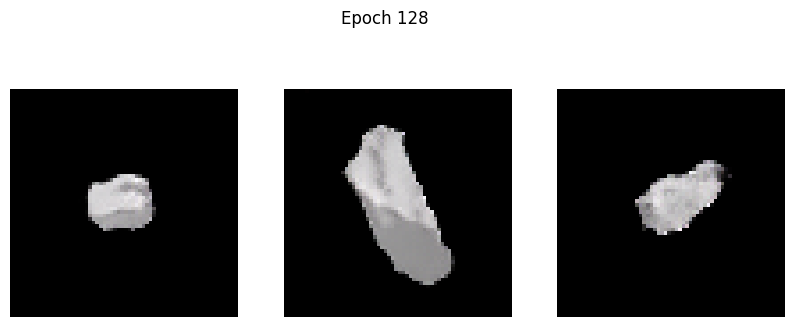

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0163 - g_loss: 2.8631
Epoch 129/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1632 - g_loss: 2.8036

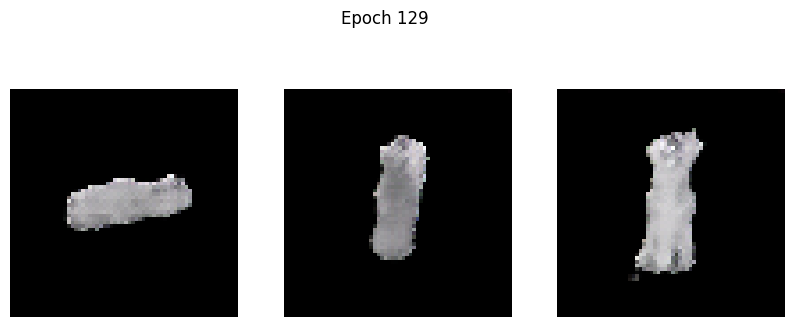

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1636 - g_loss: 2.8049
Epoch 130/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2652 - g_loss: 3.1693

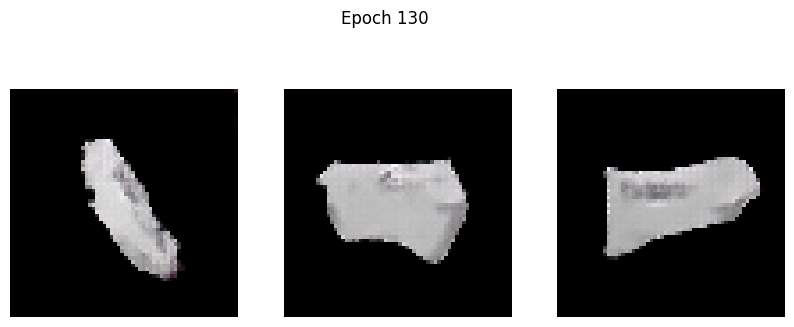

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2629 - g_loss: 3.1651
Epoch 131/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1824 - g_loss: 2.6149

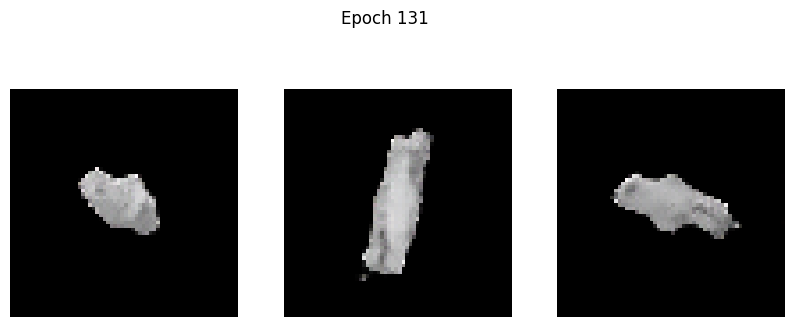

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1831 - g_loss: 2.6143
Epoch 132/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1339 - g_loss: 2.7548

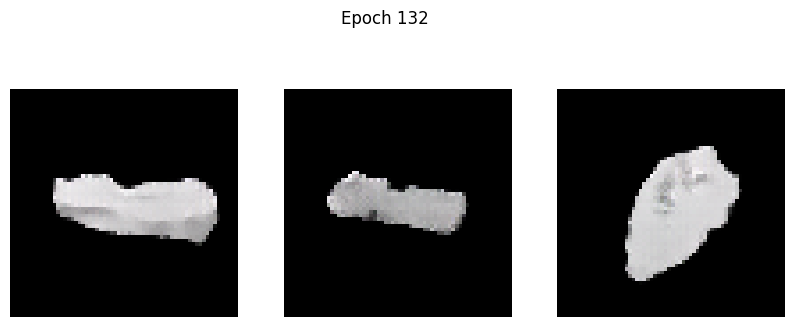

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1341 - g_loss: 2.7555
Epoch 133/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1326 - g_loss: 2.7368

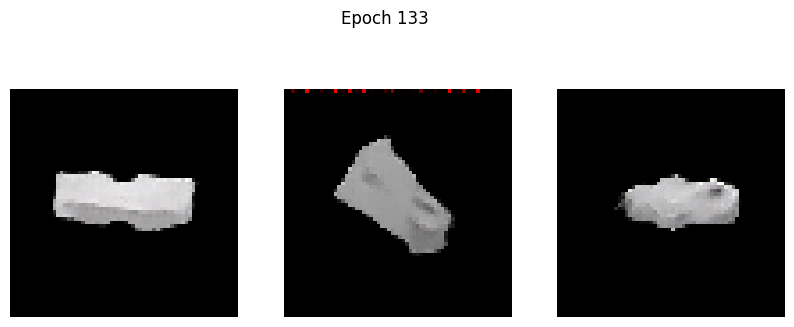

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1334 - g_loss: 2.7372
Epoch 134/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.3385 - g_loss: 2.7208

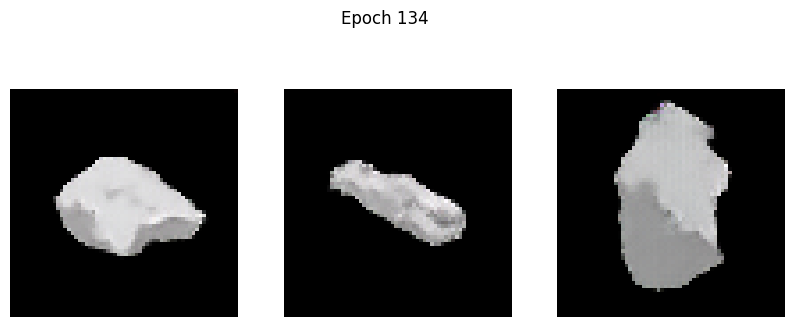

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.3371 - g_loss: 2.7223
Epoch 135/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1117 - g_loss: 3.0131

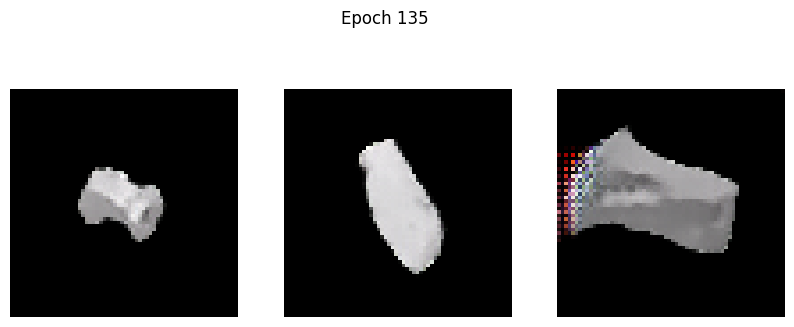

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1130 - g_loss: 3.0120
Epoch 136/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3669 - g_loss: 3.5347

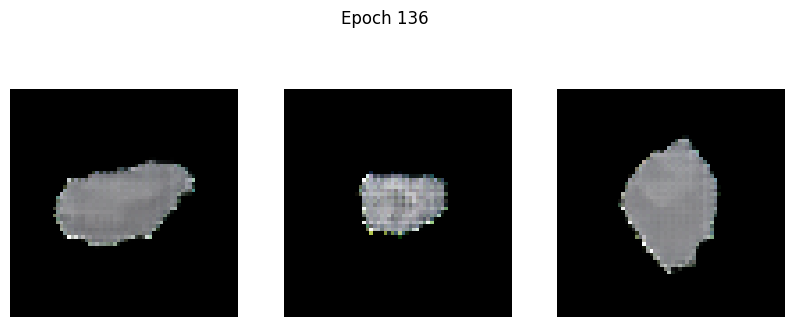

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4018 - g_loss: 3.5688
Epoch 137/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2.5766 - g_loss: 4.3649

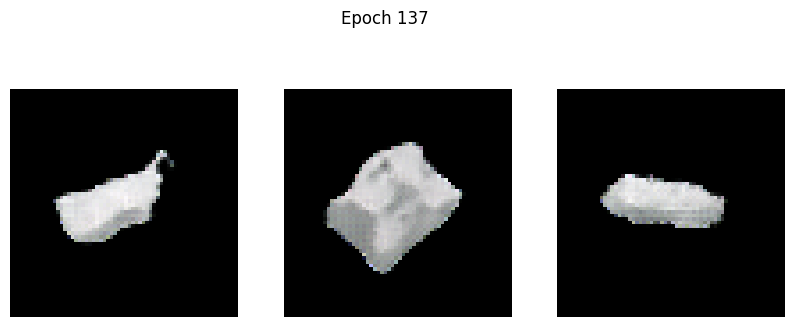

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 2.5659 - g_loss: 4.3548
Epoch 138/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3730 - g_loss: 1.9664

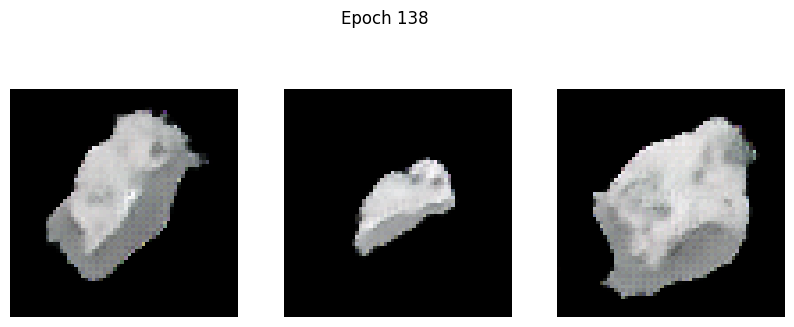

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3720 - g_loss: 1.9664
Epoch 139/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0971 - g_loss: 1.9013

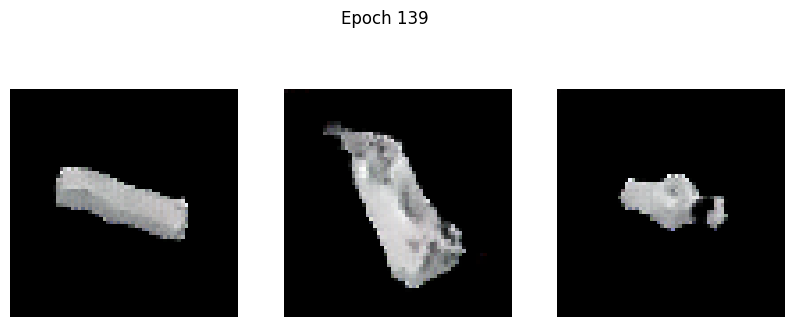

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0965 - g_loss: 1.9021
Epoch 140/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0108 - g_loss: 2.0372

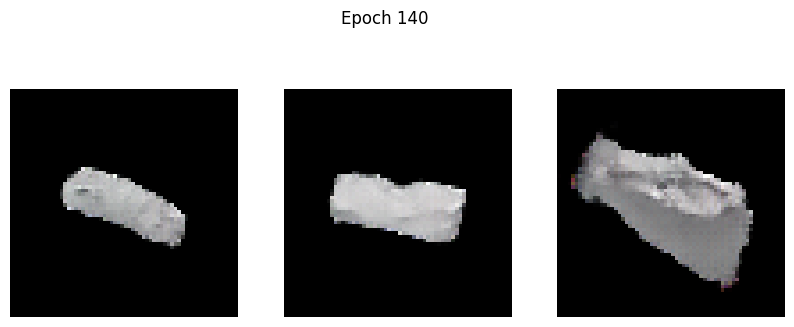

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0102 - g_loss: 2.0374
Epoch 141/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0683 - g_loss: 2.1156

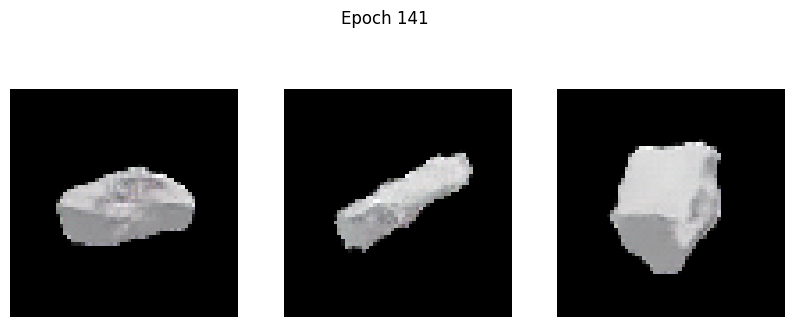

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0690 - g_loss: 2.1160
Epoch 142/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1185 - g_loss: 2.1815

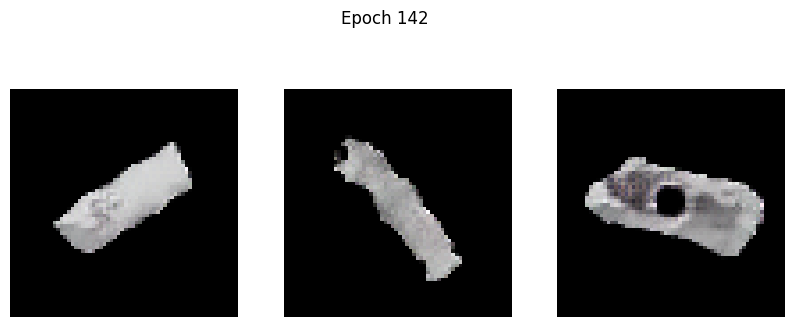

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1189 - g_loss: 2.1817
Epoch 143/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.2219 - g_loss: 2.2430

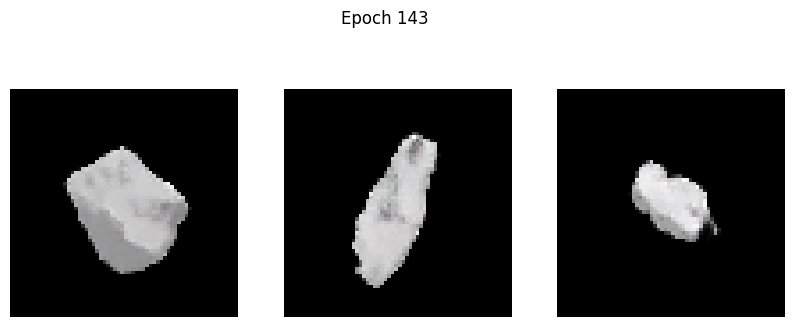

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.2218 - g_loss: 2.2433
Epoch 144/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.2818 - g_loss: 2.2942

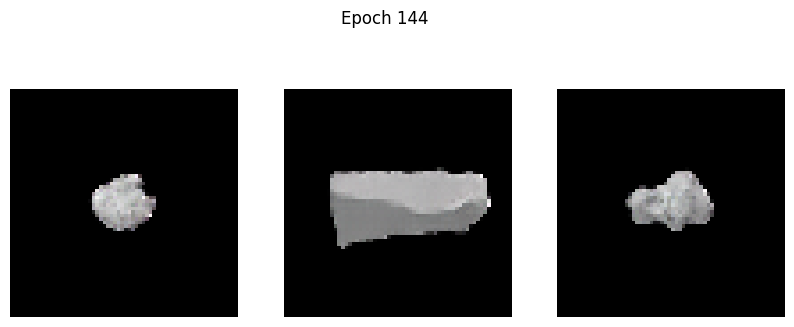

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.2818 - g_loss: 2.2946
Epoch 145/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4723 - g_loss: 2.3360

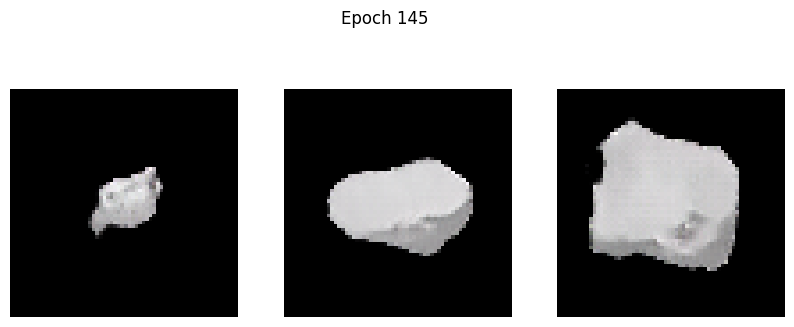

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4716 - g_loss: 2.3362
Epoch 146/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4297 - g_loss: 2.4459

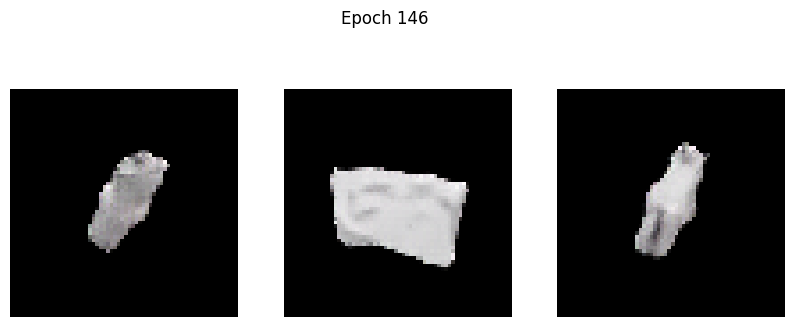

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4292 - g_loss: 2.4459
Epoch 147/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4608 - g_loss: 2.4752

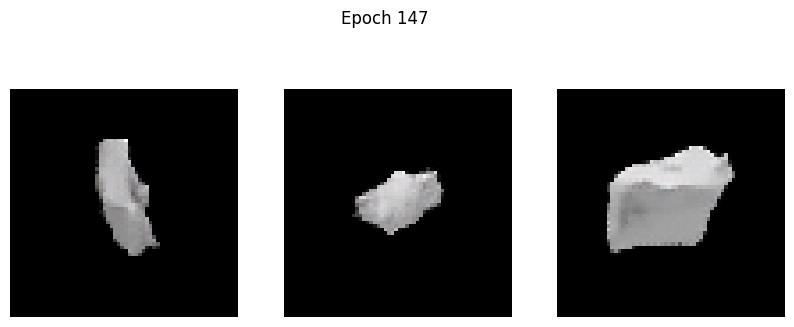

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4608 - g_loss: 2.4753
Epoch 148/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.3945 - g_loss: 2.6598

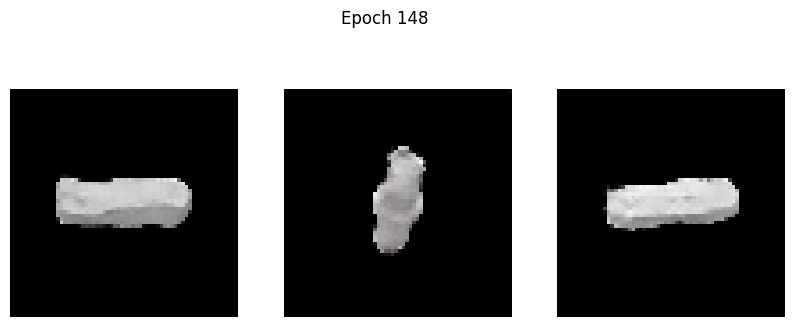

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.3951 - g_loss: 2.6594
Epoch 149/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4502 - g_loss: 2.7430

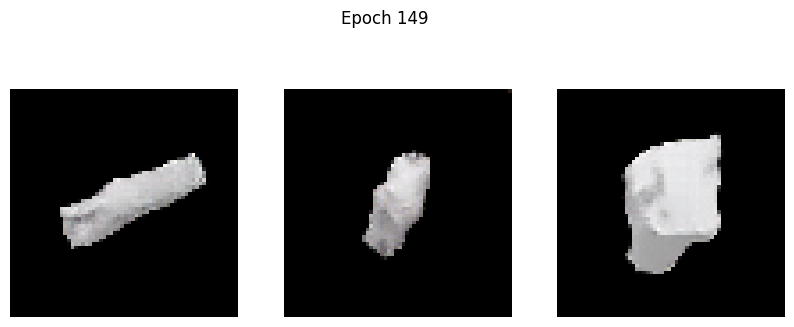

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4498 - g_loss: 2.7431
Epoch 150/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4045 - g_loss: 2.8398

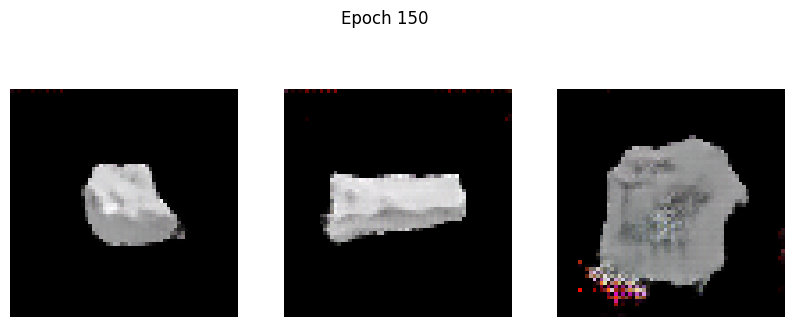

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.4039 - g_loss: 2.8396
Epoch 151/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4151 - g_loss: 2.8512

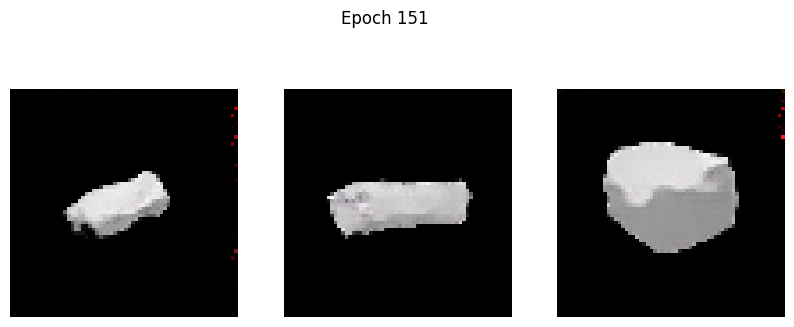

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4134 - g_loss: 2.8512
Epoch 152/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1425 - g_loss: 3.0461

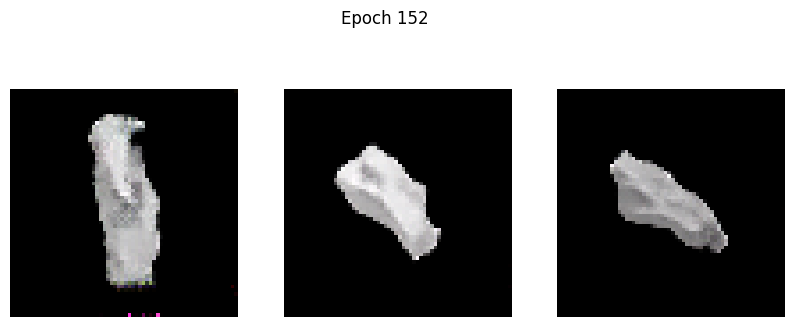

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1450 - g_loss: 3.0438
Epoch 153/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.5272 - g_loss: 2.7605

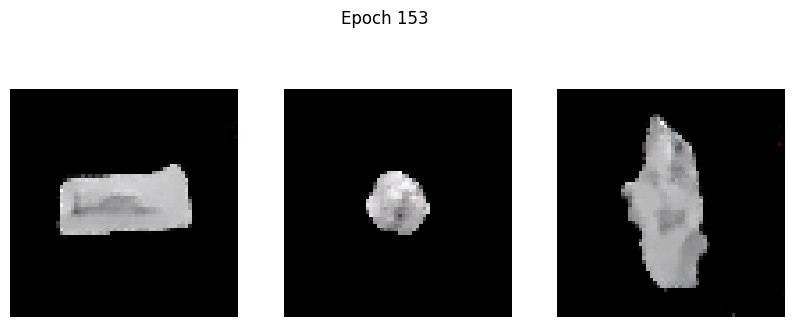

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.5275 - g_loss: 2.7600
Epoch 154/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.6962 - g_loss: 2.9021

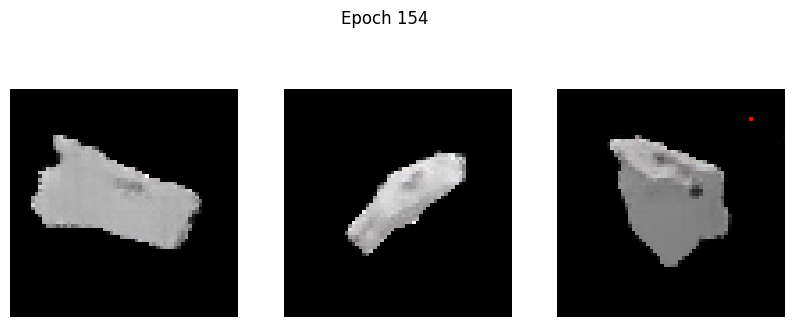

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.6950 - g_loss: 2.9024
Epoch 155/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.7277 - g_loss: 2.8800

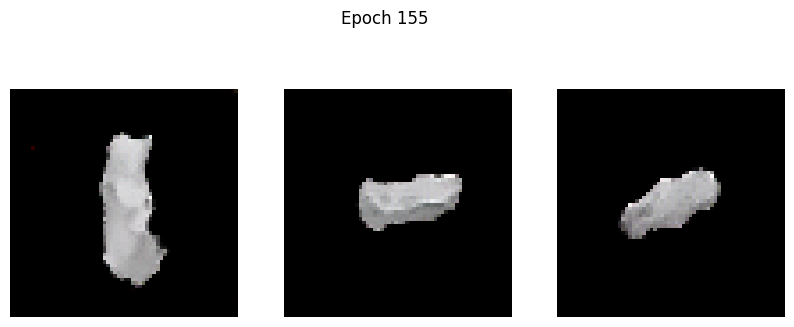

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.7262 - g_loss: 2.8804
Epoch 156/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.5865 - g_loss: 3.0024

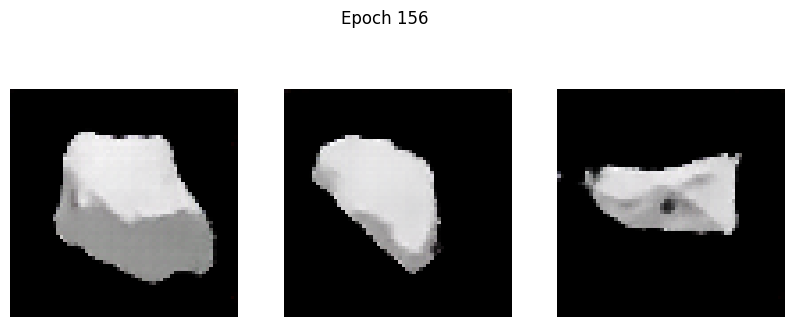

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.5874 - g_loss: 3.0023
Epoch 157/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.3107 - g_loss: 3.1209

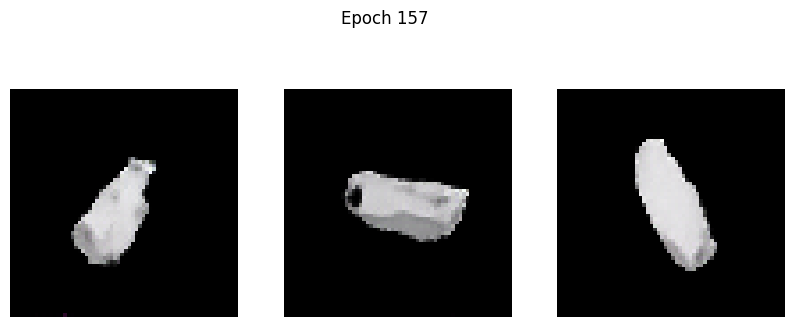

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.3095 - g_loss: 3.1215
Epoch 158/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.6345 - g_loss: 2.9482

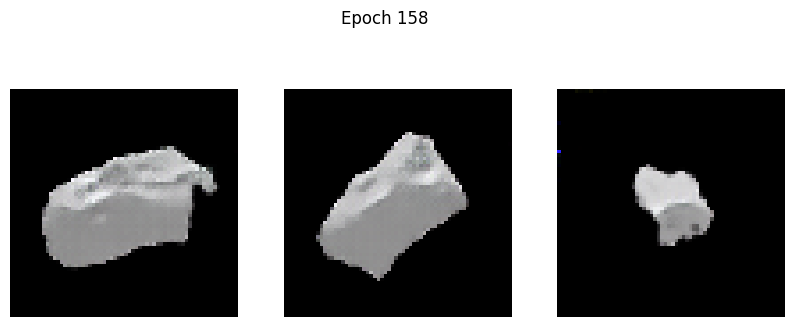

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.6336 - g_loss: 2.9479
Epoch 159/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.7099 - g_loss: 2.8666

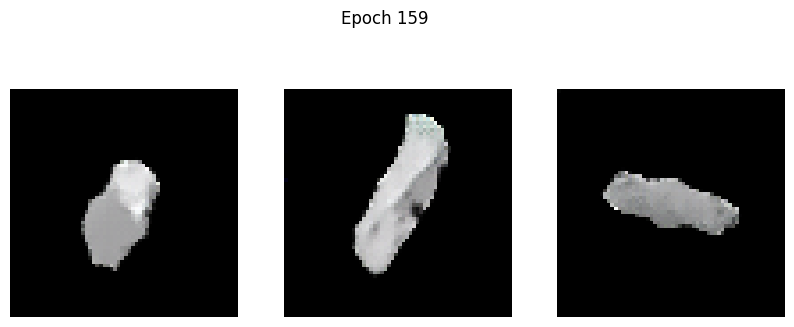

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.7095 - g_loss: 2.8664
Epoch 160/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4958 - g_loss: 3.0150

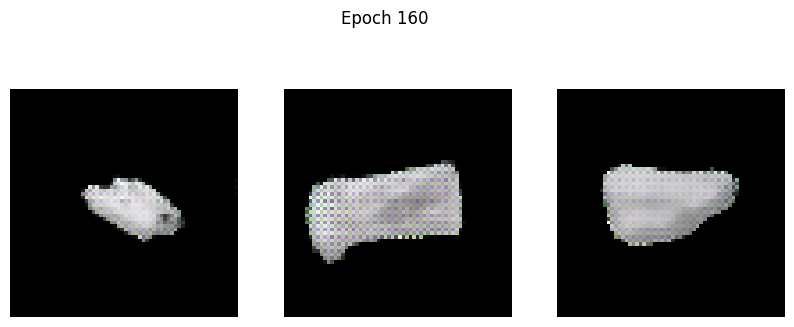

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4897 - g_loss: 3.0202
Epoch 161/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.5592 - g_loss: 3.1108

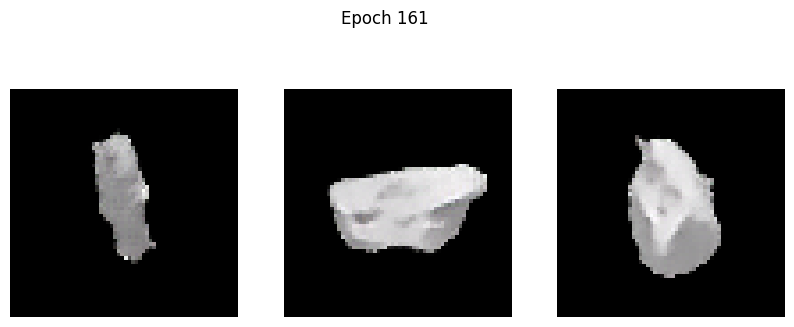

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.5596 - g_loss: 3.1086
Epoch 162/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.9483 - g_loss: 2.7568

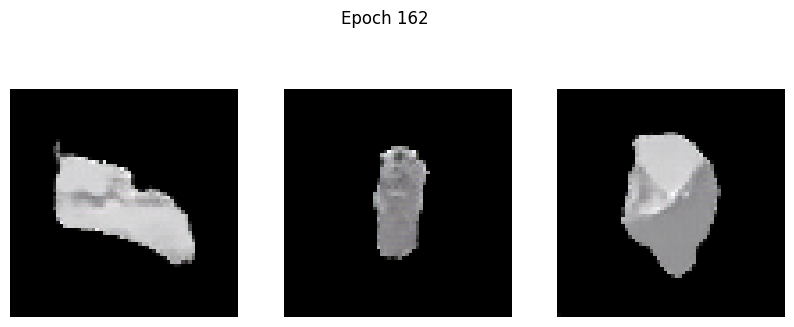

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.9478 - g_loss: 2.7568
Epoch 163/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0029 - g_loss: 2.8792

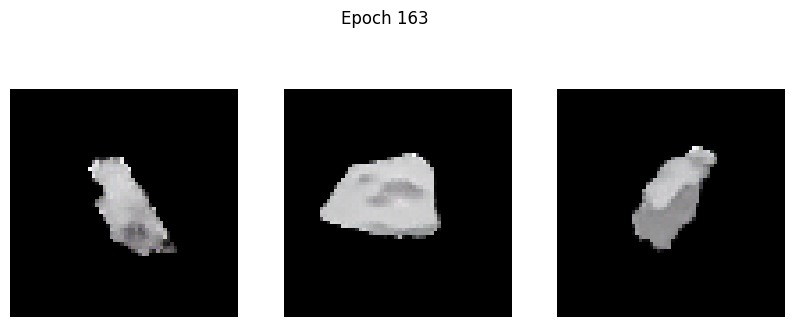

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0020 - g_loss: 2.8797
Epoch 164/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.5229 - g_loss: 3.4576

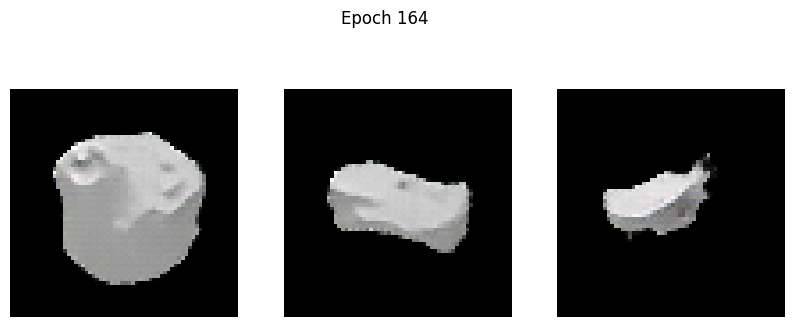

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.5192 - g_loss: 3.4606
Epoch 165/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.7761 - g_loss: 2.9392

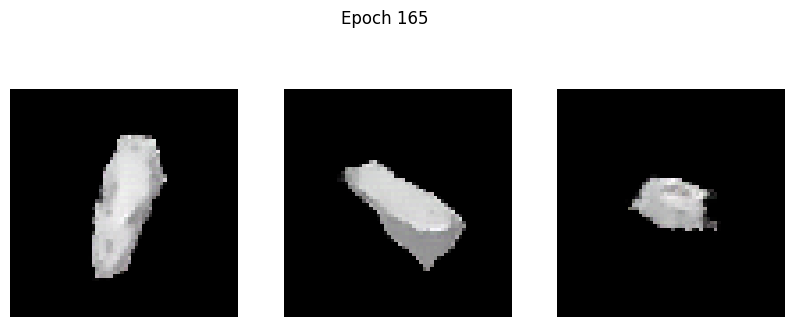

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.7774 - g_loss: 2.9378
Epoch 166/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.5920 - g_loss: 2.8213

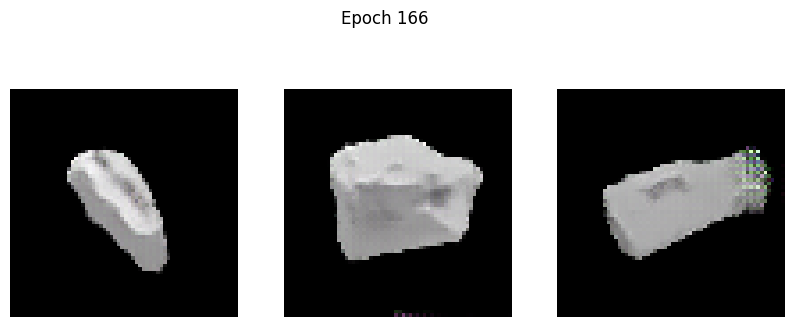

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.5948 - g_loss: 2.8220
Epoch 167/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.2286 - g_loss: 3.1066

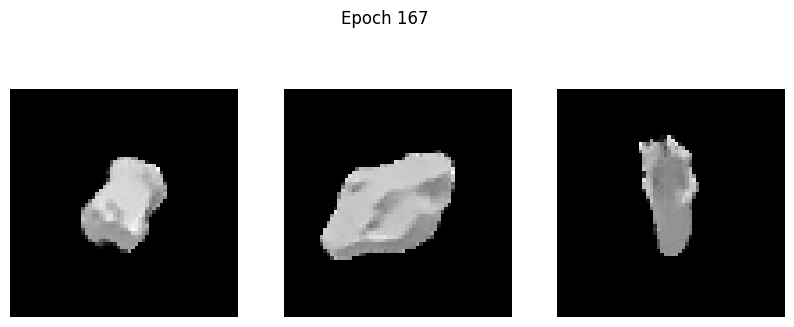

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.2311 - g_loss: 3.1074
Epoch 168/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0594 - g_loss: 2.9318

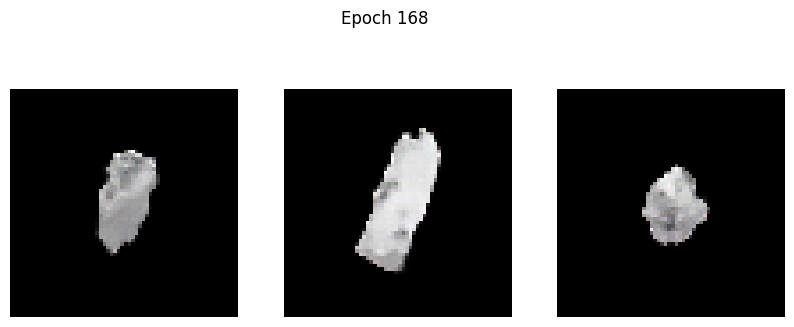

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0593 - g_loss: 2.9316
Epoch 169/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.3996 - g_loss: 2.9812

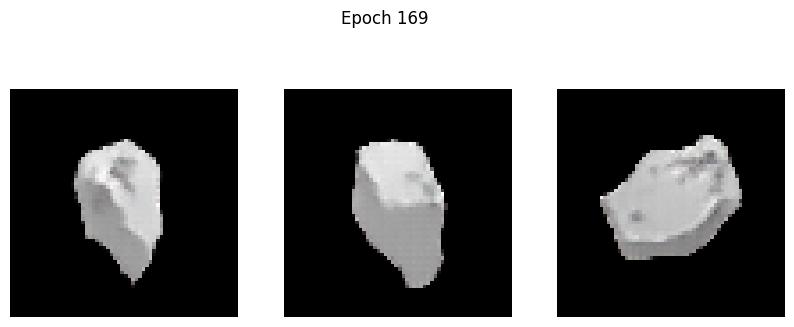

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.3988 - g_loss: 2.9815
Epoch 170/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.3743 - g_loss: 4.9376

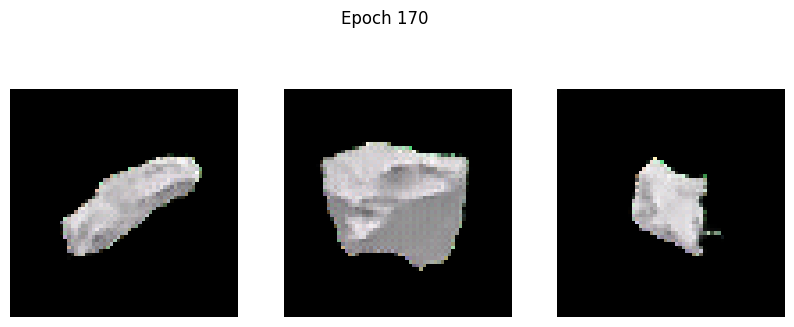

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.3718 - g_loss: 4.9302
Epoch 171/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0486 - g_loss: 2.3678

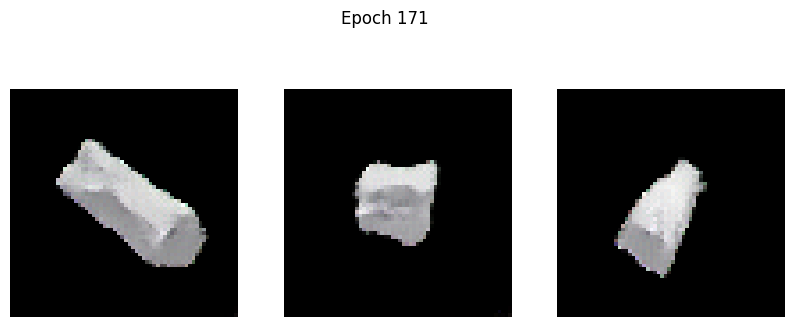

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0502 - g_loss: 2.3679
Epoch 172/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0535 - g_loss: 2.5546

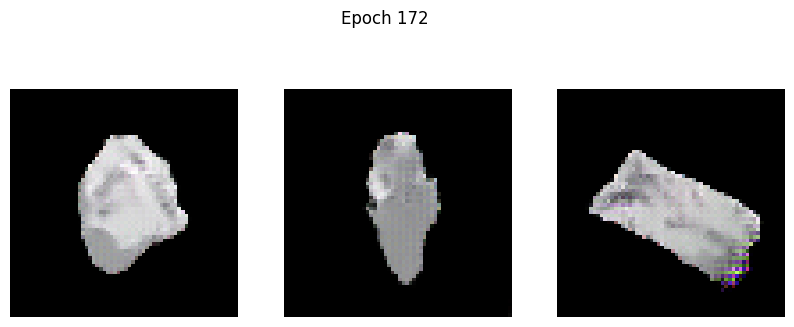

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0522 - g_loss: 2.5558
Epoch 173/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.3771 - g_loss: 2.7337

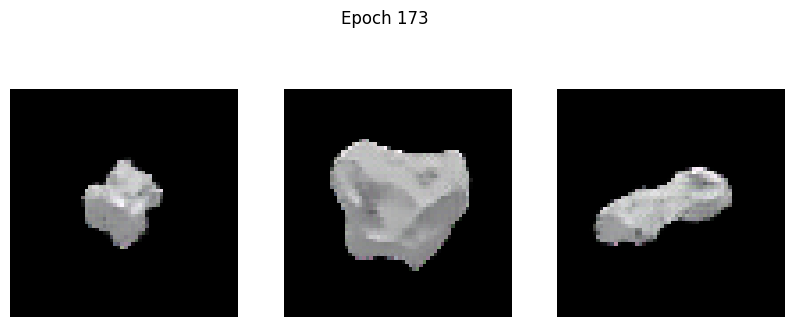

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.3774 - g_loss: 2.7337
Epoch 174/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.8146 - g_loss: 2.9696

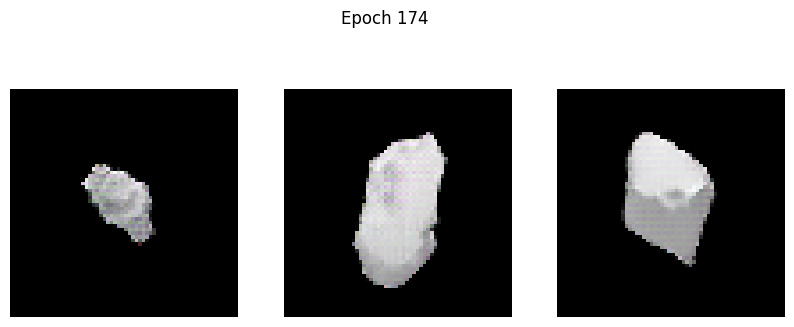

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.8195 - g_loss: 2.9689
Epoch 175/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0576 - g_loss: 3.2797

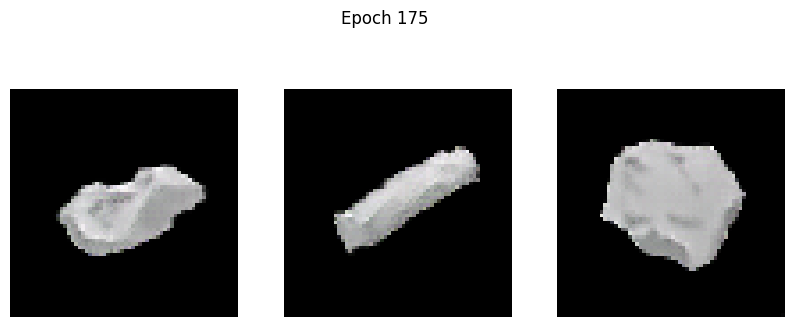

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0504 - g_loss: 3.2785
Epoch 176/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0875 - g_loss: 2.7728

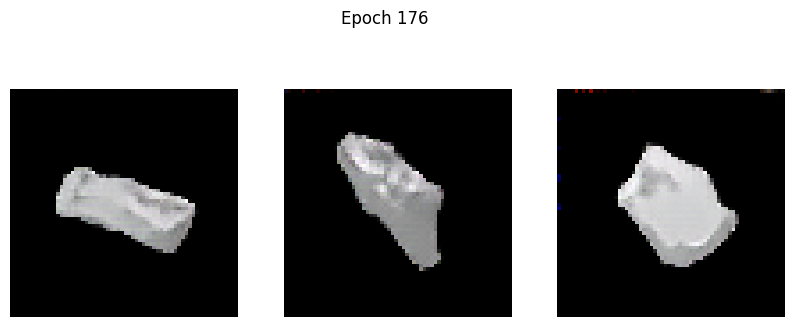

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0902 - g_loss: 2.7734
Epoch 177/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.6141 - g_loss: 3.3251

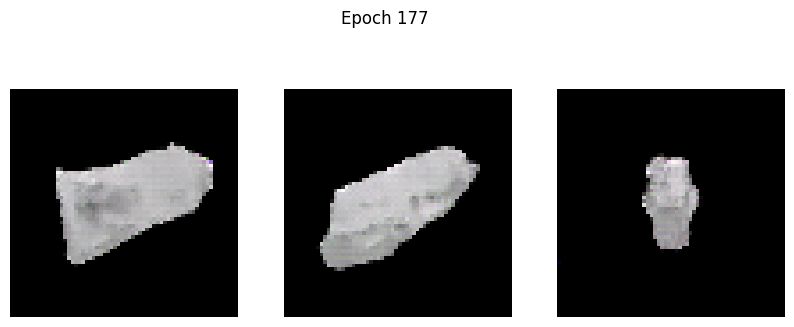

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.6184 - g_loss: 3.3232
Epoch 178/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0543 - g_loss: 3.0277

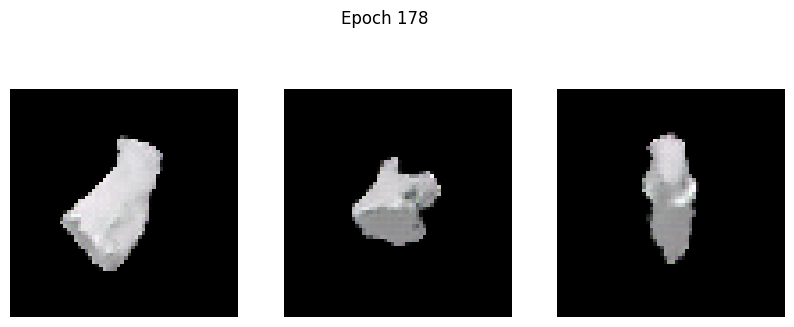

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0512 - g_loss: 3.0319
Epoch 179/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.7221 - g_loss: 2.7914

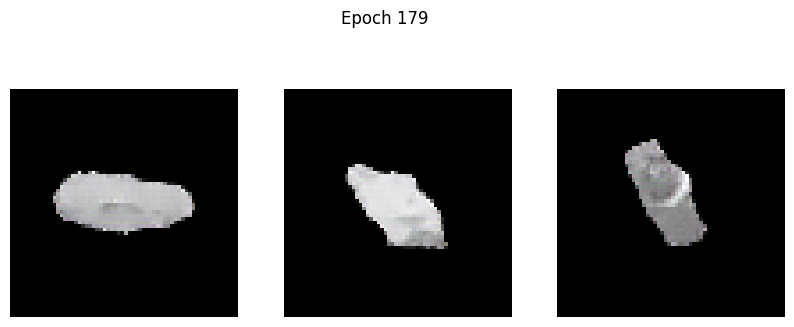

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.7238 - g_loss: 2.7916
Epoch 180/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.8107 - g_loss: 3.1697

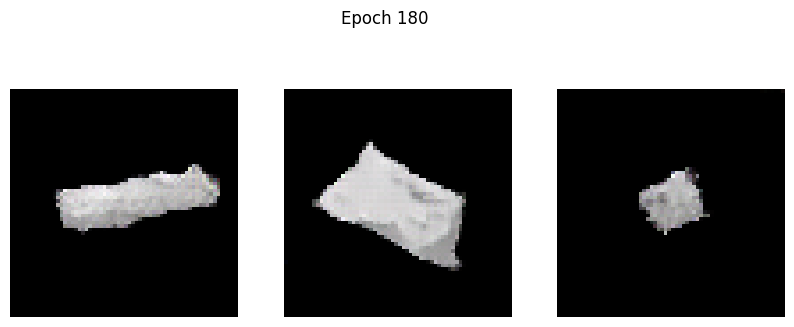

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.8081 - g_loss: 3.1696
Epoch 181/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.7573 - g_loss: 3.0987

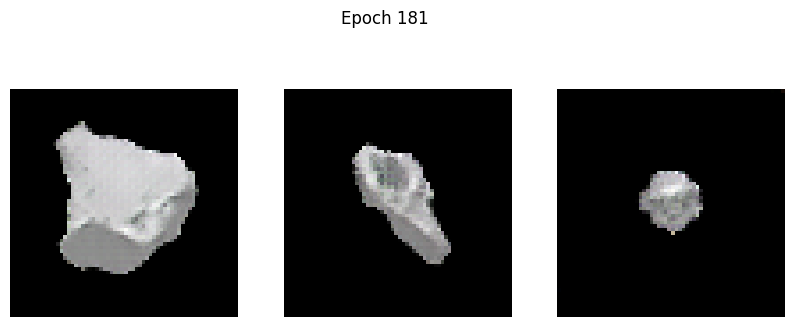

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.7567 - g_loss: 3.0999
Epoch 182/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6959 - g_loss: 4.9427

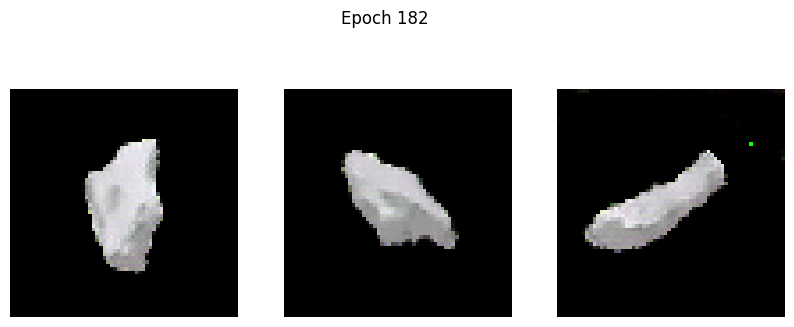

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6921 - g_loss: 4.9374
Epoch 183/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.9255 - g_loss: 2.8109

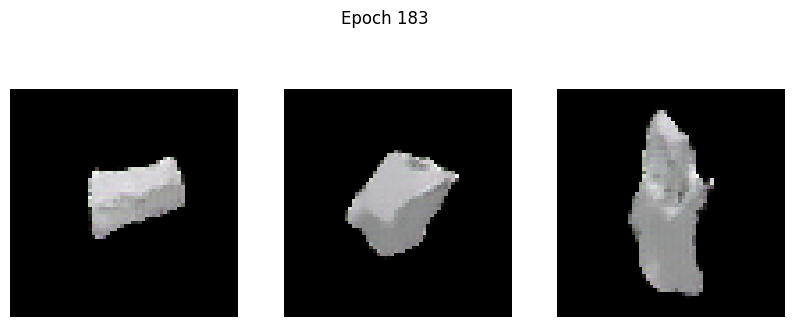

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.9264 - g_loss: 2.8112
Epoch 184/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.1814 - g_loss: 2.9078

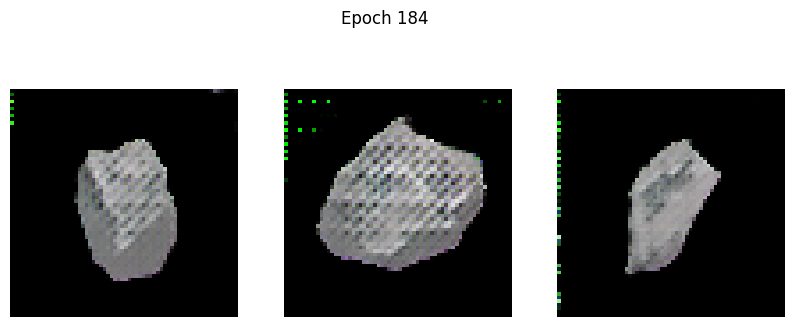

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.1782 - g_loss: 2.9130
Epoch 185/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2.0600 - g_loss: 4.8405

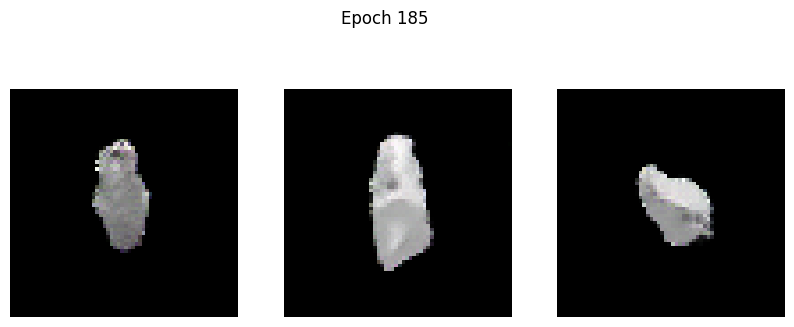

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 2.0303 - g_loss: 4.8286
Epoch 186/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.6395 - g_loss: 2.7572

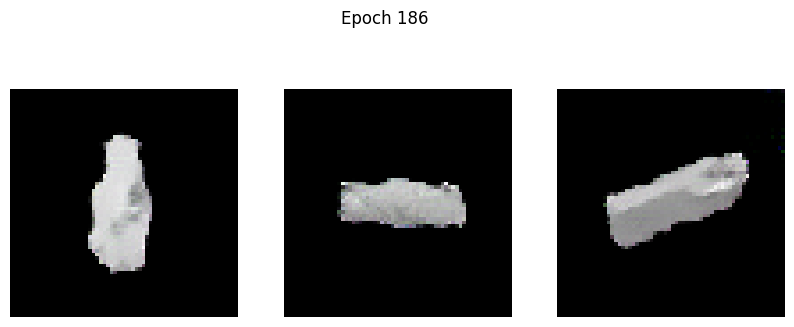

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.6399 - g_loss: 2.7574
Epoch 187/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.2179 - g_loss: 5.0553

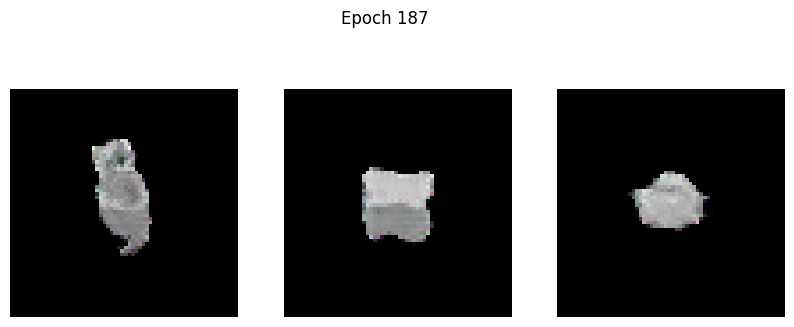

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.2149 - g_loss: 5.0551
Epoch 188/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.0735 - g_loss: 2.9352

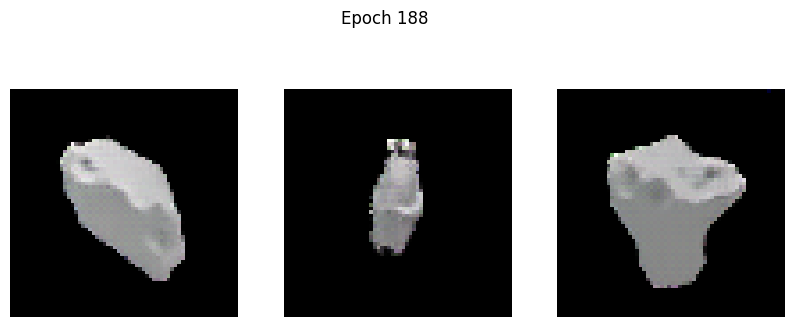

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.0788 - g_loss: 2.9337
Epoch 189/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.7356 - g_loss: 2.8697

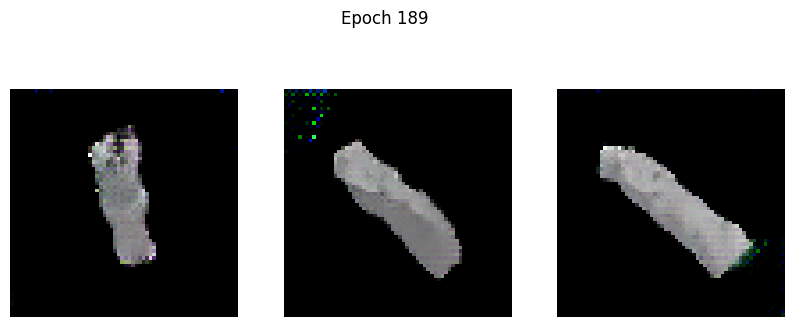

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.7322 - g_loss: 2.8704
Epoch 190/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.3049 - g_loss: 3.5445

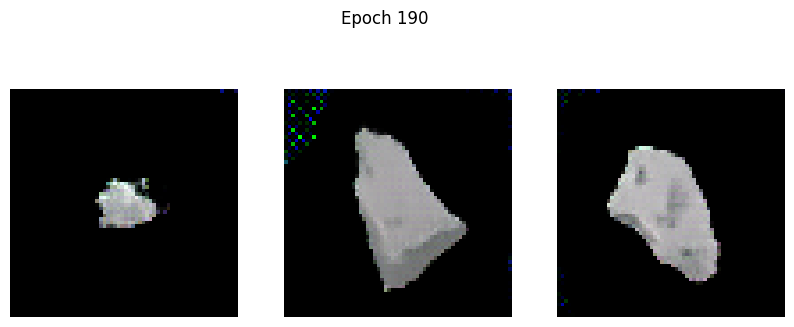

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.3121 - g_loss: 3.5427
Epoch 191/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.5442 - g_loss: 3.5008

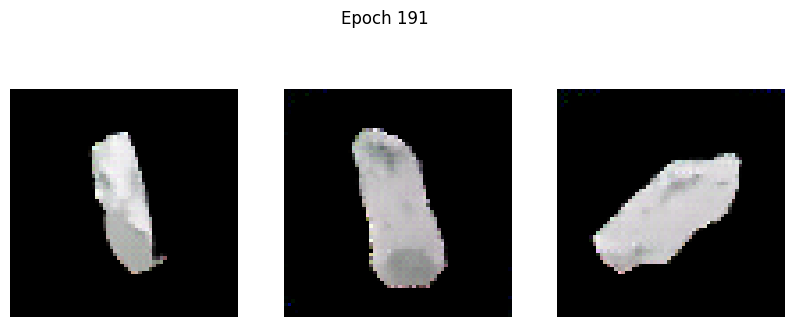

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.5407 - g_loss: 3.5020
Epoch 192/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.0409 - g_loss: 3.2561

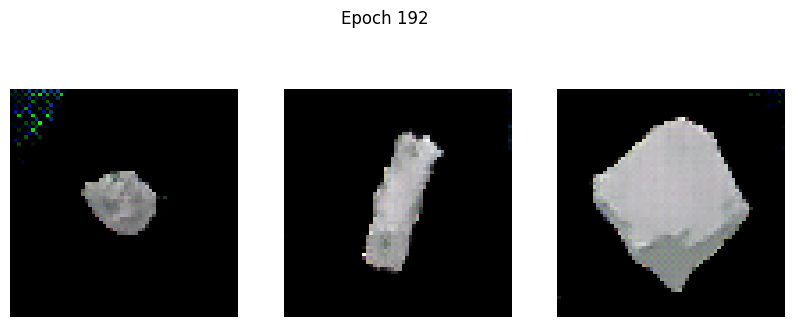

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.0489 - g_loss: 3.2546
Epoch 193/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.9907 - g_loss: 3.1624

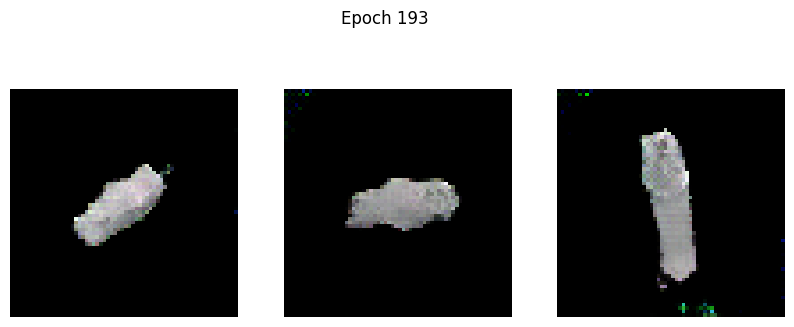

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -2.9939 - g_loss: 3.1608
Epoch 194/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.6020 - g_loss: 3.3520

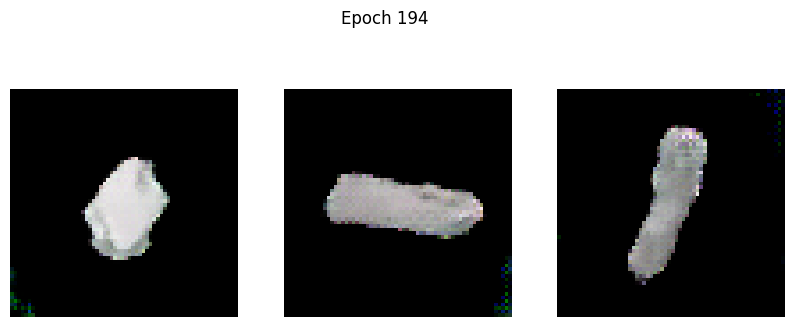

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.5943 - g_loss: 3.3536
Epoch 195/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.1019 - g_loss: 4.2119

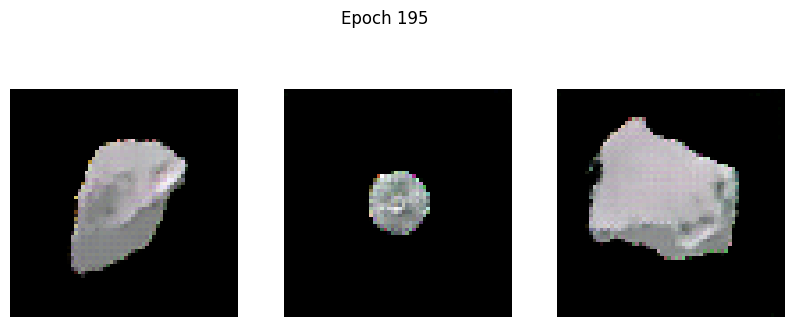

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.1083 - g_loss: 4.2090
Epoch 196/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.7359 - g_loss: 3.0318

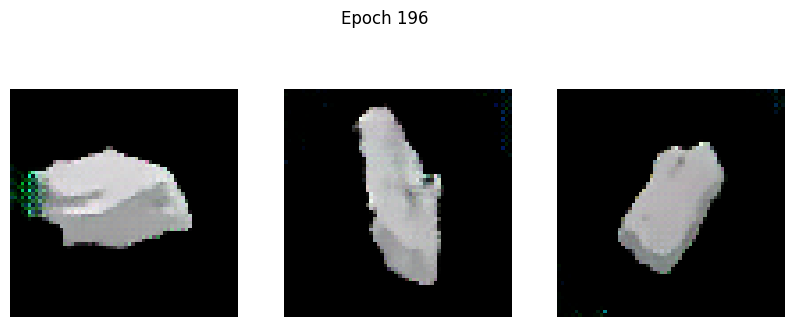

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.7317 - g_loss: 3.0314
Epoch 197/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.9169 - g_loss: 2.9816

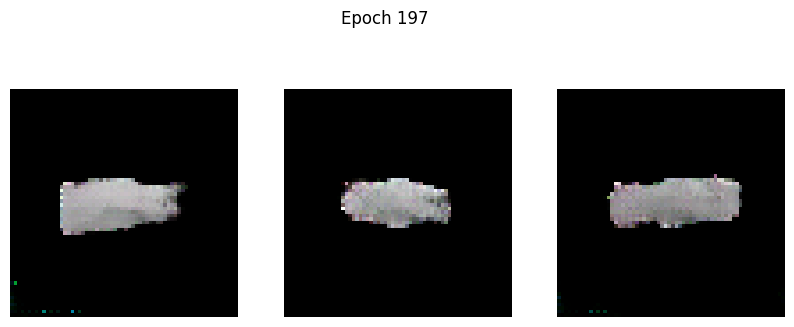

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.9144 - g_loss: 2.9827
Epoch 198/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.8442 - g_loss: 3.2856

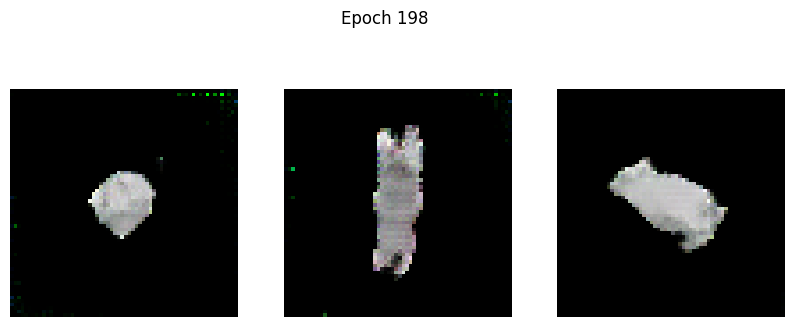

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.8441 - g_loss: 3.2877
Epoch 199/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.2551 - g_loss: 3.8680

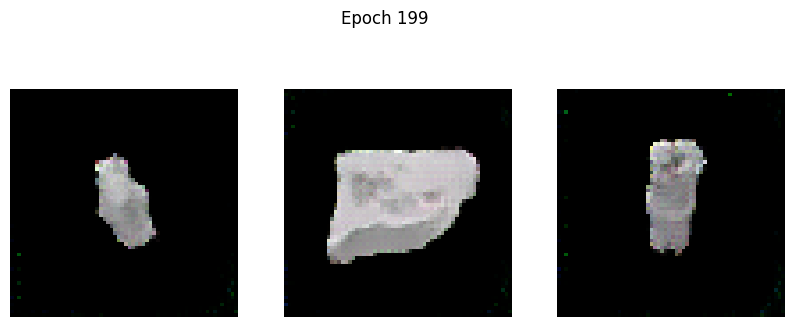

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.2708 - g_loss: 3.8657
Epoch 200/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.2914 - g_loss: 3.3929

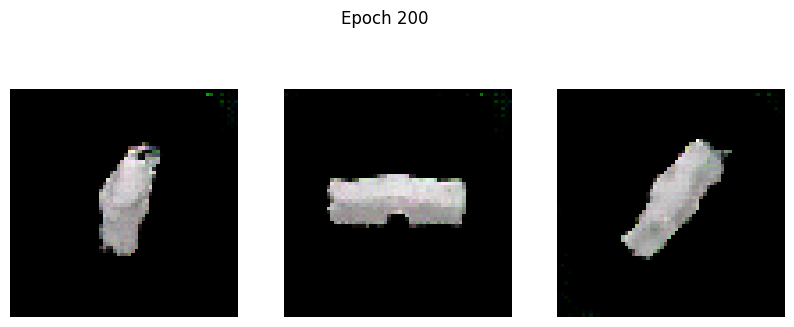

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.2883 - g_loss: 3.3936
Epoch 201/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.7228 - g_loss: 4.1438

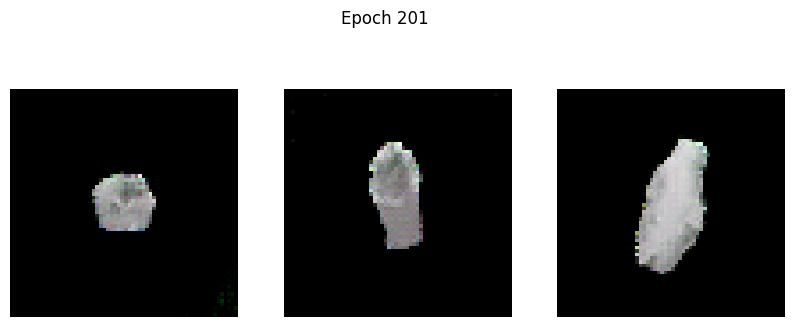

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.7351 - g_loss: 4.1447
Epoch 202/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.2365 - g_loss: 3.3017

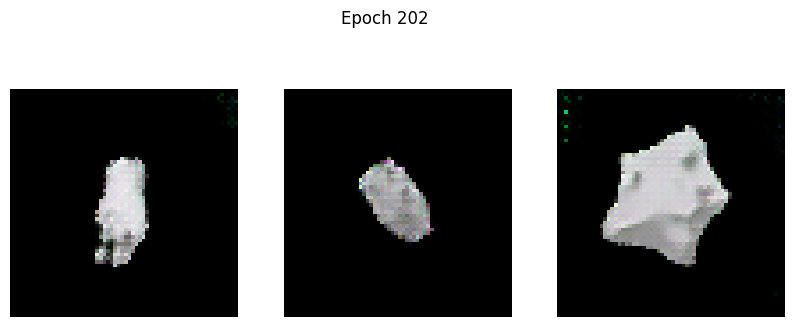

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.2381 - g_loss: 3.3021
Epoch 203/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.6810 - g_loss: 3.3725

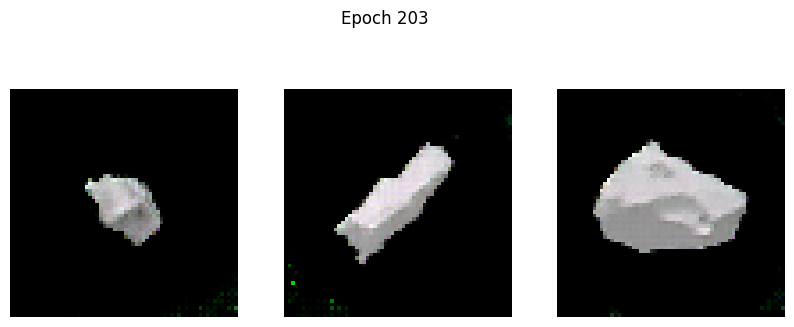

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.6824 - g_loss: 3.3713
Epoch 204/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.5076 - g_loss: 3.9040

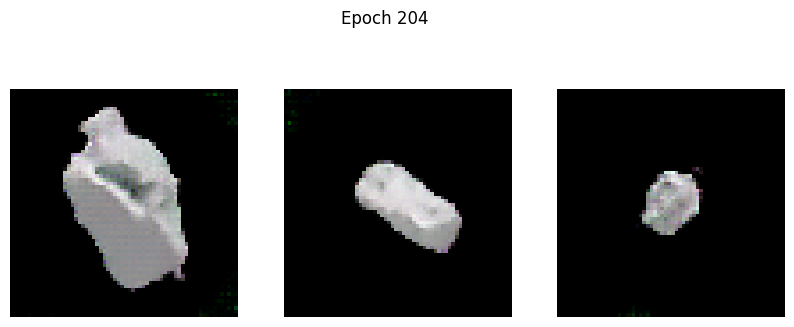

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.5062 - g_loss: 3.9021
Epoch 205/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.6458 - g_loss: 4.6975

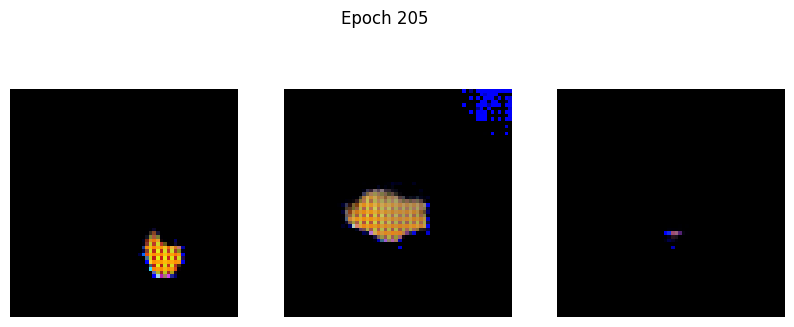

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.2102 - g_loss: 4.8558
Epoch 206/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 64.5442 - g_loss: 263.8083

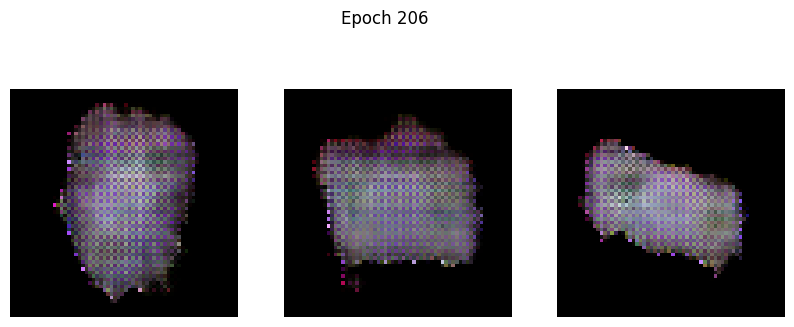

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 64.1619 - g_loss: 263.0879
Epoch 207/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 11.9434 - g_loss: 13.9221

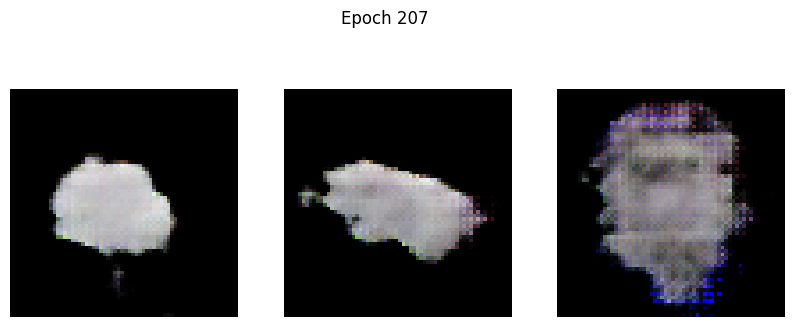

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 11.9211 - g_loss: 13.8910
Epoch 208/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2.7591 - g_loss: 6.6665

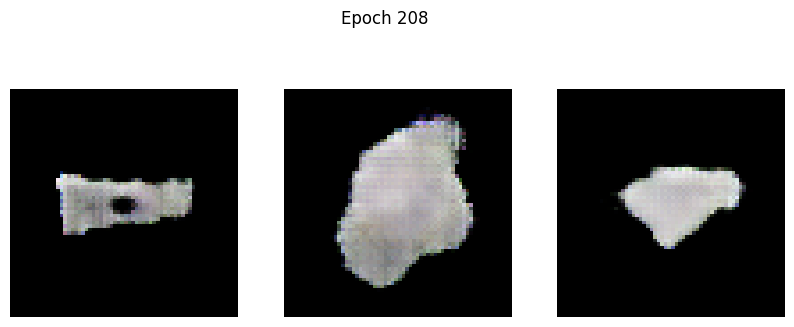

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 2.7500 - g_loss: 6.6585
Epoch 209/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5522 - g_loss: 4.6328

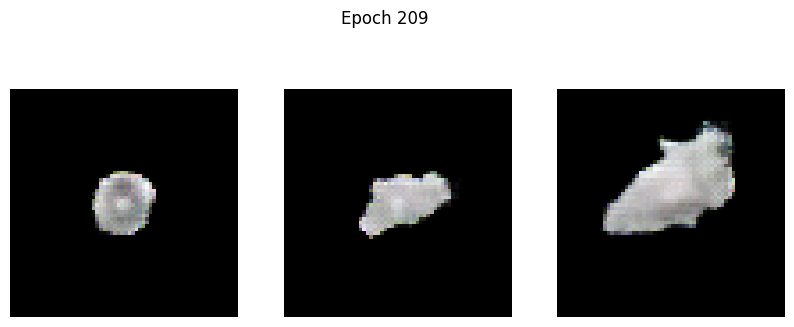

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5484 - g_loss: 4.6307
Epoch 210/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2909 - g_loss: 3.8475

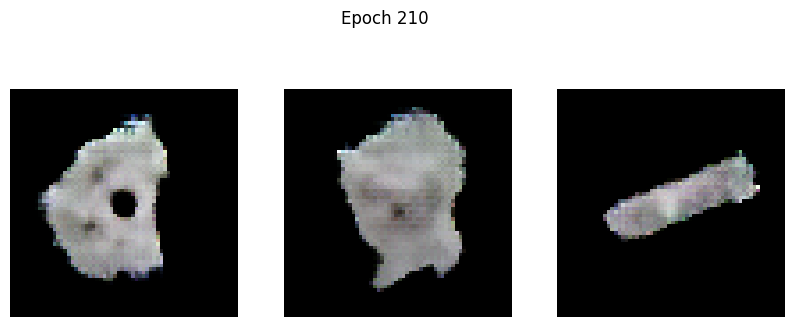

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2850 - g_loss: 3.8470
Epoch 211/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0889 - g_loss: 3.5616

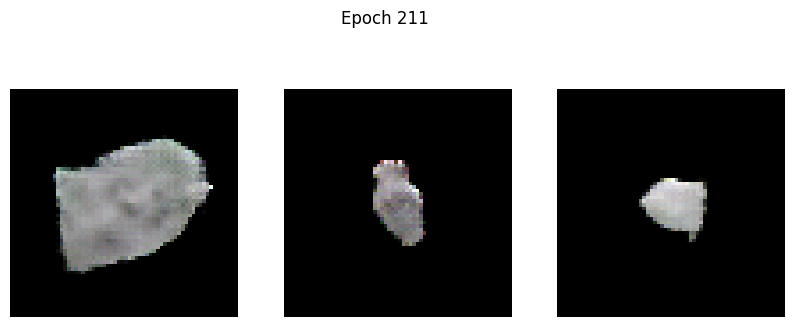

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0904 - g_loss: 3.5603
Epoch 212/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.6475 - g_loss: 3.3818

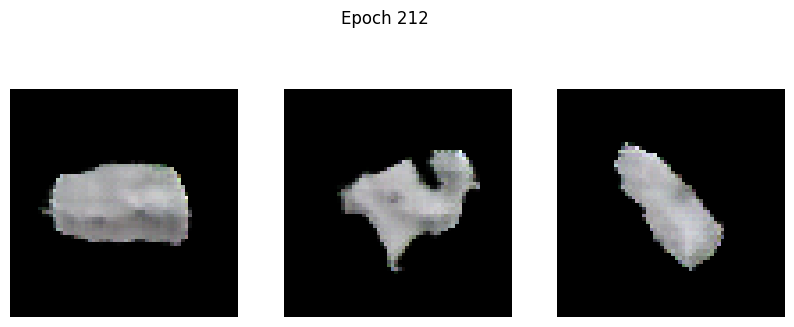

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.6491 - g_loss: 3.3802
Epoch 213/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.1878 - g_loss: 3.1844

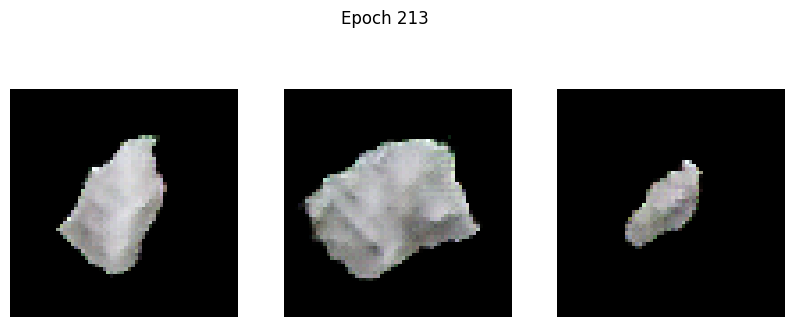

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.1861 - g_loss: 3.1843
Epoch 214/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.2706 - g_loss: 3.0774

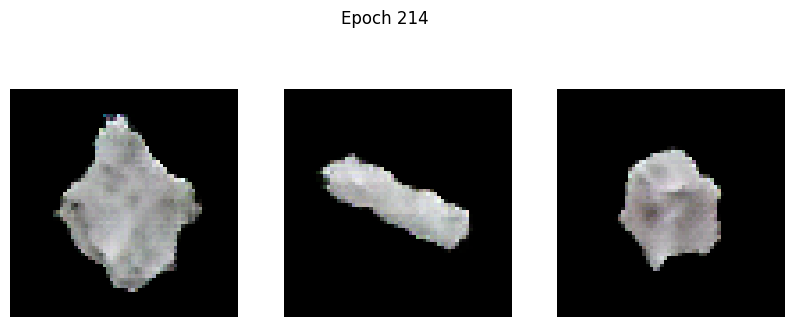

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.2698 - g_loss: 3.0774
Epoch 215/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.1940 - g_loss: 3.1619

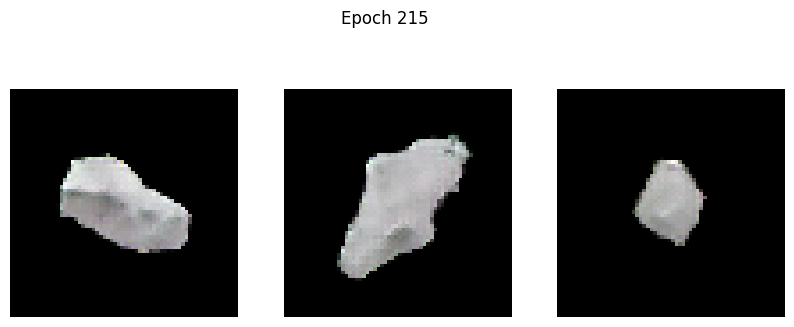

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.2002 - g_loss: 3.1612
Epoch 216/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.6309 - g_loss: 3.1032

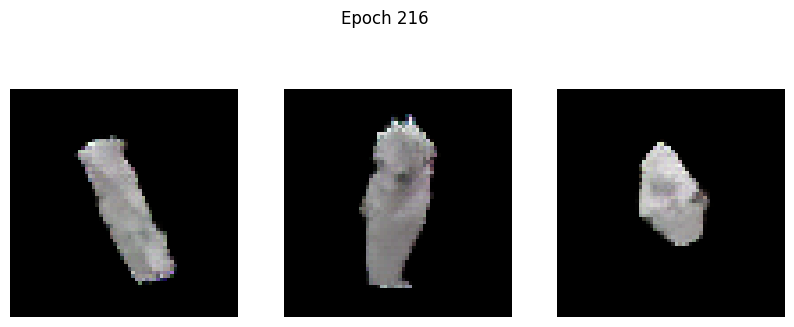

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.6318 - g_loss: 3.1029
Epoch 217/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.5528 - g_loss: 3.0000

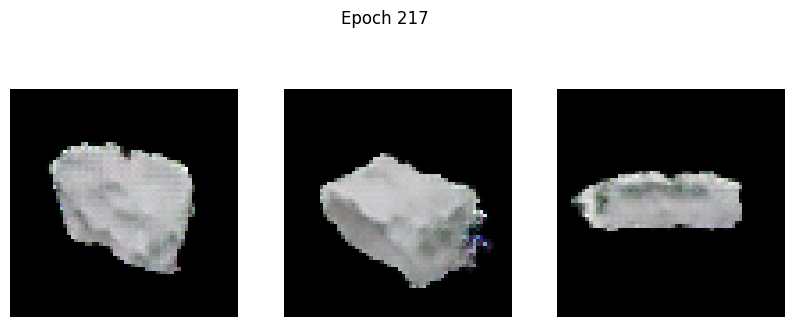

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.5541 - g_loss: 2.9998
Epoch 218/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.4558 - g_loss: 2.9830

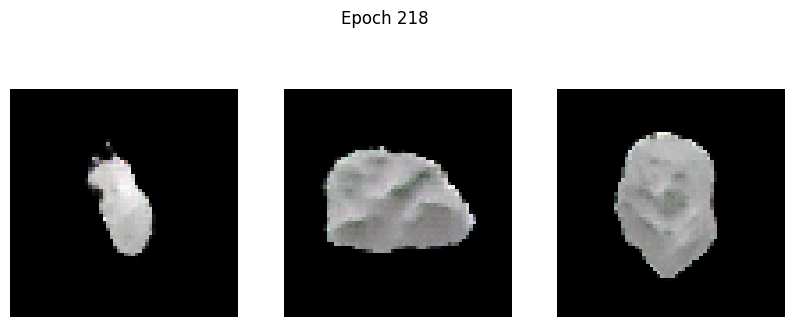

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.4601 - g_loss: 2.9835
Epoch 219/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.6095 - g_loss: 2.9303

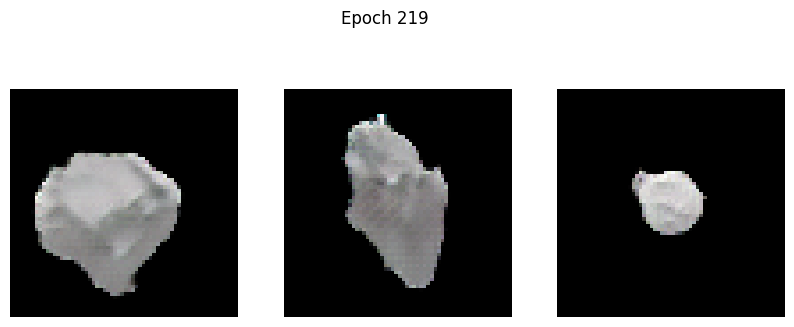

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.6095 - g_loss: 2.9310
Epoch 220/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.8200 - g_loss: 2.9114

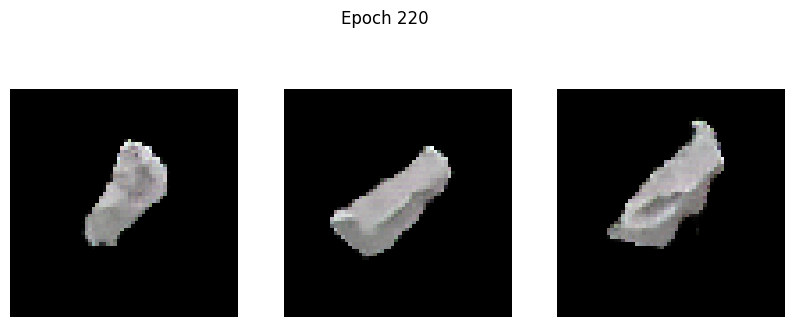

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.8199 - g_loss: 2.9114
Epoch 221/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.8319 - g_loss: 2.9521

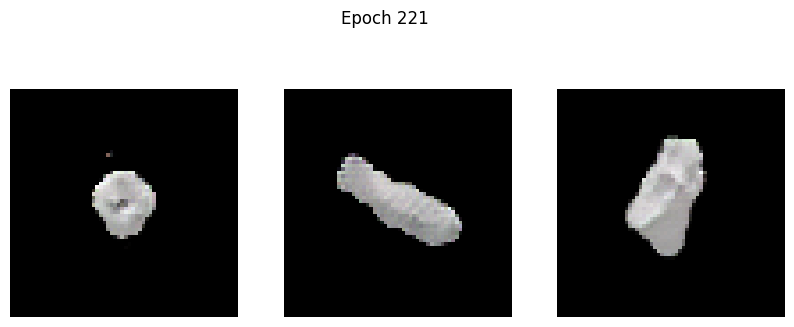

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.8292 - g_loss: 2.9517
Epoch 222/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.6739 - g_loss: 3.0089

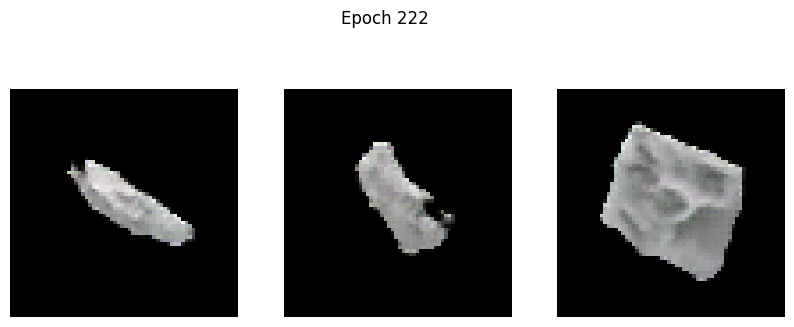

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.6798 - g_loss: 3.0089
Epoch 223/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.9601 - g_loss: 2.9347

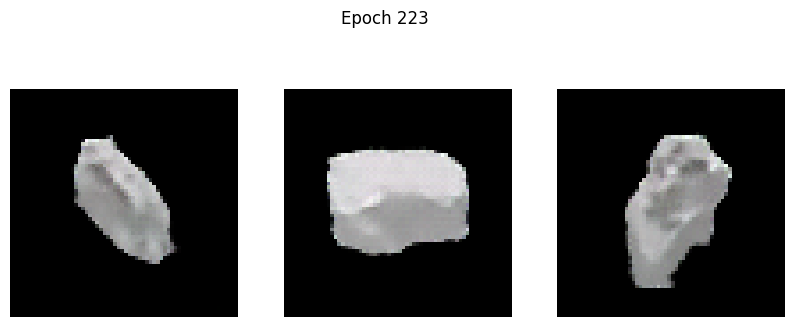

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.9496 - g_loss: 2.9348
Epoch 224/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.2662 - g_loss: 3.2730

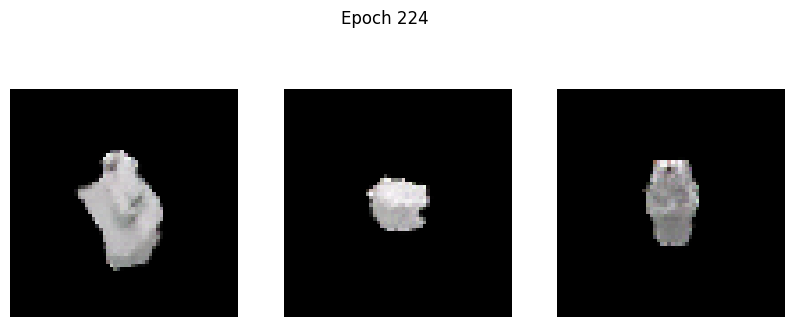

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.2599 - g_loss: 3.2720
Epoch 225/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.6585 - g_loss: 3.0760

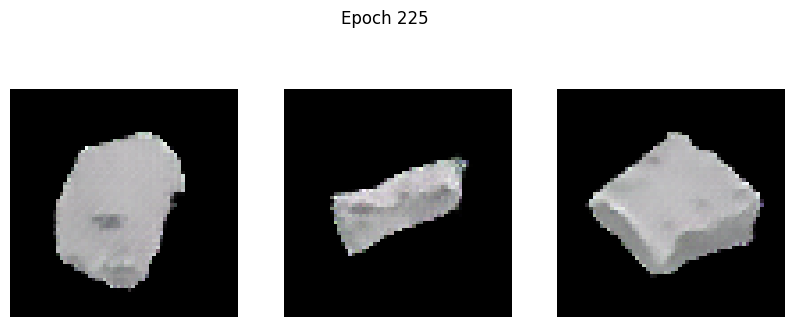

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.6617 - g_loss: 3.0762
Epoch 226/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.4746 - g_loss: 3.6214

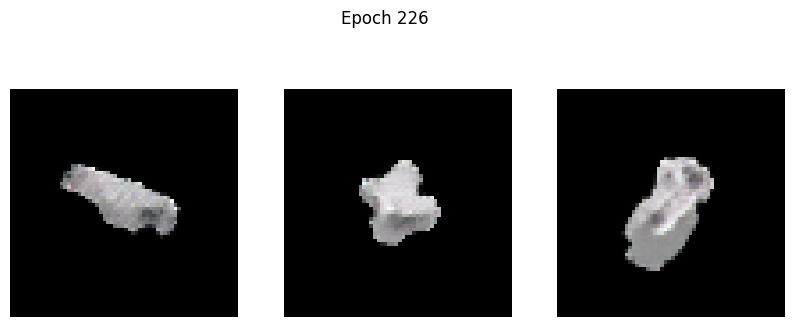

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.4716 - g_loss: 3.6210
Epoch 227/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.3782 - g_loss: 3.4793

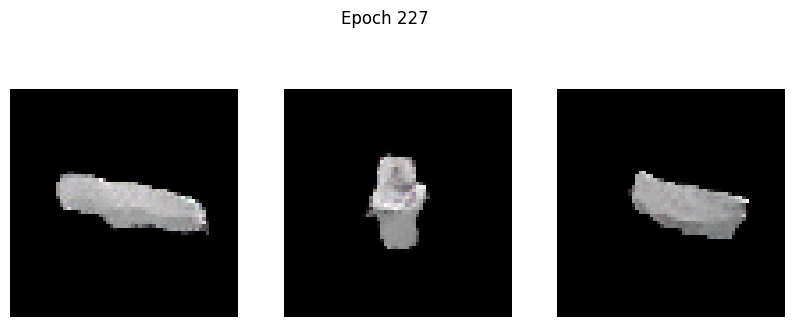

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.3751 - g_loss: 3.4790
Epoch 228/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.6101 - g_loss: 3.4215

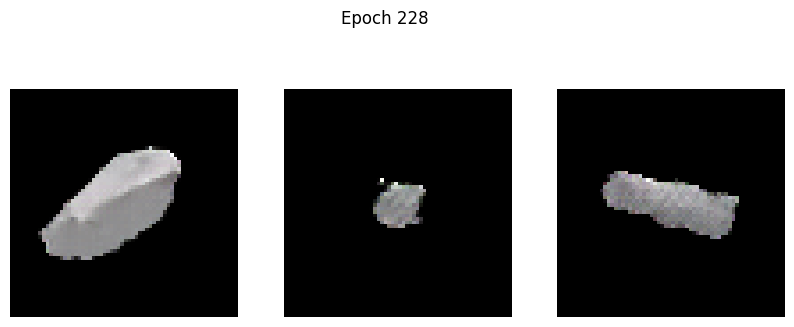

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.6028 - g_loss: 3.4223
Epoch 229/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.5972 - g_loss: 3.3640

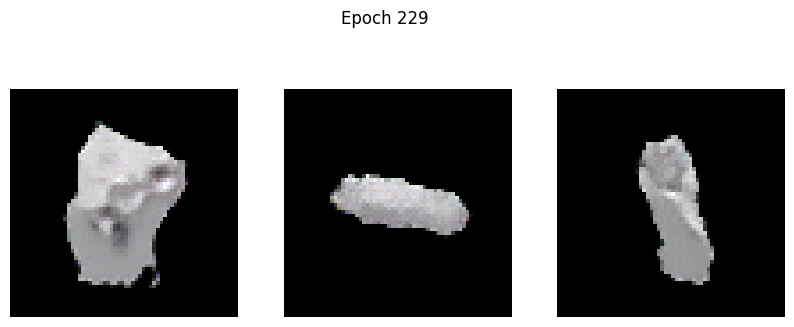

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.6068 - g_loss: 3.3650
Epoch 230/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.6831 - g_loss: 3.4707

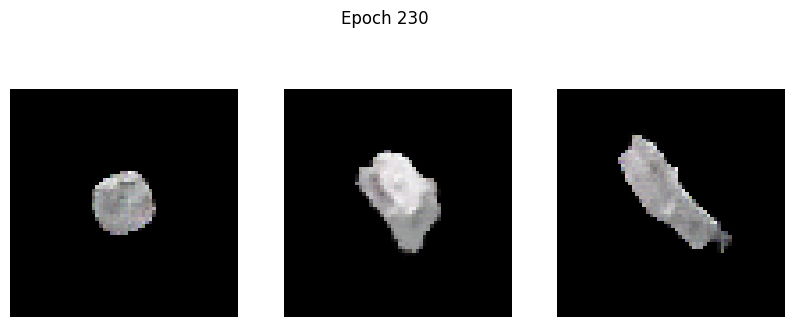

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.6906 - g_loss: 3.4722
Epoch 231/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.8348 - g_loss: 3.6512

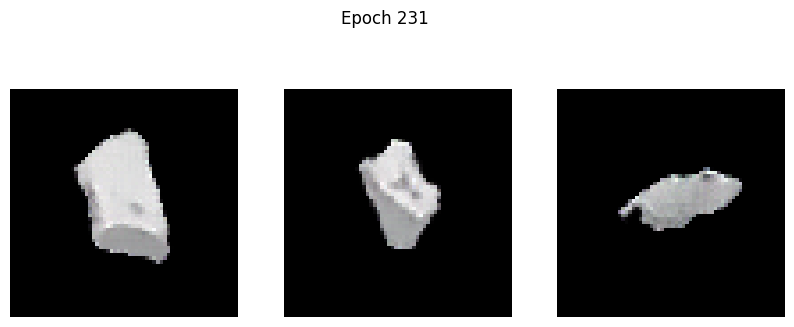

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.8353 - g_loss: 3.6521
Epoch 232/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.0145 - g_loss: 3.7001

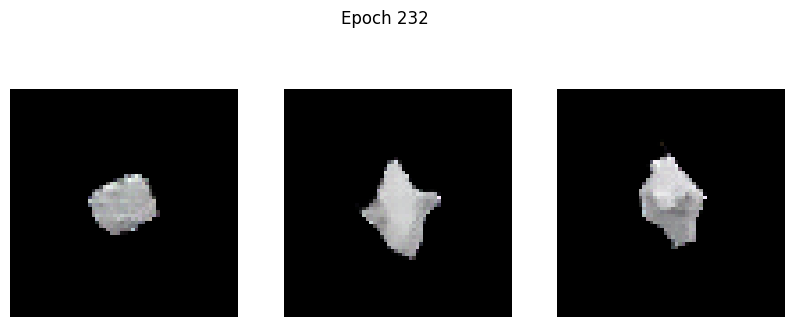

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.0021 - g_loss: 3.7017
Epoch 233/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.2838 - g_loss: 3.8493

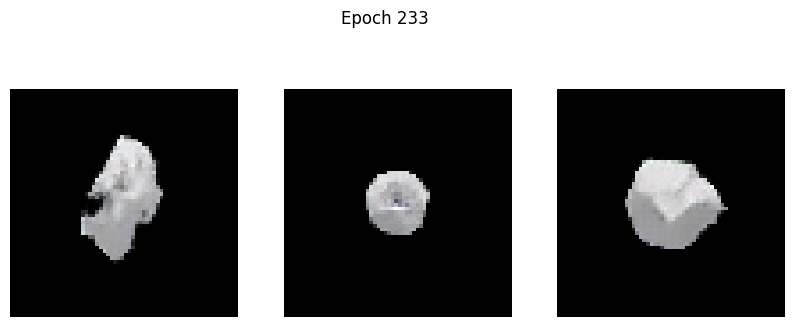

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.2798 - g_loss: 3.8493
Epoch 234/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.3964 - g_loss: 4.2023

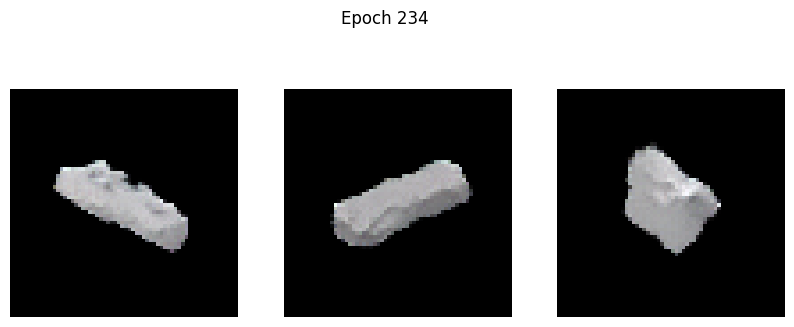

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.3854 - g_loss: 4.2055
Epoch 235/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.9686 - g_loss: 3.6455

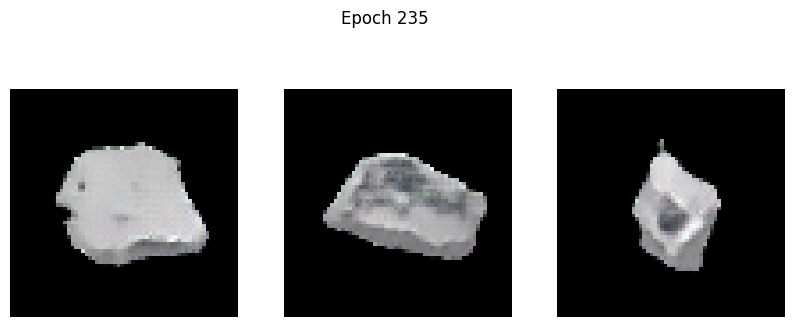

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.9637 - g_loss: 3.6459
Epoch 236/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.4548 - g_loss: 4.0016

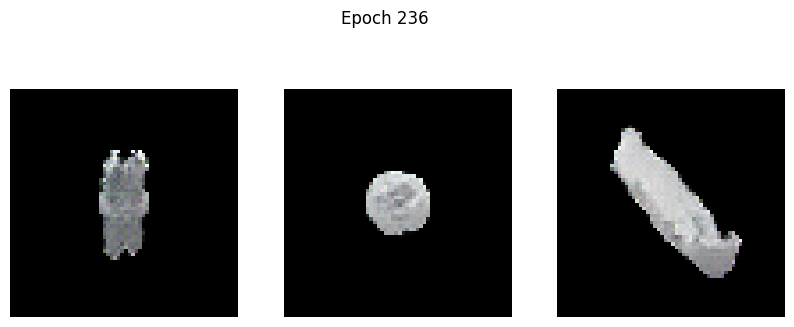

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.4338 - g_loss: 4.0029
Epoch 237/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.5565 - g_loss: 3.9471

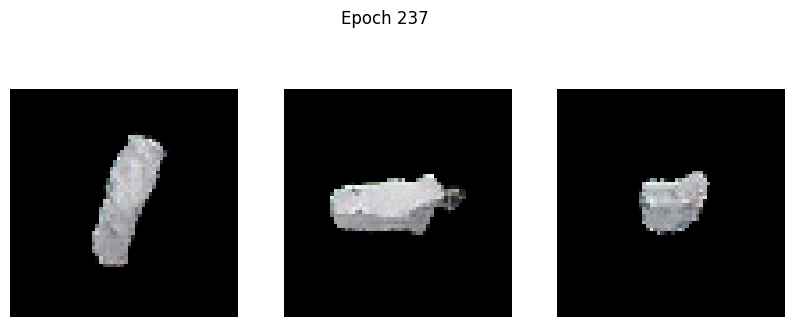

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -10.5345 - g_loss: 3.9493
Epoch 238/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.7120 - g_loss: 4.1374

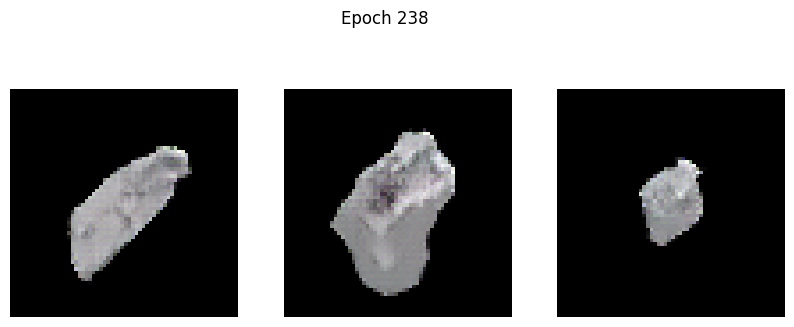

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.7098 - g_loss: 4.1371
Epoch 239/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.3042 - g_loss: 3.8458

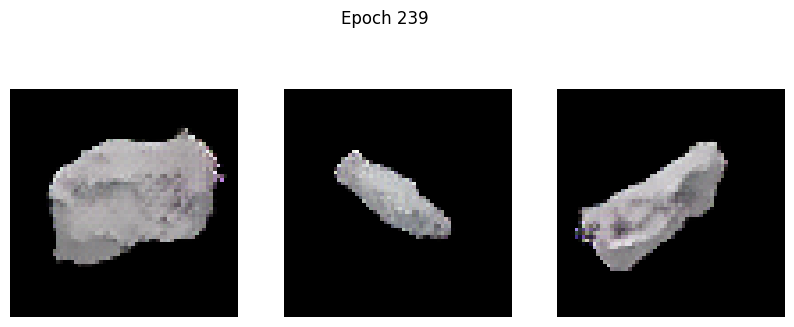

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.2968 - g_loss: 3.8485
Epoch 240/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.3284 - g_loss: 3.9845

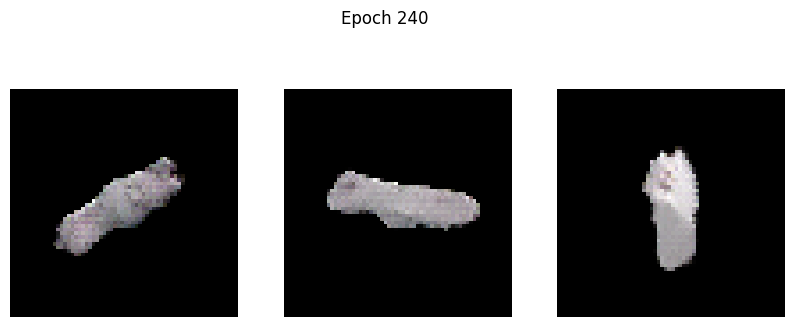

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.3136 - g_loss: 3.9863
Epoch 241/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.0351 - g_loss: 4.2293

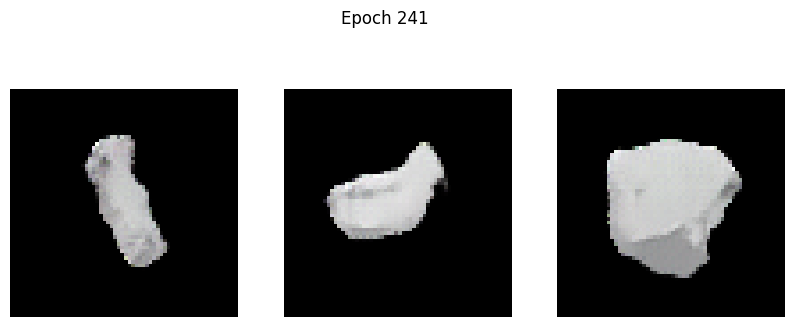

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.0587 - g_loss: 4.2298
Epoch 242/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.5555 - g_loss: 4.0041

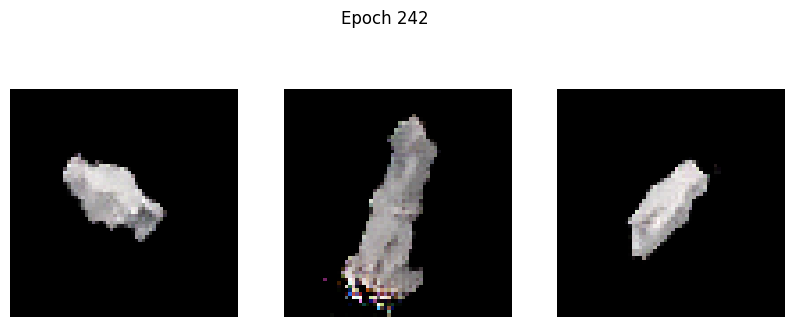

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.5708 - g_loss: 4.0079
Epoch 243/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.1023 - g_loss: 5.2316

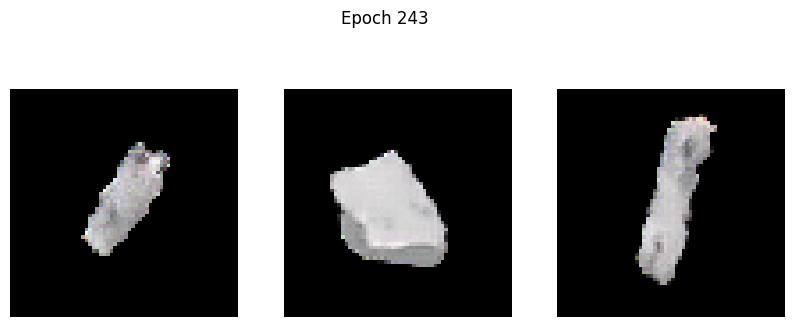

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.1319 - g_loss: 5.2298
Epoch 244/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.9122 - g_loss: 6.8851

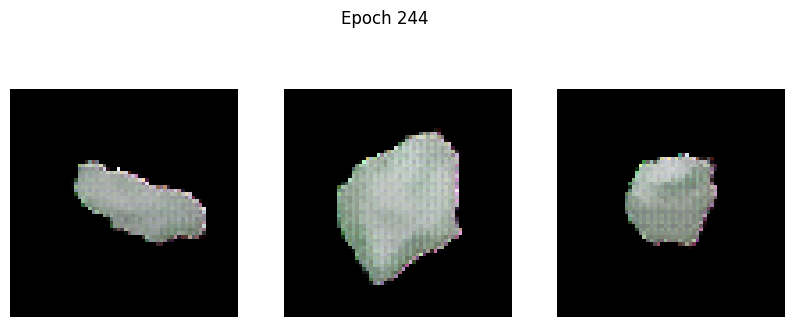

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.8417 - g_loss: 6.9071
Epoch 245/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.6264 - g_loss: 6.0991

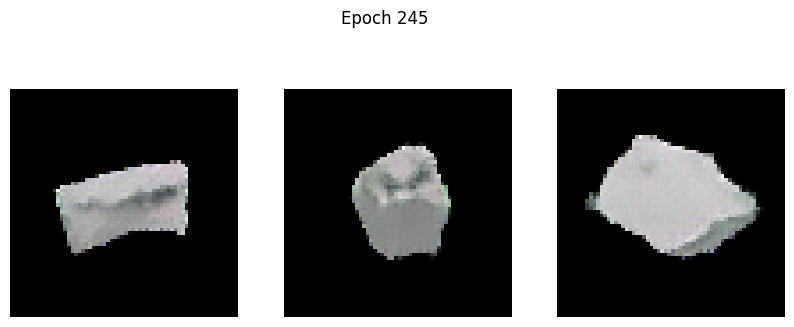

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -7.6339 - g_loss: 6.0915
Epoch 246/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.2729 - g_loss: 3.8952

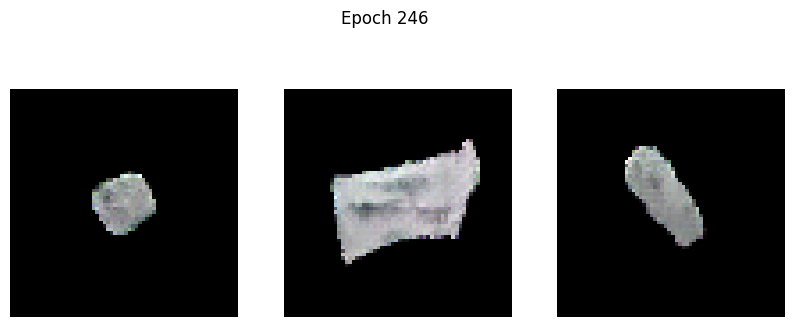

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.2850 - g_loss: 3.8942
Epoch 247/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 10.8616 - g_loss: 13.7873

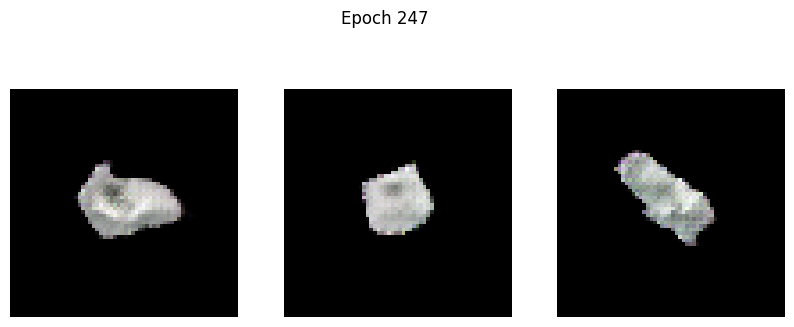

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 10.8792 - g_loss: 13.8245
Epoch 248/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.5908 - g_loss: 4.8596

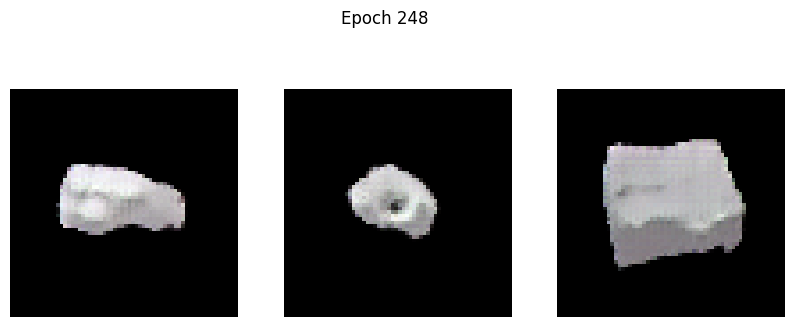

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.5755 - g_loss: 4.8562
Epoch 249/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -13.3391 - g_loss: 3.6774

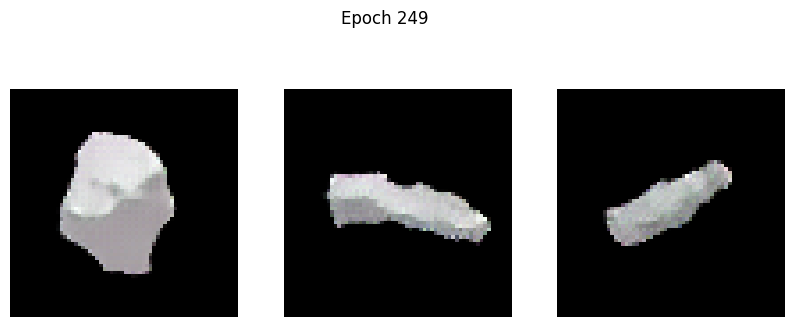

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -13.3263 - g_loss: 3.6778
Epoch 250/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -13.2464 - g_loss: 3.6081

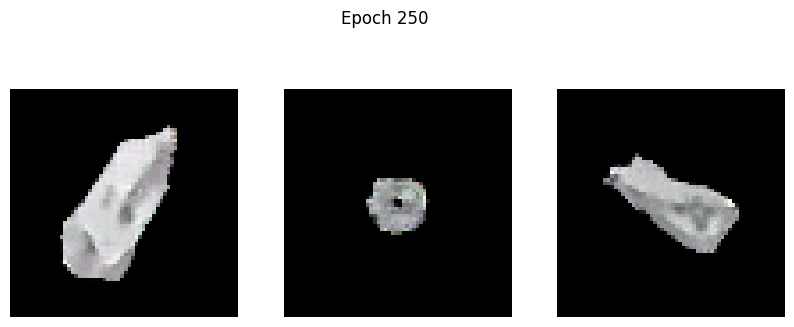

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.2602 - g_loss: 3.6095
Epoch 251/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.5435 - g_loss: 3.8300

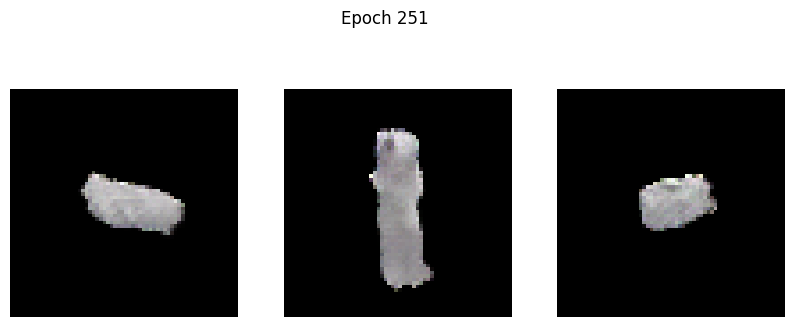

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.5546 - g_loss: 3.8309
Epoch 252/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -16.7980 - g_loss: 4.0368

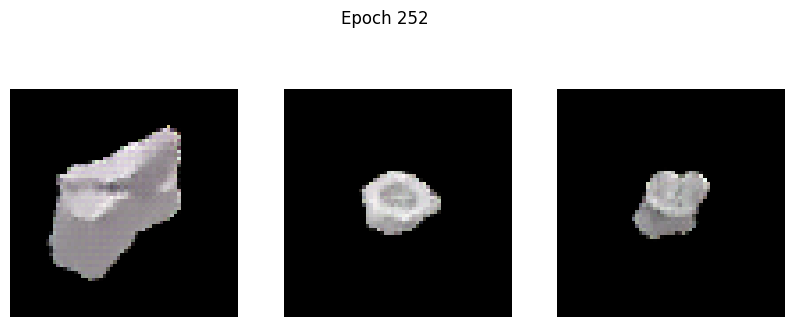

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -16.7914 - g_loss: 4.0381
Epoch 253/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.8599 - g_loss: 4.2631

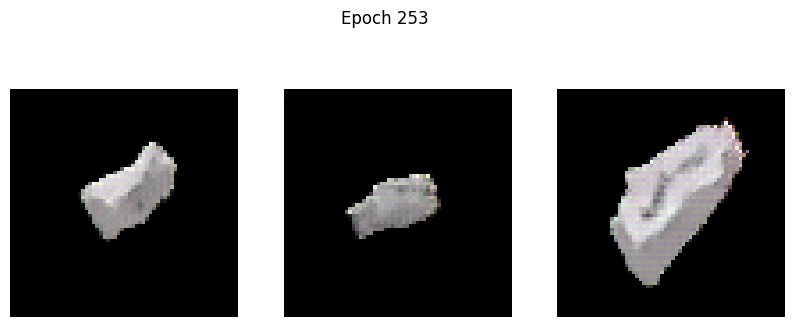

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -17.8562 - g_loss: 4.2654
Epoch 254/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.4066 - g_loss: 4.6166

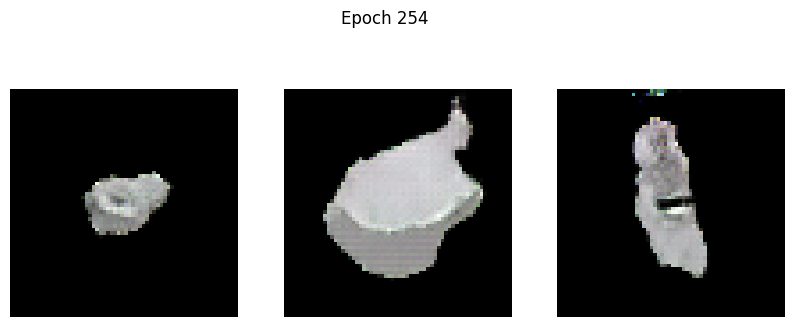

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.4389 - g_loss: 4.6180
Epoch 255/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.8458 - g_loss: 5.5331

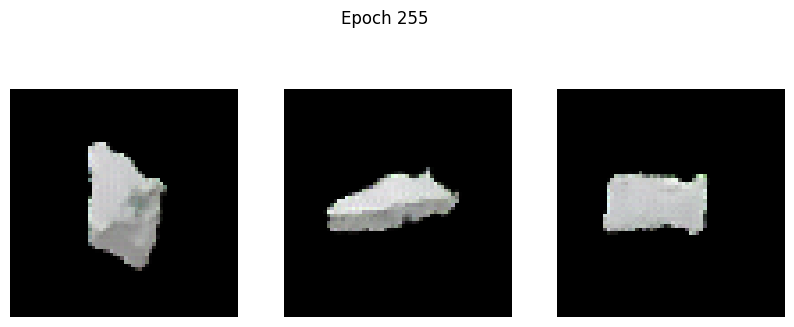

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.8550 - g_loss: 5.5284
Epoch 256/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.5603 - g_loss: 4.7132

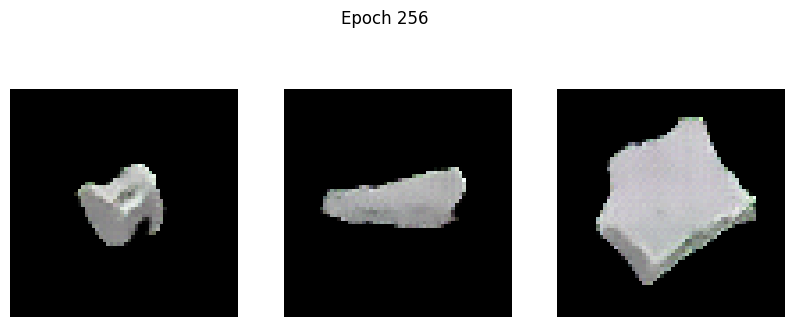

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -17.5745 - g_loss: 4.7110
Epoch 257/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.2905 - g_loss: 4.4827

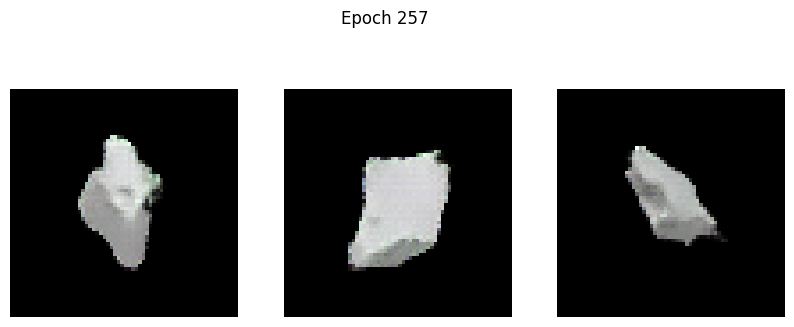

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.3199 - g_loss: 4.4838
Epoch 258/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.8354 - g_loss: 5.2619

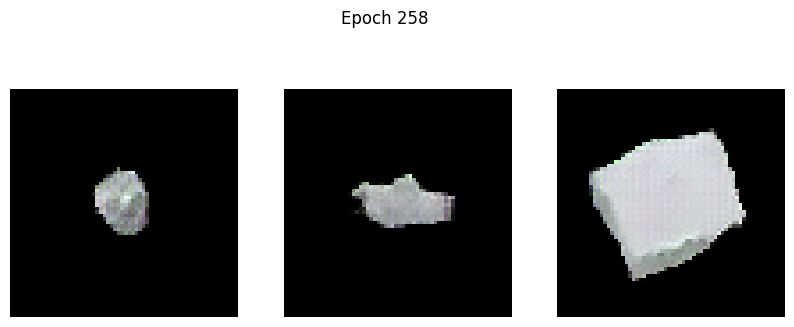

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -18.8155 - g_loss: 5.2645
Epoch 259/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 93.8411 - g_loss: 20.1599

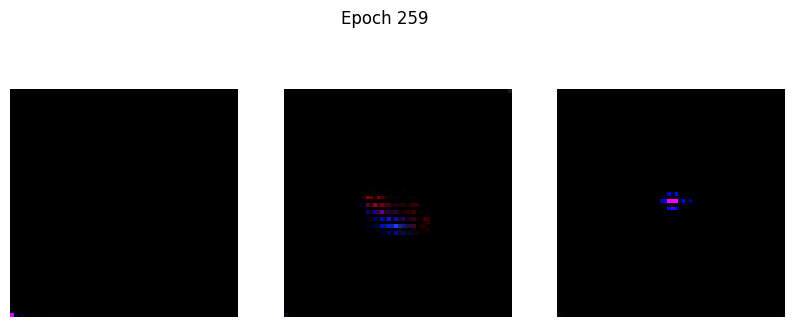

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 99.4989 - g_loss: 21.5426
Epoch 260/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 47.0473 - g_loss: 224.4085

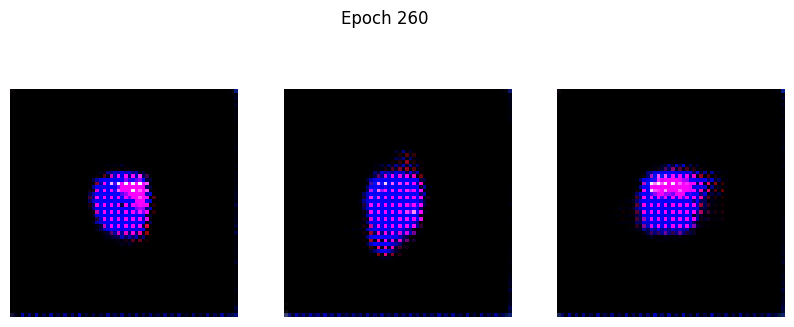

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 46.8610 - g_loss: 223.8219
Epoch 261/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.3680 - g_loss: 83.2531

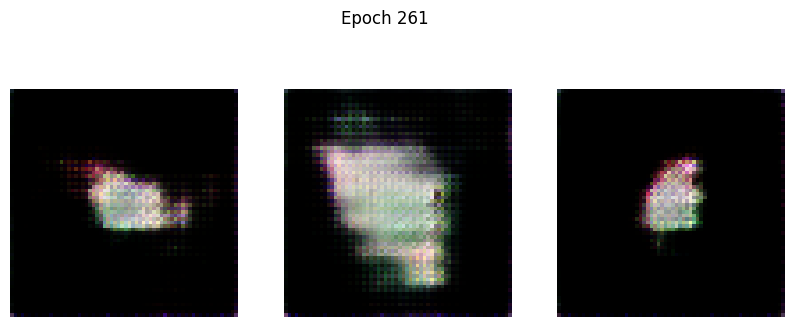

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.4717 - g_loss: 83.0640
Epoch 262/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 22.8890 - g_loss: 33.3413

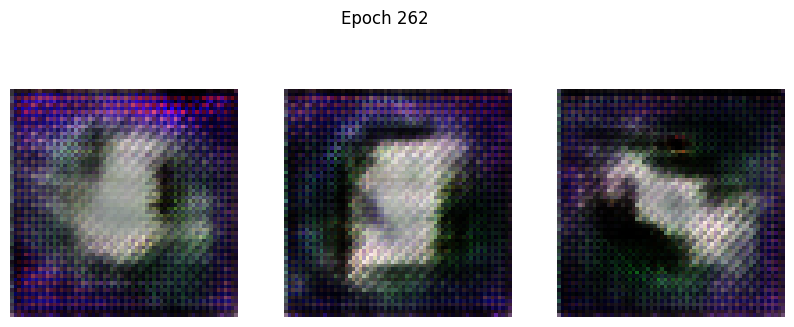

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 22.8082 - g_loss: 33.2859
Epoch 263/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 2.4174 - g_loss: 20.4750

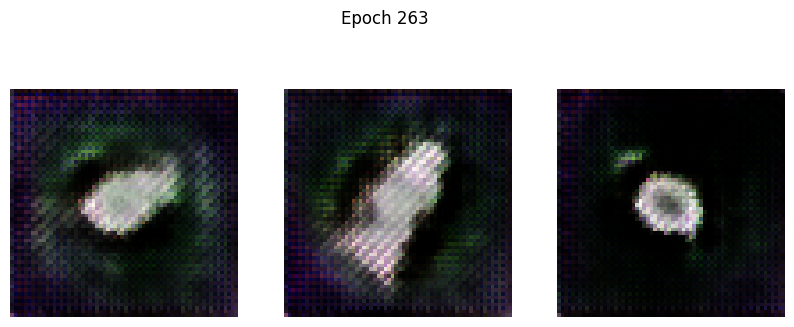

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 2.3985 - g_loss: 20.4654
Epoch 264/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -2.4946 - g_loss: 20.0348

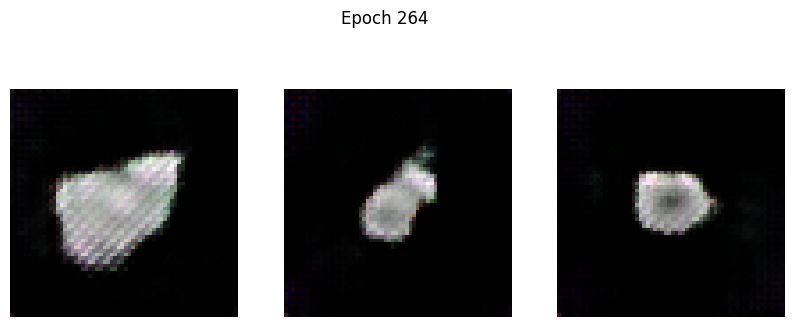

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -2.4920 - g_loss: 20.0423
Epoch 265/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -2.1039 - g_loss: 19.7035

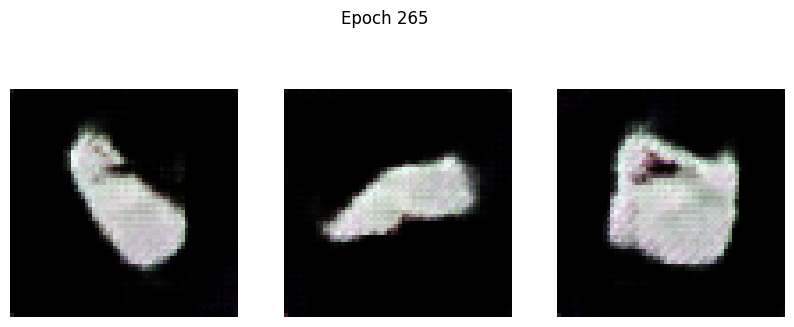

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -2.1135 - g_loss: 19.6923
Epoch 266/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.2561 - g_loss: 13.8830

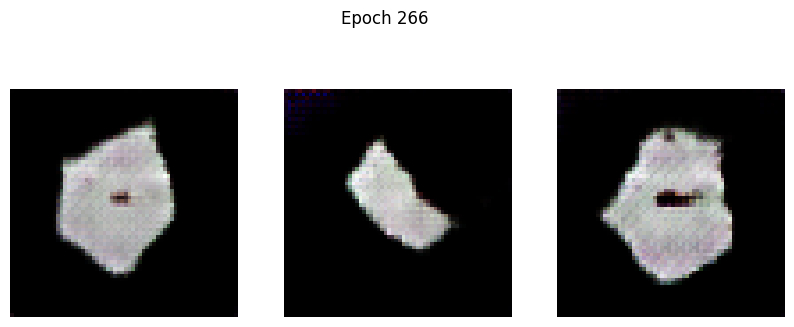

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.2803 - g_loss: 13.8787
Epoch 267/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -7.4127 - g_loss: 10.5541

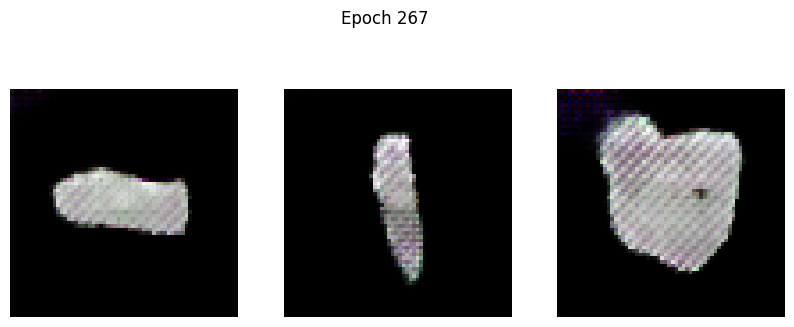

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -7.3908 - g_loss: 10.5548
Epoch 268/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.4243 - g_loss: 9.5534

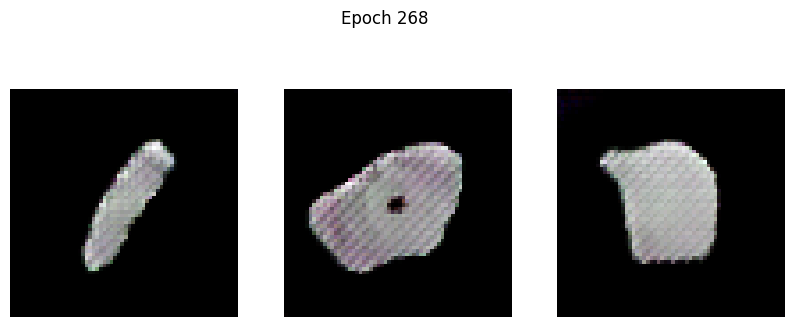

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -3.4418 - g_loss: 9.5525
Epoch 269/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.8290 - g_loss: 7.9863

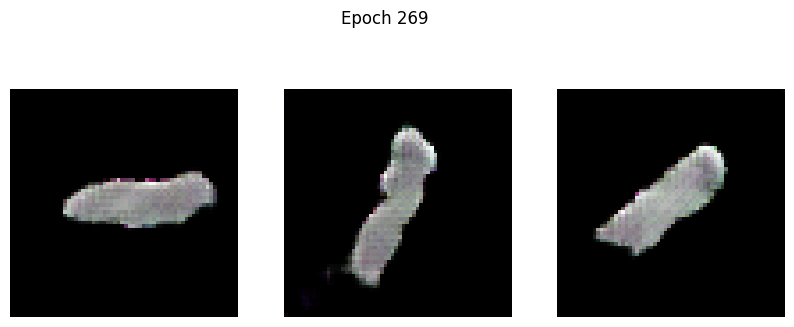

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.8060 - g_loss: 7.9876
Epoch 270/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.4459 - g_loss: 7.1428

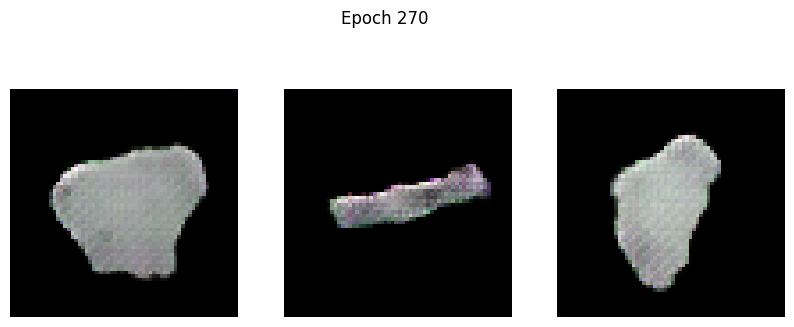

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.4596 - g_loss: 7.1445
Epoch 271/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.7944 - g_loss: 7.1233

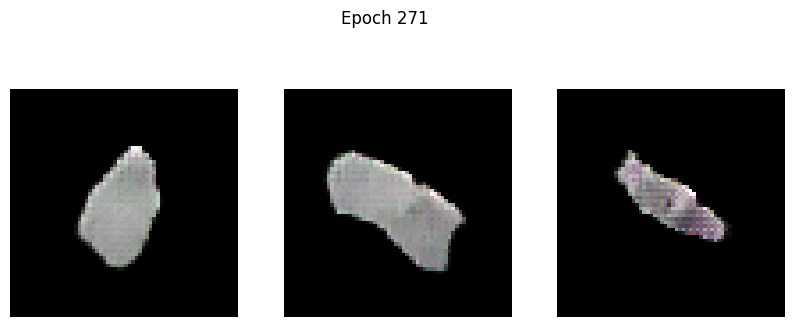

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.8059 - g_loss: 7.1216
Epoch 272/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.9983 - g_loss: 6.6417

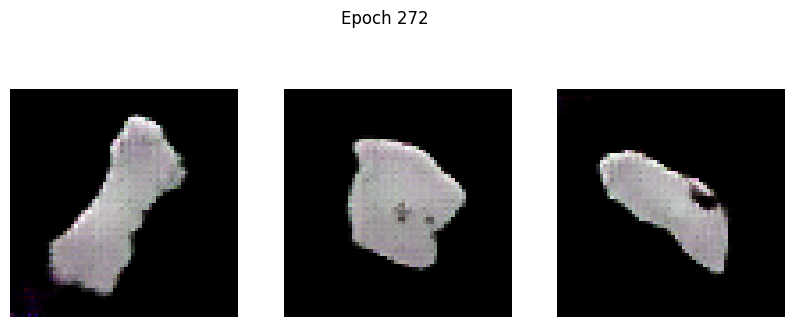

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -9.9988 - g_loss: 6.6422
Epoch 273/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.6293 - g_loss: 6.6217

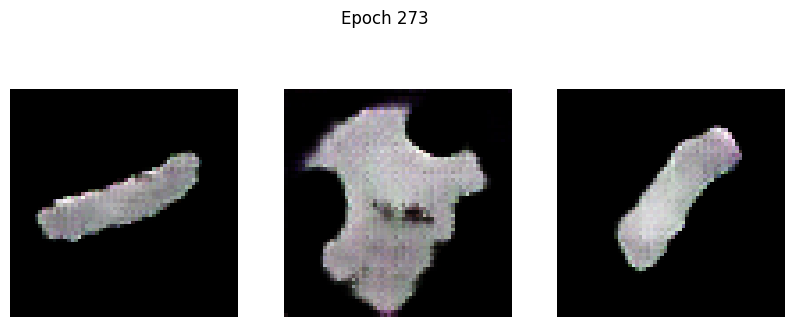

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.6176 - g_loss: 6.6194
Epoch 274/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.4551 - g_loss: 6.3068

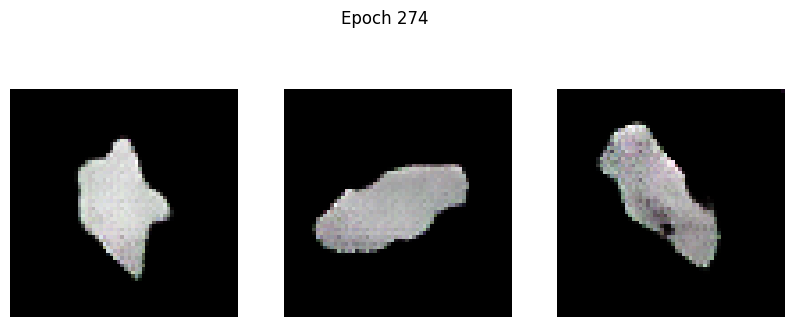

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -12.4373 - g_loss: 6.3066
Epoch 275/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.5717 - g_loss: 5.9392

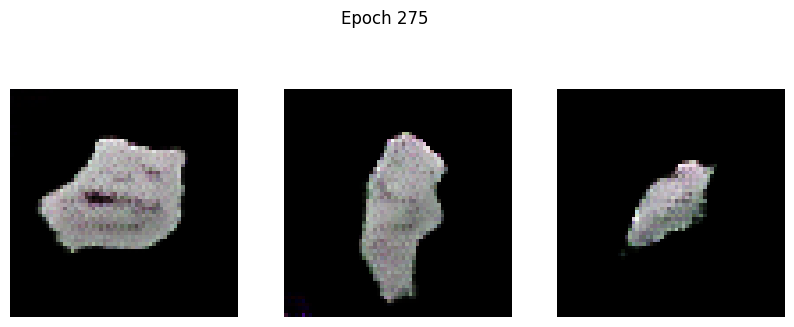

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.5893 - g_loss: 5.9398
Epoch 276/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.9346 - g_loss: 5.3101

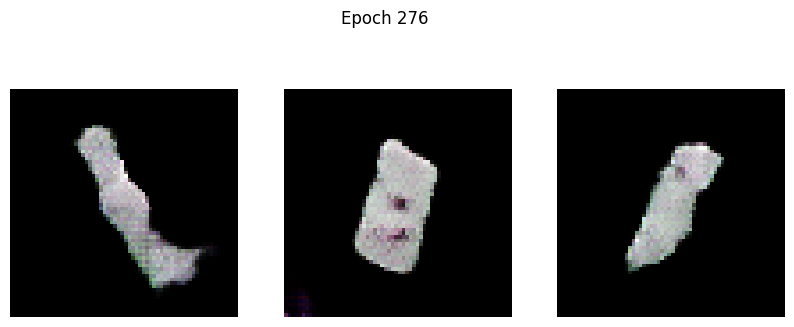

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.9329 - g_loss: 5.3119
Epoch 277/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.9256 - g_loss: 5.5640

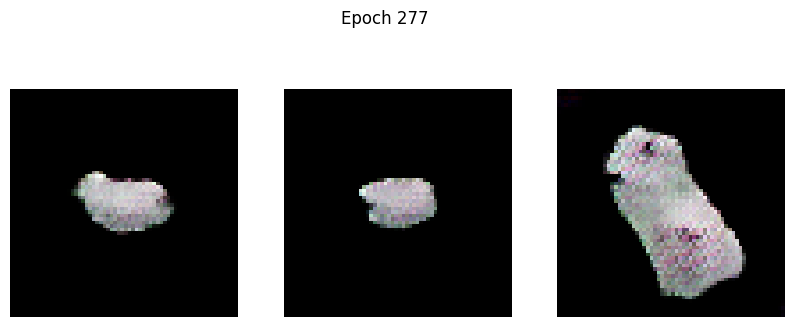

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.9207 - g_loss: 5.5642
Epoch 278/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.5027 - g_loss: 5.0824

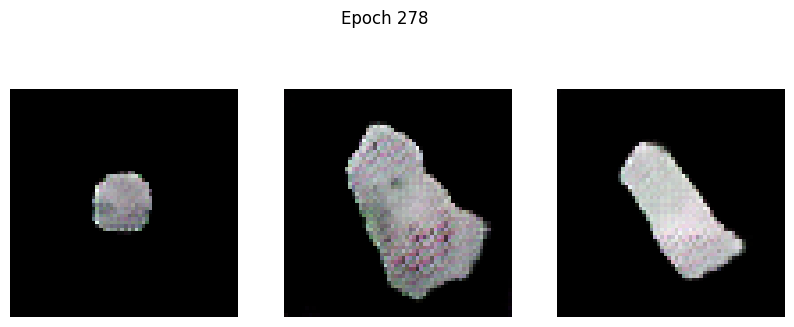

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.5075 - g_loss: 5.0836
Epoch 279/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.1751 - g_loss: 5.3412

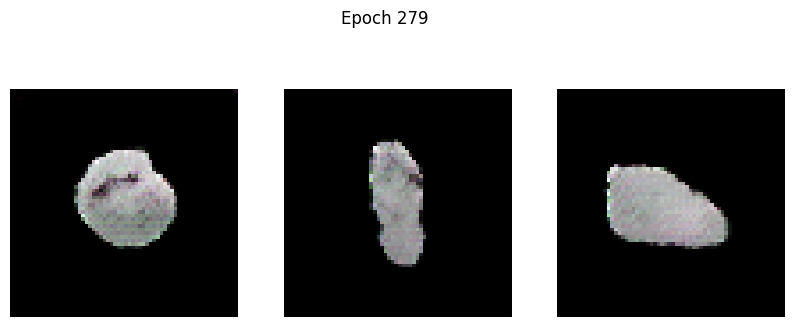

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.1540 - g_loss: 5.3407
Epoch 280/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.5489 - g_loss: 5.7462

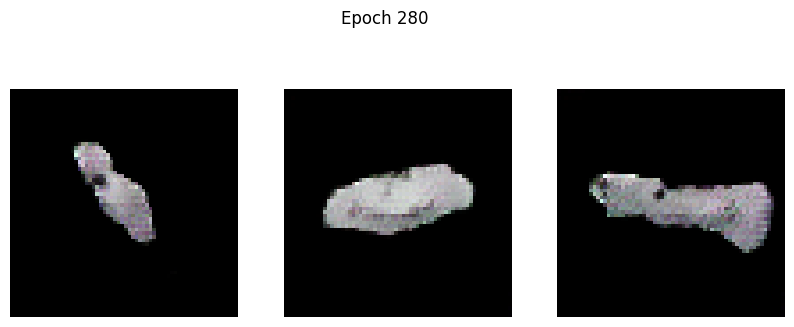

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.5268 - g_loss: 5.7422
Epoch 281/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.1462 - g_loss: 5.4028

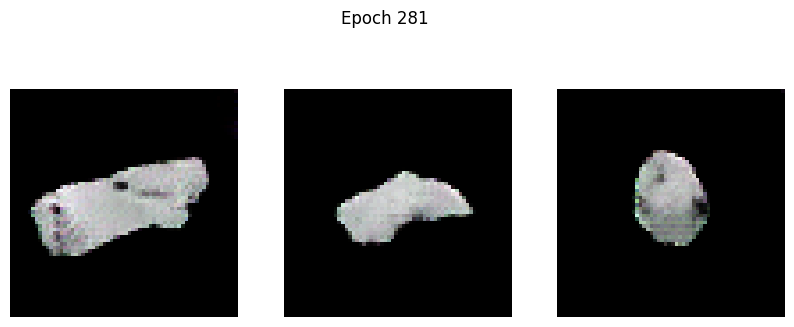

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.1463 - g_loss: 5.4012
Epoch 282/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.3920 - g_loss: 5.4972

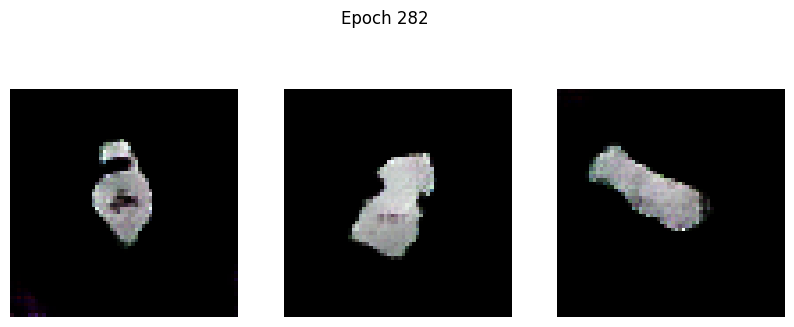

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.4092 - g_loss: 5.4940
Epoch 283/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.9384 - g_loss: 5.4621

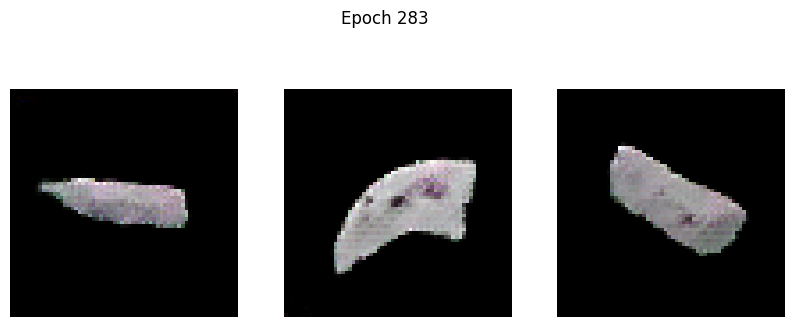

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.9427 - g_loss: 5.4598
Epoch 284/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.1957 - g_loss: 4.9060

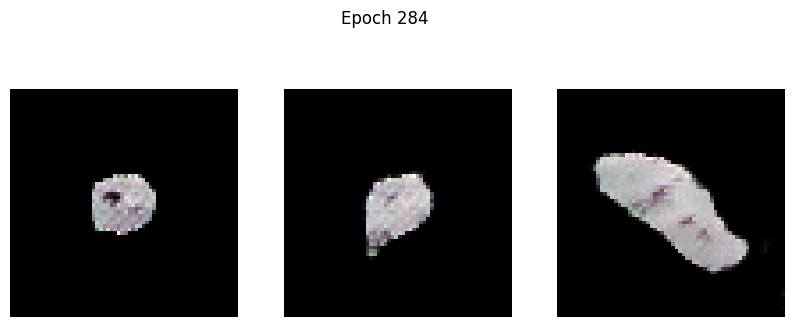

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.2187 - g_loss: 4.9077
Epoch 285/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -16.3556 - g_loss: 5.0283

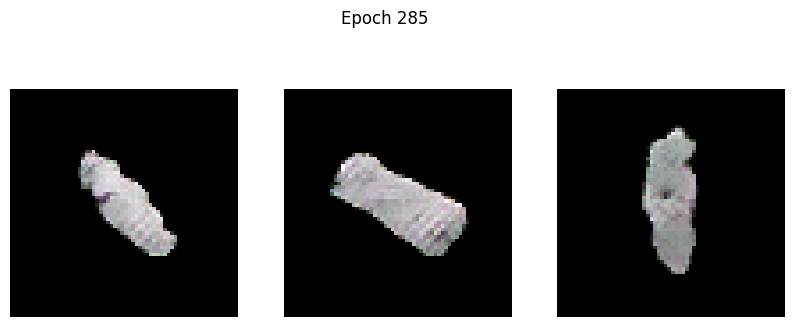

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -16.3521 - g_loss: 5.0272
Epoch 286/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.2014 - g_loss: 4.9224

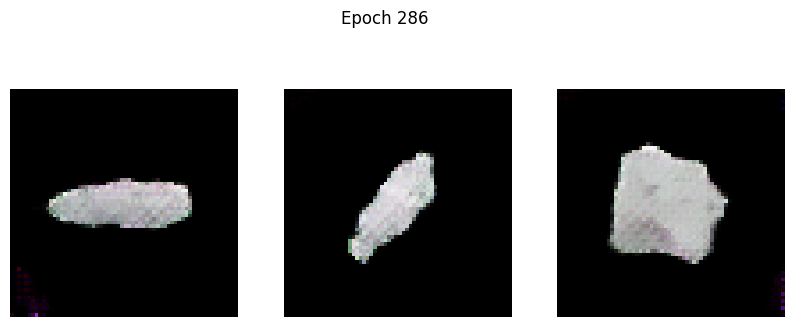

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.2135 - g_loss: 4.9220
Epoch 287/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.5392 - g_loss: 4.8536

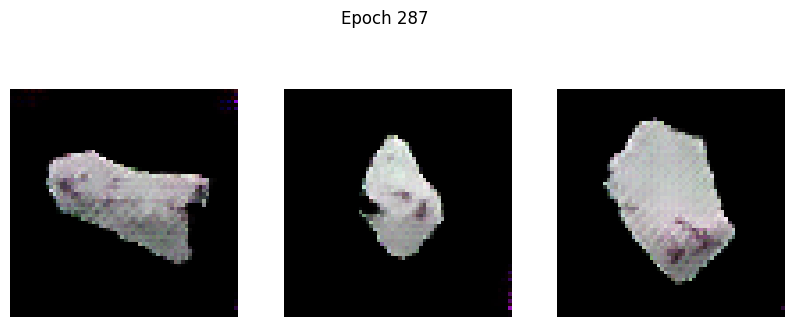

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.5538 - g_loss: 4.8537
Epoch 288/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -13.2792 - g_loss: 4.8670

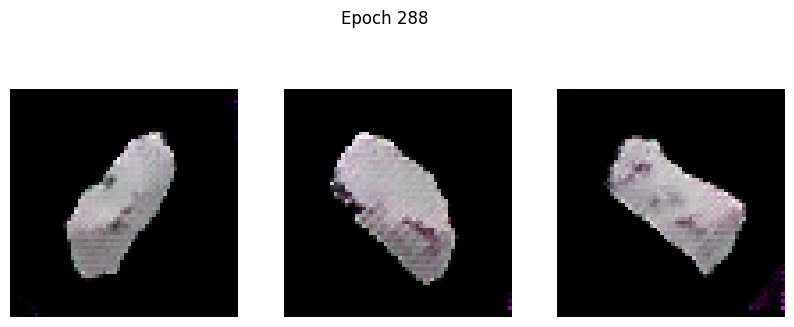

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -13.2971 - g_loss: 4.8675
Epoch 289/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.2285 - g_loss: 4.9360

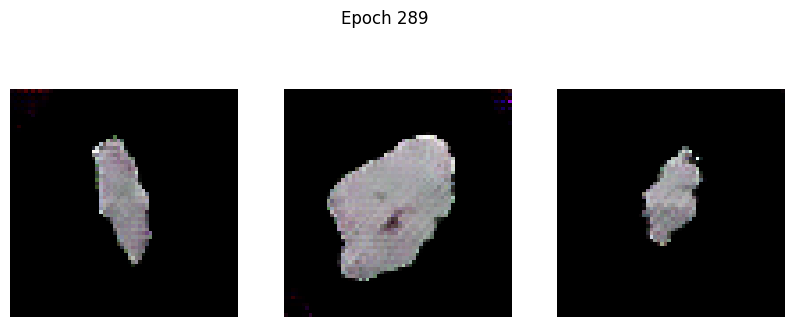

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.2110 - g_loss: 4.9347
Epoch 290/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -19.9829 - g_loss: 5.0557

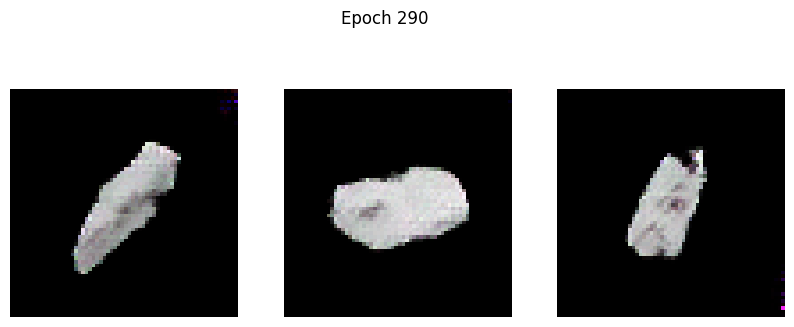

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -19.9747 - g_loss: 5.0563
Epoch 291/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.1913 - g_loss: 4.7813

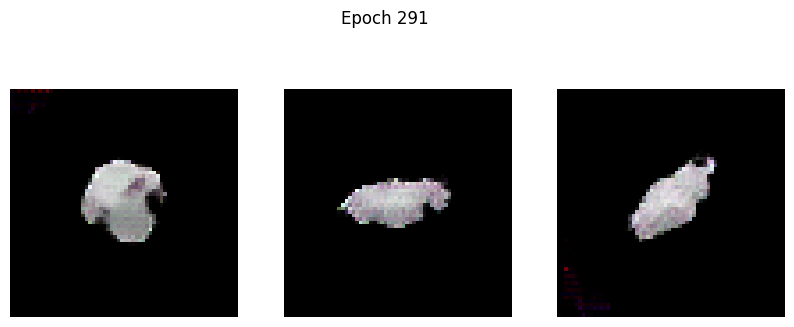

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.1821 - g_loss: 4.7808
Epoch 292/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.5962 - g_loss: 5.2584

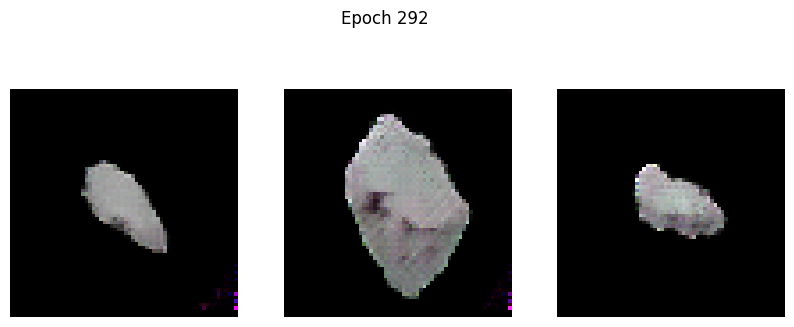

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -18.5893 - g_loss: 5.2601
Epoch 293/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.1435 - g_loss: 5.0087

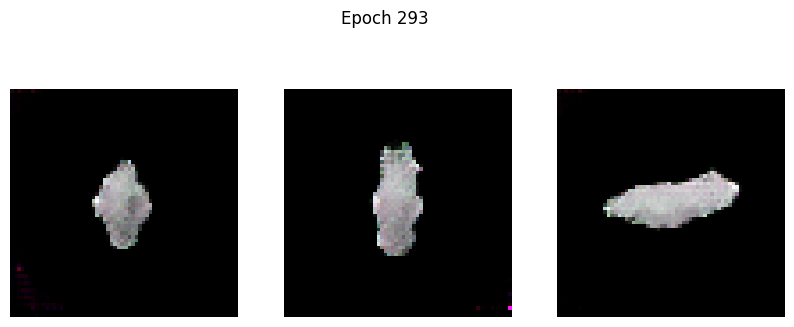

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.1522 - g_loss: 5.0091
Epoch 294/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -21.7078 - g_loss: 5.2782

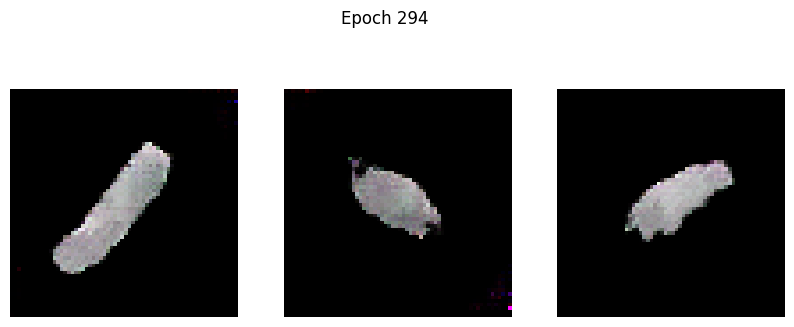

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -21.7193 - g_loss: 5.2795
Epoch 295/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.0177 - g_loss: 5.6110

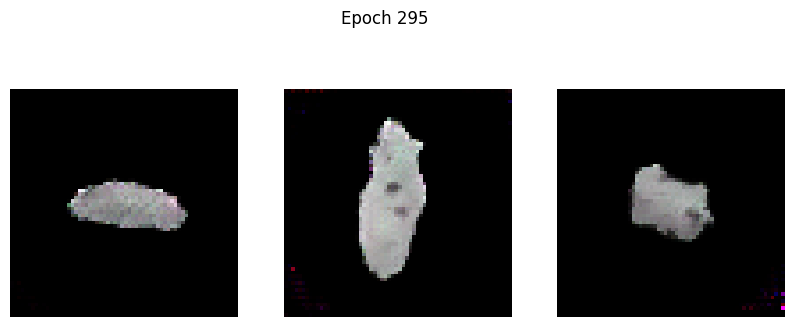

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.0606 - g_loss: 5.6112
Epoch 296/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.7947 - g_loss: 6.2000

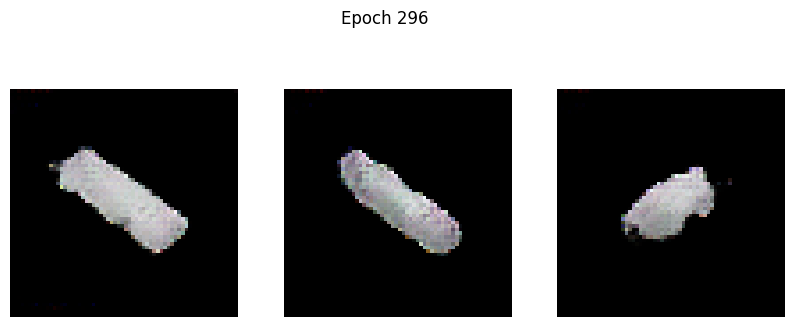

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.8122 - g_loss: 6.2049
Epoch 297/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.2880 - g_loss: 12.3906

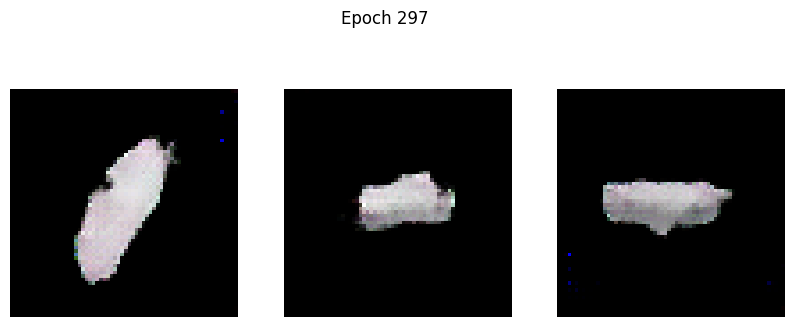

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.3041 - g_loss: 12.3745
Epoch 298/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.3339 - g_loss: 6.7429

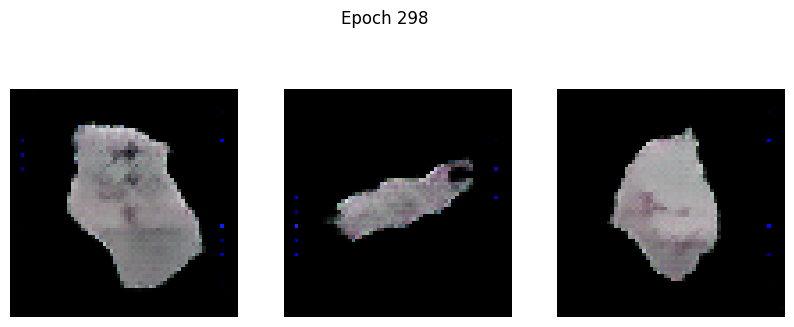

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -18.3432 - g_loss: 6.7409
Epoch 299/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -23.2853 - g_loss: 5.5302

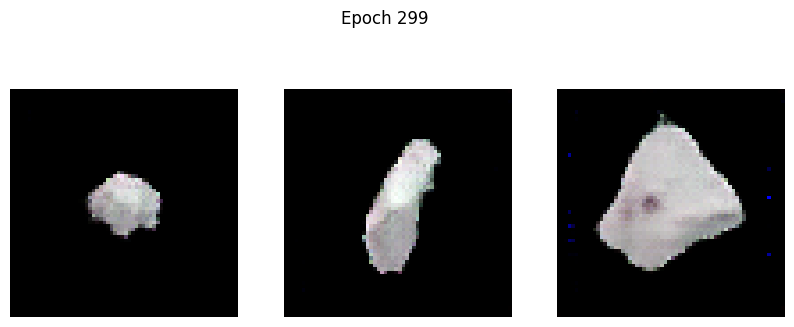

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -23.2786 - g_loss: 5.5302
Epoch 300/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -28.9821 - g_loss: 5.5547

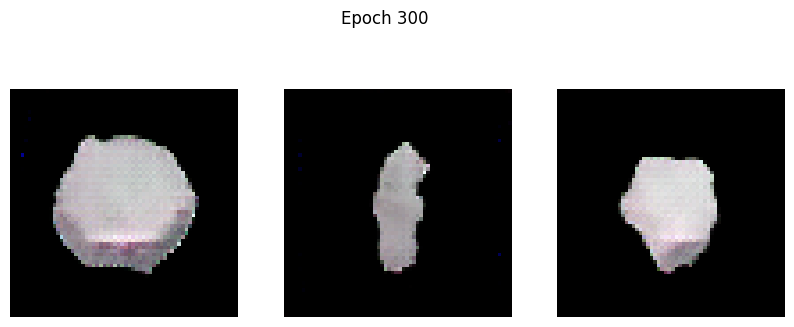

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -28.9420 - g_loss: 5.5582
Epoch 301/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -24.4716 - g_loss: 6.3015

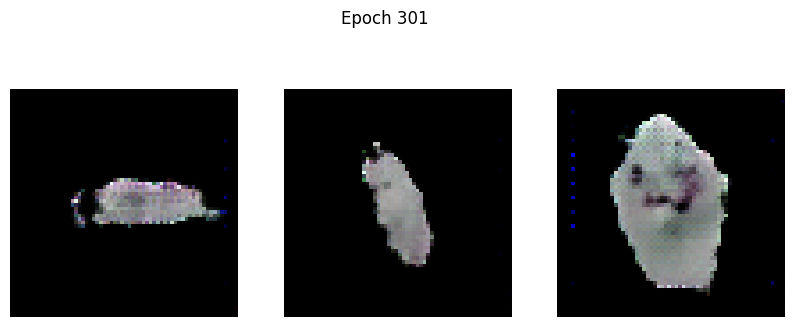

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -24.4743 - g_loss: 6.2985
Epoch 302/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -25.9571 - g_loss: 6.2244

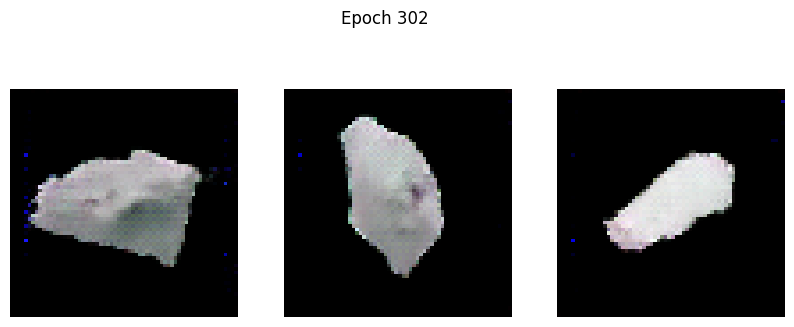

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -25.9353 - g_loss: 6.2221
Epoch 303/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -26.5846 - g_loss: 6.1708

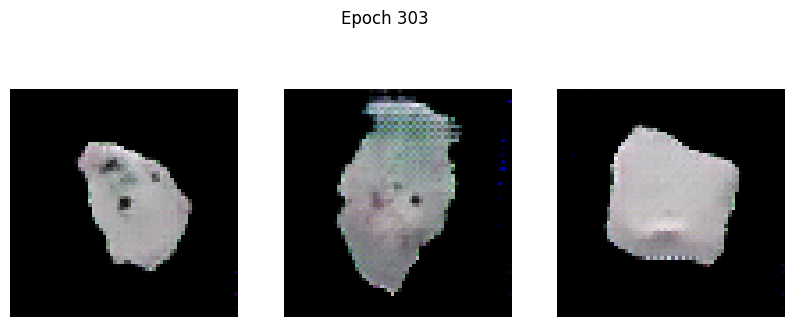

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -26.5516 - g_loss: 6.1749
Epoch 304/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -23.6525 - g_loss: 6.3767

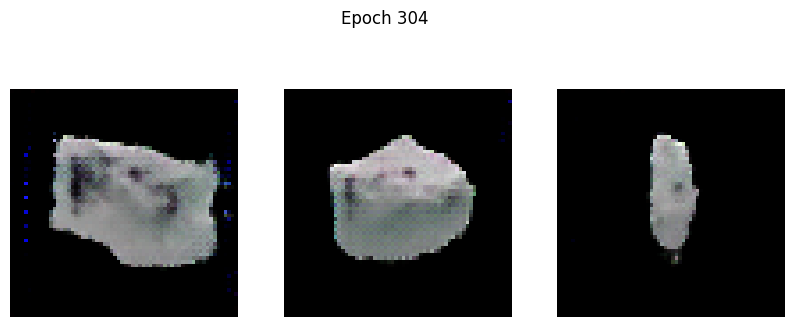

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -23.6910 - g_loss: 6.3748
Epoch 305/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -26.6436 - g_loss: 6.4815

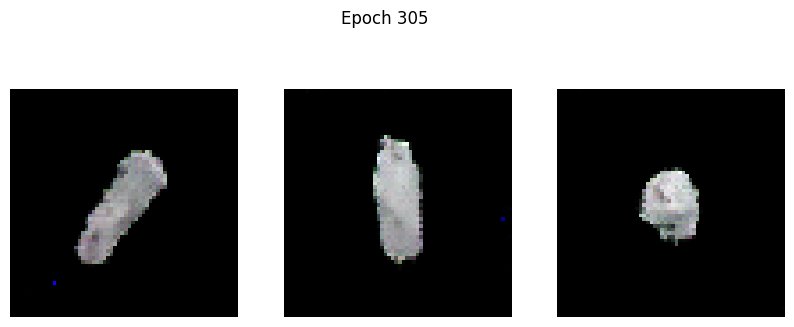

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -26.6325 - g_loss: 6.4845
Epoch 306/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -28.1468 - g_loss: 7.7915

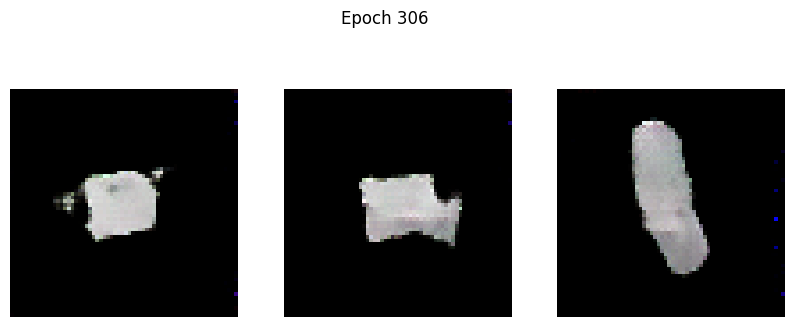

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -28.1132 - g_loss: 7.7868
Epoch 307/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -24.5465 - g_loss: 6.2146

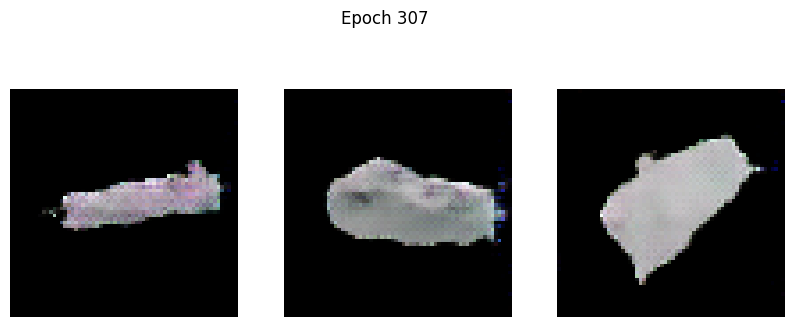

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -24.5402 - g_loss: 6.2158
Epoch 308/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -22.6789 - g_loss: 8.4810

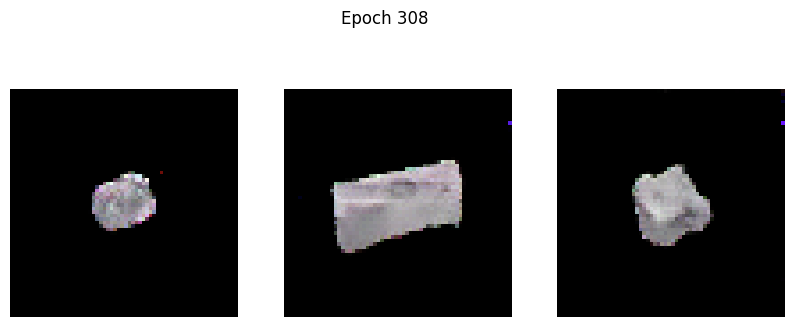

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -22.6526 - g_loss: 8.4896
Epoch 309/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.4409 - g_loss: 9.5977

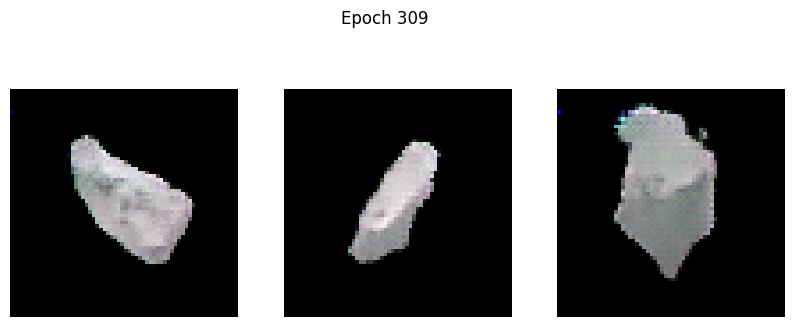

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.4792 - g_loss: 9.5869
Epoch 310/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -27.6077 - g_loss: 6.3701

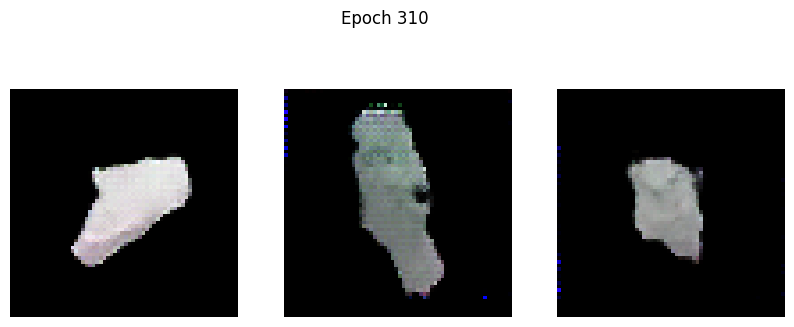

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -27.6193 - g_loss: 6.3688
Epoch 311/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -28.8754 - g_loss: 5.7386

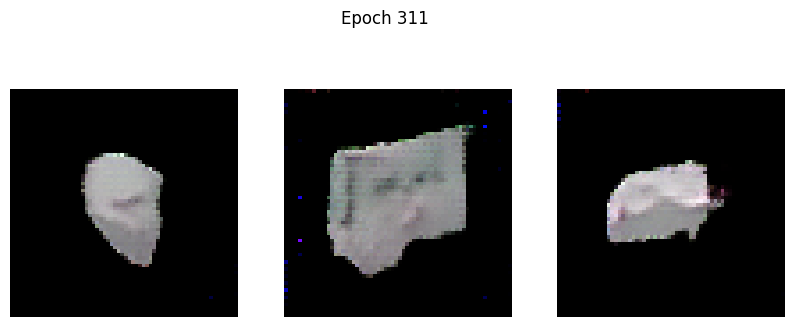

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -28.9247 - g_loss: 5.7431
Epoch 312/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 33.7461 - g_loss: 20.4903

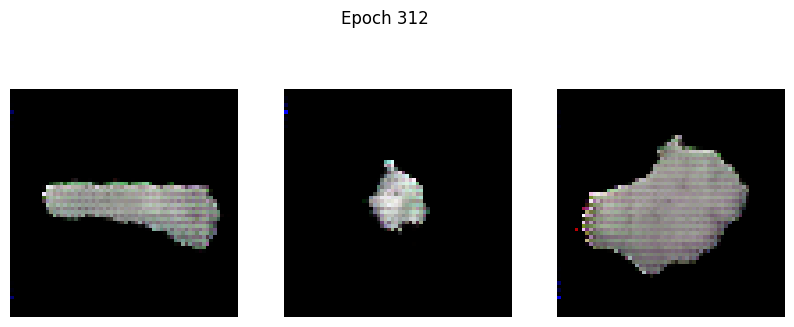

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 33.9158 - g_loss: 20.5580
Epoch 313/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.3590 - g_loss: 9.5610

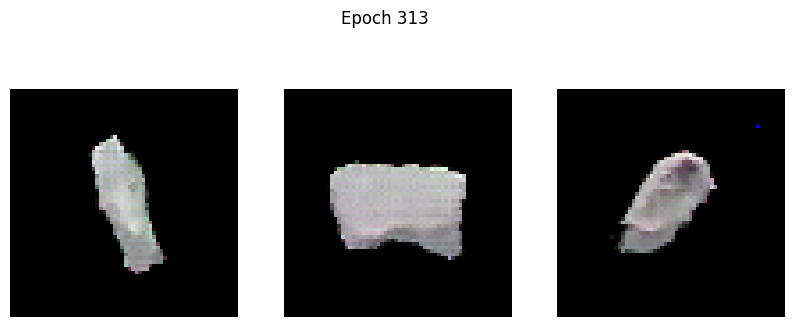

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.3839 - g_loss: 9.5468
Epoch 314/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -28.9385 - g_loss: 5.9014

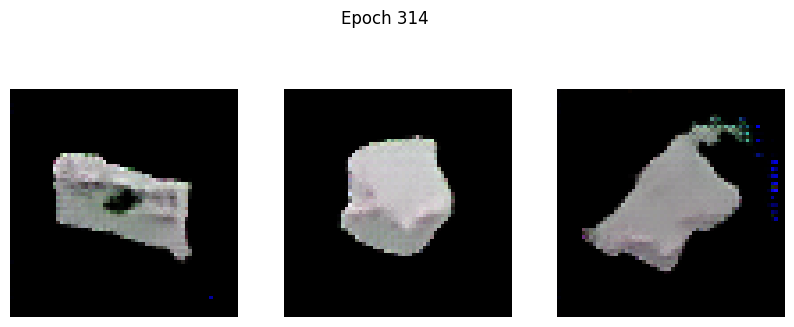

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -28.9088 - g_loss: 5.9009
Epoch 315/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.9203 - g_loss: 7.6365

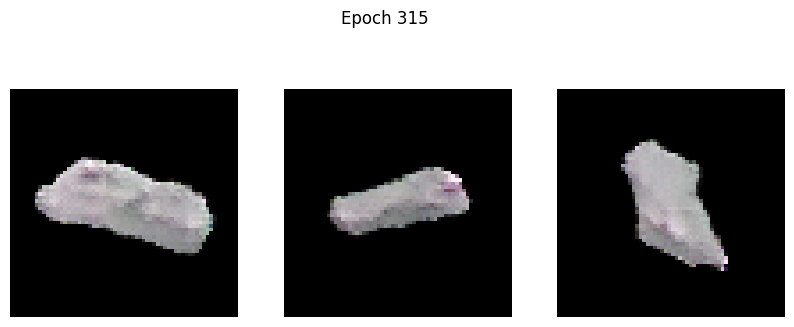

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -18.9517 - g_loss: 7.6362
Epoch 316/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -21.2139 - g_loss: 5.8610

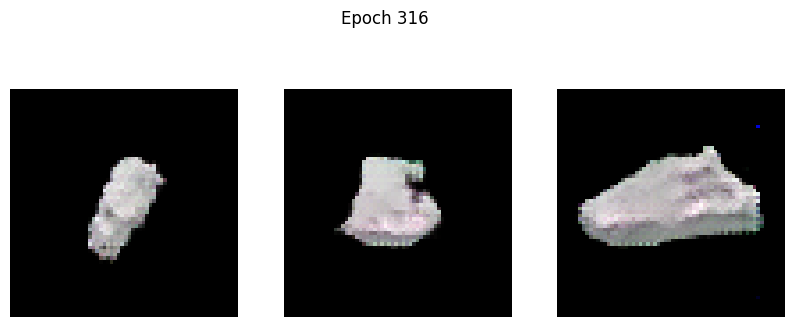

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -21.2748 - g_loss: 5.8600
Epoch 317/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -27.0006 - g_loss: 5.3254

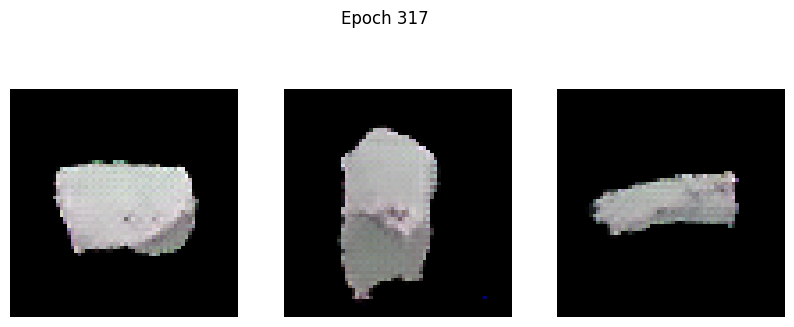

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -27.0277 - g_loss: 5.3271
Epoch 318/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 132.7072 - g_loss: 52.9255

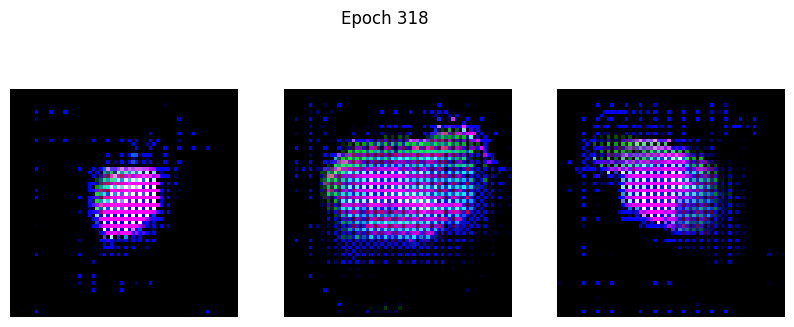

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 135.4605 - g_loss: 54.0242
Epoch 319/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 63.3412 - g_loss: 94.1174

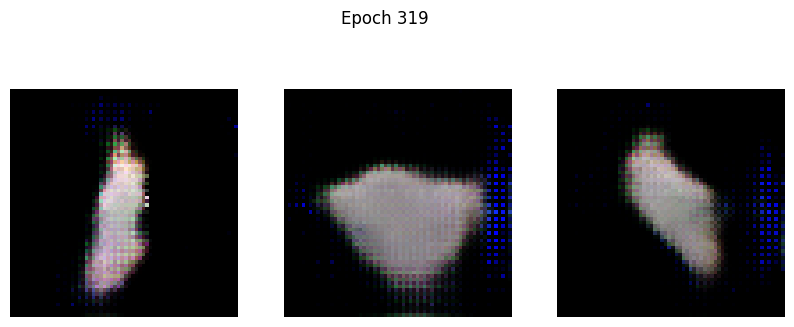

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 63.2782 - g_loss: 93.8873
Epoch 320/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 30.3041 - g_loss: 33.2124

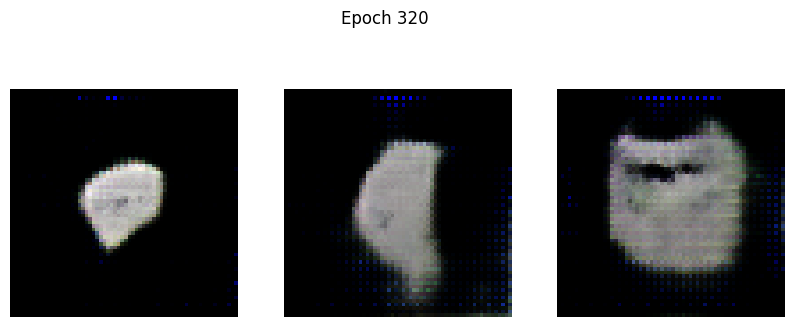

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 30.1848 - g_loss: 33.1799
Epoch 321/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 10.1941 - g_loss: 19.8310

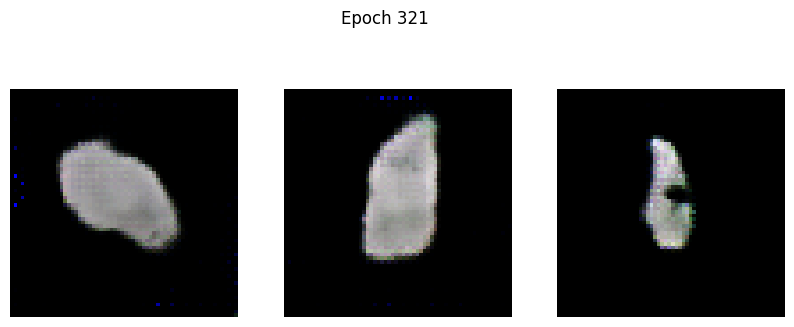

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 10.1272 - g_loss: 19.8267
Epoch 322/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0773 - g_loss: 14.0018

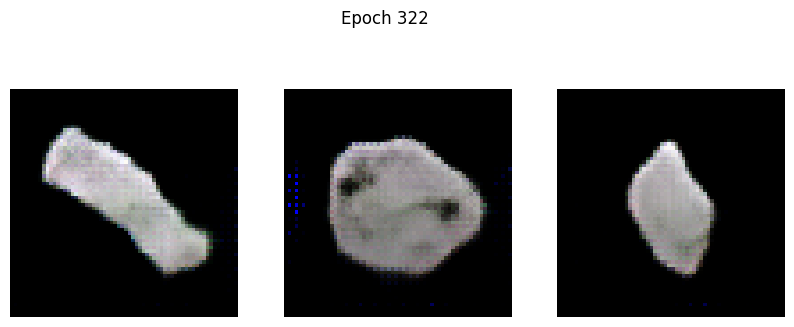

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0634 - g_loss: 14.0018
Epoch 323/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -5.8934 - g_loss: 14.9713

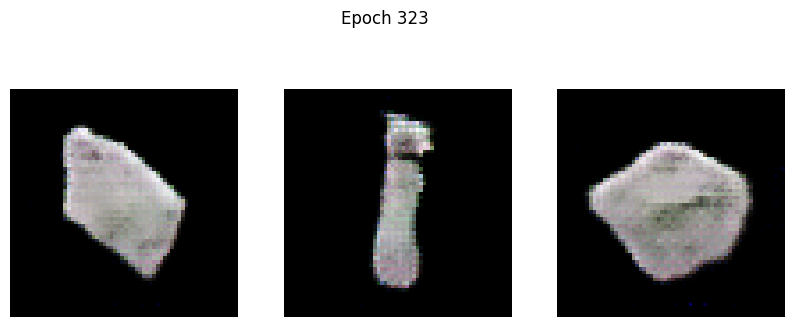

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -5.9120 - g_loss: 14.9601
Epoch 324/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -8.2668 - g_loss: 12.9607

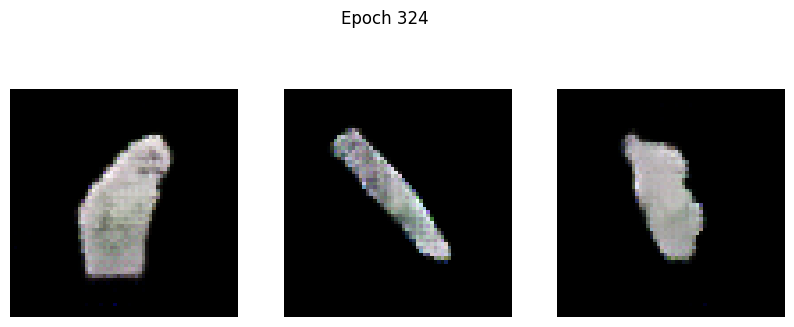

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -8.2825 - g_loss: 12.9550
Epoch 325/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.6798 - g_loss: 11.7467

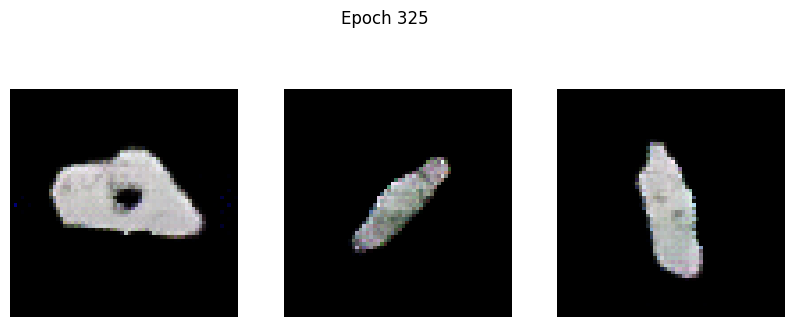

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.6601 - g_loss: 11.7423
Epoch 326/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.8141 - g_loss: 10.5913

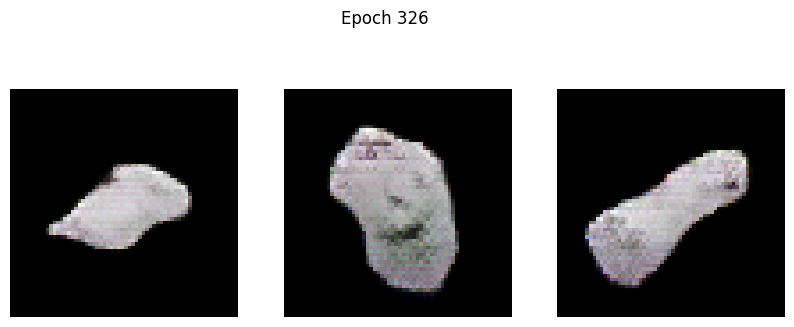

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.8306 - g_loss: 10.5849
Epoch 327/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -13.7768 - g_loss: 9.0281

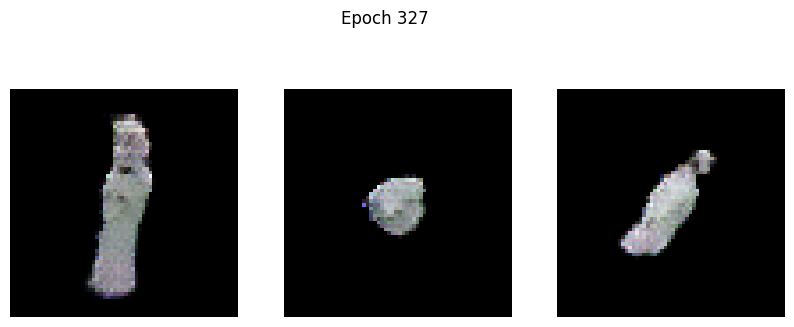

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -13.8008 - g_loss: 9.0263
Epoch 328/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.7330 - g_loss: 9.0237

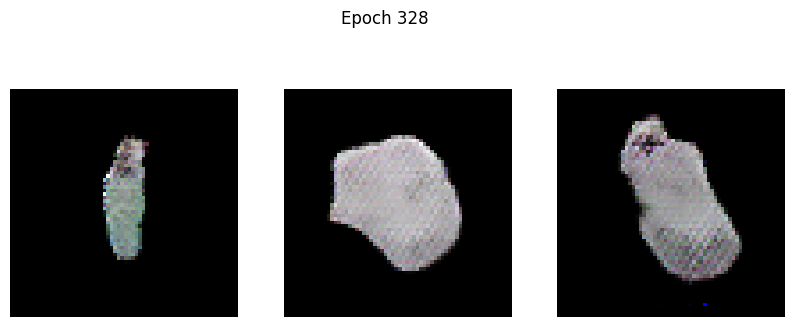

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.7710 - g_loss: 9.0166
Epoch 329/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -16.4388 - g_loss: 7.8394

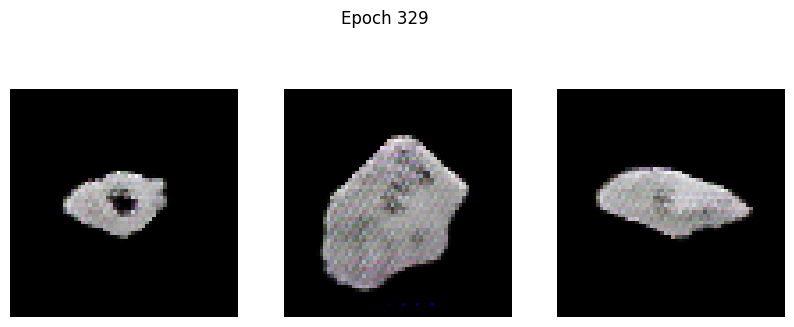

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -16.4304 - g_loss: 7.8384
Epoch 330/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.6257 - g_loss: 7.3186

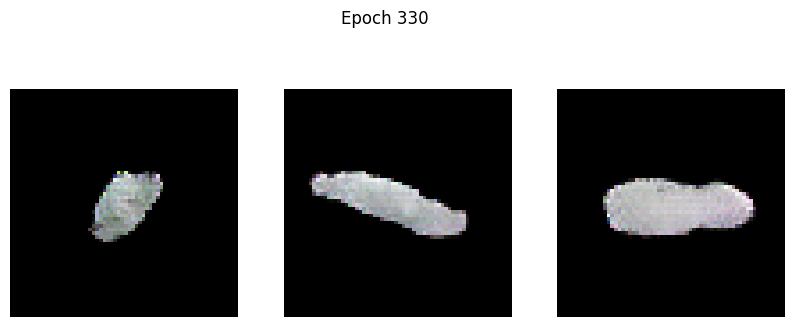

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.6302 - g_loss: 7.3196
Epoch 331/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -19.5794 - g_loss: 6.9776

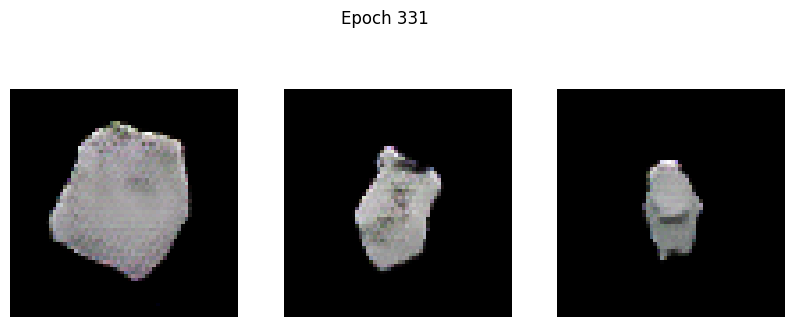

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -19.5712 - g_loss: 6.9787
Epoch 332/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.8487 - g_loss: 6.4009

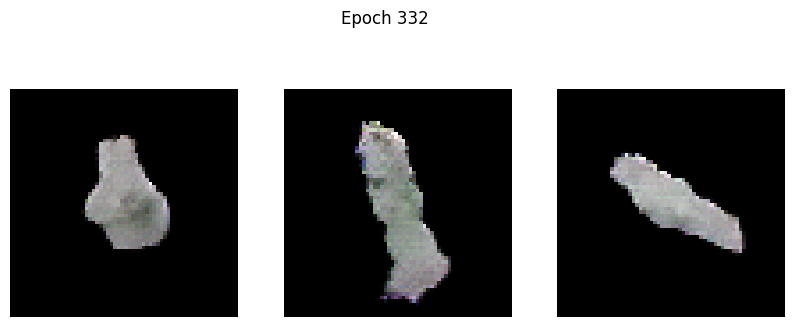

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.8866 - g_loss: 6.4052
Epoch 333/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -22.2058 - g_loss: 6.6290

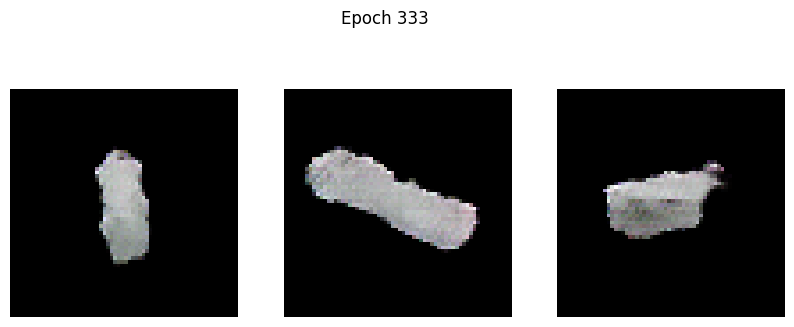

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -22.1919 - g_loss: 6.6306
Epoch 334/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -22.0687 - g_loss: 5.9365

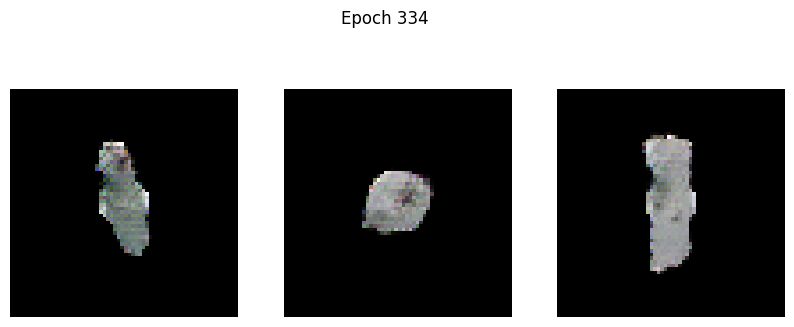

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -22.0677 - g_loss: 5.9377
Epoch 335/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.8000 - g_loss: 6.3229

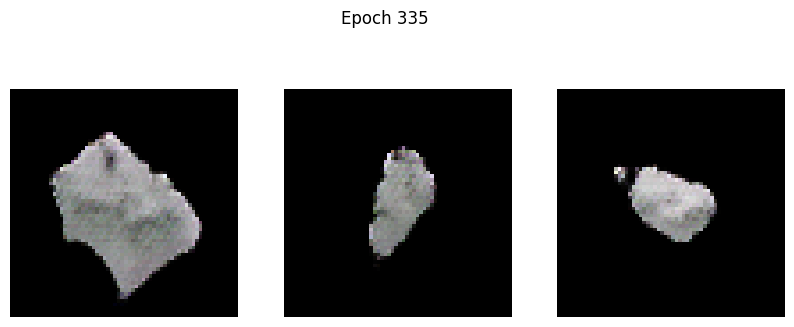

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.8132 - g_loss: 6.3207
Epoch 336/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -24.6624 - g_loss: 5.8330

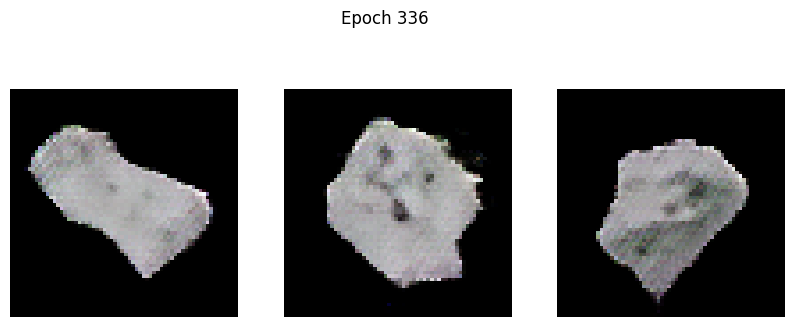

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -24.6502 - g_loss: 5.8331
Epoch 337/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.3583 - g_loss: 5.5290

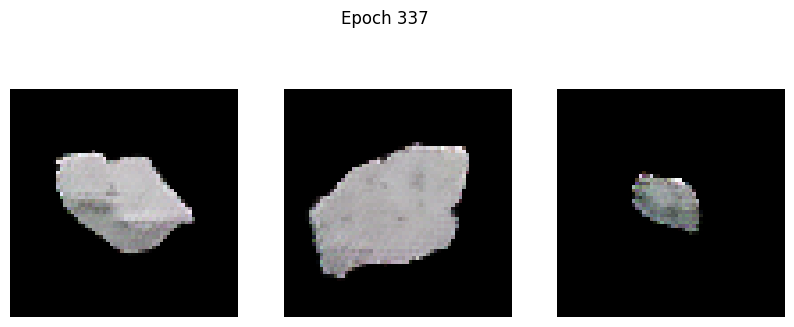

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.3845 - g_loss: 5.5286
Epoch 338/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -25.1180 - g_loss: 5.5332

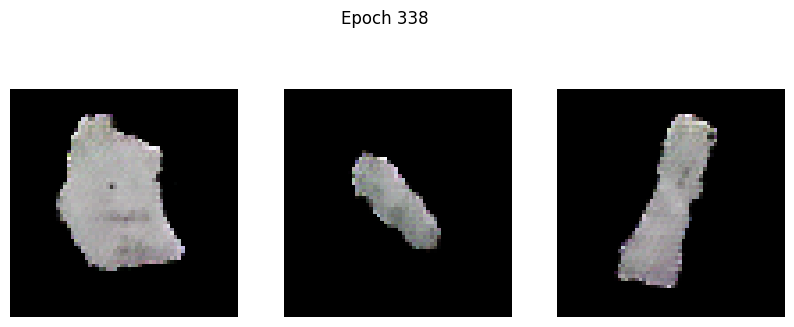

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -25.1276 - g_loss: 5.5330
Epoch 339/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -30.9265 - g_loss: 5.4792

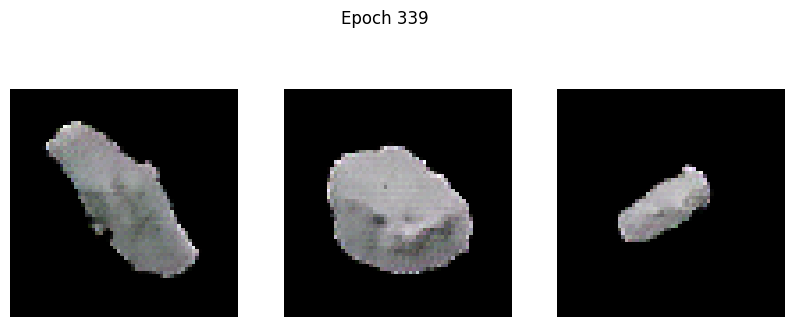

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -30.9055 - g_loss: 5.4791
Epoch 340/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -25.9538 - g_loss: 5.2206

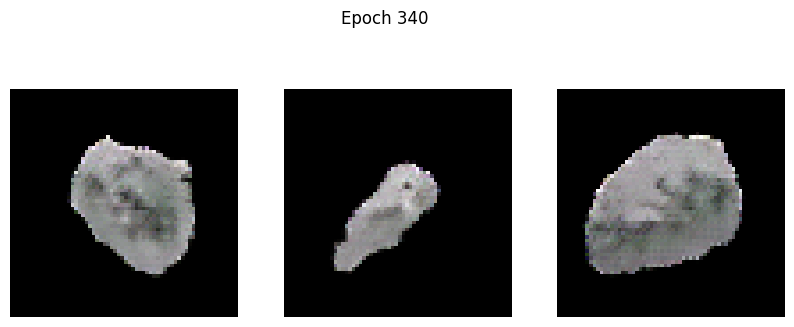

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -25.9829 - g_loss: 5.2207
Epoch 341/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -38.6762 - g_loss: 5.4940

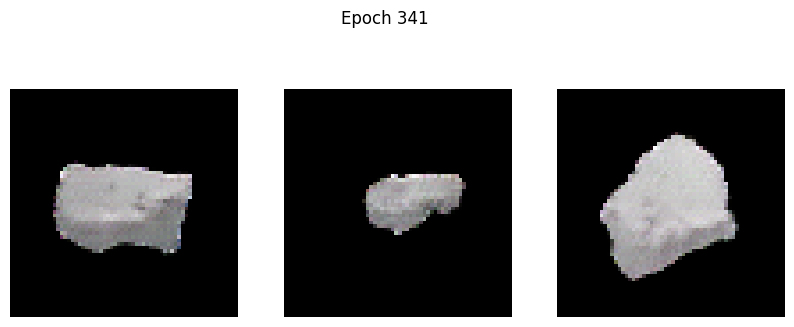

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -38.6097 - g_loss: 5.4919
Epoch 342/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -32.7056 - g_loss: 5.3363

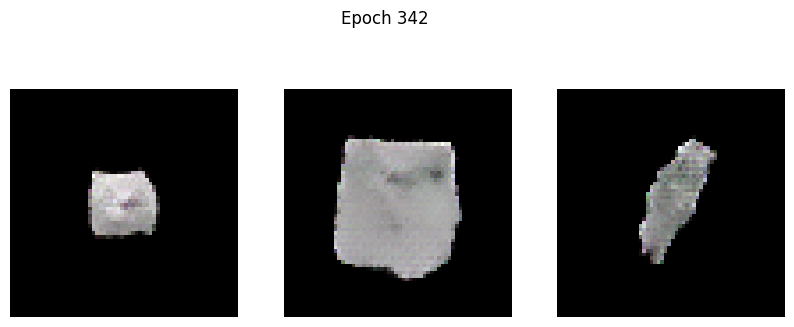

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -32.6858 - g_loss: 5.3370
Epoch 343/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -36.2770 - g_loss: 5.1501

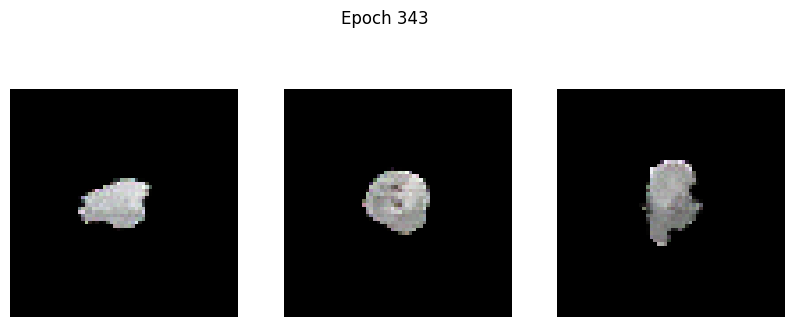

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -36.2542 - g_loss: 5.1522
Epoch 344/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -36.8721 - g_loss: 6.7808

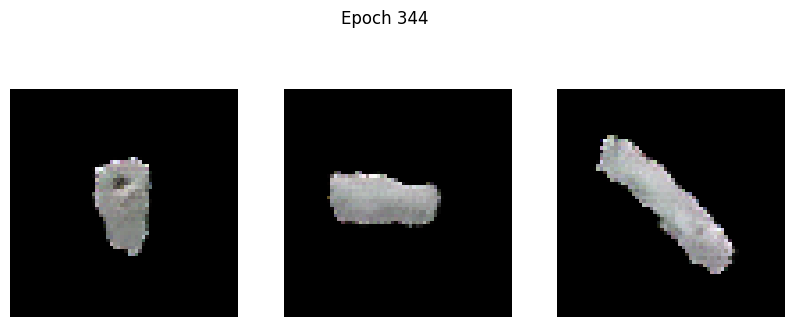

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -36.8157 - g_loss: 6.7758
Epoch 345/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -37.0093 - g_loss: 6.8857

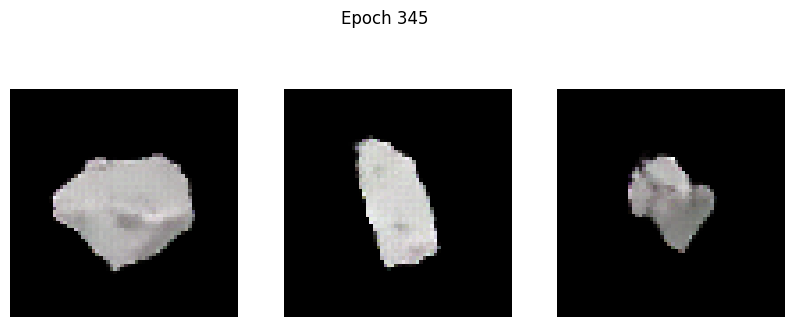

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -36.9924 - g_loss: 6.8816
Epoch 346/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -23.3970 - g_loss: 6.2918

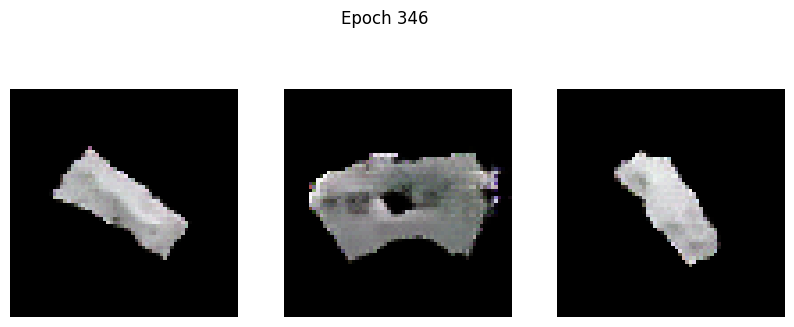

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -23.5167 - g_loss: 6.2889
Epoch 347/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -28.4347 - g_loss: 6.4701

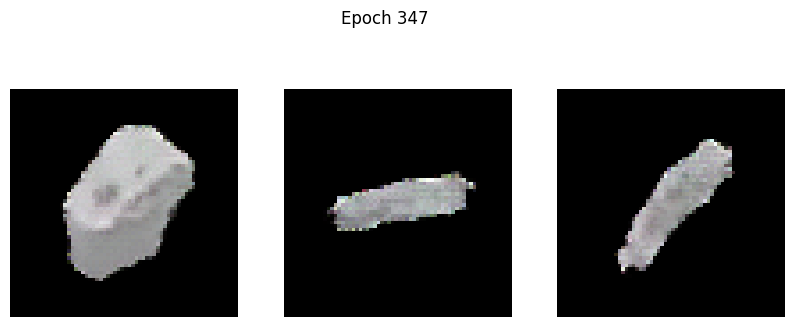

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -28.4733 - g_loss: 6.4719
Epoch 348/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -44.5292 - g_loss: 6.2631

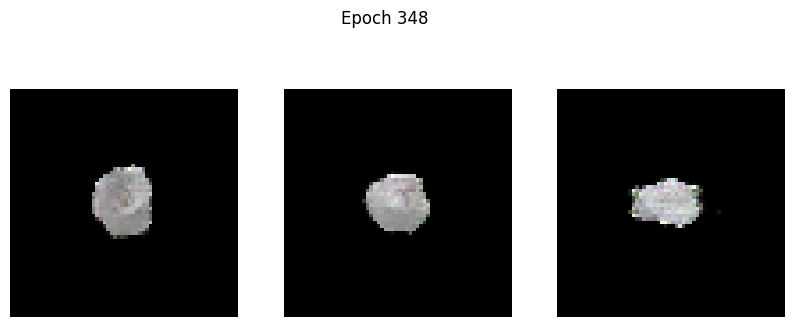

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -44.4832 - g_loss: 6.2629
Epoch 349/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -34.8645 - g_loss: 6.6479

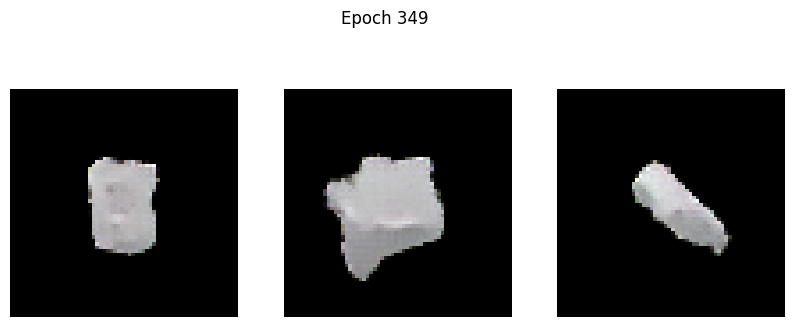

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -34.8342 - g_loss: 6.6499
Epoch 350/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -34.3796 - g_loss: 6.0759

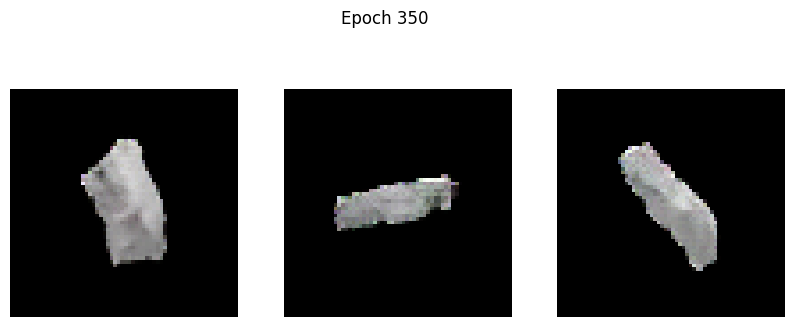

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -34.4161 - g_loss: 6.0777
Epoch 351/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -45.4805 - g_loss: 6.8945

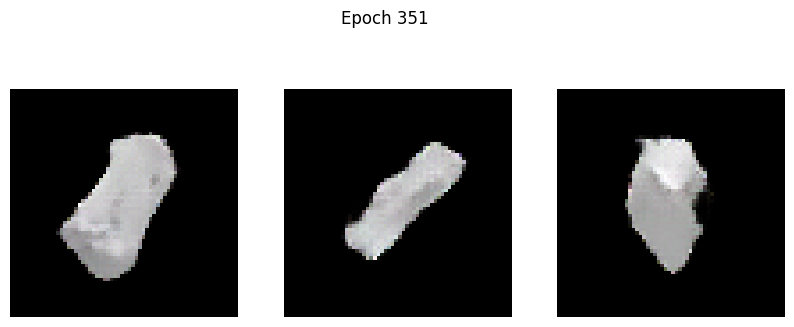

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -45.4281 - g_loss: 6.8947
Epoch 352/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -25.2178 - g_loss: 8.9496

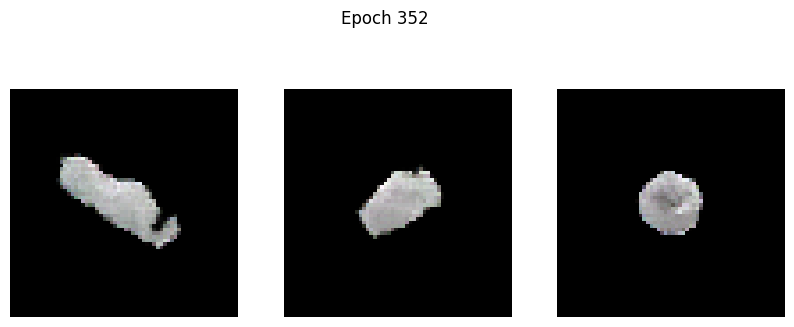

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -25.2732 - g_loss: 8.9534
Epoch 353/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -37.4472 - g_loss: 6.9007

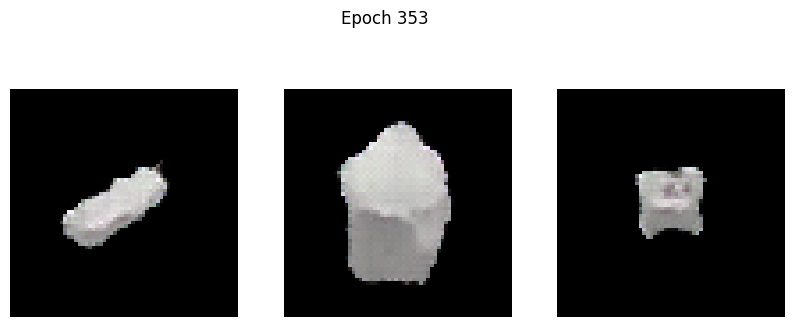

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -37.4728 - g_loss: 6.8998
Epoch 354/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -36.8032 - g_loss: 7.3411

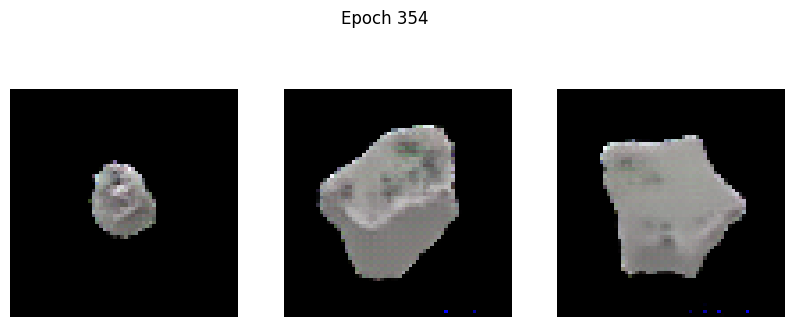

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -36.8328 - g_loss: 7.3419
Epoch 355/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -40.9863 - g_loss: 8.8405

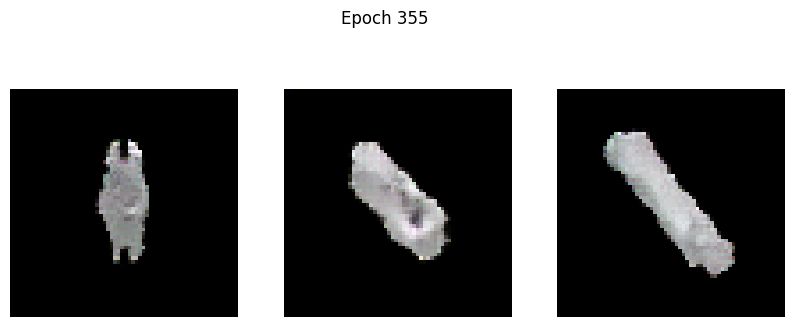

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -40.9518 - g_loss: 8.8343
Epoch 356/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -45.6380 - g_loss: 7.5611

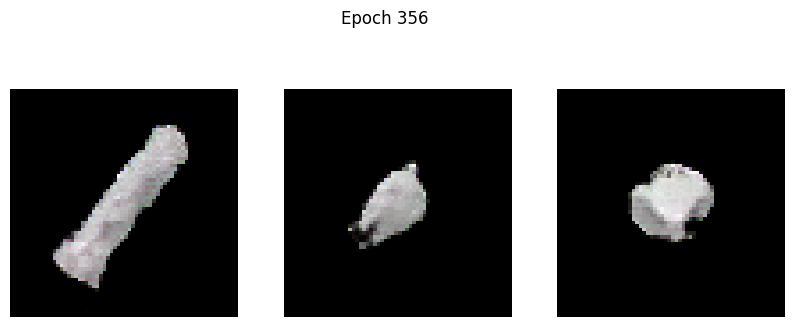

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -45.6046 - g_loss: 7.5581
Epoch 357/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -43.7948 - g_loss: 7.9462

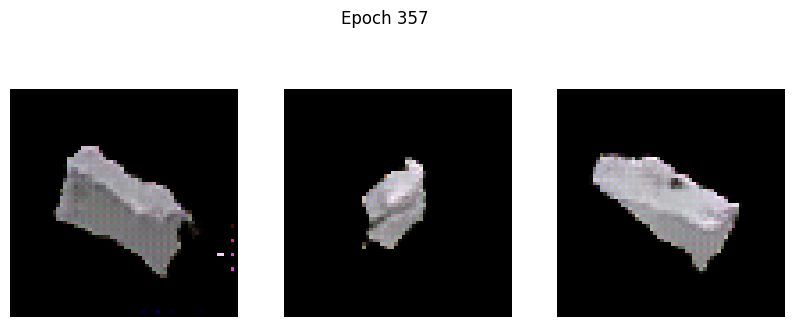

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -43.7829 - g_loss: 7.9484
Epoch 358/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -39.6541 - g_loss: 9.3567

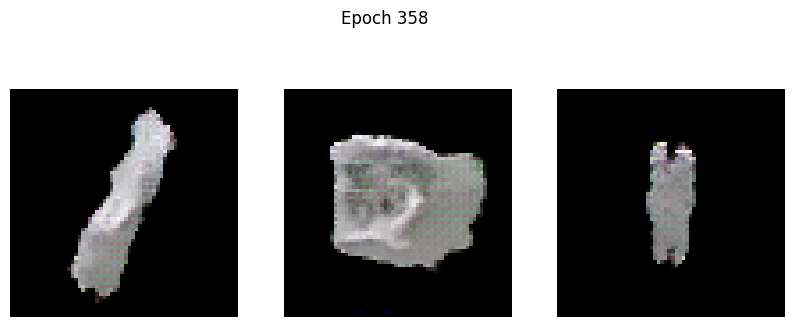

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -39.7230 - g_loss: 9.3468
Epoch 359/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -40.1982 - g_loss: 6.4365

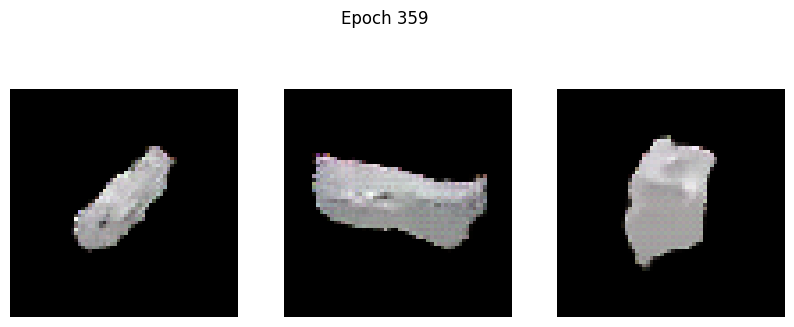

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -40.3392 - g_loss: 6.4395
Epoch 360/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -46.9240 - g_loss: 8.9481

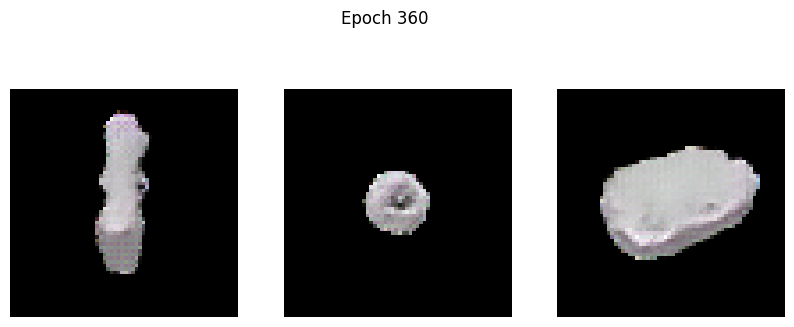

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -46.9416 - g_loss: 8.9492
Epoch 361/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -47.2797 - g_loss: 7.6778

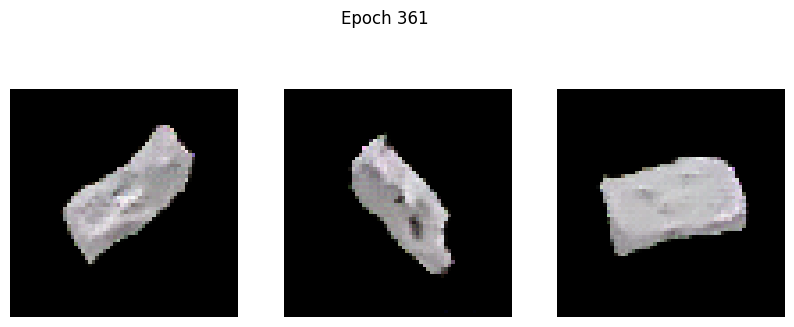

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -47.2876 - g_loss: 7.6756
Epoch 362/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -44.1132 - g_loss: 7.9455

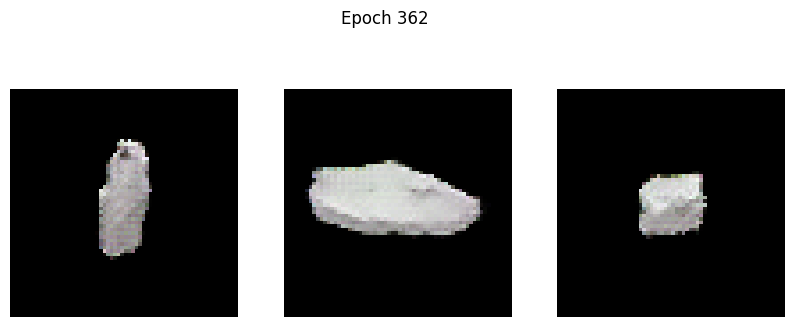

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -44.1778 - g_loss: 7.9504
Epoch 363/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -52.8707 - g_loss: 7.7432

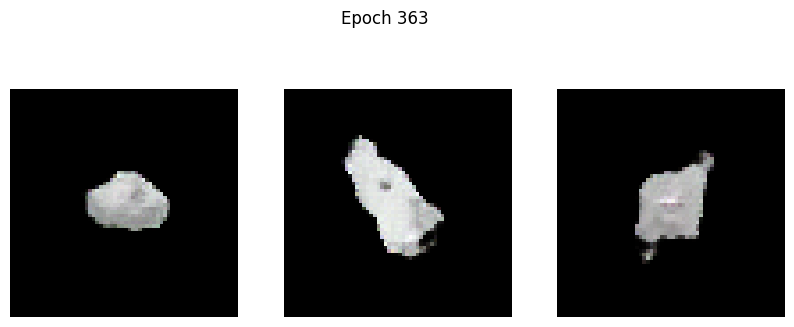

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -52.9214 - g_loss: 7.7404
Epoch 364/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -49.2834 - g_loss: 8.4981

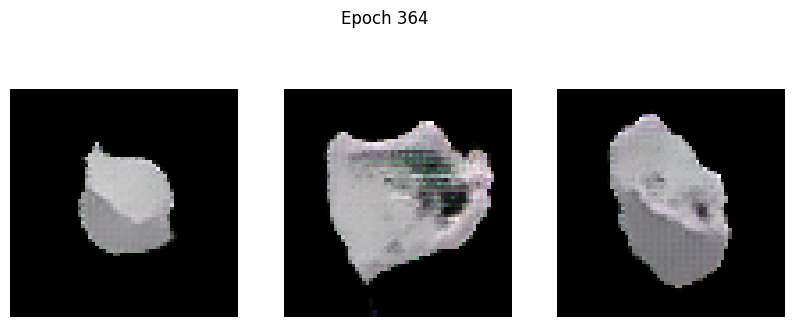

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -49.3967 - g_loss: 8.4985
Epoch 365/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -46.2969 - g_loss: 7.8960

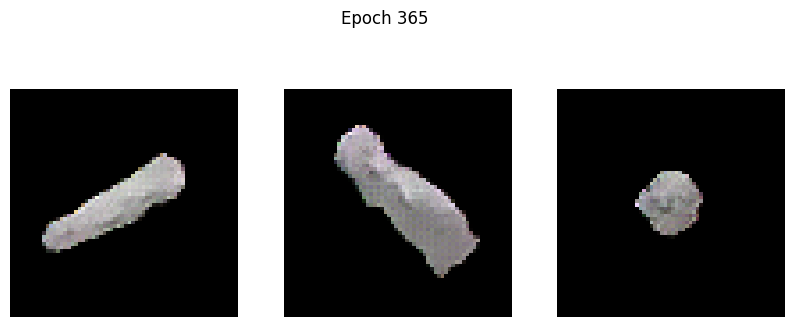

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -46.4758 - g_loss: 7.8968
Epoch 366/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -47.9653 - g_loss: 8.0082

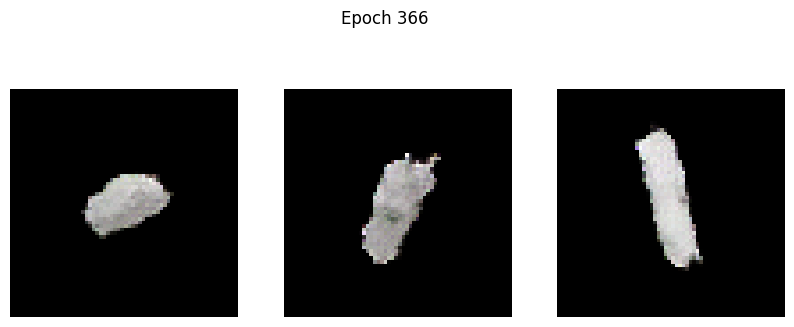

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -48.0215 - g_loss: 8.0104
Epoch 367/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -57.0722 - g_loss: 9.4922

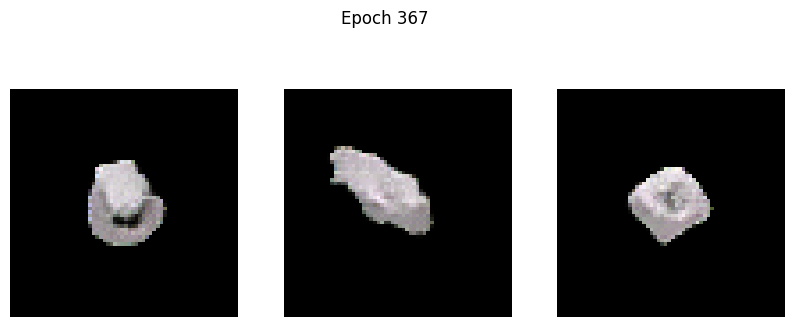

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -57.1692 - g_loss: 9.4873
Epoch 368/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -58.3826 - g_loss: 8.7512

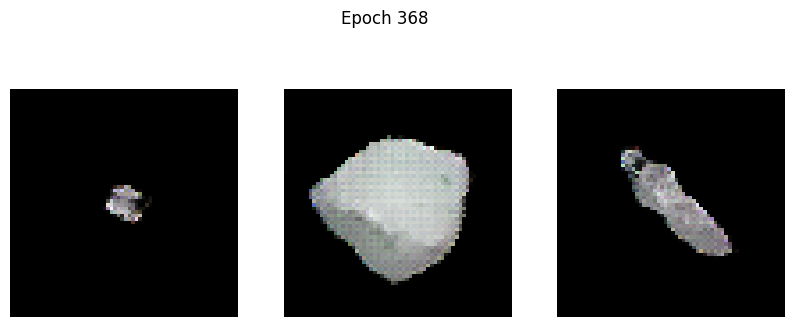

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -58.3996 - g_loss: 8.7779
Epoch 369/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 105.1616 - g_loss: 59.3855

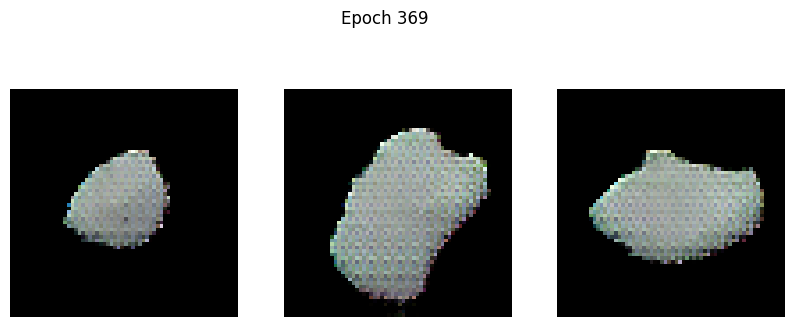

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 104.8061 - g_loss: 59.2896
Epoch 370/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -54.5636 - g_loss: 10.6986

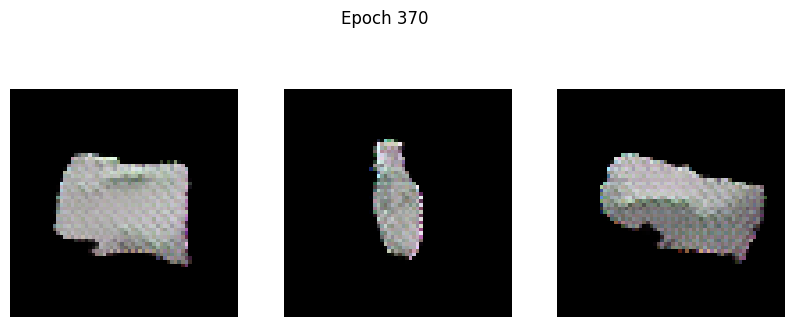

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -54.5899 - g_loss: 10.6896
Epoch 371/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -64.7666 - g_loss: 8.1969

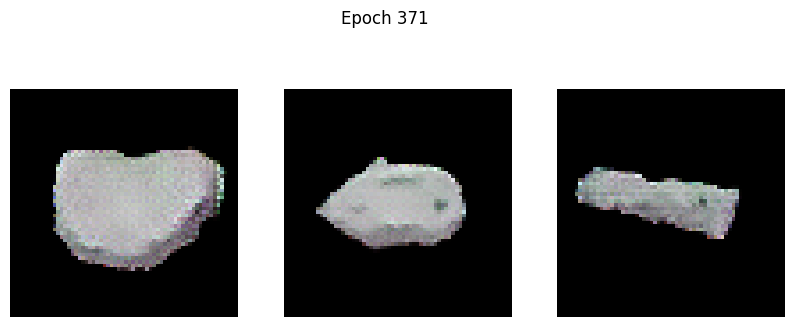

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -64.7011 - g_loss: 8.1903
Epoch 372/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -60.0643 - g_loss: 6.7718

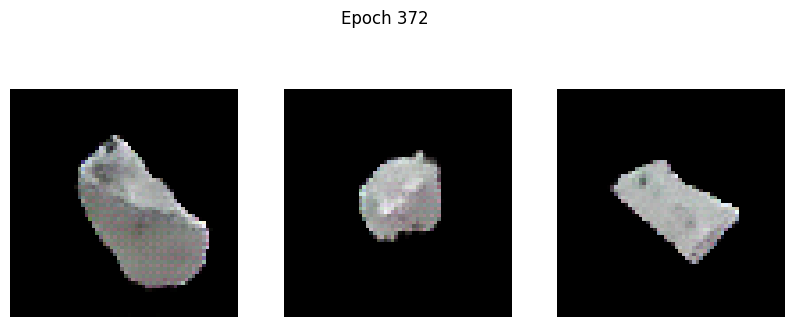

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -60.1133 - g_loss: 6.7714
Epoch 373/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -72.2816 - g_loss: 7.0892

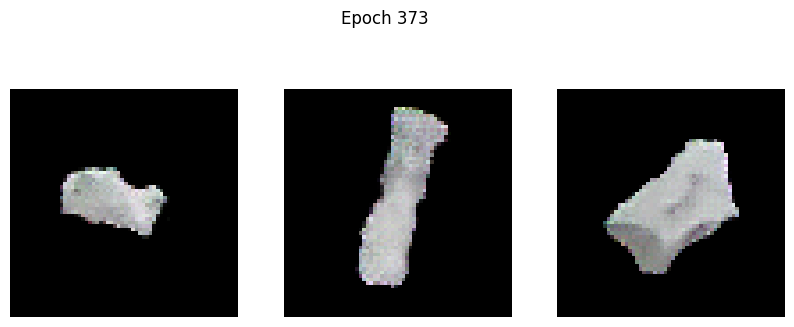

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -72.2585 - g_loss: 7.0954
Epoch 374/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -16.3388 - g_loss: 14.0939

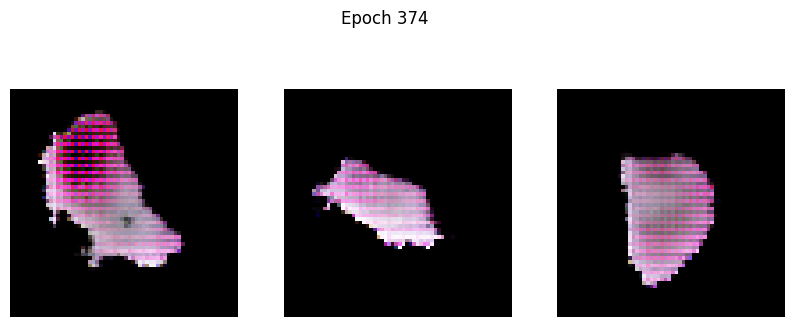

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -13.6742 - g_loss: 14.6780
Epoch 375/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 25.3603 - g_loss: 68.0000

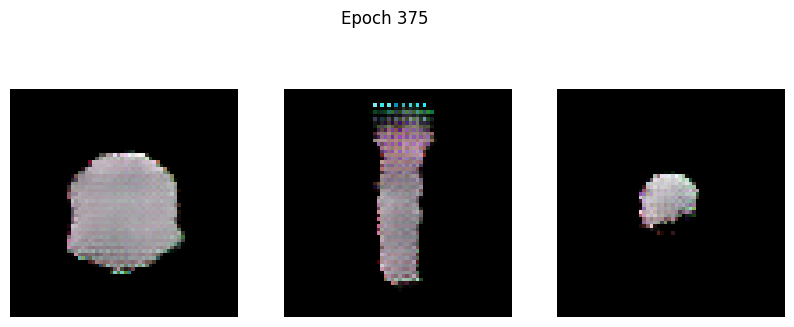

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 25.0591 - g_loss: 67.7970
Epoch 376/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -38.3031 - g_loss: 18.1980

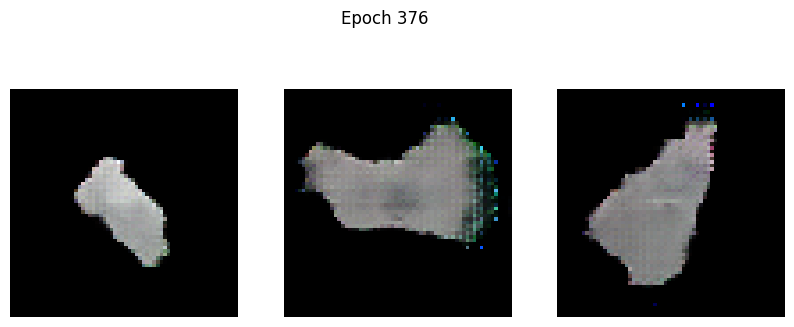

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -38.3909 - g_loss: 18.1794
Epoch 377/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -52.6985 - g_loss: 9.7508

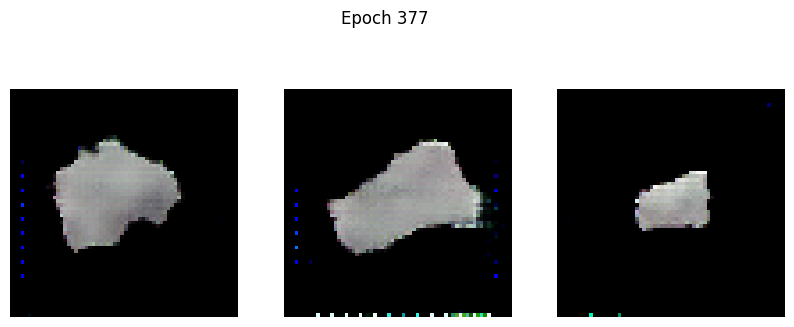

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -52.6988 - g_loss: 9.7506
Epoch 378/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -50.7606 - g_loss: 9.2807

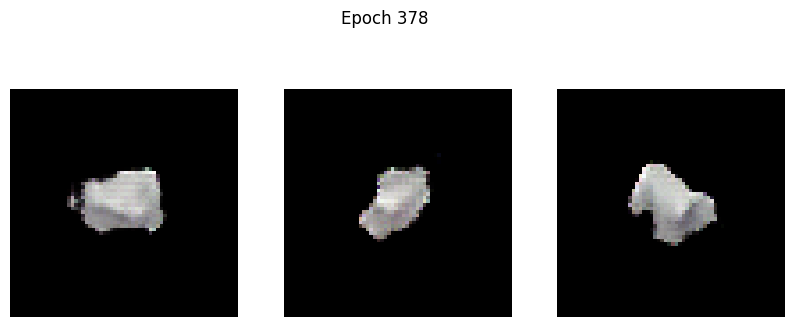

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -50.8373 - g_loss: 9.2733
Epoch 379/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -63.6965 - g_loss: 6.8149

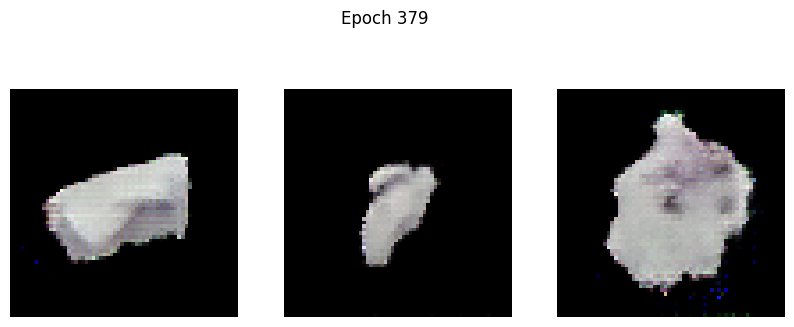

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -63.7725 - g_loss: 6.8169
Epoch 380/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -84.0230 - g_loss: 6.6276

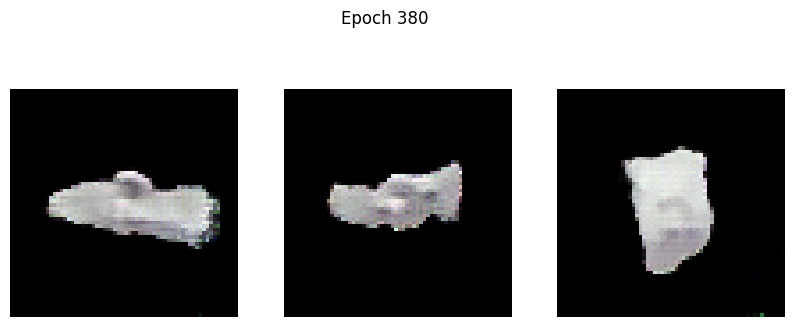

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -83.8993 - g_loss: 6.6266
Epoch 381/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -83.0089 - g_loss: 5.9422

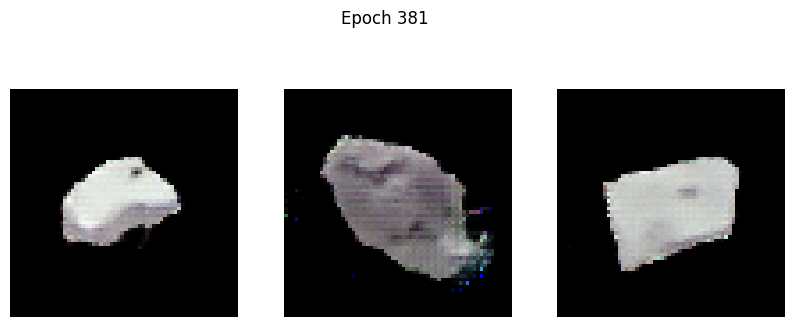

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -82.9466 - g_loss: 5.9418
Epoch 382/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -78.9217 - g_loss: 6.1086

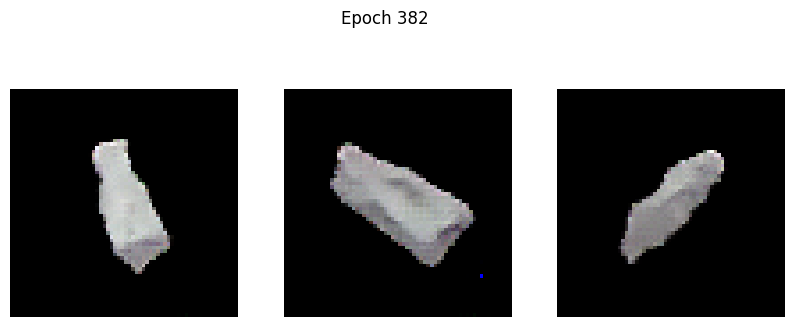

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -78.9297 - g_loss: 6.1062
Epoch 383/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -72.8343 - g_loss: 5.9787

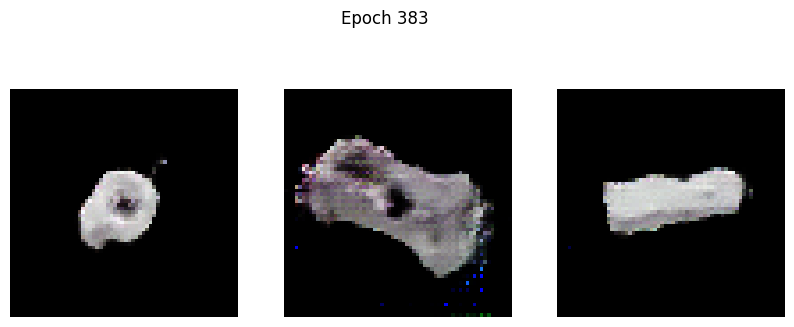

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -72.9616 - g_loss: 5.9766
Epoch 384/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -77.3063 - g_loss: 8.5144

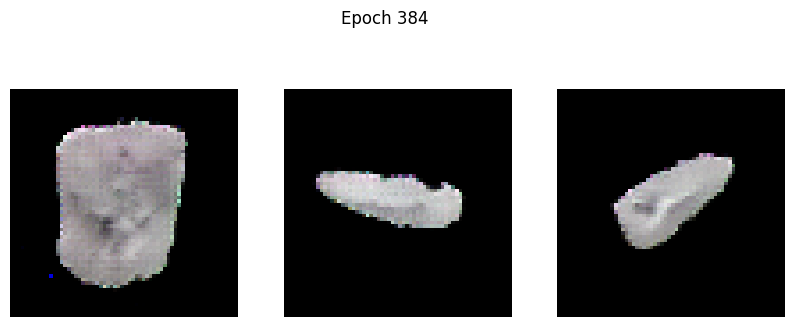

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -77.2681 - g_loss: 8.5312
Epoch 385/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -92.5092 - g_loss: 9.9016

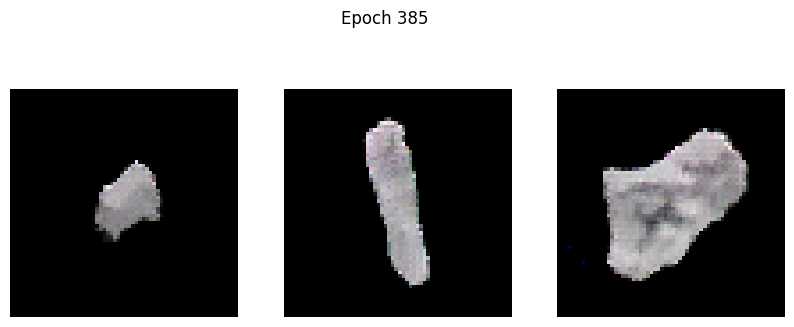

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -92.4624 - g_loss: 9.8867
Epoch 386/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -74.2262 - g_loss: 6.4479

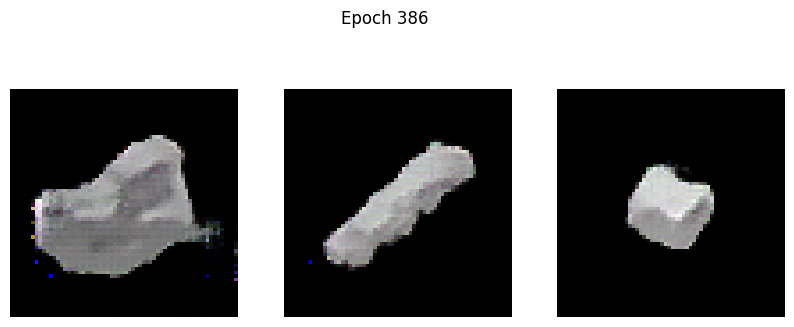

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -74.3332 - g_loss: 6.4478
Epoch 387/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -88.2745 - g_loss: 8.9605

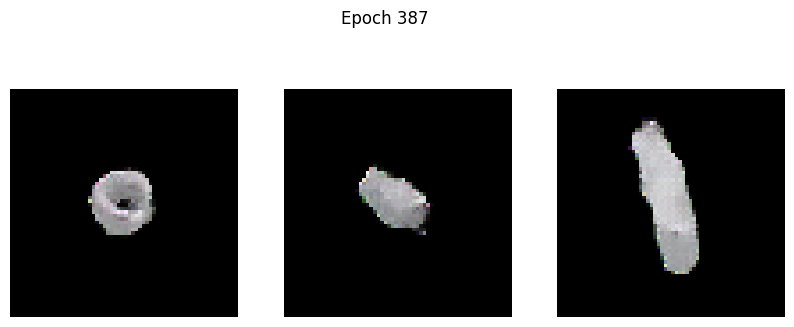

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -88.2061 - g_loss: 8.9753
Epoch 388/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -89.5715 - g_loss: 10.2762

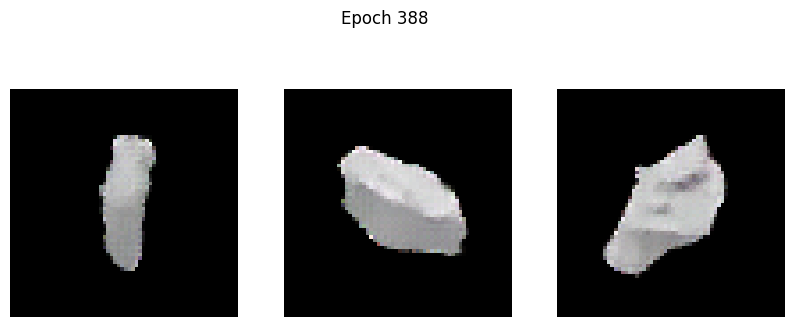

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -89.6910 - g_loss: 10.2605
Epoch 389/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -109.8852 - g_loss: 7.7349

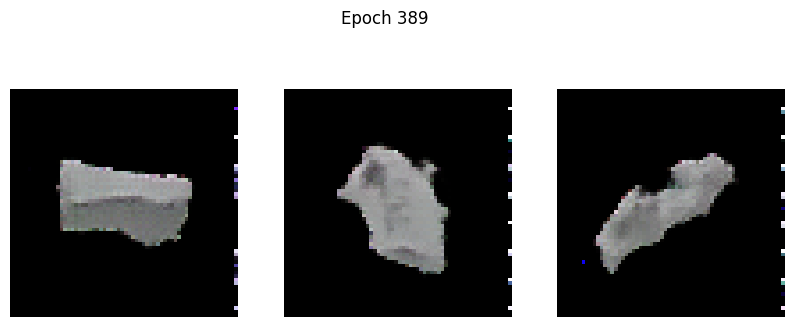

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -109.7879 - g_loss: 7.7432
Epoch 390/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -120.1242 - g_loss: 9.4458

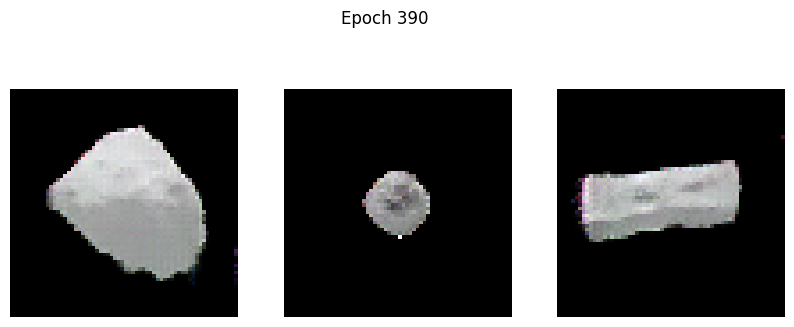

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -119.9819 - g_loss: 9.4418
Epoch 391/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -106.1001 - g_loss: 10.4490

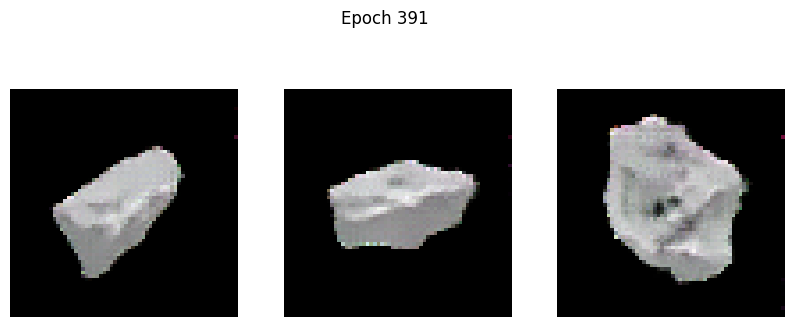

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -105.9683 - g_loss: 10.4441
Epoch 392/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -117.1648 - g_loss: 9.6843

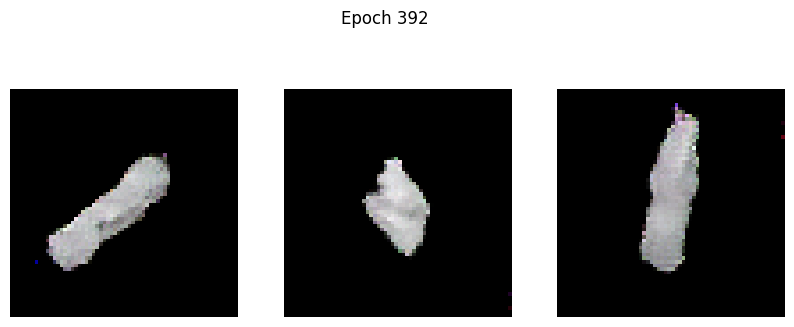

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -116.9540 - g_loss: 9.6809
Epoch 393/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -102.3429 - g_loss: 8.0940

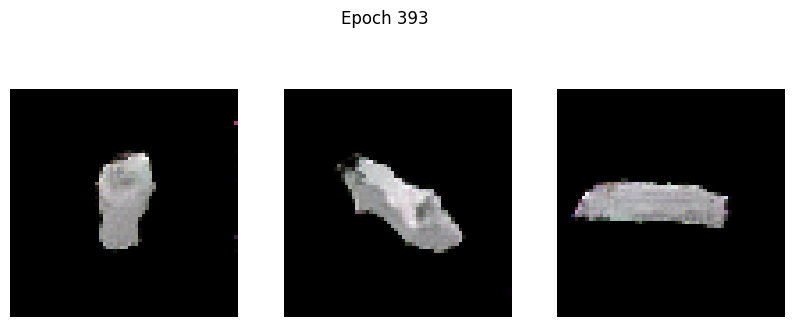

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -102.4013 - g_loss: 8.0982
Epoch 394/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 8248.9326 - g_loss: 1002.9586

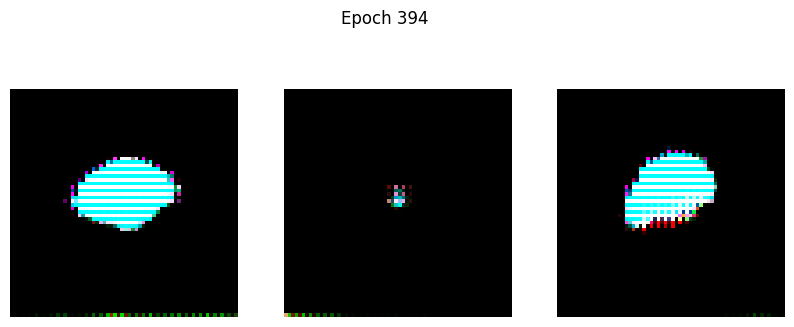

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 8261.6729 - g_loss: 1022.1887
Epoch 395/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 537.4987 - g_loss: 1657.1952

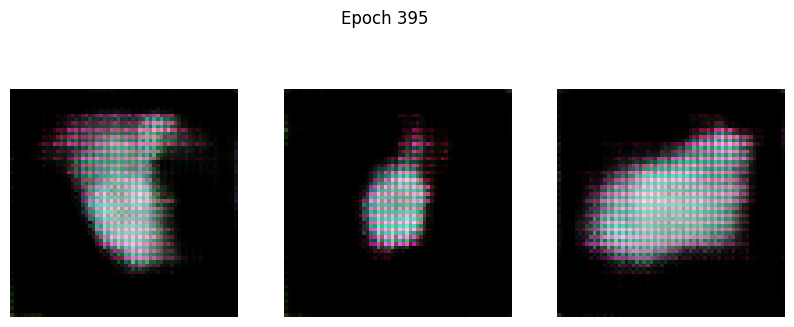

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 536.5453 - g_loss: 1652.1666
Epoch 396/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 505.7536 - g_loss: 322.0169

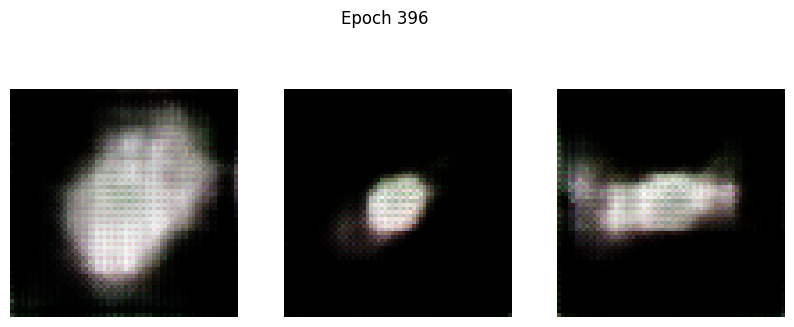

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 505.4362 - g_loss: 321.4171
Epoch 397/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 364.6900 - g_loss: 166.5113

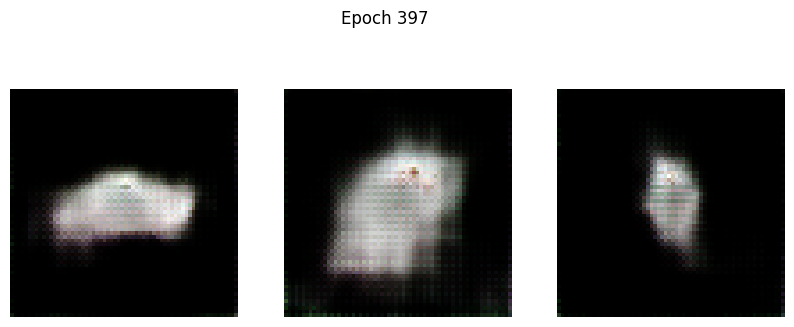

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 364.2668 - g_loss: 166.3329
Epoch 398/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 287.2897 - g_loss: 166.8101

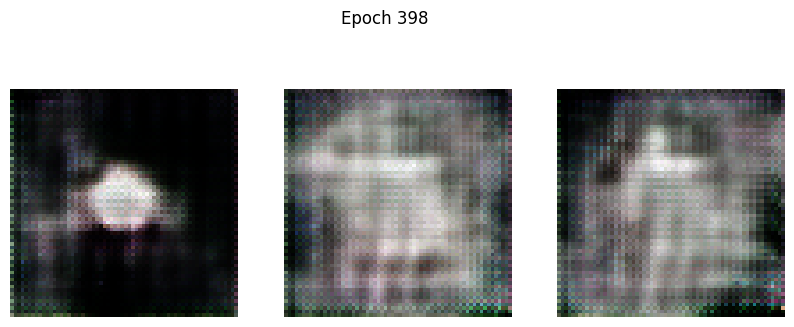

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 286.9369 - g_loss: 166.5502
Epoch 399/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 189.0291 - g_loss: 121.1284

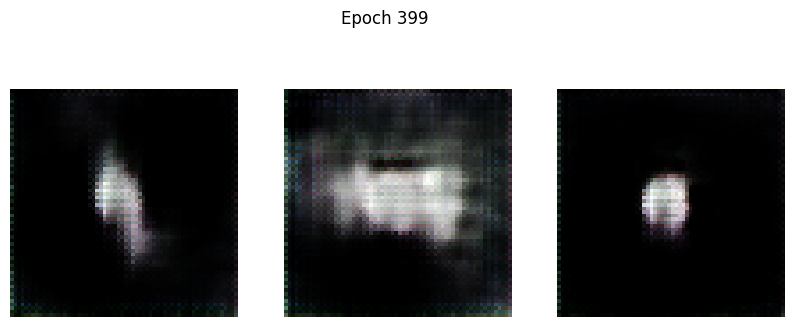

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 188.9120 - g_loss: 121.2171
Epoch 400/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 139.4474 - g_loss: 121.0835

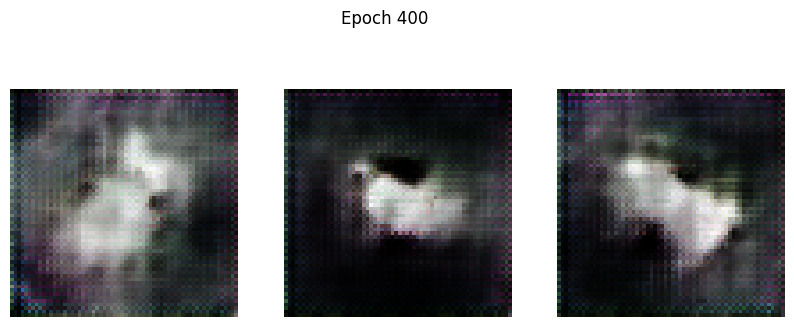

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 139.3096 - g_loss: 121.1109
Epoch 401/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 94.9908 - g_loss: 107.4886

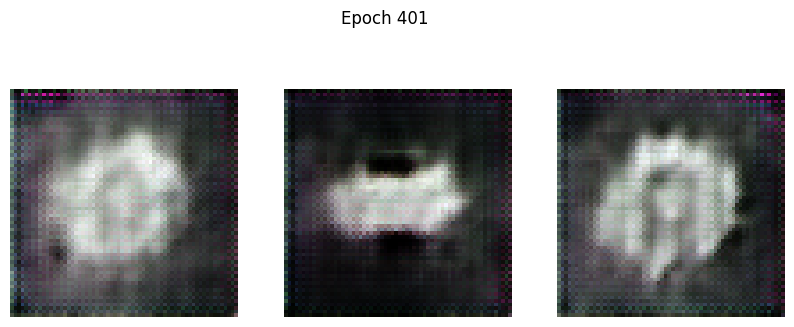

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 95.0494 - g_loss: 107.3982
Epoch 402/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 104.2659 - g_loss: 126.2335

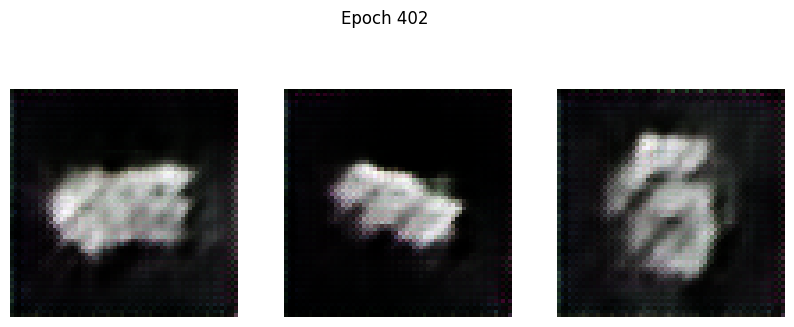

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 104.3994 - g_loss: 126.1830
Epoch 403/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 121.1101 - g_loss: 133.9096

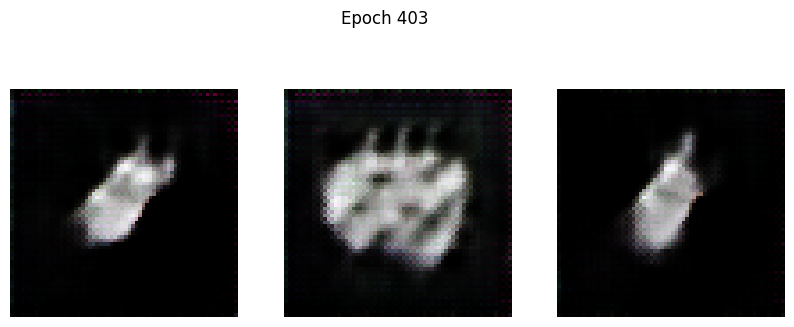

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 121.0736 - g_loss: 133.7350
Epoch 404/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 98.4493 - g_loss: 92.8408

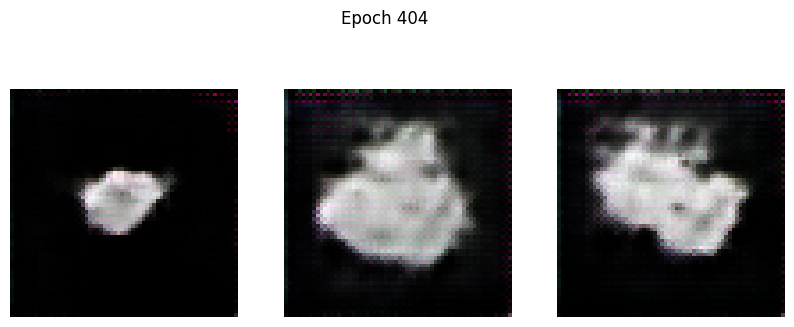

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 98.5019 - g_loss: 92.8898
Epoch 405/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 66.8167 - g_loss: 83.8748

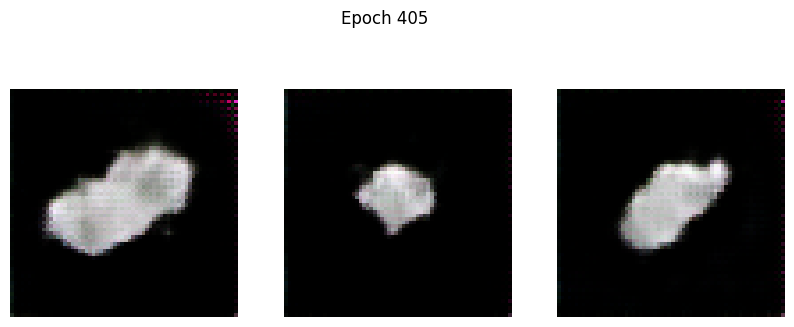

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 66.8577 - g_loss: 83.8670
Epoch 406/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 75.8151 - g_loss: 65.1167

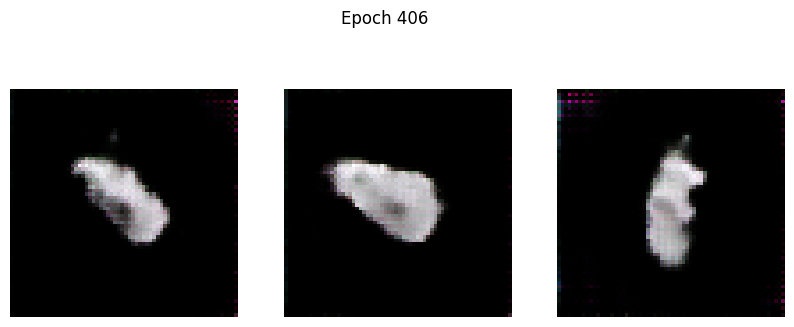

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 75.6823 - g_loss: 65.0554
Epoch 407/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 64.2781 - g_loss: 63.1549

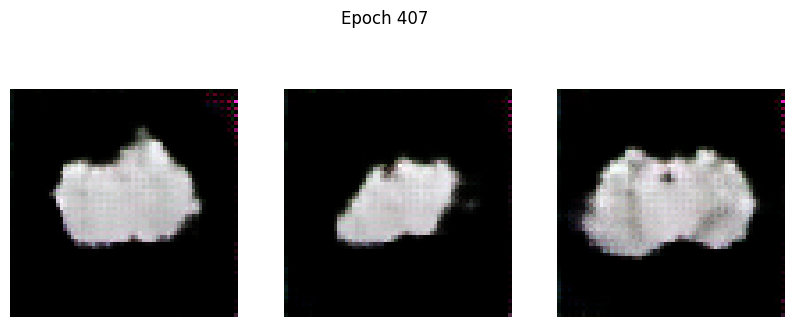

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 64.1875 - g_loss: 63.0928
Epoch 408/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 50.5086 - g_loss: 57.5948

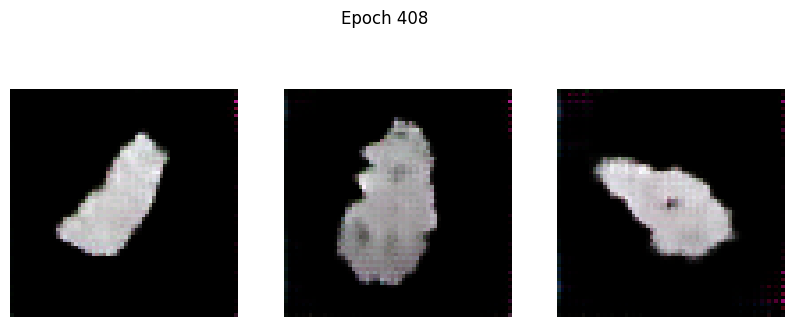

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 50.5238 - g_loss: 57.6063
Epoch 409/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 33.8394 - g_loss: 51.8065

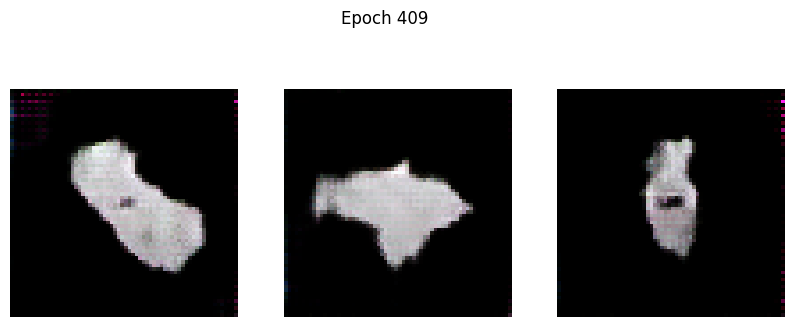

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 33.8570 - g_loss: 51.7687
Epoch 410/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 37.6908 - g_loss: 38.4627

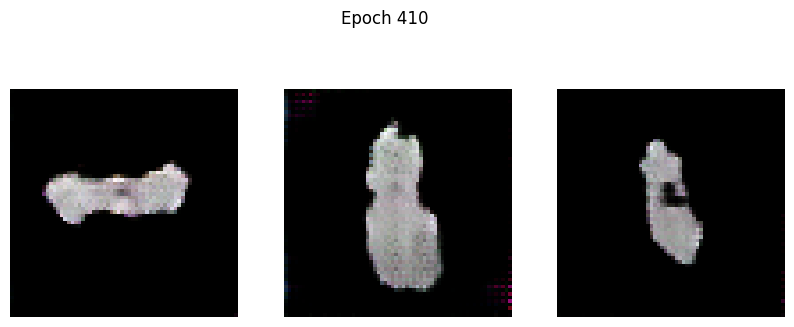

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 37.6409 - g_loss: 38.4634
Epoch 411/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 18.1688 - g_loss: 39.4684

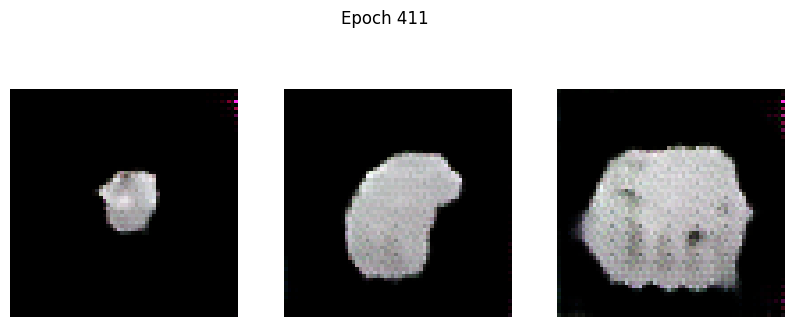

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 18.2840 - g_loss: 39.4906
Epoch 412/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 29.9468 - g_loss: 33.5830

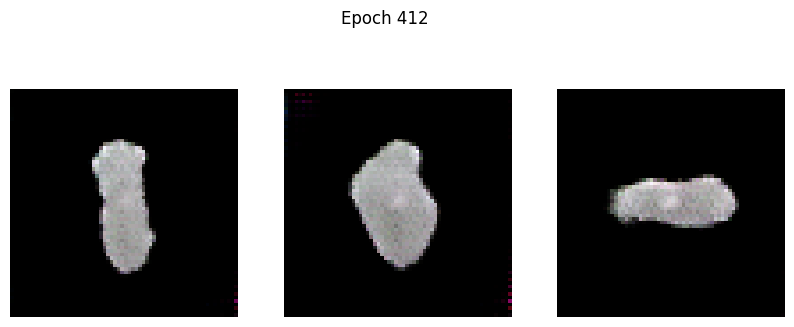

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 29.9390 - g_loss: 33.6215
Epoch 413/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 20.3273 - g_loss: 33.0413

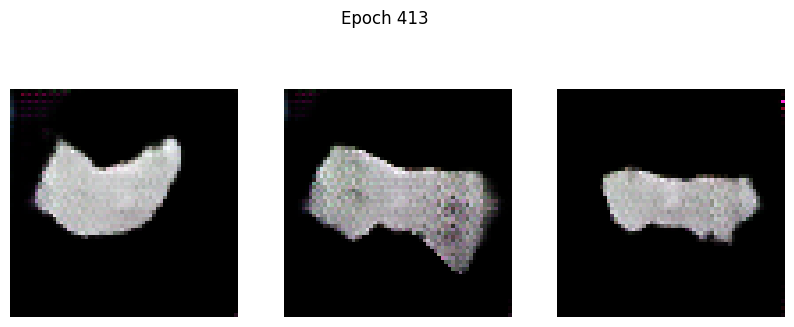

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 20.2861 - g_loss: 33.0246
Epoch 414/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 18.5343 - g_loss: 26.6664

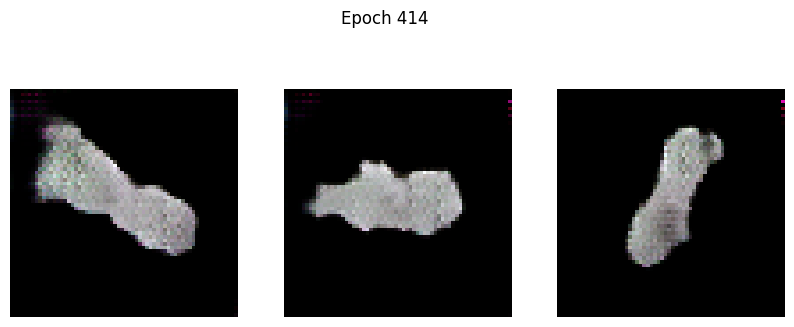

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 18.4618 - g_loss: 26.6928
Epoch 415/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.5071 - g_loss: 23.9367

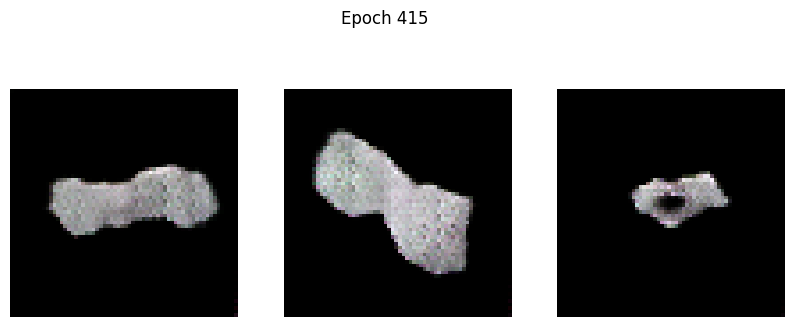

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.5598 - g_loss: 23.9345
Epoch 416/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.5521 - g_loss: 26.3091

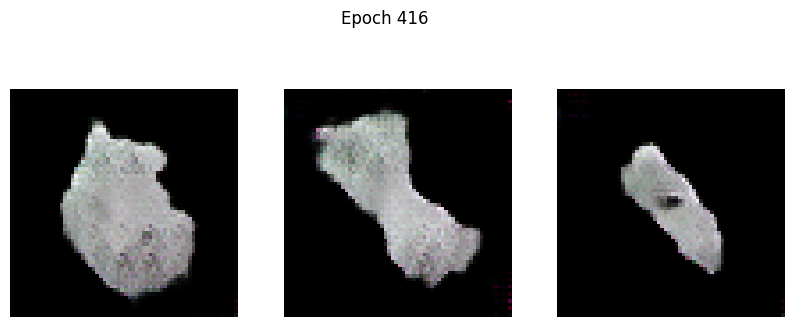

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4825 - g_loss: 26.2916
Epoch 417/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.1013 - g_loss: 20.1183

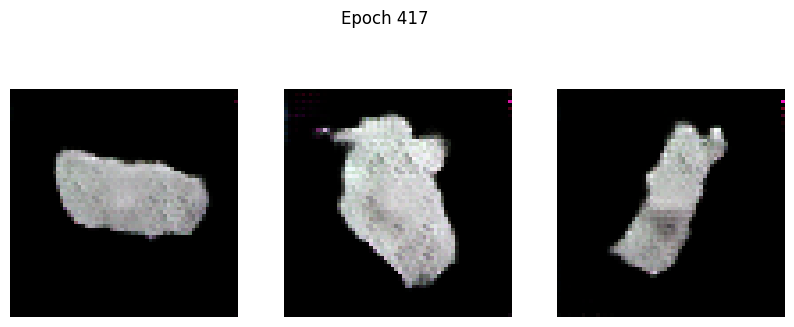

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.1284 - g_loss: 20.1196
Epoch 418/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 6.6142 - g_loss: 29.6670

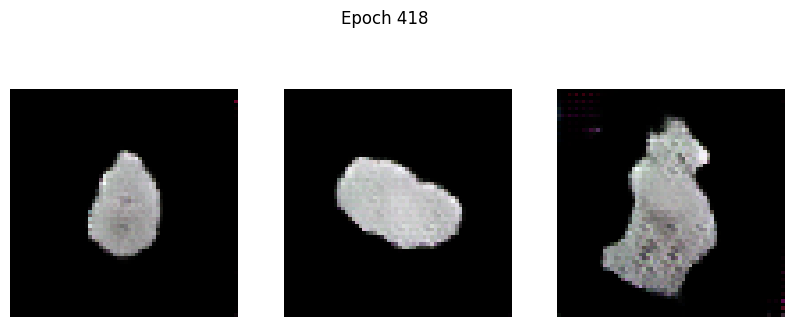

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 6.5459 - g_loss: 29.6158
Epoch 419/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -4.4228 - g_loss: 25.1096

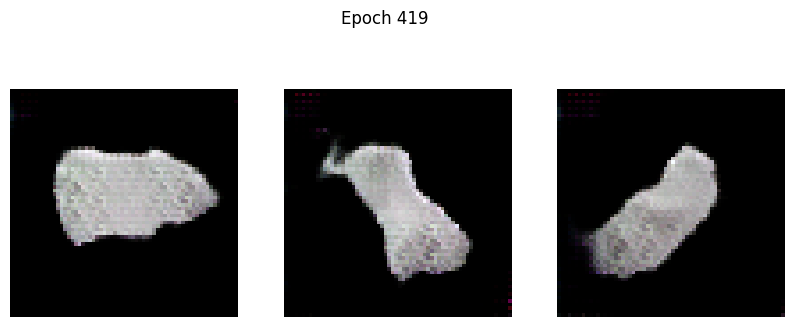

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -4.3628 - g_loss: 25.1079
Epoch 420/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 8.7347 - g_loss: 26.8772

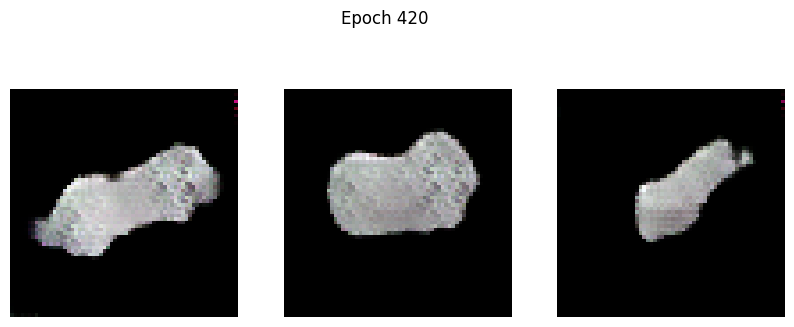

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 8.6537 - g_loss: 26.8546
Epoch 421/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -2.6635 - g_loss: 19.5902

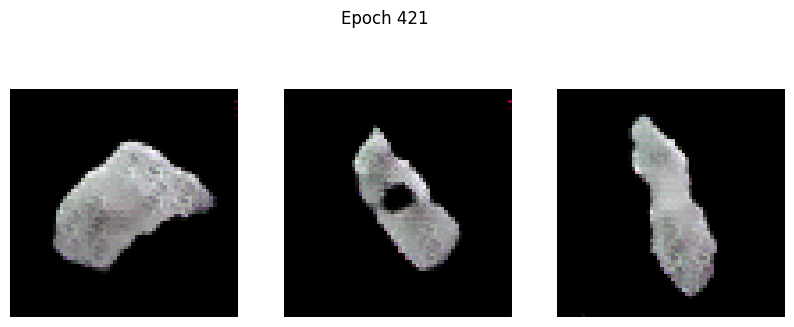

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -2.6822 - g_loss: 19.5983
Epoch 422/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -5.4887 - g_loss: 17.9950

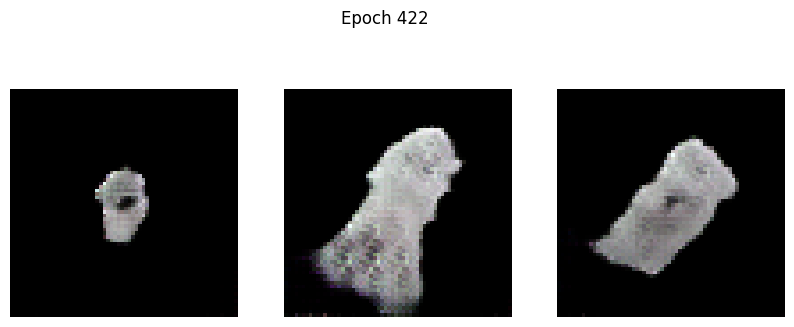

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -5.5297 - g_loss: 17.9846
Epoch 423/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -7.5086 - g_loss: 17.9794

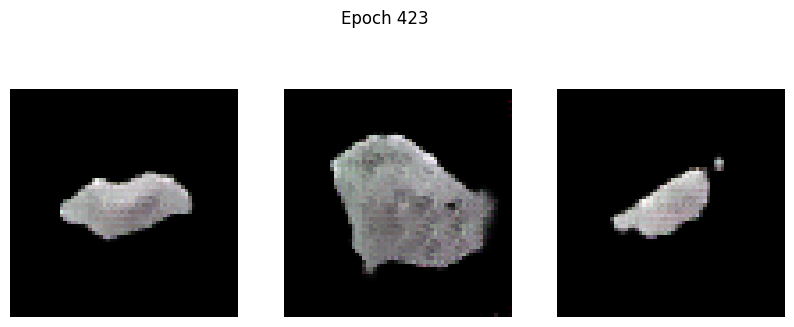

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.4891 - g_loss: 18.0007
Epoch 424/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -8.1292 - g_loss: 21.4578

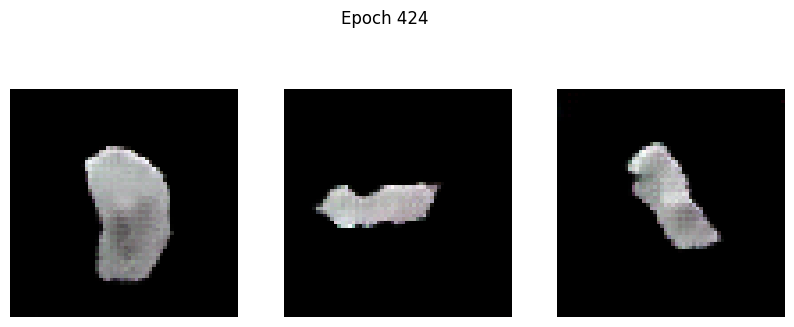

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -8.1922 - g_loss: 21.4386
Epoch 425/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -20.5866 - g_loss: 15.5265

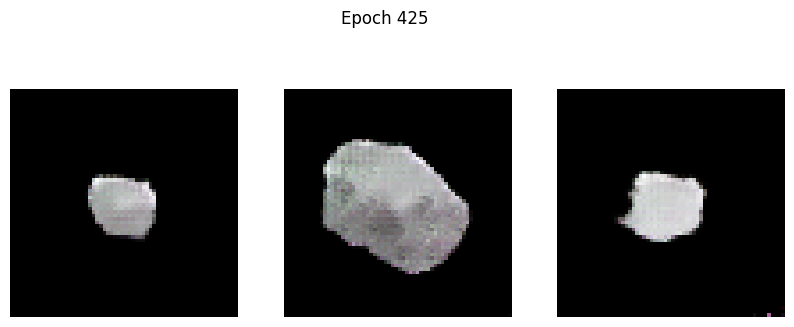

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -20.5611 - g_loss: 15.5260
Epoch 426/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -15.1838 - g_loss: 17.8747

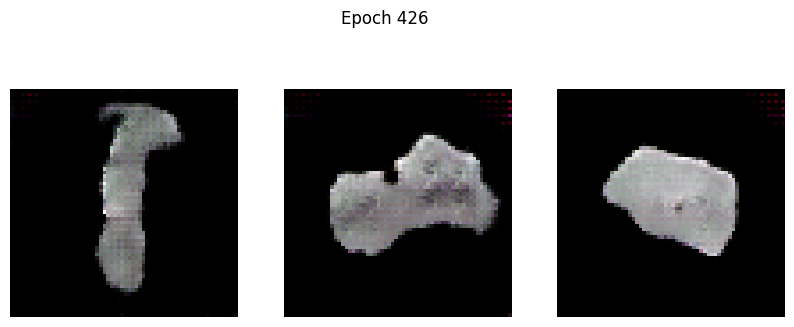

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -15.1827 - g_loss: 17.8751
Epoch 427/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -24.3033 - g_loss: 20.8482

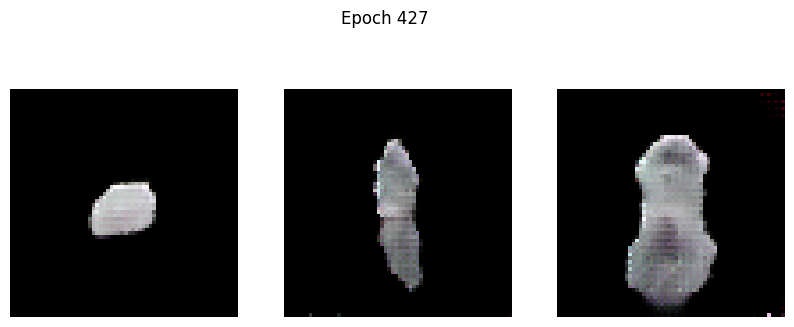

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -24.2717 - g_loss: 20.8376
Epoch 428/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -15.8507 - g_loss: 17.2638

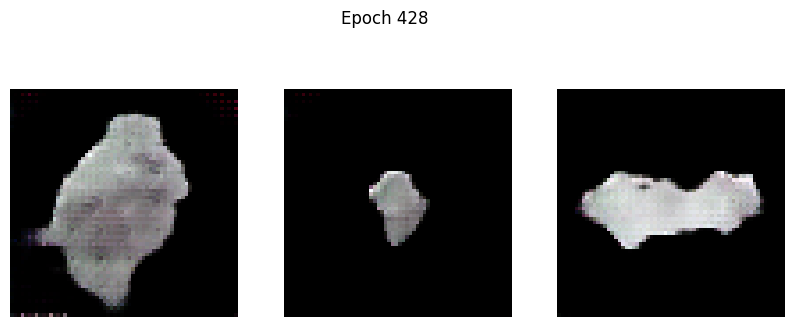

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -15.9018 - g_loss: 17.2590
Epoch 429/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -24.7048 - g_loss: 12.1040

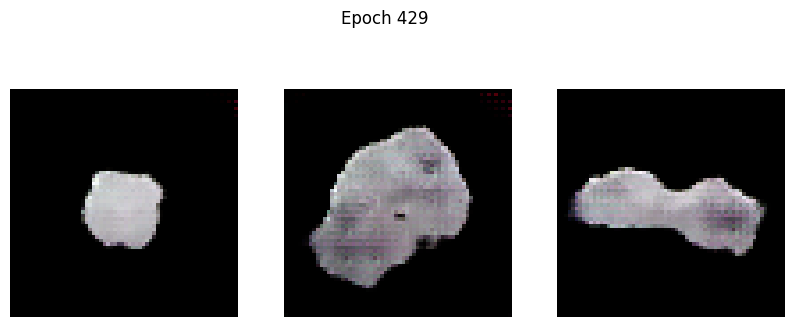

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -24.7450 - g_loss: 12.1154
Epoch 430/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -25.1461 - g_loss: 14.6556

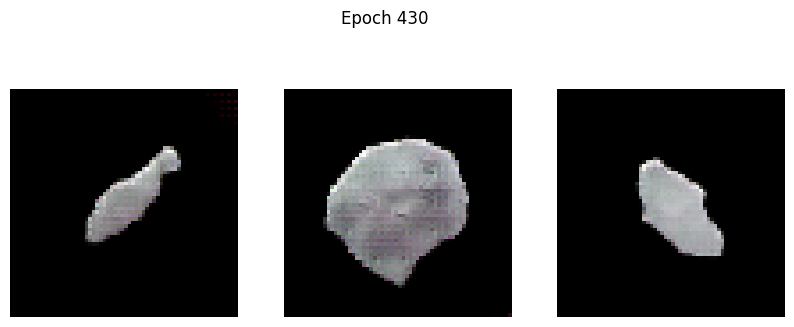

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -25.1873 - g_loss: 14.6485
Epoch 431/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -30.6795 - g_loss: 14.5970

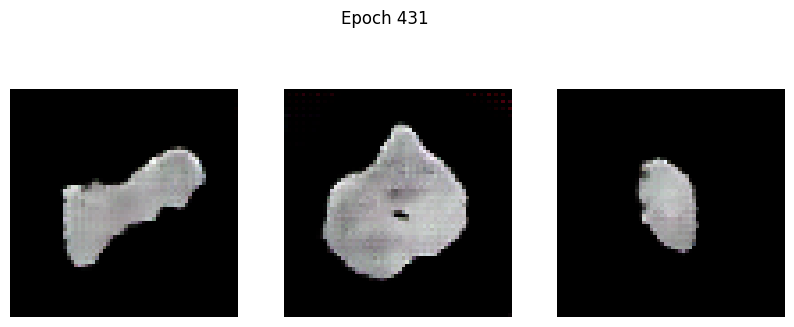

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: -30.7339 - g_loss: 14.5966
Epoch 432/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -29.2995 - g_loss: 14.6671

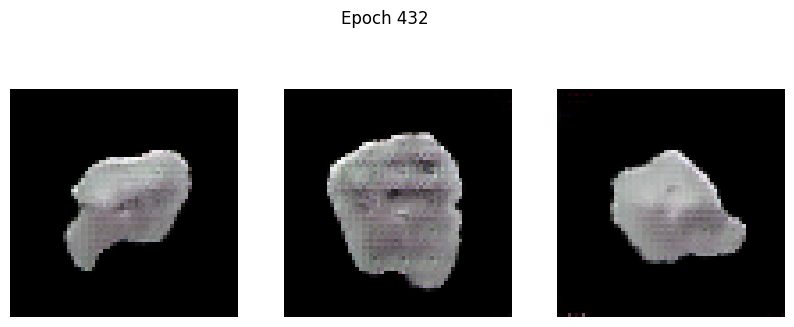

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -29.3371 - g_loss: 14.6672
Epoch 433/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -23.2106 - g_loss: 14.7798

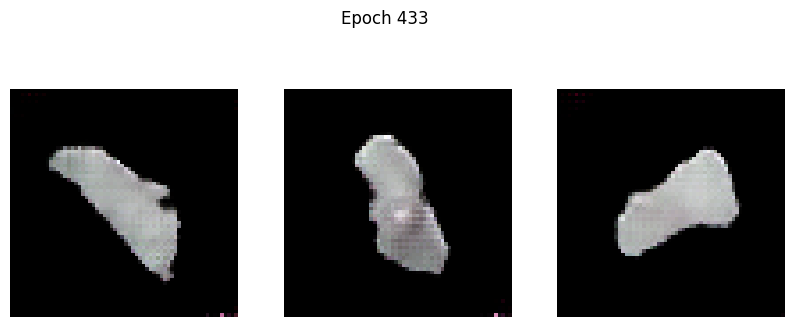

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -23.2920 - g_loss: 14.7875
Epoch 434/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -34.0664 - g_loss: 13.2158

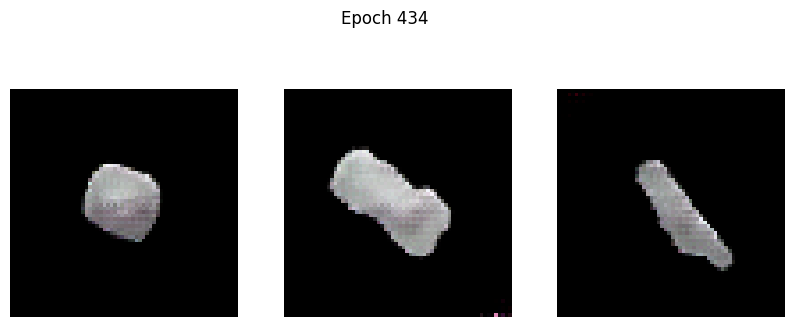

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -34.1281 - g_loss: 13.2146
Epoch 435/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -29.8569 - g_loss: 14.8346

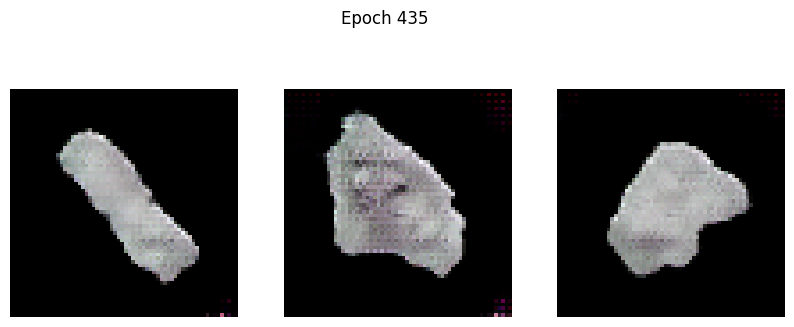

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -29.9561 - g_loss: 14.8302
Epoch 436/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -37.2495 - g_loss: 12.1371

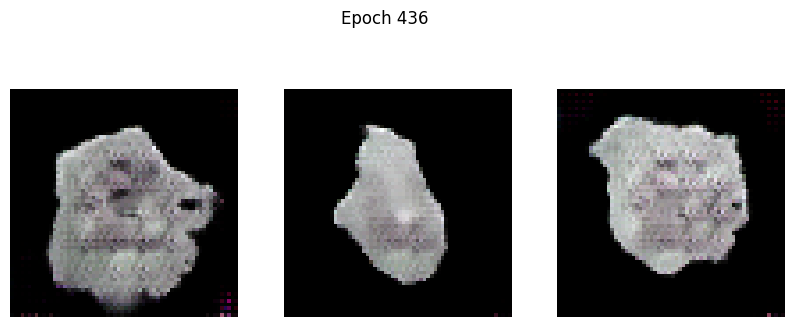

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -37.2998 - g_loss: 12.1424
Epoch 437/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -42.0303 - g_loss: 13.9576

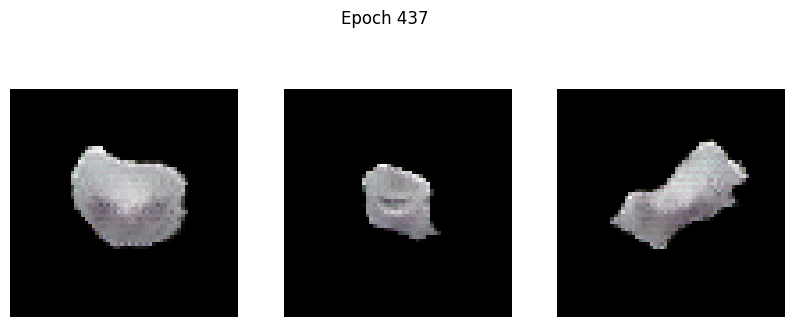

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -42.0752 - g_loss: 13.9472
Epoch 438/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -44.6619 - g_loss: 12.8798

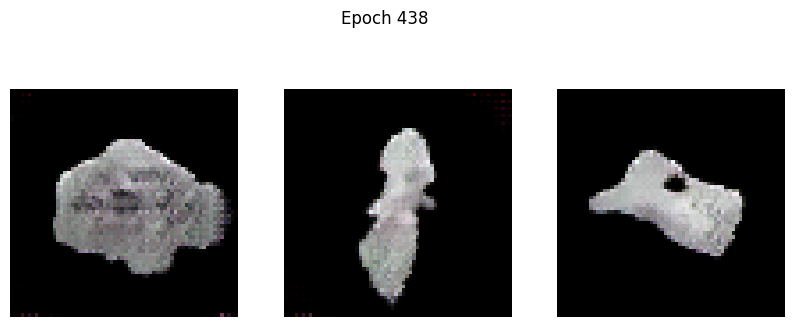

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -44.6326 - g_loss: 12.8692
Epoch 439/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -41.6718 - g_loss: 11.1081

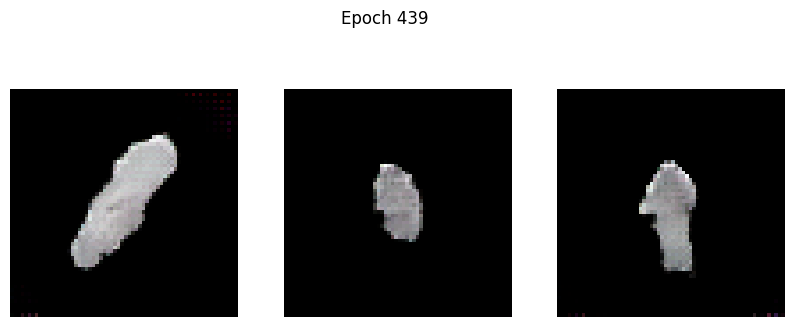

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -41.6801 - g_loss: 11.1124
Epoch 440/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -60.0594 - g_loss: 11.7467

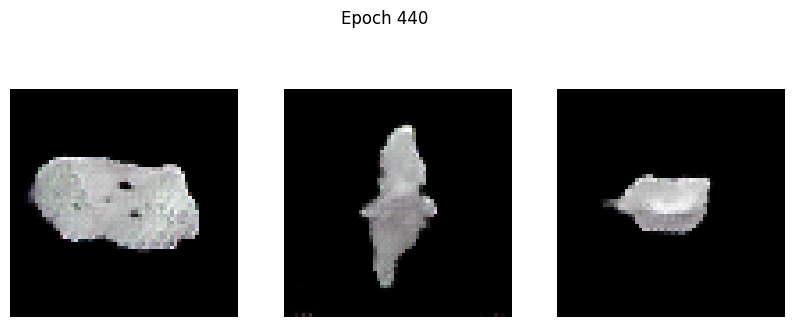

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: -60.0040 - g_loss: 11.7467
Epoch 441/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -54.5852 - g_loss: 13.2706

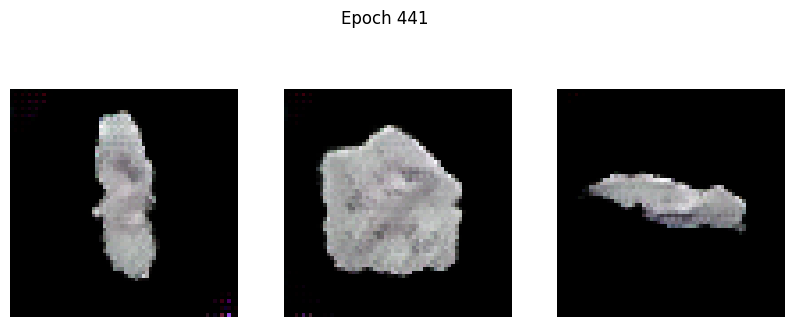

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -54.5248 - g_loss: 13.2601
Epoch 442/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -58.7252 - g_loss: 11.9981

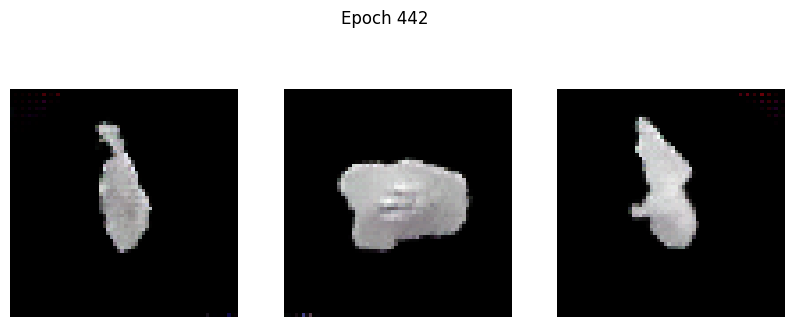

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -58.7103 - g_loss: 11.9948
Epoch 443/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -43.8502 - g_loss: 11.5068

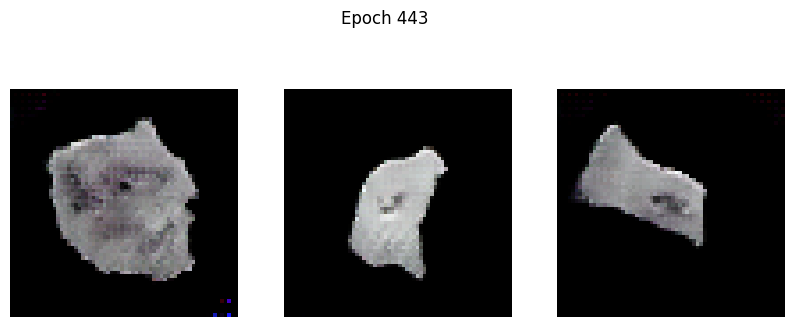

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -44.0592 - g_loss: 11.5058
Epoch 444/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -54.8168 - g_loss: 9.8519

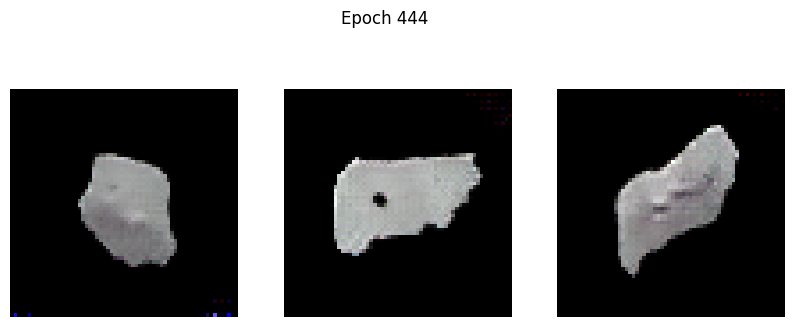

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -54.8861 - g_loss: 9.8525
Epoch 445/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -71.8326 - g_loss: 11.1251

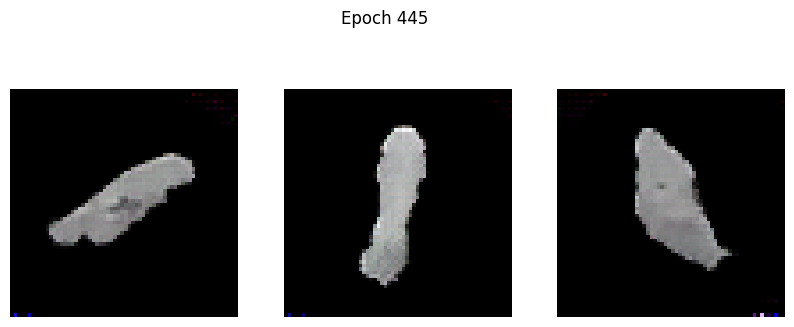

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -71.7717 - g_loss: 11.1206
Epoch 446/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -78.6720 - g_loss: 10.4538

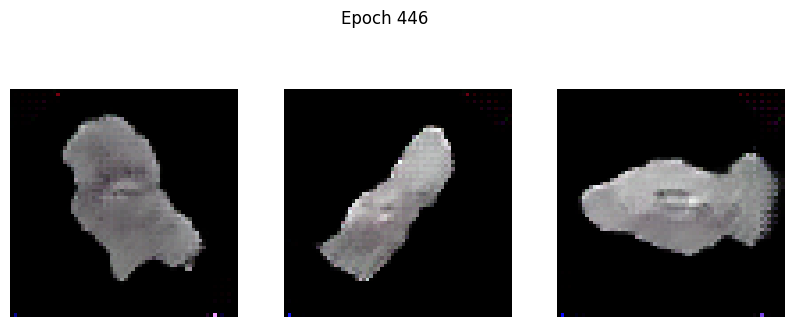

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -78.6073 - g_loss: 10.4487
Epoch 447/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -52.4414 - g_loss: 8.2789

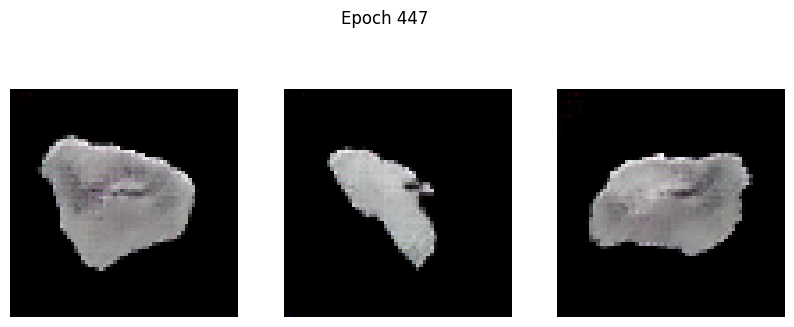

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -52.5840 - g_loss: 8.2884
Epoch 448/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -76.1340 - g_loss: 9.4812

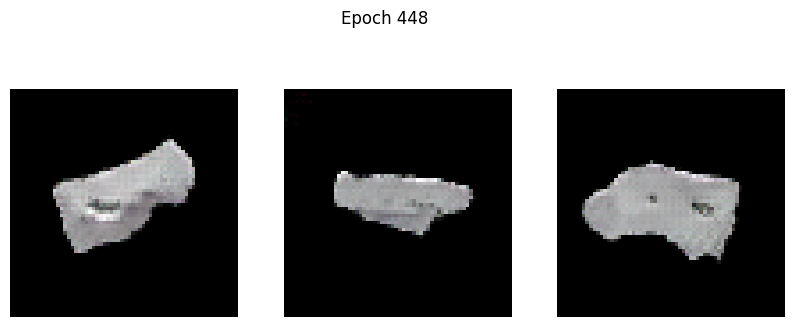

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -76.0662 - g_loss: 9.4779
Epoch 449/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -75.0994 - g_loss: 9.0298

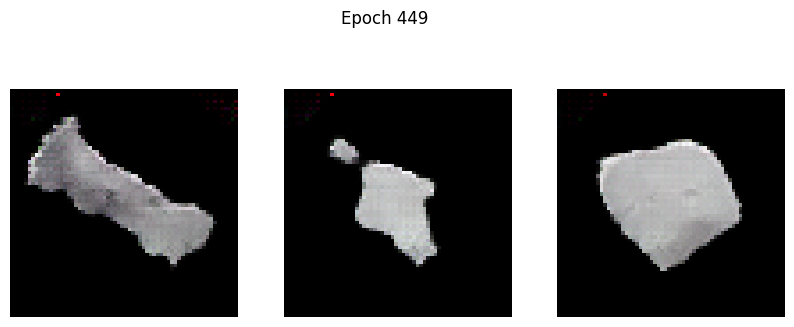

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -75.1031 - g_loss: 9.0288
Epoch 450/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -67.0410 - g_loss: 8.2602

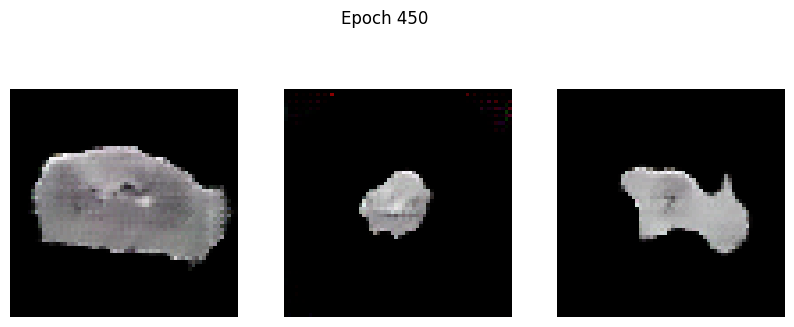

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -67.1464 - g_loss: 8.2568
Epoch 451/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -92.3774 - g_loss: 7.7077

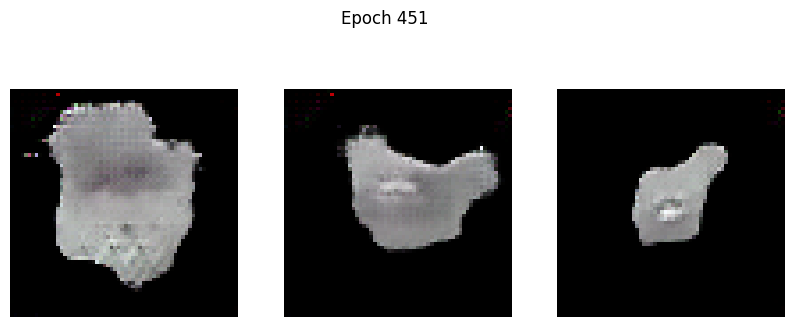

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -92.2396 - g_loss: 7.7085
Epoch 452/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -71.9430 - g_loss: 8.0479

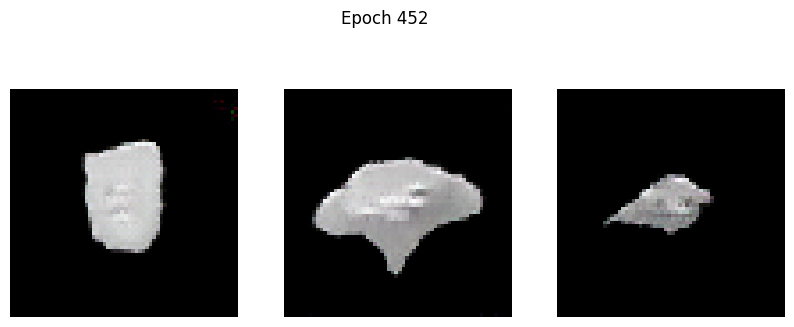

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -72.0505 - g_loss: 8.0459
Epoch 453/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -73.0636 - g_loss: 8.2863

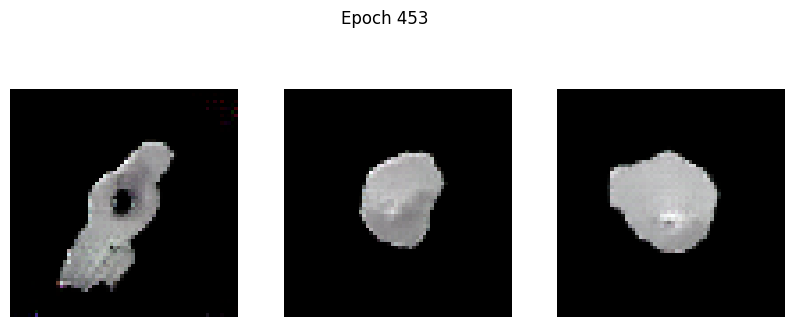

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -73.1354 - g_loss: 8.2822
Epoch 454/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -86.8642 - g_loss: 7.6855

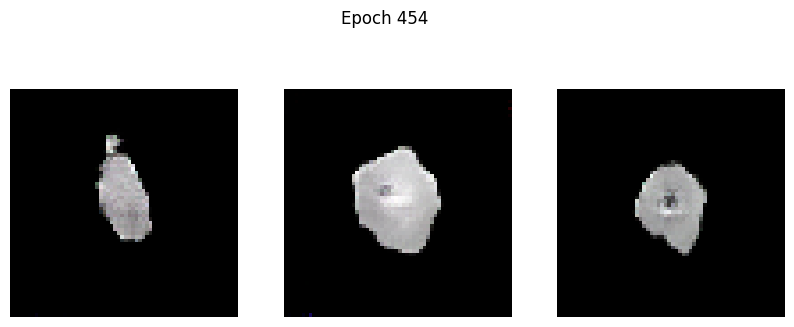

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -86.8662 - g_loss: 7.6862
Epoch 455/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -102.9290 - g_loss: 8.0059

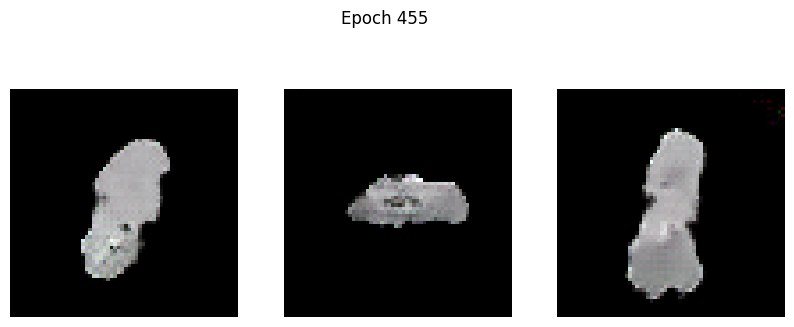

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -102.8364 - g_loss: 8.0050
Epoch 456/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -116.1296 - g_loss: 8.3062

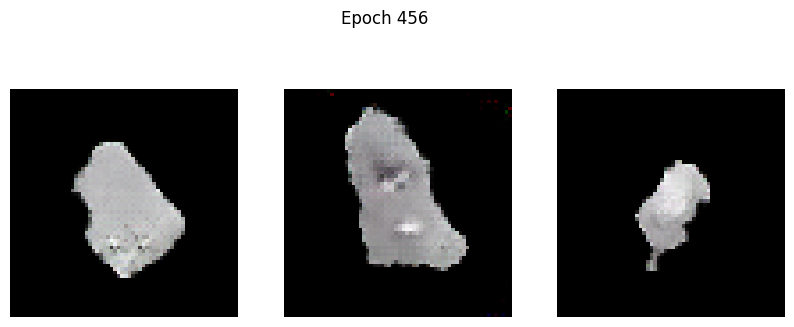

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -115.9833 - g_loss: 8.3086
Epoch 457/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -96.6986 - g_loss: 9.2438

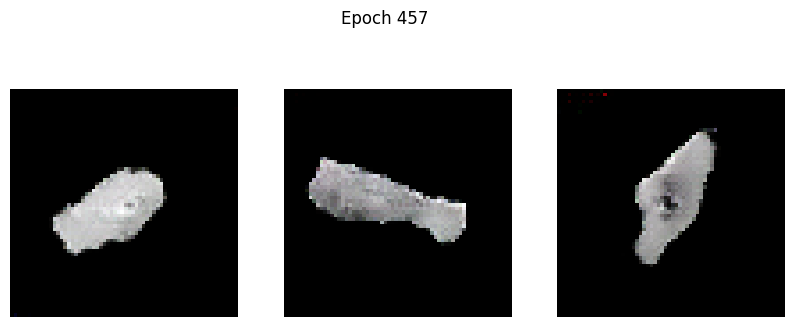

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -96.6795 - g_loss: 9.2451
Epoch 458/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -105.5892 - g_loss: 9.7583

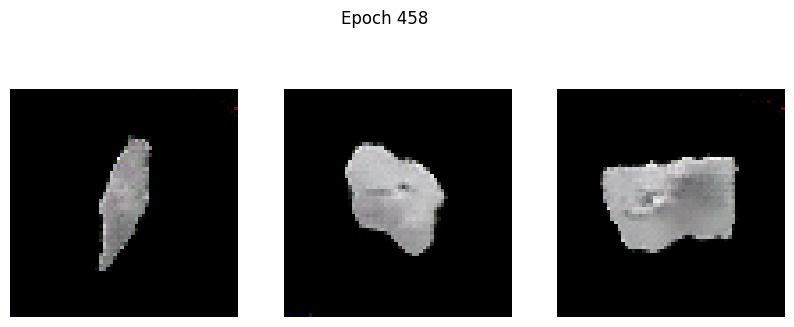

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -105.6066 - g_loss: 9.7567
Epoch 459/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -86.4032 - g_loss: 7.8013

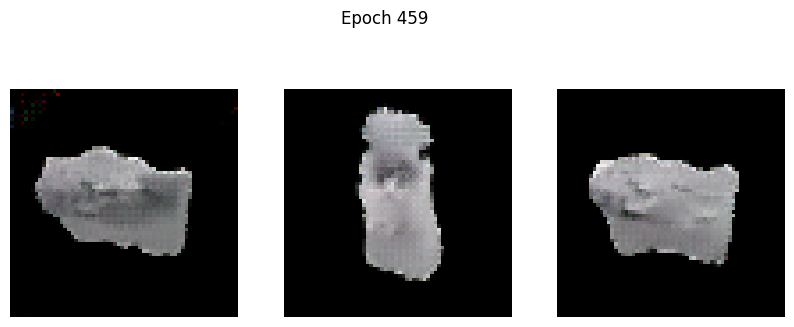

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -86.5944 - g_loss: 7.8066
Epoch 460/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -101.1712 - g_loss: 8.5909

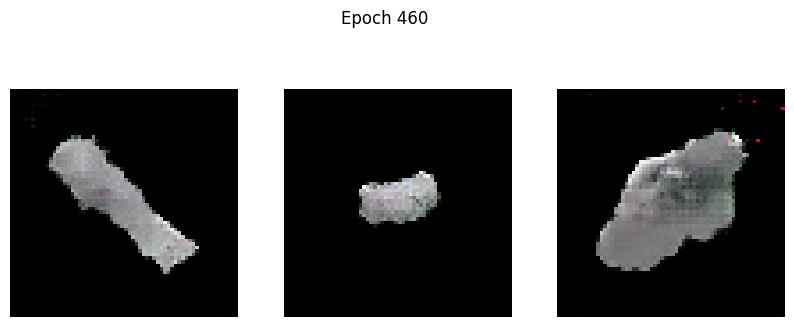

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: -101.1944 - g_loss: 8.5964
Epoch 461/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -137.1259 - g_loss: 10.7250

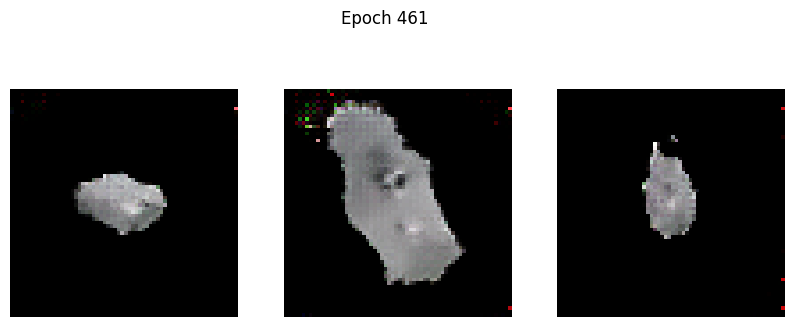

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -136.8313 - g_loss: 10.7188
Epoch 462/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -103.7814 - g_loss: 9.3804

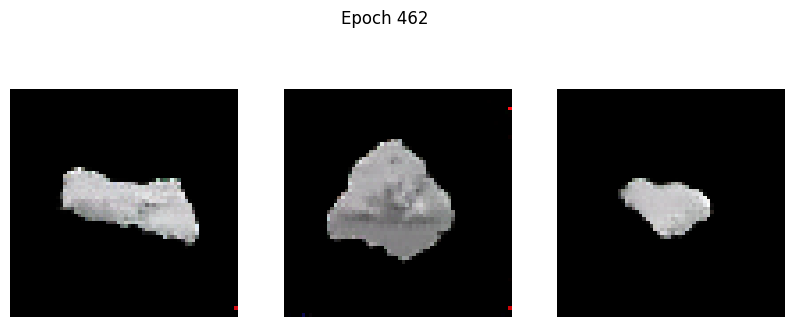

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -103.8842 - g_loss: 9.3791
Epoch 463/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -133.3548 - g_loss: 7.4988

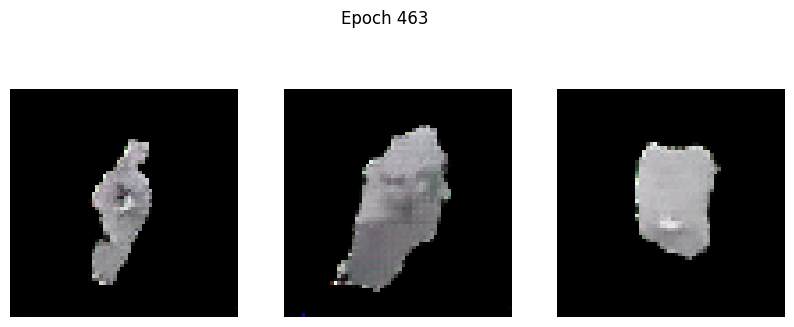

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -133.2908 - g_loss: 7.4991
Epoch 464/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -125.3537 - g_loss: 10.7058

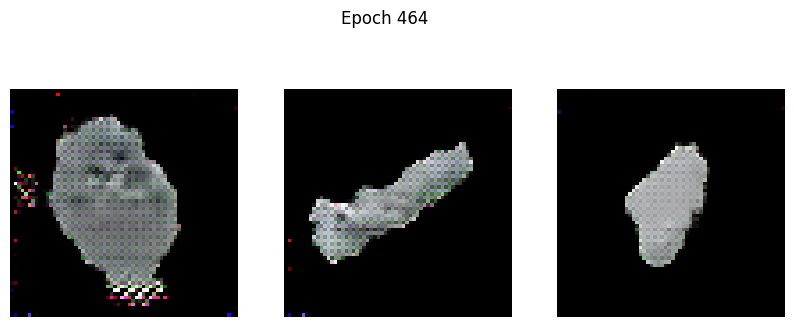

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -124.8668 - g_loss: 10.7538
Epoch 465/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2942.6658 - g_loss: 455.6575

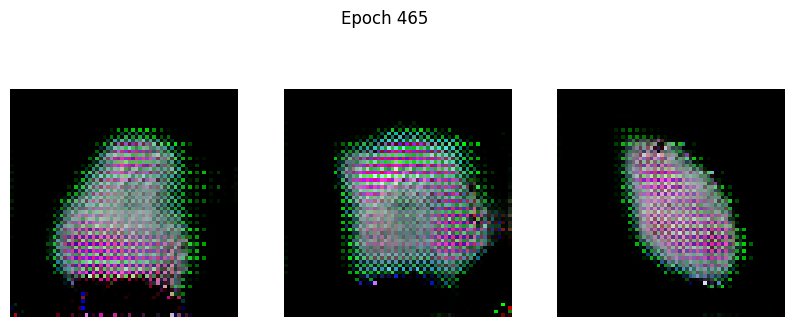

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 2961.5205 - g_loss: 460.4815
Epoch 466/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 568.1151 - g_loss: 422.6791

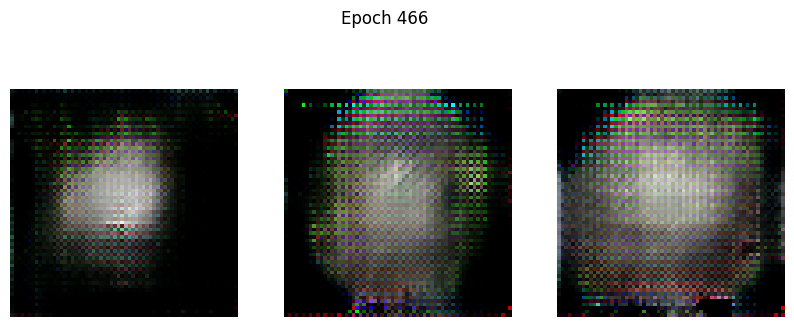

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 567.2502 - g_loss: 421.4991
Epoch 467/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 304.7415 - g_loss: 207.7371

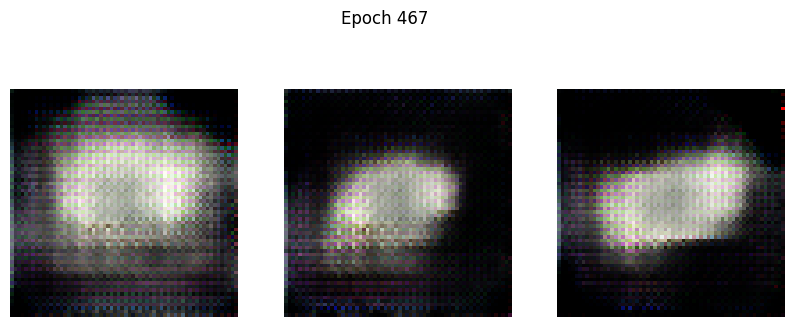

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 304.4106 - g_loss: 207.6748
Epoch 468/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 204.7339 - g_loss: 185.2435

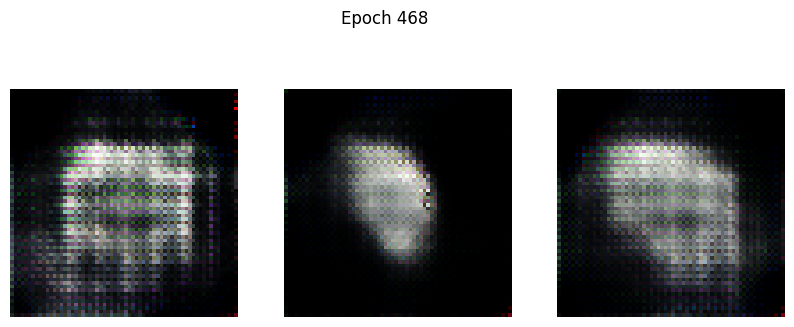

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 204.3872 - g_loss: 185.2630
Epoch 469/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 141.1427 - g_loss: 145.7715

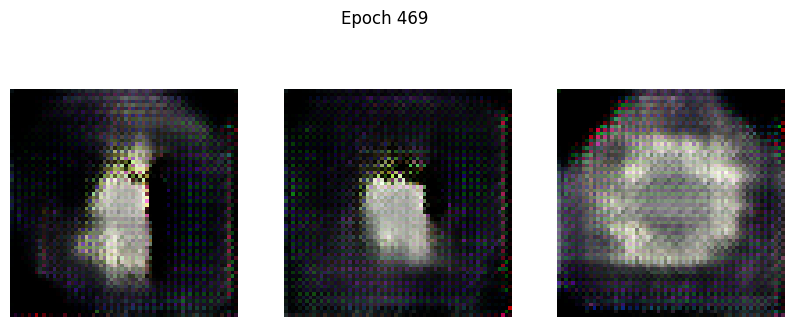

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 141.1862 - g_loss: 145.7561
Epoch 470/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 112.1431 - g_loss: 137.6071

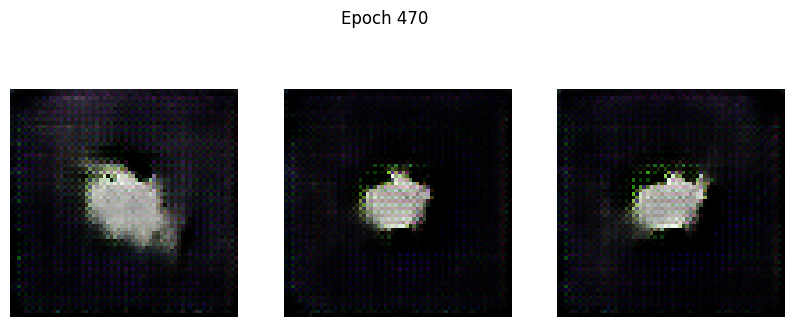

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 112.1693 - g_loss: 137.5931
Epoch 471/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 87.0733 - g_loss: 122.7863

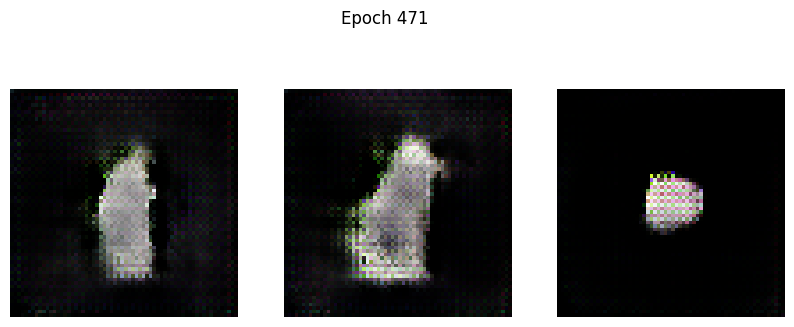

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 87.0109 - g_loss: 122.7054
Epoch 472/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 62.7064 - g_loss: 105.0039

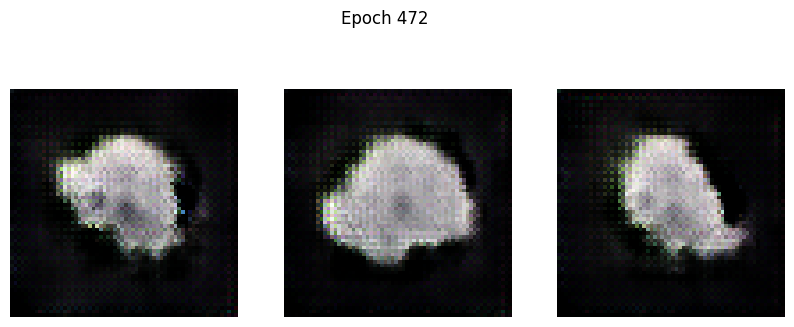

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 62.7350 - g_loss: 104.9788
Epoch 473/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 66.2621 - g_loss: 100.9962

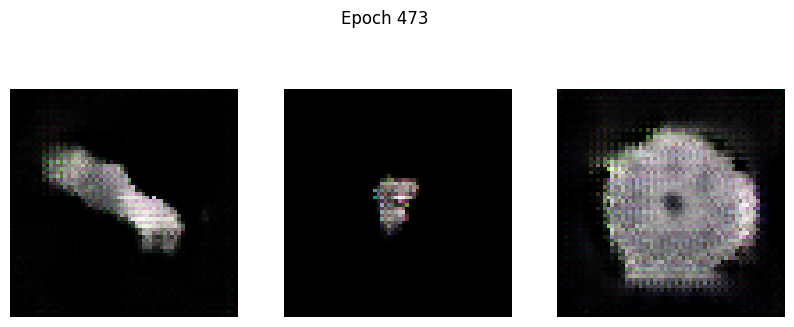

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 66.2749 - g_loss: 100.9329
Epoch 474/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 68.1070 - g_loss: 83.8536

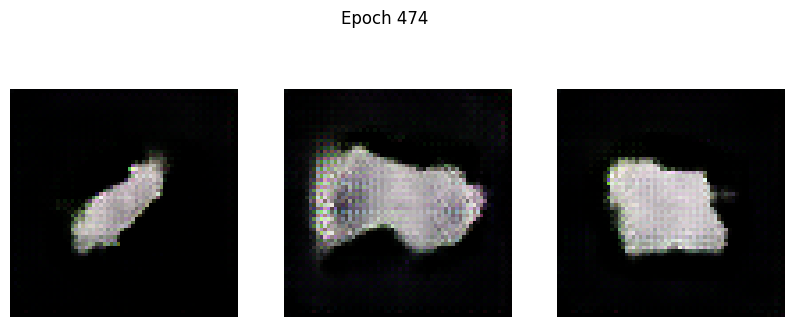

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 68.0305 - g_loss: 83.8502
Epoch 475/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 59.7162 - g_loss: 80.9875

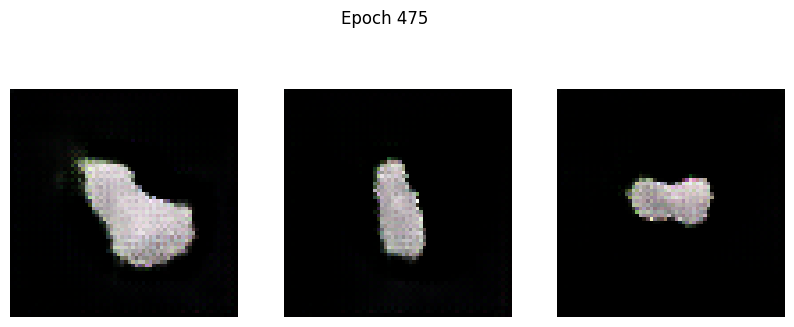

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 59.6739 - g_loss: 80.9647
Epoch 476/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 29.4113 - g_loss: 60.7070

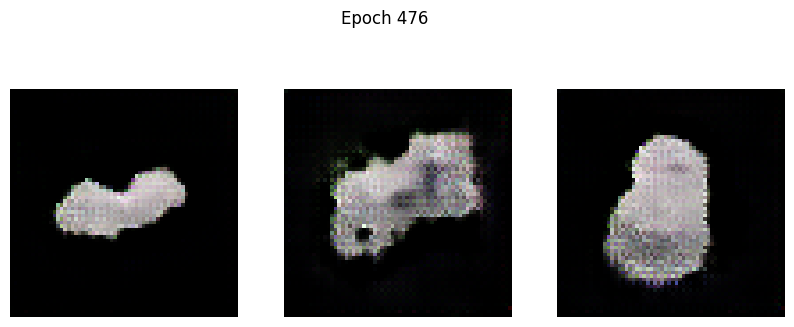

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 29.4841 - g_loss: 60.7379
Epoch 477/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 40.5956 - g_loss: 56.9295

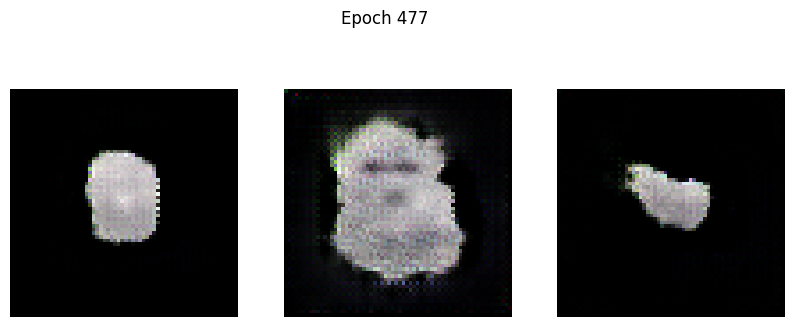

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 40.5256 - g_loss: 56.9409
Epoch 478/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 32.1071 - g_loss: 61.6781

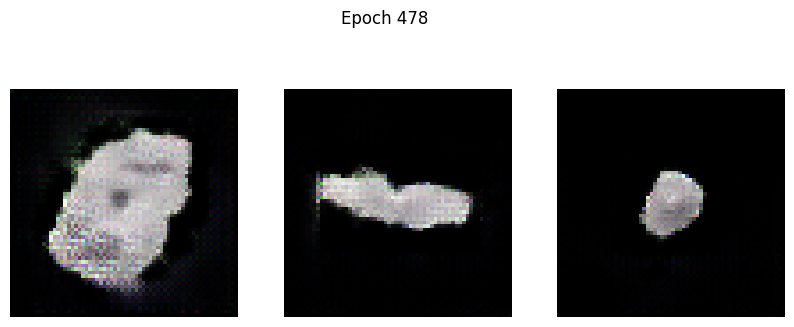

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 32.1205 - g_loss: 61.6918
Epoch 479/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 26.1466 - g_loss: 48.4946

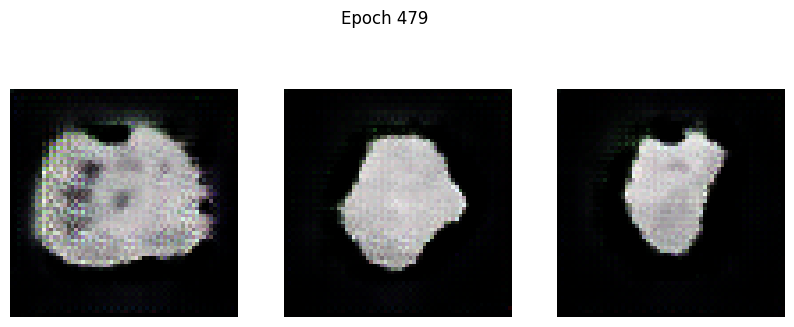

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 26.1235 - g_loss: 48.5373
Epoch 480/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 18.0698 - g_loss: 51.9431

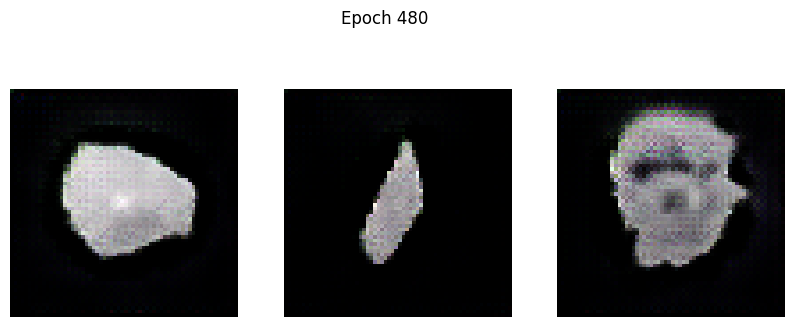

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 18.1060 - g_loss: 51.9468
Epoch 481/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 36.2618 - g_loss: 51.8797

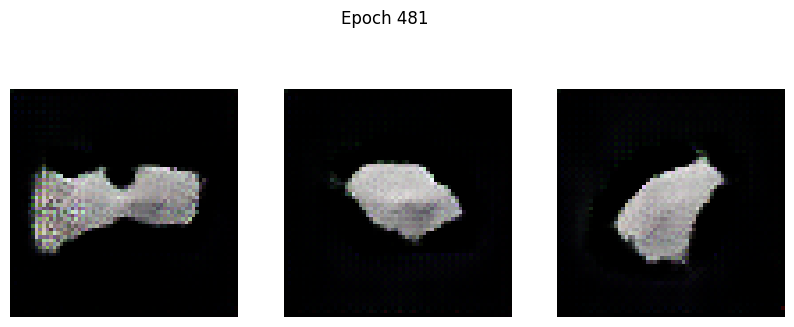

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 36.0853 - g_loss: 51.8687
Epoch 482/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 8.1613 - g_loss: 37.4063

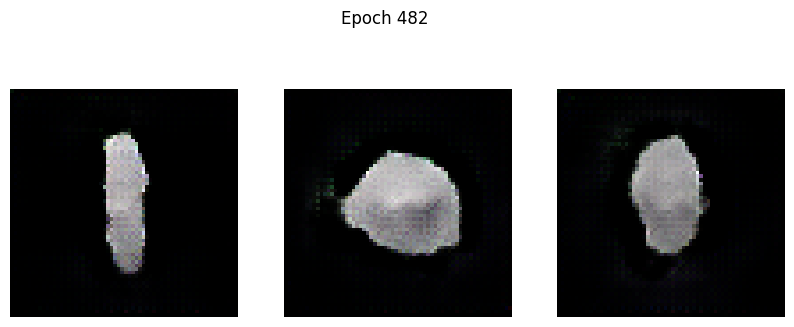

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 8.1938 - g_loss: 37.4847
Epoch 483/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 8.6941 - g_loss: 36.5302

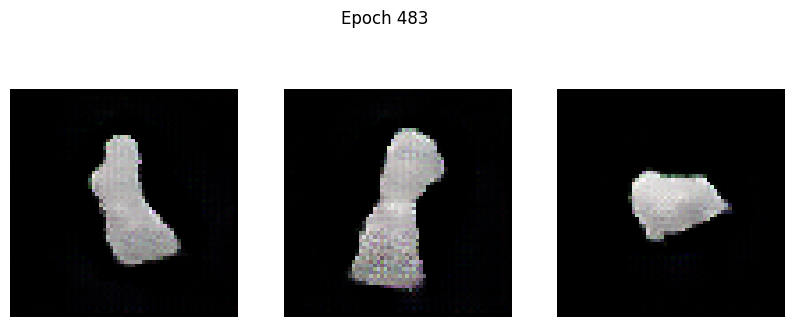

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 8.6834 - g_loss: 36.5873
Epoch 484/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -8.2561 - g_loss: 38.2807

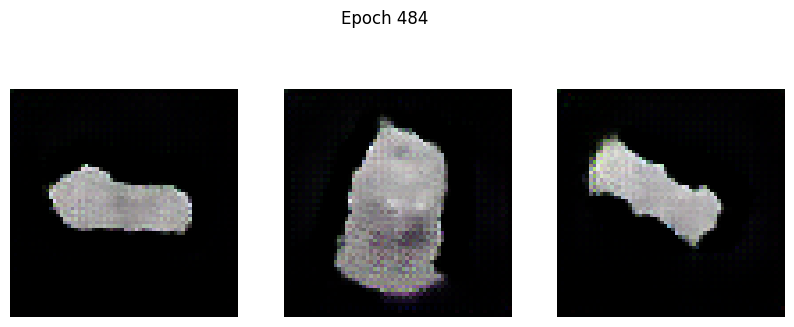

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -8.1871 - g_loss: 38.3165
Epoch 485/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 5.0041 - g_loss: 44.4057

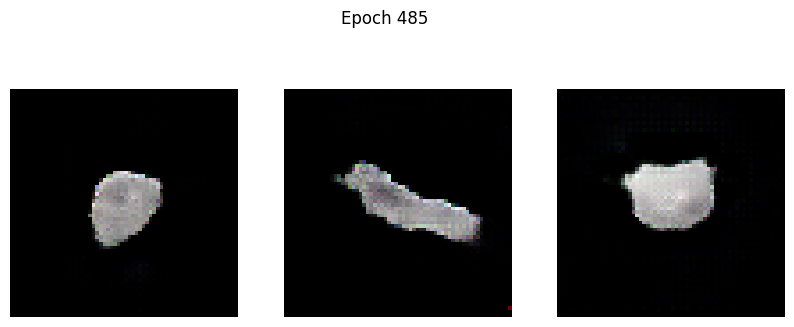

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 4.9705 - g_loss: 44.3449
Epoch 486/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 6.8832 - g_loss: 36.7485

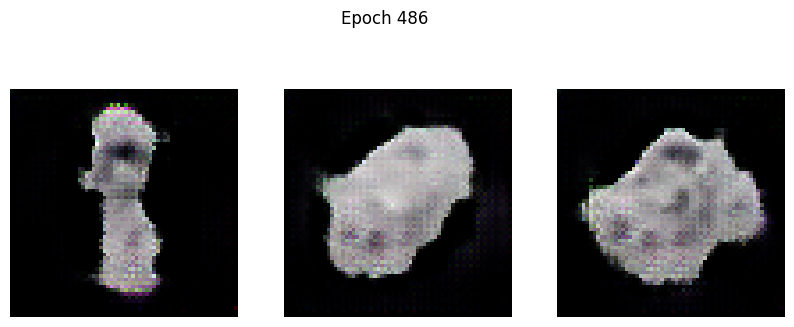

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 6.8523 - g_loss: 36.7606
Epoch 487/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.9515 - g_loss: 32.9521

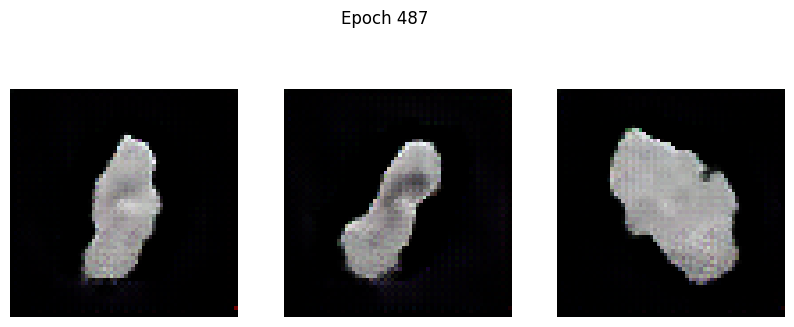

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.9113 - g_loss: 32.9637
Epoch 488/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -22.5424 - g_loss: 31.7510

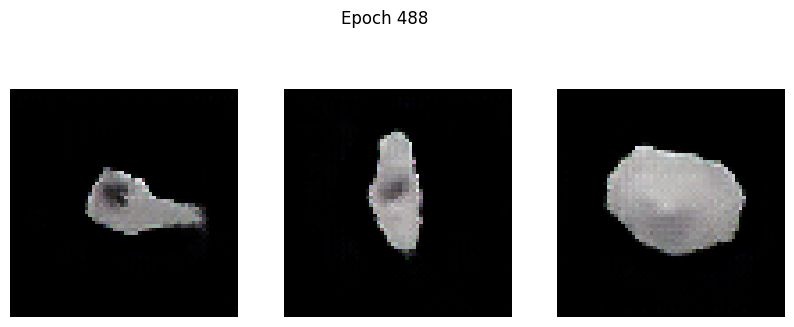

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -22.4265 - g_loss: 31.7644
Epoch 489/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -28.9124 - g_loss: 27.4182

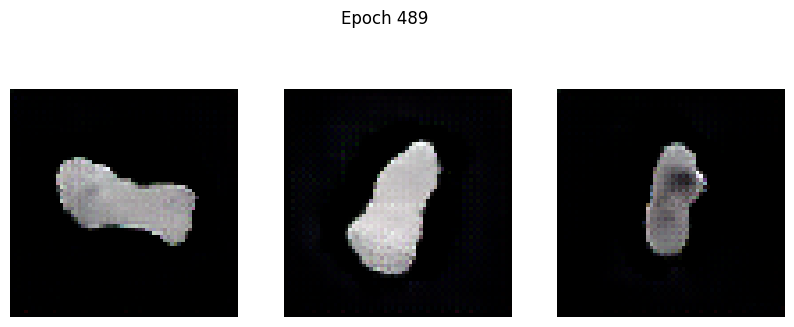

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -28.7860 - g_loss: 27.4168
Epoch 490/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -20.7129 - g_loss: 27.8524

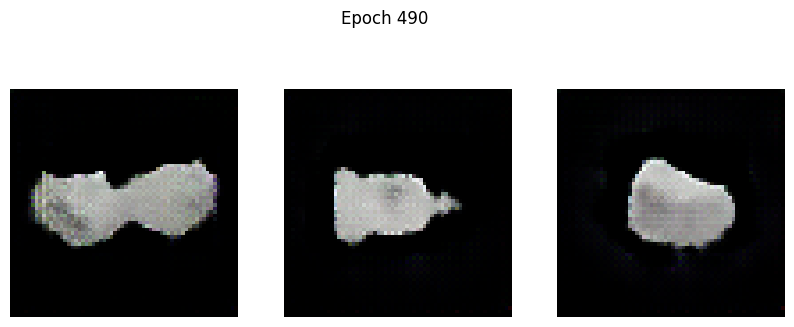

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -20.7481 - g_loss: 27.8406
Epoch 491/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -14.4368 - g_loss: 35.4720

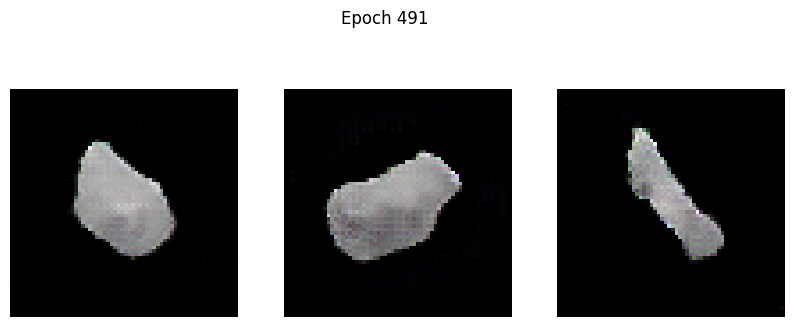

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -14.4812 - g_loss: 35.4223
Epoch 492/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -35.6305 - g_loss: 27.2679

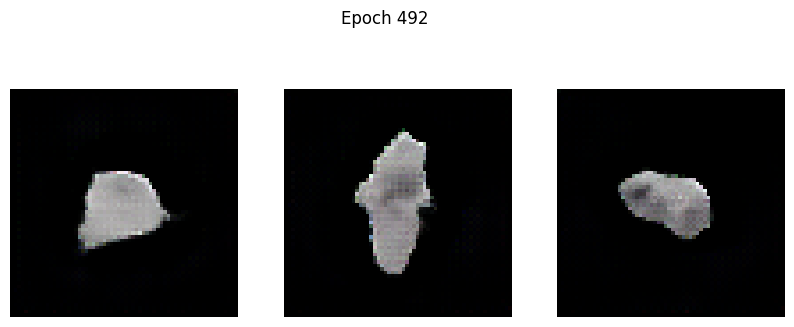

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -35.5613 - g_loss: 27.2452
Epoch 493/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -12.3497 - g_loss: 25.3620

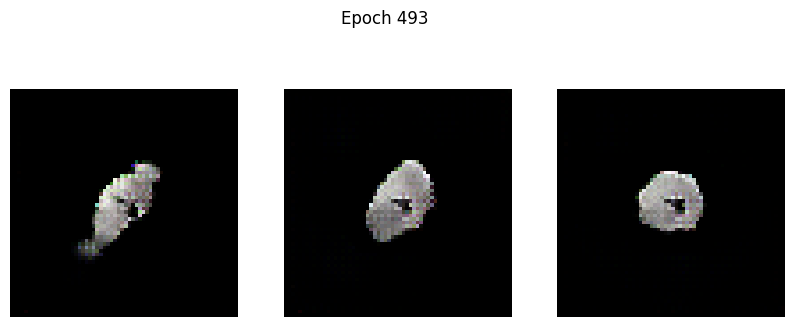

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -12.4025 - g_loss: 25.3997
Epoch 494/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -23.5234 - g_loss: 29.4033

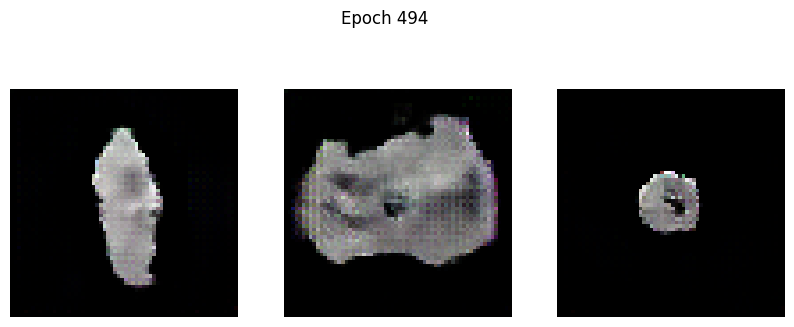

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -23.5547 - g_loss: 29.3508
Epoch 495/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -38.2536 - g_loss: 18.9211

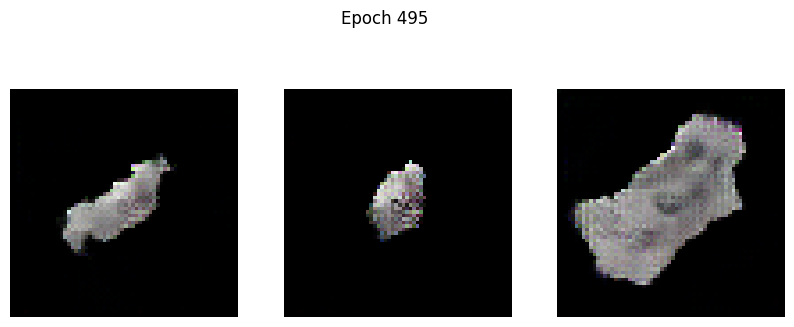

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -38.1717 - g_loss: 18.9325
Epoch 496/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -16.4421 - g_loss: 30.7088

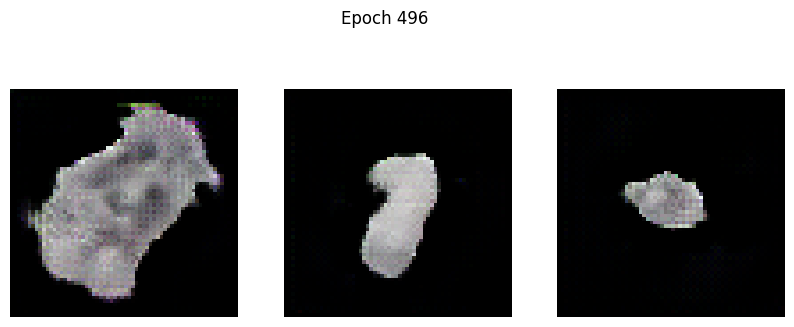

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -16.5548 - g_loss: 30.6659
Epoch 497/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -33.7711 - g_loss: 20.1215

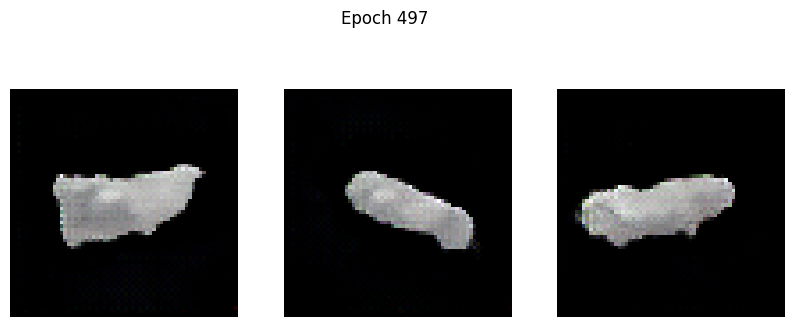

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -33.8099 - g_loss: 20.1397
Epoch 498/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -47.2462 - g_loss: 13.6905

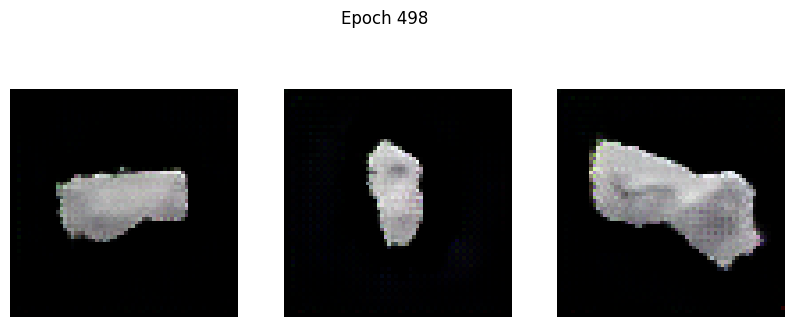

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -47.1466 - g_loss: 13.6986
Epoch 499/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -39.0810 - g_loss: 18.8577

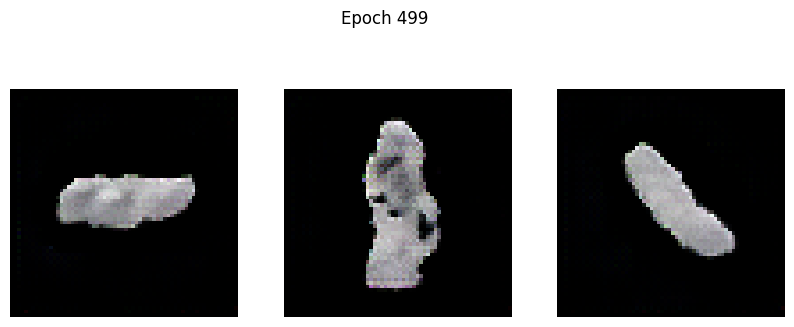

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -39.0464 - g_loss: 18.8856
Epoch 500/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -51.9511 - g_loss: 16.0739

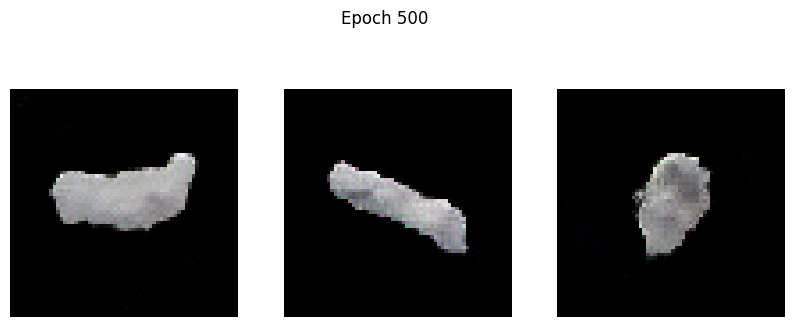

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -51.8659 - g_loss: 16.0886


In [8]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)